<h2>Package import</h2>

In [9]:
import pandas as pd
import pickle
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
from sklearn import ensemble, metrics
from sklearn.ensemble import RandomForestClassifier,BaggingClassifier
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from catboost import CatBoostClassifier
import xgboost as xgb
from sklearn.svm import LinearSVC
from sklearn.utils import check_random_state
import time
from sklearn.preprocessing import MinMaxScaler
import os
import json

<h2>Loading data</h2>

In [10]:
df = pd.read_excel('Dataset/DataSet_Long Method - Round 3.xlsx')

In [11]:
cleanup_nums = {"Final annotation":     {1: 1, 2: 1, 3: 1, 4: 1, 5: 1, 0: 0}}

df= df.replace(cleanup_nums)

In [12]:
df.set_index('Code Snippet ID')

,Link,Code Smell,Project Link,CYCLO,CYCLO_SWITCH,MLOC,MELOC,NOP,NOLV,NOTC,...,NOSL,NOMO,NOPE,NOLE,MMNB,NOUW,Final annotation,1,2,3
Code Snippet ID,,,,,,,,,,,,,,,,,,,,,
Aseprite.AsepriteFile.AsepriteFile(string),https://github.com/egordorichev/BurningKnight/...,Long Method,https://github.com/egordorichev/BurningKnight/...,5,5,37,27,1,20,0,...,0,19,4,0,4,0,1,2,2,2
"Aseprite.AsepriteFile.AsepriteFile(string, ContentBuildLogger)",https://github.com/egordorichev/BurningKnight/...,Long Method,https://github.com/egordorichev/BurningKnight/...,27,27,292,206,2,38,0,...,3,22,2,1,6,0,1,3,3,3
"Aseprite.AsepriteFile.ConvertBytesToPixels(byte[], Color[], Color[])",https://github.com/egordorichev/BurningKnight/...,Long Method,https://github.com/egordorichev/BurningKnight/...,8,8,25,21,3,5,0,...,0,21,4,0,3,16,1,1,2,2
"Aseprite.AsepriteImporter.Import(string, ContentImporterContext)",https://github.com/egordorichev/BurningKnight/...,Long Method,https://github.com/egordorichev/BurningKnight/...,1,1,3,1,2,0,0,...,0,0,0,0,0,5,0,0,0,0
"Aseprite.AsepriteProcessor.Process(Aseprite.AsepriteFile, ContentProcessorContext)",https://github.com/egordorichev/BurningKnight/...,Long Method,https://github.com/egordorichev/BurningKnight/...,1,1,6,4,2,0,0,...,0,0,0,0,0,6,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
osu.Game.Skinning.LegacySkin.GetSample(osu.Game.Audio.ISampleInfo),https://github.com/ppy/osu/tree/2cac373365309a...,Long Method,https://github.com/ppy/osu/tree/2cac373365309a...,4,4,21,14,1,2,0,...,0,0,0,0,1,18,0,/,0,0
osu.Game.Overlays.RankingsOverlay.LoadComplete(),https://github.com/ppy/osu/tree/2cac373365309a...,Long Method,https://github.com/ppy/osu/tree/2cac373365309a...,4,4,34,21,0,0,0,...,0,0,0,3,1,20,0,/,0,0
osu.Game.Skinning.LegacySkin.lookupForMania<TValue>(osu.Game.Skinning.LegacyManiaSkinConfigurationLookup),https://github.com/ppy/osu/tree/2cac373365309a...,Long Method,https://github.com/ppy/osu/tree/2cac373365309a...,41,7,133,93,1,0,0,...,9,7,0,0,0,74,1,/,1,1


In [13]:
df_train, df_test, y_train_full, y_test = train_test_split(df, df['Final annotation'],stratify=df['Final annotation'], test_size=0.20, random_state=42)

<h2>Data normalization</h2>

In [20]:
scaler = StandardScaler()

column_names = ['CYCLO','CYCLO_SWITCH','MLOC','MELOC','NOP','NOLV','NOTC','MNOL','MNOR','MNOC','MNOA','NONL','NOSL','NOMO','NOPE','NOLE','MMNB','NOUW']
features = df_train[column_names]


column_transformator = ColumnTransformer([('name', scaler, column_names)], remainder='passthrough')

scaled = column_transformator.fit(features)
init_x_train = scaled.transform(features)

test_features = df_test[column_names]

X_test= scaled.transform(test_features)

trainset_size = len(init_x_train)

<h2>Models definition</h2>

svi modeli implementiraju klasu Model koja se dalje koristi u algoritmu, i metodu koja vraca rezultat predvidjanja modela za dati ulazne parametre

In [21]:
class Model(object):

    def predict(self):
        pass


In [22]:
class RandomForestModel(Model):

    name = 'Random Forest'
    
    def predict(self, X_train, y_train, X_val, X_test):
        print ('training random forest...')
        self.model = RandomForestClassifier(n_estimators=314,random_state=42)
        self.model.fit(X_train, y_train)
        self.test_y_predicted = self.model.predict(X_test)
        self.val_y_predicted = self.model.predict(X_val)
        return (X_train, X_val, X_test, self.val_y_predicted, self.test_y_predicted)

In [23]:
class CatBoostModel(Model):

    name = 'CatBoost model'
    
    def predict(self, X_train, y_train, X_val, X_test):
        print ('training cat boost...')
        self.model = CatBoostClassifier(iterations=100, learning_rate=0.1)
        self.model.fit(X_train, y_train)
        self.test_y_predicted = self.model.predict(X_test)
        self.val_y_predicted = self.model.predict(X_val)
        return (X_train, X_val, X_test, self.val_y_predicted, self.test_y_predicted)

In [24]:
class XGBoostModel(Model):

    name = 'XGBooster model'
    
    def predict(self, X_train, y_train, X_val, X_test):
        print ('training xgboost...')
        self.model = xgb.XGBClassifier()
        self.model.fit(X_train, y_train)
        self.test_y_predicted = self.model.predict(X_test)
        self.val_y_predicted = self.model.predict(X_val)
        return (X_train, X_val, X_test, self.val_y_predicted, self.test_y_predicted)

In [25]:
class BaggingModel(Model):

    name = 'Bagging model'
    
    def predict(self, X_train, y_train, X_val, X_test):
        print ('training bagging model...')
        svm = LinearSVC(random_state=42, max_iter = 2000) #default je 1000 za max_iter, mozda treba vise
        self.model = BaggingClassifier(base_estimator=svm, n_estimators=100, random_state=42)
        self.model.fit(X_train, y_train)
        self.test_y_predicted = self.model.predict(X_test)
        self.val_y_predicted = self.model.predict(X_val)
        return (X_train, X_val, X_test, self.val_y_predicted, self.test_y_predicted)

Klasa TrainModel koristi gore definisane modele i za trening i vracanje preciznosti

In [26]:
class ModelTraining:

    def __init__(self, model_for_training):

        self.model_for_training = model_for_training()
        self.accuracies = []

    def print_name(self):
        print(self.model_for_training.name)

    def train(self, X_train, y_train, X_val, X_test):
        print('Train set:', X_train.shape, 'y:', y_train.shape)
        print('Val   set:', X_val.shape)
        print('Test  set:', X_test.shape)

        (X_train, X_val, X_test, self.val_y_predicted,
         self.test_y_predicted) = \
            self.model_for_training.predict(X_train, y_train, X_val, X_test)

        return (X_train, X_val, X_test)

    def get_accuracy_for_test(self, i, y_test):
        classified = np.mean(self.test_y_predicted.ravel() == y_test.ravel()) * 100
        self.accuracies.append(classified)
        print('-----------------------------------')
        print('In iteration: ', i)
        print("\nAccuracy for %f " % (classified))

<h2>Quering methods</h2>

metoda koja uzima nasumicne primere iz trening skupa

In [27]:
def get_n_random_samples(initial_labeled_samples, X_train_full,
                         y_train_full):
    random_state = check_random_state(0)
    permutation = np.random.choice(trainset_size,
                                   initial_labeled_samples,
                                   replace=False)

    X_train = X_train_full[permutation]
    y_train = y_train_full[permutation]
    X_train = X_train.reshape((X_train.shape[0], -1))
    bin_count = np.bincount(y_train.astype('int64'))
    unique = np.unique(y_train.astype('int64'))
    print (
        'initial train set:',
        X_train.shape,
        y_train.shape,
        'unique(labels):',
        bin_count,
        unique,
        )
    return (permutation, X_train, y_train)

In [28]:
class QueringMethod(object):

    def select(self):
        pass


In [29]:
class RandomQueringMethod(QueringMethod):

    @staticmethod
    def select_unlabeled_data(num_for_selection, probabilities):
        random_state = check_random_state(0)
        index_of_selected_data = np.random.choice(probabilities.shape[0], num_for_selection, replace=False)

        return index_of_selected_data

In [30]:
class LeastConfidenceQueringMethod(QueringMethod):

    @staticmethod
    def select_unlabeled_data(num_for_selection, probabilities):
        
        max_probability = []
        for ind, val in enumerate(probabilities):
            if val[0] > val[1]:
                max_probability.append(val[0])
            else:
                max_probability.append(val[1])

        values = [1 - p for p in max_probability]

        sorted_probs = np.argsort(values)[::-1]
        index_of_selected_data = sorted_probs[:num_for_selection]

# #         print("verovatnoce: ")
#         print(probabilities)
#         values = 1 - probabilities
#         lst2 = [item[0] for item in probabilities]
# #         print("izracunate vrednosti")
#         print(values)
#         nesto = np.argsort(lst2)

#         nesto2 = nesto[:num_for_selection]
#         selection = (np.argsort(values)[::-1])[:num_for_selection]
# #         print("sta je selektovano:")
# #         print(selection)
#         return nesto2
#         values = 1 - probabilities
#         probs_list = [item[0] for item in values]
#         sorted_probs = np.argsort(probs_list)
#         index_of_selected_data = sorted_probs[:num_for_selection]

        return index_of_selected_data

In [31]:
class EntropyQueringMethod(QueringMethod):

    @staticmethod
    def select_unlabeled_data(num_for_selection, probabilities):
        print("verovatnoce: ")
        print(probabilities)
        e = (-probabilities * np.log2(probabilities)).sum(axis=1)
        print("izracunato: ")
        print(e)
        selection = (np.argsort(e)[::-1])[:num_for_selection]
        print("sta je selektovano:")
        print(selection)
        return selection

In [32]:
class MarginSamplingQueringMethod(QueringMethod):

    @staticmethod
    def select_unlabeled_data(num_for_selection, probabilities):
        rev = np.sort(probabilities, axis=1)[:, ::-1]
        values = rev[:, 0] - rev[:, 1]
        selection = np.argsort(values)[:num_for_selection]
        return selection

<h2>Active learning</h2>

algoritam aktivnog ucenja

In [33]:
class ActiveLearningAlgorithm(object):
    accuracies = []

    def __init__(self, initial_labeled_samples, model_object, quering_method):
        self.initial_labeled_samples = initial_labeled_samples #broj redova koji uzimamo iz trening skupa
        self.model_object = model_object #model koji se obucava
        self.quering_method = quering_method #metoda koja vrsi odabir neoznacenih podataka

    def start(self, init_x_train, y_train_full, X_test, y_test):

        #pre pocetka obuke se uzimaju nasumicni podaci za obuku
        while True:
            try:
                (permutation, X_train, y_train) = \
                    get_n_random_samples(self.initial_labeled_samples,
                                         init_x_train, y_train_full)
                #                 print("nema greske pri izboru")
                break
            except:
                pass
        #                 print("greska pri izboru")

        self.queried = self.initial_labeled_samples
        self.samplecount = [self.initial_labeled_samples]


        #postavljamo pocetne promenljive sa validacioni, trening i test skup
        X_val = np.array([])
        y_val = np.array([])
        X_val = np.copy(init_x_train)
        X_val = np.delete(X_val, permutation, axis=0)
        y_val = np.copy(y_train_full)
        y_val = np.delete(y_val, permutation, axis=0)


        #model se trenira na pocetnim nasumicno odabranim podacima
        self.clf_model = ModelTraining(self.model_object)
        (X_train, X_val, X_test) = self.clf_model.train(X_train, y_train, X_val, X_test)
        active_iteration = 1#broj iteracije
        self.clf_model.get_accuracy_for_test(1, y_test)

        #petlja obuke modela, petlja traje dok se ne dodje do max broja odabranih neoznacenih podataka
        while self.queried < max_queried:
            active_iteration += 1

            #vrsi se predvidjanje nad obucenim modelom
            probas_val = \
                self.clf_model.model_for_training.model.predict_proba(X_val)

            #vrsi se odabir dodatnih podataka iz skupa neoznacenih podataka
            #NAPOMENA: ovde je skup neoznacenih podataka zapravo ne postoji, nego se pretvaramo da su podaci neoznaceni
            uncertain_samples = \
                self.quering_method.select_unlabeled_data(self.initial_labeled_samples, probas_val)


            #dodajemo odabrane podatke na skup za trening modela
            X_train = np.concatenate((X_train, X_val[uncertain_samples]))
            y_train = np.concatenate((y_train, y_val[uncertain_samples]))

            self.samplecount.append(X_train.shape[0])

            bin_count = np.bincount(y_train.astype('int64'))
            unique = np.unique(y_train.astype('int64'))
            print(
                'updated train set:',
                X_train.shape,
                y_train.shape,
                'unique(labels):',
                bin_count,
                unique,
            )

            #uklanjamo podatke tako da ne budu odabrani ponovo
            X_val = np.delete(X_val, uncertain_samples, axis=0)
            y_val = np.delete(y_val, uncertain_samples, axis=0)


            #model se ponovo trenira i testira
            self.queried += self.initial_labeled_samples
            (X_train, X_val, X_test) = self.clf_model.train(X_train, y_train, X_val, X_test)
            self.clf_model.get_accuracy_for_test(active_iteration, y_test)

        print('final active learning accuracies',
              self.clf_model.accuracies)

<h2>Experiments</h2>

In [34]:
def save_model(fname, data):
    filehandler = open(fname, "wb")
    pickle.dump(data, filehandler)
    filehandler.close()
    print('saved', fname, os.getcwd(), os.listdir())

def load_model(fname):
    print(os.getcwd(), os.listdir())
    file = open(fname, 'rb')
    data = pickle.load(file)
    file.close()
    print(data)
    return data
  
def experiment(d, models, quering_methods, Ks, repeats, contfrom):
    algos_temp = []
    print('stopping at:', max_queried)
    count = 0
    for model_object in models:
        if model_object.__name__ not in d:
            d[model_object.__name__] = {}

        for quering_method in quering_methods:
            if quering_method.__name__ not in d[model_object.__name__]:
                d[model_object.__name__][quering_method.__name__] = {}

            for k in Ks:
                d[model_object.__name__][quering_method.__name__][str(k)] = []

                for i in range(0, repeats):
                    count += 1
                    if count >= contfrom:
                        print('Count = %s, using model = %s, quering_method = %s, k = %s, iteration = %s.' % (
                        count, model_object.__name__, quering_method.__name__, k, i))
                        alg = ActiveLearningAlgorithm(k,
                                             model_object,
                                             quering_method
                                             )
                        alg.start(init_x_train, y_train_full, X_test, y_test)
                        d[model_object.__name__][quering_method.__name__][str(k)].append(alg.clf_model.accuracies)

                        fname = 'Active-learning-experiment-' + str(count) + '.pkl'
                        save_model(fname, d)
                        if count % 5 == 0:
                            print(json.dumps(d, indent=2, sort_keys=True))
                        print()
                        print('---------------------------- FINISHED ---------------------------')
                        print()
    return d

In [37]:
def plot_results(fully_supervised_accuracy, dic, models, quering_methods, Ks, repeats):  
    fig, ax = plt.subplots()
    ax.plot([0,1000],[fully_supervised_accuracy, fully_supervised_accuracy],label = 'algorithm-upper-bound')
    for model_object in models:
        for quering_method in quering_methods:
            for idx, k in enumerate(Ks):
                x = np.arange(float(Ks[idx]), 1000 + float(Ks[idx]), float(Ks[idx]))            
                Sum = np.array(dic[model_object][quering_method][k][0])
                for i in range(1, repeats):
                    Sum = Sum + np.array(dic[model_object][quering_method][k][i])
                mean = Sum / repeats
                ax.plot(x, mean ,label = model_object + '-' + quering_method + '-' + str(k))
    ax.legend()
    ax.set_xlim([50,1000])
    ax.set_ylim([40,100])
    ax.grid(True)
    plt.show()

<h2>Random forest experiments</h2>

In [36]:
max_queried = 1000

repeats = 1


    #experiment
models = [RandomForestModel]

   
    # quering_methods = [RandomQueringMethod,MarginSamplingQueringMethod,EntropyQueringMethod]
quering_methods = [ RandomQueringMethod, MarginSamplingQueringMethod, EntropyQueringMethod, LeastConfidenceQueringMethod]  # LeastConfidenceQueringMethod

# Ks = [10]

Ks = [10,25,50]

d = {}
stopped_at = -1

    # print('directory dump including pickle files:', os.getcwd(), np.sort(os.listdir()))
    # d = load_model('Active-learning-experiment-' + str(stopped_at) + '.pkl')
    # print(json.dumps(d, indent=2, sort_keys=True))

d = experiment(d, models, quering_methods, Ks, repeats, stopped_at + 1)
print(d)
results = json.loads(json.dumps(d, indent=2, sort_keys=True))
print(results)

stopping at: 1000
Count = 1, using model = RandomForestModel, quering_method = RandomQueringMethod, k = 10, iteration = 0.
initial train set: (10, 18) (10,) unique(labels): [8 2] [0 1]
Train set: (10, 18) y: (10,)
Val   set: (2049, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  1

Accuracy for 74.951456 
updated train set: (20, 18) (20,) unique(labels): [16  4] [0 1]
Train set: (20, 18) y: (20,)
Val   set: (2039, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  2

Accuracy for 83.106796 
updated train set: (30, 18) (30,) unique(labels): [21  9] [0 1]
Train set: (30, 18) y: (30,)
Val   set: (2029, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  3

Accuracy for 89.902913 
updated train set: (40, 18) (40,) unique(labels): [27 13] [0 1]
Train set: (40, 18) y: (40,)
Val   set: (2019, 18)
Test  set: (515, 18)
training random forest.

-----------------------------------
In iteration:  34

Accuracy for 93.980583 
updated train set: (350, 18) (350,) unique(labels): [256  94] [0 1]
Train set: (350, 18) y: (350,)
Val   set: (1709, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  35

Accuracy for 93.592233 
updated train set: (360, 18) (360,) unique(labels): [263  97] [0 1]
Train set: (360, 18) y: (360,)
Val   set: (1699, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  36

Accuracy for 93.009709 
updated train set: (370, 18) (370,) unique(labels): [269 101] [0 1]
Train set: (370, 18) y: (370,)
Val   set: (1689, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  37

Accuracy for 93.203883 
updated train set: (380, 18) (380,) unique(labels): [276 104] [0 1]
Train set: (380, 18) y: (380,)
Val   set: (1679, 18)
Test  set: (515, 18)
training random forest...
------------

-----------------------------------
In iteration:  68

Accuracy for 92.815534 
updated train set: (690, 18) (690,) unique(labels): [507 183] [0 1]
Train set: (690, 18) y: (690,)
Val   set: (1369, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  69

Accuracy for 92.427184 
updated train set: (700, 18) (700,) unique(labels): [514 186] [0 1]
Train set: (700, 18) y: (700,)
Val   set: (1359, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  70

Accuracy for 92.621359 
updated train set: (710, 18) (710,) unique(labels): [520 190] [0 1]
Train set: (710, 18) y: (710,)
Val   set: (1349, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  71

Accuracy for 92.621359 
updated train set: (720, 18) (720,) unique(labels): [529 191] [0 1]
Train set: (720, 18) y: (720,)
Val   set: (1339, 18)
Test  set: (515, 18)
training random forest...
------------

initial train set: (25, 18) (25,) unique(labels): [18  7] [0 1]
Train set: (25, 18) y: (25,)
Val   set: (2034, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  1

Accuracy for 67.184466 
updated train set: (50, 18) (50,) unique(labels): [38 12] [0 1]
Train set: (50, 18) y: (50,)
Val   set: (2009, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  2

Accuracy for 81.747573 
updated train set: (75, 18) (75,) unique(labels): [57 18] [0 1]
Train set: (75, 18) y: (75,)
Val   set: (1984, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  3

Accuracy for 86.407767 
updated train set: (100, 18) (100,) unique(labels): [76 24] [0 1]
Train set: (100, 18) y: (100,)
Val   set: (1959, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  4

Accuracy for 89.126214 
updated train set: (125, 18) (125,) 

-----------------------------------
In iteration:  34

Accuracy for 94.757282 
updated train set: (875, 18) (875,) unique(labels): [651 224] [0 1]
Train set: (875, 18) y: (875,)
Val   set: (1184, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  35

Accuracy for 93.592233 
updated train set: (900, 18) (900,) unique(labels): [674 226] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  36

Accuracy for 93.786408 
updated train set: (925, 18) (925,) unique(labels): [695 230] [0 1]
Train set: (925, 18) y: (925,)
Val   set: (1134, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  37

Accuracy for 93.786408 
updated train set: (950, 18) (950,) unique(labels): [716 234] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training random forest...
------------

-----------------------------------
In iteration:  1

Accuracy for 39.805825 
updated train set: (20, 18) (20,) unique(labels): [16  4] [0 1]
Train set: (20, 18) y: (20,)
Val   set: (2039, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  2

Accuracy for 59.029126 
updated train set: (30, 18) (30,) unique(labels): [25  5] [0 1]
Train set: (30, 18) y: (30,)
Val   set: (2029, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  3

Accuracy for 71.067961 
updated train set: (40, 18) (40,) unique(labels): [35  5] [0 1]
Train set: (40, 18) y: (40,)
Val   set: (2019, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  4

Accuracy for 74.368932 
updated train set: (50, 18) (50,) unique(labels): [40 10] [0 1]
Train set: (50, 18) y: (50,)
Val   set: (2009, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In i

-----------------------------------
In iteration:  35

Accuracy for 94.563107 
updated train set: (360, 18) (360,) unique(labels): [188 172] [0 1]
Train set: (360, 18) y: (360,)
Val   set: (1699, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  36

Accuracy for 93.786408 
updated train set: (370, 18) (370,) unique(labels): [190 180] [0 1]
Train set: (370, 18) y: (370,)
Val   set: (1689, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  37

Accuracy for 94.368932 
updated train set: (380, 18) (380,) unique(labels): [199 181] [0 1]
Train set: (380, 18) y: (380,)
Val   set: (1679, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  38

Accuracy for 93.592233 
updated train set: (390, 18) (390,) unique(labels): [203 187] [0 1]
Train set: (390, 18) y: (390,)
Val   set: (1669, 18)
Test  set: (515, 18)
training random forest...
------------

-----------------------------------
In iteration:  69

Accuracy for 94.563107 
updated train set: (700, 18) (700,) unique(labels): [377 323] [0 1]
Train set: (700, 18) y: (700,)
Val   set: (1359, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  70

Accuracy for 94.368932 
updated train set: (710, 18) (710,) unique(labels): [384 326] [0 1]
Train set: (710, 18) y: (710,)
Val   set: (1349, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  71

Accuracy for 94.563107 
updated train set: (720, 18) (720,) unique(labels): [392 328] [0 1]
Train set: (720, 18) y: (720,)
Val   set: (1339, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  72

Accuracy for 94.368932 
updated train set: (730, 18) (730,) unique(labels): [400 330] [0 1]
Train set: (730, 18) y: (730,)
Val   set: (1329, 18)
Test  set: (515, 18)
training random forest...
------------

-----------------------------------
In iteration:  1

Accuracy for 69.514563 
updated train set: (50, 18) (50,) unique(labels): [34 16] [0 1]
Train set: (50, 18) y: (50,)
Val   set: (2009, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  2

Accuracy for 87.961165 
updated train set: (75, 18) (75,) unique(labels): [51 24] [0 1]
Train set: (75, 18) y: (75,)
Val   set: (1984, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  3

Accuracy for 91.067961 
updated train set: (100, 18) (100,) unique(labels): [61 39] [0 1]
Train set: (100, 18) y: (100,)
Val   set: (1959, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  4

Accuracy for 91.650485 
updated train set: (125, 18) (125,) unique(labels): [68 57] [0 1]
Train set: (125, 18) y: (125,)
Val   set: (1934, 18)
Test  set: (515, 18)
training random forest...
--------------------------------

-----------------------------------
In iteration:  35

Accuracy for 93.592233 
updated train set: (900, 18) (900,) unique(labels): [525 375] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  36

Accuracy for 94.174757 
updated train set: (925, 18) (925,) unique(labels): [546 379] [0 1]
Train set: (925, 18) y: (925,)
Val   set: (1134, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  37

Accuracy for 94.368932 
updated train set: (950, 18) (950,) unique(labels): [552 398] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  38

Accuracy for 94.757282 
updated train set: (975, 18) (975,) unique(labels): [574 401] [0 1]
Train set: (975, 18) y: (975,)
Val   set: (1084, 18)
Test  set: (515, 18)
training random forest...
------------

initial train set: (50, 18) (50,) unique(labels): [41  9] [0 1]
Train set: (50, 18) y: (50,)
Val   set: (2009, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  1

Accuracy for 78.058252 
updated train set: (100, 18) (100,) unique(labels): [55 45] [0 1]
Train set: (100, 18) y: (100,)
Val   set: (1959, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  2

Accuracy for 89.902913 
updated train set: (150, 18) (150,) unique(labels): [65 85] [0 1]
Train set: (150, 18) y: (150,)
Val   set: (1909, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  3

Accuracy for 91.456311 
updated train set: (200, 18) (200,) unique(labels): [ 85 115] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  4

Accuracy for 93.203883 
updated train set: (250, 1

C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  2

Accuracy for 75.339806 
verovatnoce: 
[[1.        0.       ]
 [1.        0.       ]
 [1.        0.       ]
 ...
 [0.9522293 0.0477707]
 [1.        0.       ]
 [1.        0.       ]]
izracunato: 
[      nan       nan       nan ... 0.2768505       nan       nan]
sta je selektovano:
[2038  924  895  902  912  915  918  920  921  923]
updated train set: (30, 18) (30,) unique(labels): [29  1] [0 1]
Train set: (30, 18) y: (30,)
Val   set: (2029, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  3

Accuracy for 75.339806 
verovatnoce: 
[[1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 ...
 [0.99363057 0.00636943]
 [0.95541401 0.04458599]
 [1.         0.        ]]
izracunato: 
[       nan        nan        nan ... 0.05562237 0.26293739        nan]
sta je selektovano:
[2028  925  876  877  884  885  888  893  917  923]
updated train set: (40, 18) (40,) unique(labels): [39  1] [0 1]
Train set: (40, 18) y: (40,)
Val   set: (2019, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  4

Accuracy for 74.951456 
verovatnoce: 
[[1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 ...
 [0.90764331 0.09235669]
 [0.99681529 0.00318471]
 [0.95859873 0.04140127]]
izracunato: 
[       nan        nan        nan ... 0.4442876  0.03100324 0.2486805 ]
sta je selektovano:
[1009  862  849  850  853  855  856  858  859  860]
updated train set: (50, 18) (50,) unique(labels): [48  2] [0 1]
Train set: (50, 18) y: (50,)
Val   set: (2009, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  5

Accuracy for 76.699029 
verovatnoce: 
[[1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 ...
 [0.67197452 0.32802548]
 [0.94267516 0.05732484]
 [0.96815287 0.03184713]]
izracunato: 
[       nan        nan        nan ... 0.91289628 0.3167327  0.2035722 ]
sta je selektovano:
[   0  508 1408  487  489 1403  491  492 1399 1396]
updated train set: (60, 18) (60,) unique(labels): [58  2] [0 1]
Train set: (60, 18) y: (60,)
Val   set: (1999, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  6

Accuracy for 76.504854 
verovatnoce: 
[[1.         0.        ]
 [1.         0.        ]
 [0.89808917 0.10191083]
 ...
 [0.68789809 0.31210191]
 [0.93949045 0.06050955]
 [0.96178344 0.03821656]]
izracunato: 
[       nan        nan 0.47502367 ... 0.89558487 0.32946435 0.23405457]
sta je selektovano:
[ 999 1045 1043 1041 1037 1033 1032 1031 1029 1027]
updated train set: (70, 18) (70,) unique(labels): [68  2] [0 1]
Train set: (70, 18) y: (70,)
Val   set: (1989, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  7

Accuracy for 76.504854 
verovatnoce: 
[[1.         0.        ]
 [1.         0.        ]
 [0.91401274 0.08598726]
 ...
 [0.67834395 0.32165605]
 [0.94904459 0.05095541]
 [0.97133758 0.02866242]]
izracunato: 
[       nan        nan 0.42293205 ... 0.90617327 0.29044171 0.18763896]
sta je selektovano:
[   0 1106 1147 1146 1145 1143 1142 1140 1138 1137]
updated train set: (80, 18) (80,) unique(labels): [78  2] [0 1]
Train set: (80, 18) y: (80,)
Val   set: (1979, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  8

Accuracy for 76.699029 
verovatnoce: 
[[1.         0.        ]
 [0.91401274 0.08598726]
 [1.         0.        ]
 ...
 [0.67197452 0.32802548]
 [0.94904459 0.05095541]
 [0.97452229 0.02547771]]
izracunato: 
[       nan 0.42293205        nan ... 0.91289628 0.29044171 0.17117909]
sta je selektovano:
[   0 1103 1101 1098 1097 1096 1094 1093  174 1091]
updated train set: (90, 18) (90,) unique(labels): [88  2] [0 1]
Train set: (90, 18) y: (90,)
Val   set: (1969, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  9

Accuracy for 76.699029 
verovatnoce: 
[[0.92356688 0.07643312]
 [1.         0.        ]
 [0.98407643 0.01592357]
 ...
 [0.67834395 0.32165605]
 [0.9522293  0.0477707 ]
 [0.97133758 0.02866242]]
izracunato: 
[0.38948465        nan 0.11789554 ... 0.90617327 0.2768505  0.18763896]
sta je selektovano:
[ 984 1241 1237  330 1235  333 1231 1230 1229  334]
updated train set: (100, 18) (100,) unique(labels): [98  2] [0 1]
Train set: (100, 18) y: (100,)
Val   set: (1959, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  10

Accuracy for 76.699029 
verovatnoce: 
[[0.92356688 0.07643312]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.66878981 0.33121019]
 [0.9522293  0.0477707 ]
 [0.97452229 0.02547771]]
izracunato: 
[0.38948465        nan 0.09844697 ... 0.91615804 0.2768505  0.17117909]
sta je selektovano:
[ 626  428 1462 1461  429  213 1458  983  984  985]
updated train set: (110, 18) (110,) unique(labels): [108   2] [0 1]
Train set: (110, 18) y: (110,)
Val   set: (1949, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  11

Accuracy for 76.504854 
verovatnoce: 
[[0.92038217 0.07961783]
 [1.         0.        ]
 [0.98407643 0.01592357]
 ...
 [0.67515924 0.32484076]
 [0.9522293  0.0477707 ]
 [0.97133758 0.02866242]]
izracunato: 
[0.40083117        nan 0.11789554 ... 0.90956813 0.2768505  0.18763896]
sta je selektovano:
[ 974  349  325 1232  328  331 1223  333  334 1217]
updated train set: (120, 18) (120,) unique(labels): [118   2] [0 1]
Train set: (120, 18) y: (120,)
Val   set: (1939, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  12

Accuracy for 76.699029 
verovatnoce: 
[[0.92356688 0.07643312]
 [1.         0.        ]
 [0.98407643 0.01592357]
 ...
 [0.68152866 0.31847134]
 [0.95541401 0.04458599]
 [0.96815287 0.03184713]]
izracunato: 
[0.38948465        nan 0.11789554 ... 0.90271134 0.26293739 0.2035722 ]
sta je selektovano:
[1185 1147  217 1140  218 1136 1135 1132 1128 1126]
updated train set: (130, 18) (130,) unique(labels): [128   2] [0 1]
Train set: (130, 18) y: (130,)
Val   set: (1929, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  13

Accuracy for 75.922330 
verovatnoce: 
[[0.93312102 0.06687898]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.74203822 0.25796178]
 [0.95541401 0.04458599]
 [0.96178344 0.03821656]]
izracunato: 
[0.35416717        nan 0.09844697 ... 0.82365507 0.26293739 0.23405457]
sta je selektovano:
[1396 1468 1093 1095  397 1473 1097 1471  572 1469]
updated train set: (140, 18) (140,) unique(labels): [138   2] [0 1]
Train set: (140, 18) y: (140,)
Val   set: (1919, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  14

Accuracy for 75.922330 
verovatnoce: 
[[0.93949045 0.06050955]
 [1.         0.        ]
 [0.98407643 0.01592357]
 ...
 [0.74522293 0.25477707]
 [0.9522293  0.0477707 ]
 [0.96178344 0.03821656]]
izracunato: 
[0.32946435        nan 0.11789554 ... 0.81876218 0.2768505  0.23405457]
sta je selektovano:
[ 959 1174  289 1194 1192 1190 1188  291  292 1181]
updated train set: (150, 18) (150,) unique(labels): [148   2] [0 1]
Train set: (150, 18) y: (150,)
Val   set: (1909, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  15

Accuracy for 75.922330 
verovatnoce: 
[[0.93949045 0.06050955]
 [1.         0.        ]
 [0.98089172 0.01910828]
 ...
 [0.75159236 0.24840764]
 [0.9522293  0.0477707 ]
 [0.96178344 0.03821656]]
izracunato: 
[0.32946435        nan 0.13640409 ... 0.80874453 0.2768505  0.23405457]
sta je selektovano:
[ 180 1328  739 1324  742  477 1320 1318  747 1315]
updated train set: (160, 18) (160,) unique(labels): [158   2] [0 1]
Train set: (160, 18) y: (160,)
Val   set: (1899, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  16

Accuracy for 75.922330 
verovatnoce: 
[[0.94585987 0.05414013]
 [1.         0.        ]
 [0.98407643 0.01592357]
 ...
 [0.75477707 0.24522293]
 [0.95541401 0.04458599]
 [0.96178344 0.03821656]]
izracunato: 
[0.30373015        nan 0.11789554 ... 0.80361848 0.26293739 0.23405457]
sta je selektovano:
[1224 1154  274  277  278  279 1168 1166 1165 1164]
updated train set: (170, 18) (170,) unique(labels): [168   2] [0 1]
Train set: (170, 18) y: (170,)
Val   set: (1889, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  17

Accuracy for 75.922330 
verovatnoce: 
[[0.94585987 0.05414013]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.75477707 0.24522293]
 [0.95541401 0.04458599]
 [0.96178344 0.03821656]]
izracunato: 
[0.30373015        nan 0.09844697 ... 0.80361848 0.26293739 0.23405457]
sta je selektovano:
[ 944 1125  265  269 1146  273 1143 1142 1136 1134]
updated train set: (180, 18) (180,) unique(labels): [178   2] [0 1]
Train set: (180, 18) y: (180,)
Val   set: (1879, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  18

Accuracy for 75.922330 
verovatnoce: 
[[0.94267516 0.05732484]
 [1.         0.        ]
 [0.99044586 0.00955414]
 ...
 [0.75796178 0.24203822]
 [0.9522293  0.0477707 ]
 [0.96496815 0.03503185]]
izracunato: 
[0.3167327         nan 0.07782267 ... 0.79841336 0.2768505  0.2190301 ]
sta je selektovano:
[ 939 1101  258 1143 1141  264  278 1126  280 1121]
updated train set: (190, 18) (190,) unique(labels): [188   2] [0 1]
Train set: (190, 18) y: (190,)
Val   set: (1869, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  19

Accuracy for 75.922330 
verovatnoce: 
[[0.94585987 0.05414013]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.75796178 0.24203822]
 [0.9522293  0.0477707 ]
 [0.96178344 0.03821656]]
izracunato: 
[0.30373015        nan 0.09844697 ... 0.79841336 0.2768505  0.23405457]
sta je selektovano:
[1187 1368 1365 1364  152 1362  374  811  154  812]
updated train set: (200, 18) (200,) unique(labels): [198   2] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  20

Accuracy for 75.922330 
verovatnoce: 
[[0.94585987 0.05414013]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.75796178 0.24203822]
 [0.95541401 0.04458599]
 [0.96178344 0.03821656]]
izracunato: 
[0.30373015        nan 0.09844697 ... 0.79841336 0.26293739 0.23405457]
sta je selektovano:
[1184  280  250  251  253  254 1106 1104 1099  278]
updated train set: (210, 18) (210,) unique(labels): [208   2] [0 1]
Train set: (210, 18) y: (210,)
Val   set: (1849, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  21

Accuracy for 75.922330 
verovatnoce: 
[[0.94904459 0.05095541]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.76433121 0.23566879]
 [0.95859873 0.04140127]
 [0.95859873 0.04140127]]
izracunato: 
[0.29044171        nan 0.09844697 ... 0.78776313 0.2486805  0.2486805 ]
sta je selektovano:
[1472 1365  821  999 1371 1370 1369 1368 1367 1366]
updated train set: (220, 18) (220,) unique(labels): [218   2] [0 1]
Train set: (220, 18) y: (220,)
Val   set: (1839, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  22

Accuracy for 75.922330 
verovatnoce: 
[[0.94585987 0.05414013]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.7611465  0.2388535 ]
 [0.95541401 0.04458599]
 [0.96178344 0.03821656]]
izracunato: 
[0.30373015        nan 0.09844697 ... 0.79312849 0.26293739 0.23405457]
sta je selektovano:
[ 395 1200  170 1149  171  172  173  176  181  463]
updated train set: (230, 18) (230,) unique(labels): [228   2] [0 1]
Train set: (230, 18) y: (230,)
Val   set: (1829, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  23

Accuracy for 75.922330 
verovatnoce: 
[[0.94585987 0.05414013]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.76433121 0.23566879]
 [0.95541401 0.04458599]
 [0.96178344 0.03821656]]
izracunato: 
[0.30373015        nan 0.09844697 ... 0.78776313 0.26293739 0.23405457]
sta je selektovano:
[ 226 1412  240 1106  268  269  270  271  274  276]
updated train set: (240, 18) (240,) unique(labels): [238   2] [0 1]
Train set: (240, 18) y: (240,)
Val   set: (1819, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  24

Accuracy for 75.922330 
verovatnoce: 
[[0.94585987 0.05414013]
 [1.         0.        ]
 [0.99044586 0.00955414]
 ...
 [0.76751592 0.23248408]
 [0.95541401 0.04458599]
 [0.96178344 0.03821656]]
izracunato: 
[0.30373015        nan 0.07782267 ... 0.78231654 0.26293739 0.23405457]
sta je selektovano:
[1326  371 1369  994  995  638  788  639 1363  787]
updated train set: (250, 18) (250,) unique(labels): [248   2] [0 1]
Train set: (250, 18) y: (250,)
Val   set: (1809, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  25

Accuracy for 75.922330 
verovatnoce: 
[[0.94585987 0.05414013]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.76433121 0.23566879]
 [0.95541401 0.04458599]
 [0.96178344 0.03821656]]
izracunato: 
[0.30373015        nan 0.09844697 ... 0.78776313 0.26293739 0.23405457]
sta je selektovano:
[ 222 1056  232  233 1130  237  238  270  272  274]
updated train set: (260, 18) (260,) unique(labels): [258   2] [0 1]
Train set: (260, 18) y: (260,)
Val   set: (1799, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  26

Accuracy for 75.922330 
verovatnoce: 
[[0.94585987 0.05414013]
 [1.         0.        ]
 [0.99681529 0.00318471]
 ...
 [0.75477707 0.24522293]
 [0.94904459 0.05095541]
 [0.96815287 0.03184713]]
izracunato: 
[0.30373015        nan 0.03100324 ... 0.80361848 0.29044171 0.2035722 ]
sta je selektovano:
[1133  135 1247  134 1244 1243 1242 1240 1238  635]
updated train set: (270, 18) (270,) unique(labels): [268   2] [0 1]
Train set: (270, 18) y: (270,)
Val   set: (1789, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  27

Accuracy for 75.922330 
verovatnoce: 
[[0.94585987 0.05414013]
 [1.         0.        ]
 [0.99681529 0.00318471]
 ...
 [0.7611465  0.2388535 ]
 [0.9522293  0.0477707 ]
 [0.96815287 0.03184713]]
izracunato: 
[0.30373015        nan 0.03100324 ... 0.79312849 0.2768505  0.2035722 ]
sta je selektovano:
[ 894 1013 1029 1028  269 1026 1024 1021 1019 1018]
updated train set: (280, 18) (280,) unique(labels): [277   3] [0 1]
Train set: (280, 18) y: (280,)
Val   set: (1779, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  28

Accuracy for 77.281553 
verovatnoce: 
[[0.8566879  0.1433121 ]
 [1.         0.        ]
 [0.98407643 0.01592357]
 ...
 [0.7133758  0.2866242 ]
 [0.92356688 0.07643312]
 [0.93949045 0.06050955]]
izracunato: 
[0.59284761        nan 0.11789554 ... 0.86432049 0.38948465 0.32946435]
sta je selektovano:
[ 347 1396 1398 1399  563 1402 1404 1405 1407 1033]
updated train set: (290, 18) (290,) unique(labels): [287   3] [0 1]
Train set: (290, 18) y: (290,)
Val   set: (1769, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  29

Accuracy for 77.281553 
verovatnoce: 
[[0.8566879  0.1433121 ]
 [1.         0.        ]
 [0.98407643 0.01592357]
 ...
 [0.71019108 0.28980892]
 [0.92038217 0.07961783]
 [0.93312102 0.06687898]]
izracunato: 
[0.59284761        nan 0.11789554 ... 0.86847428 0.40083117 0.35416717]
sta je selektovano:
[ 436  389 1313 1311  620  185 1308  186 1305  851]
updated train set: (300, 18) (300,) unique(labels): [297   3] [0 1]
Train set: (300, 18) y: (300,)
Val   set: (1759, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  30

Accuracy for 77.087379 
verovatnoce: 
[[0.85987261 0.14012739]
 [1.         0.        ]
 [0.98407643 0.01592357]
 ...
 [0.7133758  0.2866242 ]
 [0.92356688 0.07643312]
 [0.93949045 0.06050955]]
izracunato: 
[0.58457233        nan 0.11789554 ... 0.86432049 0.38948465 0.32946435]
sta je selektovano:
[1255  350  360 1237  362  363 1234  365 1231  373]
updated train set: (310, 18) (310,) unique(labels): [307   3] [0 1]
Train set: (310, 18) y: (310,)
Val   set: (1749, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  31

Accuracy for 77.087379 
verovatnoce: 
[[0.8566879  0.1433121 ]
 [1.         0.        ]
 [0.98407643 0.01592357]
 ...
 [0.71019108 0.28980892]
 [0.91719745 0.08280255]
 [0.93630573 0.06369427]]
izracunato: 
[0.59284761        nan 0.11789554 ... 0.86847428 0.41197797 0.34193848]
sta je selektovano:
[ 333  710 1245  714  331 1241  332  713  725  334]
updated train set: (320, 18) (320,) unique(labels): [317   3] [0 1]
Train set: (320, 18) y: (320,)
Val   set: (1739, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  32

Accuracy for 77.087379 
verovatnoce: 
[[0.85031847 0.14968153]
 [1.         0.        ]
 [0.98089172 0.01910828]
 ...
 [0.7133758  0.2866242 ]
 [0.92038217 0.07961783]
 [0.93630573 0.06369427]]
izracunato: 
[0.60904276        nan 0.13640409 ... 0.86432049 0.40083117 0.34193848]
sta je selektovano:
[ 987 1092 1090 1416  223  221 1419  540  541  543]
updated train set: (330, 18) (330,) unique(labels): [327   3] [0 1]
Train set: (330, 18) y: (330,)
Val   set: (1729, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  33

Accuracy for 77.087379 
verovatnoce: 
[[0.8566879  0.1433121 ]
 [1.         0.        ]
 [0.98407643 0.01592357]
 ...
 [0.71019108 0.28980892]
 [0.91719745 0.08280255]
 [0.93312102 0.06687898]]
izracunato: 
[0.59284761        nan 0.11789554 ... 0.86847428 0.41197797 0.35416717]
sta je selektovano:
[ 909  264  961 1350 1351  611  267 1355  266  959]
updated train set: (340, 18) (340,) unique(labels): [337   3] [0 1]
Train set: (340, 18) y: (340,)
Val   set: (1719, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  34

Accuracy for 77.087379 
verovatnoce: 
[[0.8566879  0.1433121 ]
 [1.         0.        ]
 [0.98407643 0.01592357]
 ...
 [0.71019108 0.28980892]
 [0.91719745 0.08280255]
 [0.93312102 0.06687898]]
izracunato: 
[0.59284761        nan 0.11789554 ... 0.86847428 0.41197797 0.35416717]
sta je selektovano:
[1246  436 1426 1427 1428 1429 1430 1431  187 1433]
updated train set: (350, 18) (350,) unique(labels): [347   3] [0 1]
Train set: (350, 18) y: (350,)
Val   set: (1709, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  35

Accuracy for 77.087379 
verovatnoce: 
[[0.8566879  0.1433121 ]
 [1.         0.        ]
 [0.98407643 0.01592357]
 ...
 [0.71019108 0.28980892]
 [0.92356688 0.07643312]
 [0.93312102 0.06687898]]
izracunato: 
[0.59284761        nan 0.11789554 ... 0.86847428 0.38948465 0.35416717]
sta je selektovano:
[ 497  578  969  381  553  191 1422 1424  656 1426]
updated train set: (360, 18) (360,) unique(labels): [357   3] [0 1]
Train set: (360, 18) y: (360,)
Val   set: (1699, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  36

Accuracy for 77.087379 
verovatnoce: 
[[0.8566879  0.1433121 ]
 [1.         0.        ]
 [0.98407643 0.01592357]
 ...
 [0.70700637 0.29299363]
 [0.92356688 0.07643312]
 [0.93312102 0.06687898]]
izracunato: 
[0.59284761        nan 0.11789554 ... 0.87255698 0.38948465 0.35416717]
sta je selektovano:
[ 738 1346 1295 1296  273 1298 1299 1300 1303 1304]
updated train set: (370, 18) (370,) unique(labels): [367   3] [0 1]
Train set: (370, 18) y: (370,)
Val   set: (1689, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  37

Accuracy for 76.893204 
verovatnoce: 
[[0.8566879  0.1433121 ]
 [1.         0.        ]
 [0.98407643 0.01592357]
 ...
 [0.7133758  0.2866242 ]
 [0.92038217 0.07961783]
 [0.92993631 0.07006369]]
izracunato: 
[0.59284761        nan 0.11789554 ... 0.86432049 0.40083117 0.3661613 ]
sta je selektovano:
[ 641 1211  300  710 1184  297  600  290  287  286]
updated train set: (380, 18) (380,) unique(labels): [377   3] [0 1]
Train set: (380, 18) y: (380,)
Val   set: (1679, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  38

Accuracy for 76.893204 
verovatnoce: 
[[0.85350318 0.14649682]
 [1.         0.        ]
 [0.98407643 0.01592357]
 ...
 [0.71019108 0.28980892]
 [0.92356688 0.07643312]
 [0.93312102 0.06687898]]
izracunato: 
[0.6010037         nan 0.11789554 ... 0.86847428 0.38948465 0.35416717]
sta je selektovano:
[1226 1070 1068 1067 1408  166 1410  497  164  163]
updated train set: (390, 18) (390,) unique(labels): [387   3] [0 1]
Train set: (390, 18) y: (390,)
Val   set: (1669, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  39

Accuracy for 76.893204 
verovatnoce: 
[[0.84394904 0.15605096]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.71019108 0.28980892]
 [0.92356688 0.07643312]
 [0.93312102 0.06687898]]
izracunato: 
[0.62477792        nan 0.09844697 ... 0.86847428 0.38948465 0.35416717]
sta je selektovano:
[1346  303 1285  317  687  311  922  309 1297 1300]
updated train set: (400, 18) (400,) unique(labels): [397   3] [0 1]
Train set: (400, 18) y: (400,)
Val   set: (1659, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  40

Accuracy for 76.699029 
verovatnoce: 
[[0.85031847 0.14968153]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.7133758  0.2866242 ]
 [0.92675159 0.07324841]
 [0.92993631 0.07006369]]
izracunato: 
[0.60904276        nan 0.09844697 ... 0.86432049 0.37793078 0.3661613 ]
sta je selektovano:
[1222 1188  418 1192  415 1195 1197  407  406  403]
updated train set: (410, 18) (410,) unique(labels): [407   3] [0 1]
Train set: (410, 18) y: (410,)
Val   set: (1649, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  41

Accuracy for 76.699029 
verovatnoce: 
[[0.84394904 0.15605096]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.71656051 0.28343949]
 [0.92356688 0.07643312]
 [0.92993631 0.07006369]]
izracunato: 
[0.62477792        nan 0.09844697 ... 0.86009513 0.38948465 0.3661613 ]
sta je selektovano:
[ 373  329  432  427  417  416 1209  387  379  374]
updated train set: (420, 18) (420,) unique(labels): [417   3] [0 1]
Train set: (420, 18) y: (420,)
Val   set: (1639, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  42

Accuracy for 76.893204 
verovatnoce: 
[[0.84713376 0.15286624]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.7133758  0.2866242 ]
 [0.92038217 0.07961783]
 [0.92993631 0.07006369]]
izracunato: 
[0.61696684        nan 0.09844697 ... 0.86432049 0.40083117 0.3661613 ]
sta je selektovano:
[ 357 1236 1239 1240 1244 1247  323  319  315 1253]
updated train set: (430, 18) (430,) unique(labels): [426   4] [0 1]
Train set: (430, 18) y: (430,)
Val   set: (1629, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  43

Accuracy for 77.475728 
verovatnoce: 
[[0.74522293 0.25477707]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.69426752 0.30573248]
 [0.83757962 0.16242038]
 [0.93312102 0.06687898]]
izracunato: 
[0.81876218        nan 0.09844697 ... 0.88818577 0.64006856 0.35416717]
sta je selektovano:
[ 447  874  371  364 1350  854  855  357  355  865]
updated train set: (440, 18) (440,) unique(labels): [436   4] [0 1]
Train set: (440, 18) y: (440,)
Val   set: (1619, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  44

Accuracy for 77.475728 
verovatnoce: 
[[0.74840764 0.25159236]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.68152866 0.31847134]
 [0.84076433 0.15923567]
 [0.92993631 0.07006369]]
izracunato: 
[0.81379221        nan 0.09844697 ... 0.90271134 0.63247789 0.3661613 ]
sta je selektovano:
[ 595  794 1408  792  497  793 1412 1076 1075 1417]
updated train set: (450, 18) (450,) unique(labels): [446   4] [0 1]
Train set: (450, 18) y: (450,)
Val   set: (1609, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  45

Accuracy for 77.475728 
verovatnoce: 
[[0.7611465  0.2388535 ]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.6910828  0.3089172 ]
 [0.84076433 0.15923567]
 [0.93630573 0.06369427]]
izracunato: 
[0.79312849        nan 0.09844697 ... 0.89191959 0.63247789 0.34193848]
sta je selektovano:
[ 438  769  779 1360 1073  786  280 1365  787  276]
updated train set: (460, 18) (460,) unique(labels): [456   4] [0 1]
Train set: (460, 18) y: (460,)
Val   set: (1599, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  46

Accuracy for 77.475728 
verovatnoce: 
[[0.75477707 0.24522293]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.6910828  0.3089172 ]
 [0.83121019 0.16878981]
 [0.93949045 0.06050955]]
izracunato: 
[0.80361848        nan 0.09844697 ... 0.89191959 0.65492887 0.32946435]
sta je selektovano:
[ 435 1348  343  342  335 1052  805  821 1043  300]
updated train set: (470, 18) (470,) unique(labels): [466   4] [0 1]
Train set: (470, 18) y: (470,)
Val   set: (1589, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  47

Accuracy for 77.281553 
verovatnoce: 
[[0.7611465  0.2388535 ]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.70063694 0.29936306]
 [0.84713376 0.15286624]
 [0.93630573 0.06369427]]
izracunato: 
[0.79312849        nan 0.09844697 ... 0.88051091 0.61696684 0.34193848]
sta je selektovano:
[ 259  192  500  201 1016  857 1231 1400  190  877]
updated train set: (480, 18) (480,) unique(labels): [476   4] [0 1]
Train set: (480, 18) y: (480,)
Val   set: (1579, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  48

Accuracy for 77.475728 
verovatnoce: 
[[0.75159236 0.24840764]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.69426752 0.30573248]
 [0.84076433 0.15923567]
 [0.93312102 0.06687898]]
izracunato: 
[0.80874453        nan 0.09844697 ... 0.88818577 0.63247789 0.35416717]
sta je selektovano:
[1173  593 1408  876 1406  873 1404 1403  872  448]
updated train set: (490, 18) (490,) unique(labels): [486   4] [0 1]
Train set: (490, 18) y: (490,)
Val   set: (1569, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  49

Accuracy for 77.281553 
verovatnoce: 
[[0.74522293 0.25477707]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.69745223 0.30254777]
 [0.83757962 0.16242038]
 [0.93630573 0.06369427]]
izracunato: 
[0.81876218        nan 0.09844697 ... 0.88438301 0.64006856 0.34193848]
sta je selektovano:
[ 752  817 1403  529  892  528 1399  526 1215  518]
updated train set: (500, 18) (500,) unique(labels): [496   4] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  50

Accuracy for 77.087379 
verovatnoce: 
[[0.74840764 0.25159236]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.69745223 0.30254777]
 [0.84076433 0.15923567]
 [0.93949045 0.06050955]]
izracunato: 
[0.81379221        nan 0.09844697 ... 0.88438301 0.63247789 0.32946435]
sta je selektovano:
[ 594 1383  487  835 1394  486 1025  663  832 1028]
updated train set: (510, 18) (510,) unique(labels): [506   4] [0 1]
Train set: (510, 18) y: (510,)
Val   set: (1549, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  51

Accuracy for 77.475728 
verovatnoce: 
[[0.75477707 0.24522293]
 [1.         0.        ]
 [0.98726115 0.01273885]
 ...
 [0.68789809 0.31210191]
 [0.83757962 0.16242038]
 [0.93949045 0.06050955]]
izracunato: 
[0.80361848        nan 0.09844697 ... 0.89558487 0.64006856 0.32946435]
sta je selektovano:
[1276  452  982 1394   89   90  984  473  471 1388]
updated train set: (520, 18) (520,) unique(labels): [516   4] [0 1]
Train set: (520, 18) y: (520,)
Val   set: (1539, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  52

Accuracy for 78.058252 
verovatnoce: 
[[0.71974522 0.28025478]
 [1.         0.        ]
 [0.98089172 0.01910828]
 ...
 [0.65923567 0.34076433]
 [0.86942675 0.13057325]
 [0.91401274 0.08598726]]
izracunato: 
[0.85579773        nan 0.13640409 ... 0.92554824 0.55900823 0.42293205]
sta je selektovano:
[1261  118  410  407 1369  404 1367 1366  103  594]
updated train set: (530, 18) (530,) unique(labels): [526   4] [0 1]
Train set: (530, 18) y: (530,)
Val   set: (1529, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  53

Accuracy for 77.864078 
verovatnoce: 
[[0.7133758  0.2866242 ]
 [1.         0.        ]
 [0.98089172 0.01910828]
 ...
 [0.65923567 0.34076433]
 [0.86942675 0.13057325]
 [0.91082803 0.08917197]]
izracunato: 
[0.86432049        nan 0.13640409 ... 0.92554824 0.55900823 0.43369992]
sta je selektovano:
[ 421 1214 1372  822  200  639  528  816  801  800]
updated train set: (540, 18) (540,) unique(labels): [536   4] [0 1]
Train set: (540, 18) y: (540,)
Val   set: (1519, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  54

Accuracy for 78.058252 
verovatnoce: 
[[0.72929936 0.27070064]
 [1.         0.        ]
 [0.98089172 0.01910828]
 ...
 [0.66878981 0.33121019]
 [0.86942675 0.13057325]
 [0.90764331 0.09235669]]
izracunato: 
[0.84246821        nan 0.13640409 ... 0.91615804 0.55900823 0.4442876 ]
sta je selektovano:
[ 826 1144  333 1380   87 1378   88  328 1375  867]
updated train set: (550, 18) (550,) unique(labels): [545   5] [0 1]
Train set: (550, 18) y: (550,)
Val   set: (1509, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  55

Accuracy for 77.087379 
verovatnoce: 
[[0.75159236 0.24840764]
 [1.         0.        ]
 [0.91719745 0.08280255]
 ...
 [0.7133758  0.2866242 ]
 [0.85350318 0.14649682]
 [0.92356688 0.07643312]]
izracunato: 
[0.80874453        nan 0.41197797 ... 0.86432049 0.6010037  0.38948465]
sta je selektovano:
[ 407 1366 1376  134  745  361 1372  542  744  551]
updated train set: (560, 18) (560,) unique(labels): [555   5] [0 1]
Train set: (560, 18) y: (560,)
Val   set: (1499, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  56

Accuracy for 76.893204 
verovatnoce: 
[[0.72611465 0.27388535]
 [1.         0.        ]
 [0.92038217 0.07961783]
 ...
 [0.71019108 0.28980892]
 [0.8566879  0.1433121 ]
 [0.92356688 0.07643312]]
izracunato: 
[0.84698479        nan 0.40083117 ... 0.86847428 0.59284761 0.38948465]
sta je selektovano:
[ 123 1358  148  586 1368  566  565 1147  559  164]
updated train set: (570, 18) (570,) unique(labels): [565   5] [0 1]
Train set: (570, 18) y: (570,)
Val   set: (1489, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  57

Accuracy for 76.893204 
verovatnoce: 
[[0.73248408 0.26751592]
 [1.         0.        ]
 [0.91719745 0.08280255]
 ...
 [0.70382166 0.29617834]
 [0.85987261 0.14012739]
 [0.92038217 0.07961783]]
izracunato: 
[0.83787752        nan 0.41197797 ... 0.87656904 0.58457233 0.40083117]
sta je selektovano:
[ 923  465 1362 1119  534  533  137  140 1124  531]
updated train set: (580, 18) (580,) unique(labels): [575   5] [0 1]
Train set: (580, 18) y: (580,)
Val   set: (1479, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  58

Accuracy for 76.893204 
verovatnoce: 
[[0.73248408 0.26751592]
 [1.         0.        ]
 [0.92356688 0.07643312]
 ...
 [0.70382166 0.29617834]
 [0.86305732 0.13694268]
 [0.92038217 0.07961783]]
izracunato: 
[0.83787752        nan 0.38948465 ... 0.87656904 0.57617561 0.40083117]
sta je selektovano:
[ 824 1277  701 1290 1289 1288 1287 1286 1283 1281]
updated train set: (590, 18) (590,) unique(labels): [585   5] [0 1]
Train set: (590, 18) y: (590,)
Val   set: (1469, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  59

Accuracy for 76.893204 
verovatnoce: 
[[0.72929936 0.27070064]
 [1.         0.        ]
 [0.92038217 0.07961783]
 ...
 [0.69426752 0.30573248]
 [0.85987261 0.14012739]
 [0.92356688 0.07643312]]
izracunato: 
[0.84246821        nan 0.40083117 ... 0.88818577 0.58457233 0.38948465]
sta je selektovano:
[1215  823  539 1353 1352 1351 1350  815  816 1347]
updated train set: (600, 18) (600,) unique(labels): [595   5] [0 1]
Train set: (600, 18) y: (600,)
Val   set: (1459, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  60

Accuracy for 76.893204 
verovatnoce: 
[[0.73566879 0.26433121]
 [1.         0.        ]
 [0.92356688 0.07643312]
 ...
 [0.70700637 0.29299363]
 [0.8566879  0.1433121 ]
 [0.91719745 0.08280255]]
izracunato: 
[0.83321215        nan 0.38948465 ... 0.87255698 0.59284761 0.41197797]
sta je selektovano:
[ 729 1362 1257 1256 1252  334 1246  394  397  399]
updated train set: (610, 18) (610,) unique(labels): [605   5] [0 1]
Train set: (610, 18) y: (610,)
Val   set: (1449, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  61

Accuracy for 76.893204 
verovatnoce: 
[[0.73566879 0.26433121]
 [1.         0.        ]
 [0.92038217 0.07961783]
 ...
 [0.70063694 0.29936306]
 [0.86305732 0.13694268]
 [0.91719745 0.08280255]]
izracunato: 
[0.83321215        nan 0.40083117 ... 0.88051091 0.57617561 0.41197797]
sta je selektovano:
[ 724 1172 1259 1253  324 1249  398  399  408  409]
updated train set: (620, 18) (620,) unique(labels): [615   5] [0 1]
Train set: (620, 18) y: (620,)
Val   set: (1439, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  62

Accuracy for 76.893204 
verovatnoce: 
[[0.73248408 0.26751592]
 [1.         0.        ]
 [0.92038217 0.07961783]
 ...
 [0.70382166 0.29617834]
 [0.86624204 0.13375796]
 [0.91719745 0.08280255]]
izracunato: 
[0.83787752        nan 0.40083117 ... 0.87656904 0.56765507 0.41197797]
sta je selektovano:
[596 754  58  60  62 566  64 420 418 751]
updated train set: (630, 18) (630,) unique(labels): [625   5] [0 1]
Train set: (630, 18) y: (630,)
Val   set: (1429, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  63

Accuracy for 76.893204 
verovatnoce: 
[[0.7388535  0.2611465 ]
 [1.         0.        ]
 [0.92675159 0.07324841]
 ...
 [0.71019108 0.28980892]
 [0.87261146 0.12738854]
 [0.92675159 0.07324841]]
izracunato: 
[0.82847153        nan 0.37793078 ... 0.86847428 0.55023249 0.37793078]
sta je selektovano:
[  39  804  660  273  946 1329  721 1331   55  984]
updated train set: (640, 18) (640,) unique(labels): [635   5] [0 1]
Train set: (640, 18) y: (640,)
Val   set: (1419, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  64

Accuracy for 76.893204 
verovatnoce: 
[[0.7388535  0.2611465 ]
 [1.         0.        ]
 [0.92675159 0.07324841]
 ...
 [0.71974522 0.28025478]
 [0.87261146 0.12738854]
 [0.91719745 0.08280255]]
izracunato: 
[0.82847153        nan 0.37793078 ... 0.85579773 0.55023249 0.41197797]
sta je selektovano:
[ 408 1331  414 1334 1335 1140  451   93   92 1340]
updated train set: (650, 18) (650,) unique(labels): [645   5] [0 1]
Train set: (650, 18) y: (650,)
Val   set: (1409, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  65

Accuracy for 76.893204 
verovatnoce: 
[[0.74840764 0.25159236]
 [1.         0.        ]
 [0.92675159 0.07324841]
 ...
 [0.71656051 0.28343949]
 [0.87898089 0.12101911]
 [0.91401274 0.08598726]]
izracunato: 
[0.81379221        nan 0.37793078 ... 0.86009513 0.53228318 0.42293205]
sta je selektovano:
[ 666 1350  117 1148 1319 1320 1321 1322  113  959]
updated train set: (660, 18) (660,) unique(labels): [655   5] [0 1]
Train set: (660, 18) y: (660,)
Val   set: (1399, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  66

Accuracy for 76.893204 
verovatnoce: 
[[0.74522293 0.25477707]
 [1.         0.        ]
 [0.92356688 0.07643312]
 ...
 [0.71019108 0.28980892]
 [0.87898089 0.12101911]
 [0.91401274 0.08598726]]
izracunato: 
[0.81876218        nan 0.38948465 ... 0.86847428 0.53228318 0.42293205]
sta je selektovano:
[ 579   42  920  919 1297   53   52 1302  397   48]
updated train set: (670, 18) (670,) unique(labels): [665   5] [0 1]
Train set: (670, 18) y: (670,)
Val   set: (1389, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  67

Accuracy for 76.893204 
verovatnoce: 
[[0.75159236 0.24840764]
 [1.         0.        ]
 [0.91401274 0.08598726]
 ...
 [0.71019108 0.28980892]
 [0.87579618 0.12420382]
 [0.92675159 0.07324841]]
izracunato: 
[0.80874453        nan 0.42293205 ... 0.86847428 0.5413251  0.37793078]
sta je selektovano:
[ 955 1327 1216  649 1223   84 1232  454  455   76]
updated train set: (680, 18) (680,) unique(labels): [675   5] [0 1]
Train set: (680, 18) y: (680,)
Val   set: (1379, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  68

Accuracy for 76.893204 
verovatnoce: 
[[0.74203822 0.25796178]
 [1.         0.        ]
 [0.91401274 0.08598726]
 ...
 [0.71019108 0.28980892]
 [0.86942675 0.13057325]
 [0.92993631 0.07006369]]
izracunato: 
[0.82365507        nan 0.42293205 ... 0.86847428 0.55900823 0.3661613 ]
sta je selektovano:
[ 776   18 1320 1255 1003   20  649   19 1327  552]
updated train set: (690, 18) (690,) unique(labels): [685   5] [0 1]
Train set: (690, 18) y: (690,)
Val   set: (1369, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  69

Accuracy for 76.893204 
verovatnoce: 
[[0.73248408 0.26751592]
 [1.         0.        ]
 [0.91082803 0.08917197]
 ...
 [0.70700637 0.29299363]
 [0.86624204 0.13375796]
 [0.92993631 0.07006369]]
izracunato: 
[0.83787752        nan 0.43369992 ... 0.87255698 0.56765507 0.3661613 ]
sta je selektovano:
[ 576  564  770 1202  656 1201 1200 1102 1321 1035]
updated train set: (700, 18) (700,) unique(labels): [695   5] [0 1]
Train set: (700, 18) y: (700,)
Val   set: (1359, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  70

Accuracy for 77.087379 
verovatnoce: 
[[0.7388535  0.2611465 ]
 [1.         0.        ]
 [0.91082803 0.08917197]
 ...
 [0.71019108 0.28980892]
 [0.87261146 0.12738854]
 [0.92993631 0.07006369]]
izracunato: 
[0.82847153        nan 0.43369992 ... 0.86847428 0.55023249 0.3661613 ]
sta je selektovano:
[1148  260 1327   32   35  452 1145  504   42 1290]
updated train set: (710, 18) (710,) unique(labels): [705   5] [0 1]
Train set: (710, 18) y: (710,)
Val   set: (1349, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  71

Accuracy for 76.893204 
verovatnoce: 
[[0.73566879 0.26433121]
 [1.         0.        ]
 [0.91719745 0.08280255]
 ...
 [0.71019108 0.28980892]
 [0.86942675 0.13057325]
 [0.92993631 0.07006369]]
izracunato: 
[0.83321215        nan 0.41197797 ... 0.86847428 0.55900823 0.3661613 ]
sta je selektovano:
[1289 1322  466 1318  649  562   94 1028  901  462]
updated train set: (720, 18) (720,) unique(labels): [715   5] [0 1]
Train set: (720, 18) y: (720,)
Val   set: (1339, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  72

Accuracy for 76.893204 
verovatnoce: 
[[0.74203822 0.25796178]
 [1.         0.        ]
 [0.91719745 0.08280255]
 ...
 [0.71656051 0.28343949]
 [0.86942675 0.13057325]
 [0.92993631 0.07006369]]
izracunato: 
[0.82365507        nan 0.41197797 ... 0.86009513 0.55900823 0.3661613 ]
sta je selektovano:
[1280  388  235 1311 1057  121  636 1302   21  634]
updated train set: (730, 18) (730,) unique(labels): [725   5] [0 1]
Train set: (730, 18) y: (730,)
Val   set: (1329, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  73

Accuracy for 76.893204 
verovatnoce: 
[[0.7388535  0.2611465 ]
 [1.         0.        ]
 [0.9044586  0.0955414 ]
 ...
 [0.7133758  0.2866242 ]
 [0.87261146 0.12738854]
 [0.93630573 0.06369427]]
izracunato: 
[0.82847153        nan 0.45470069 ... 0.86432049 0.55023249 0.34193848]
sta je selektovano:
[1119  895 1309 1217  250 1218    9  251 1268    4]
updated train set: (740, 18) (740,) unique(labels): [735   5] [0 1]
Train set: (740, 18) y: (740,)
Val   set: (1319, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  74

Accuracy for 77.087379 
verovatnoce: 
[[0.74522293 0.25477707]
 [1.         0.        ]
 [0.91719745 0.08280255]
 ...
 [0.7133758  0.2866242 ]
 [0.86942675 0.13057325]
 [0.93630573 0.06369427]]
izracunato: 
[0.81876218        nan 0.41197797 ... 0.86432049 0.55900823 0.34193848]
sta je selektovano:
[ 541  918  465  464   21   26 1304   83 1202 1267]
updated train set: (750, 18) (750,) unique(labels): [745   5] [0 1]
Train set: (750, 18) y: (750,)
Val   set: (1309, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  75

Accuracy for 77.087379 
verovatnoce: 
[[0.74203822 0.25796178]
 [1.         0.        ]
 [0.91719745 0.08280255]
 ...
 [0.71974522 0.28025478]
 [0.88216561 0.11783439]
 [0.93630573 0.06369427]]
izracunato: 
[0.82365507        nan 0.41197797 ... 0.85579773 0.5231037  0.34193848]
sta je selektovano:
[   5 1271    1 1302 1301   14  137  597  770 1032]
updated train set: (760, 18) (760,) unique(labels): [752   8] [0 1]
Train set: (760, 18) y: (760,)
Val   set: (1299, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  76

Accuracy for 84.271845 
verovatnoce: 
[[0.72611465 0.27388535]
 [0.91082803 0.08917197]
 [0.87579618 0.12420382]
 ...
 [0.39171975 0.60828025]
 [0.85350318 0.14649682]
 [0.92038217 0.07961783]]
izracunato: 
[0.84698479 0.43369992 0.5413251  ... 0.9659004  0.6010037  0.40083117]
sta je selektovano:
[ 465  311 1273  454  614  112  859  835  620  253]
updated train set: (770, 18) (770,) unique(labels): [762   8] [0 1]
Train set: (770, 18) y: (770,)
Val   set: (1289, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  77

Accuracy for 84.271845 
verovatnoce: 
[[0.73248408 0.26751592]
 [0.90764331 0.09235669]
 [0.87261146 0.12738854]
 ...
 [0.39490446 0.60509554]
 [0.84713376 0.15286624]
 [0.92356688 0.07643312]]
izracunato: 
[0.83787752 0.4442876  0.55023249 ... 0.96789174 0.61696684 0.38948465]
sta je selektovano:
[ 753  382   46  434  601 1161  634  479  927  399]
updated train set: (780, 18) (780,) unique(labels): [772   8] [0 1]
Train set: (780, 18) y: (780,)
Val   set: (1279, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  78

Accuracy for 84.077670 
verovatnoce: 
[[0.73248408 0.26751592]
 [0.90764331 0.09235669]
 [0.87261146 0.12738854]
 ...
 [0.39490446 0.60509554]
 [0.85350318 0.14649682]
 [0.92356688 0.07643312]]
izracunato: 
[0.83787752 0.4442876  0.55023249 ... 0.96789174 0.6010037  0.38948465]
sta je selektovano:
[1158  777  190   22  529 1229  232 1140  302  204]
updated train set: (790, 18) (790,) unique(labels): [774  16] [0 1]
Train set: (790, 18) y: (790,)
Val   set: (1269, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  79

Accuracy for 88.155340 
verovatnoce: 
[[0.68152866 0.31847134]
 [0.85031847 0.14968153]
 [0.85350318 0.14649682]
 ...
 [0.12420382 0.87579618]
 [0.84076433 0.15923567]
 [0.93949045 0.06050955]]
izracunato: 
[0.90271134 0.60904276 0.6010037  ... 0.5413251  0.63247789 0.32946435]
sta je selektovano:
[ 104  500  403  303 1032 1166  966  678  598 1164]
updated train set: (800, 18) (800,) unique(labels): [784  16] [0 1]
Train set: (800, 18) y: (800,)
Val   set: (1259, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  80

Accuracy for 88.349515 
verovatnoce: 
[[0.66878981 0.33121019]
 [0.84394904 0.15605096]
 [0.84713376 0.15286624]
 ...
 [0.12738854 0.87261146]
 [0.84713376 0.15286624]
 [0.92356688 0.07643312]]
izracunato: 
[0.91615804 0.62477792 0.61696684 ... 0.55023249 0.61696684 0.38948465]
sta je selektovano:
[ 547 1180   33  175  789  571 1224  948  874  391]
updated train set: (810, 18) (810,) unique(labels): [788  22] [0 1]
Train set: (810, 18) y: (810,)
Val   set: (1249, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  81

Accuracy for 90.679612 
verovatnoce: 
[[0.49363057 0.50636943]
 [0.72292994 0.27707006]
 [0.58917197 0.41082803]
 ...
 [0.12101911 0.87898089]
 [0.72929936 0.27070064]
 [0.87579618 0.12420382]]
izracunato: 
[0.99988294 0.85142778 0.97693321 ... 0.53228318 0.84246821 0.5413251 ]
sta je selektovano:
[1052  232  141  343  458 1225  217 1230  222 1138]
updated train set: (820, 18) (820,) unique(labels): [798  22] [0 1]
Train set: (820, 18) y: (820,)
Val   set: (1239, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  82

Accuracy for 89.126214 
verovatnoce: 
[[0.68789809 0.31210191]
 [0.75796178 0.24203822]
 [0.77707006 0.22292994]
 ...
 [0.12101911 0.87898089]
 [0.86624204 0.13375796]
 [0.88853503 0.11146497]]
izracunato: 
[0.89558487 0.79841336 0.76548151 ... 0.53228318 0.56765507 0.50431899]
sta je selektovano:
[1016  128  905  310 1173 1205 1046 1218  365  762]
updated train set: (830, 18) (830,) unique(labels): [802  28] [0 1]
Train set: (830, 18) y: (830,)
Val   set: (1229, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  83

Accuracy for 90.291262 
verovatnoce: 
[[0.58917197 0.41082803]
 [0.72611465 0.27388535]
 [0.82484076 0.17515924]
 ...
 [0.1656051  0.8343949 ]
 [0.83121019 0.16878981]
 [0.91082803 0.08917197]]
izracunato: 
[0.97693321 0.84698479 0.66937192 ... 0.64755167 0.65492887 0.43369992]
sta je selektovano:
[   3  450  419  761 1193  776 1165  866  701  545]
updated train set: (840, 18) (840,) unique(labels): [807  33] [0 1]
Train set: (840, 18) y: (840,)
Val   set: (1219, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  84

Accuracy for 90.873786 
verovatnoce: 
[[0.53821656 0.46178344]
 [0.8089172  0.1910828 ]
 [0.79299363 0.20700637]
 ...
 [0.14649682 0.85350318]
 [0.86624204 0.13375796]
 [0.87261146 0.12738854]]
izracunato: 
[0.99578176 0.70373111 0.73572142 ... 0.6010037  0.56765507 0.55023249]
sta je selektovano:
[1168 1012  999  139  582  824  311    3  589  297]
updated train set: (850, 18) (850,) unique(labels): [811  39] [0 1]
Train set: (850, 18) y: (850,)
Val   set: (1209, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  85

Accuracy for 92.427184 
verovatnoce: 
[[0.49681529 0.50318471]
 [0.73566879 0.26433121]
 [0.67197452 0.32802548]
 ...
 [0.14012739 0.85987261]
 [0.8089172  0.1910828 ]
 [0.82484076 0.17515924]]
izracunato: 
[0.99997074 0.83321215 0.91289628 ... 0.58457233 0.70373111 0.66937192]
sta je selektovano:
[ 784  856  544  618    0 1056  357  401  173  160]
updated train set: (860, 18) (860,) unique(labels): [815  45] [0 1]
Train set: (860, 18) y: (860,)
Val   set: (1199, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  86

Accuracy for 92.427184 
verovatnoce: 
[[0.75796178 0.24203822]
 [0.50318471 0.49681529]
 [0.25796178 0.74203822]
 ...
 [0.13694268 0.86305732]
 [0.71019108 0.28980892]
 [0.75796178 0.24203822]]
izracunato: 
[0.79841336 0.99997074 0.82365507 ... 0.57617561 0.86847428 0.79841336]
sta je selektovano:
[1009    3  119  621  124   53   67  878   92  475]
updated train set: (870, 18) (870,) unique(labels): [823  47] [0 1]
Train set: (870, 18) y: (870,)
Val   set: (1189, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  87

Accuracy for 92.815534 
verovatnoce: 
[[0.74840764 0.25159236]
 [0.62738854 0.37261146]
 [0.25796178 0.74203822]
 ...
 [0.15605096 0.84394904]
 [0.71974522 0.28025478]
 [0.78025478 0.21974522]]
izracunato: 
[0.81379221 0.95265616 0.82365507 ... 0.62477792 0.85579773 0.75970201]
sta je selektovano:
[ 469  804 1073   61  879 1150  369  419 1058  976]
updated train set: (880, 18) (880,) unique(labels): [827  53] [0 1]
Train set: (880, 18) y: (880,)
Val   set: (1179, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  88

Accuracy for 93.398058 
verovatnoce: 
[[0.76751592 0.23248408]
 [0.63375796 0.36624204]
 [0.18789809 0.81210191]
 ...
 [0.15923567 0.84076433]
 [0.65923567 0.34076433]
 [0.84713376 0.15286624]]
izracunato: 
[0.78231654 0.94774287 0.69705366 ... 0.63247789 0.92554824 0.61696684]
sta je selektovano:
[ 157   76  169  400  638  201  642  841 1092  654]
updated train set: (890, 18) (890,) unique(labels): [834  56] [0 1]
Train set: (890, 18) y: (890,)
Val   set: (1169, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  89

Accuracy for 93.398058 
verovatnoce: 
[[0.75477707 0.24522293]
 [0.65605096 0.34394904]
 [0.1910828  0.8089172 ]
 ...
 [0.14012739 0.85987261]
 [0.77070064 0.22929936]
 [0.7866242  0.2133758 ]]
izracunato: 
[0.80361848 0.92854763 0.70373111 ... 0.58457233 0.77678794 0.74788609]
sta je selektovano:
[520 700 997 142 627 393 592 264 965  51]
updated train set: (900, 18) (900,) unique(labels): [840  60] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  90

Accuracy for 93.009709 
verovatnoce: 
[[0.78343949 0.21656051]
 [0.7388535  0.2611465 ]
 [0.19426752 0.80573248]
 ...
 [0.16242038 0.83757962]
 [0.77070064 0.22929936]
 [0.73566879 0.26433121]]
izracunato: 
[0.75383718 0.82847153 0.7103139  ... 0.64006856 0.77678794 0.83321215]
sta je selektovano:
[881 986 783 987 384 153 166 537 527 100]
updated train set: (910, 18) (910,) unique(labels): [849  61] [0 1]
Train set: (910, 18) y: (910,)
Val   set: (1149, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  91

Accuracy for 92.233010 
verovatnoce: 
[[0.86942675 0.13057325]
 [0.80573248 0.19426752]
 [0.23248408 0.76751592]
 ...
 [0.14649682 0.85350318]
 [0.82165605 0.17834395]
 [0.76751592 0.23248408]]
izracunato: 
[0.55900823 0.7103139  0.78231654 ... 0.6010037  0.67644079 0.78231654]
sta je selektovano:
[105 644 936 499 803 618   7 583 766 788]
updated train set: (920, 18) (920,) unique(labels): [853  67] [0 1]
Train set: (920, 18) y: (920,)
Val   set: (1139, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  92

Accuracy for 92.621359 
verovatnoce: 
[[0.81528662 0.18471338]
 [0.79299363 0.20700637]
 [0.22611465 0.77388535]
 ...
 [0.13375796 0.86624204]
 [0.81528662 0.18471338]
 [0.78980892 0.21019108]]
izracunato: 
[0.69028031 0.73572142 0.77117653 ... 0.56765507 0.69028031 0.74184783]
sta je selektovano:
[ 227  997  928  659  784  586 1130   46   82  686]
updated train set: (930, 18) (

C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  93

Accuracy for 92.233010 
verovatnoce: 
[[0.79299363 0.20700637]
 [0.82484076 0.17515924]
 [0.21974522 0.78025478]
 ...
 [0.1433121  0.8566879 ]
 [0.82802548 0.17197452]
 [0.75159236 0.24840764]]
izracunato: 
[0.73572142 0.66937192 0.75970201 ... 0.59284761 0.66220178 0.80874453]
sta je selektovano:
[ 124 1070  912 1113  103  580  655  337  292  835]
updated train set: (940, 18) (940,) unique(labels): [863  77] [0 1]
Train set: (940, 18) y: (940,)
Val   set: (1119, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  94

Accuracy for 93.009709 
verovatnoce: 
[[0.82484076 0.17515924]
 [0.86305732 0.13694268]
 [0.29299363 0.70700637]
 ...
 [0.12420382 0.87579618]
 [0.81847134 0.18152866]
 [0.74840764 0.25159236]]
izracunato: 
[0.66937192 0.57617561 0.87255698 ... 0.5413251  0.68340979 0.81379221]
sta je selektovano:
[229 809 864  68 747 593  52 541 390 296]
updated train set: (950, 18) (

C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  95

Accuracy for 93.398058 
verovatnoce: 
[[0.78980892 0.21019108]
 [0.85350318 0.14649682]
 [0.19426752 0.80573248]
 ...
 [0.10509554 0.89490446]
 [0.81847134 0.18152866]
 [0.76433121 0.23566879]]
izracunato: 
[0.74184783 0.6010037  0.7103139  ... 0.48494304 0.68340979 0.78776313]
sta je selektovano:
[ 295  927  495  877  148  236  562  760 1105   81]
updated train set: (960, 18) (960,) unique(labels): [872  88] [0 1]
Train set: (960, 18) y: (960,)
Val   set: (1099, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  96

Accuracy for 93.592233 
verovatnoce: 
[[0.78980892 0.21019108]
 [0.86942675 0.13057325]
 [0.17515924 0.82484076]
 ...
 [0.12738854 0.87261146]
 [0.80573248 0.19426752]
 [0.75796178 0.24203822]]
izracunato: 
[0.74184783 0.55900823 0.66937192 ... 0.55023249 0.7103139  0.79841336]
sta je selektovano:
[ 209  848  702  241  722 1083  575  354  306 1008]
updated train set: (970, 18) (970,) unique(labels): [878  92] [0 1]
Train set: (970, 18) y: (970,)
Val   set: (1089, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  97

Accuracy for 93.398058 
verovatnoce: 
[[0.82802548 0.17197452]
 [0.85350318 0.14649682]
 [0.17515924 0.82484076]
 ...
 [0.11146497 0.88853503]
 [0.79936306 0.20063694]
 [0.76433121 0.23566879]]
izracunato: 
[0.66220178 0.6010037  0.66937192 ... 0.50431899 0.72320015 0.78776313]
sta je selektovano:
[ 667 1062  290  382  110  961  734  837  314  641]
updated train set: (

C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  99

Accuracy for 93.786408 
verovatnoce: 
[[0.75796178 0.24203822]
 [0.79617834 0.20382166]
 [0.1910828  0.8089172 ]
 ...
 [0.15286624 0.84713376]
 [0.72292994 0.27707006]
 [0.74522293 0.25477707]]
izracunato: 
[0.79841336 0.72950587 0.70373111 ... 0.61696684 0.85142778 0.81876218]
sta je selektovano:
[1036  439  661  705  355  673  260  365  708  884]
updated train set: (1000, 18) (1000,) unique(labels): [892 108] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  100

Accuracy for 93.203883 
final active learning accuracies [75.14563106796116, 75.33980582524272, 75.33980582524272, 74.9514563106796, 76.69902912621359, 76.50485436893204, 76.50485436893204, 76.69902912621359, 76.69902912621359, 76.69902912621359, 76.50485436893204, 76.69902912621359, 75.92233009708738, 75.92233009708738, 75.92233009708738, 75.92233009708738, 75.92233009708738, 75.92233009708738, 75.92233009708738, 75.92233009708738, 75.92233009708738, 75.92233009708738, 75.92233009708738, 75.92233009708738, 75.92233009708738, 75.92233009708738, 75.92233009708738, 77.28155339805825, 77.28155339805825, 77.08737864077669, 77.08737864077669, 77.08737864077669, 77.08737864077669, 77.08737864077669, 77.08737864077669, 77.08737864077669, 76.89320388349515, 76.89320388349515, 76.89320388349515, 76.69902912621359, 76.69902912621359, 76.89320388349515, 77.47572815533981, 77.47572815533981, 77.47572815533981, 77.47572815533981, 77.2815533980

C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  3

Accuracy for 82.524272 
verovatnoce: 
[[0.79299363 0.20700637]
 [0.76751592 0.23248408]
 [0.89490446 0.10509554]
 ...
 [0.70382166 0.29617834]
 [1.         0.        ]
 [0.79936306 0.20063694]]
izracunato: 
[0.73572142 0.78231654 0.48494304 ... 0.87656904        nan 0.72320015]
sta je selektovano:
[1875 1868  215 1727  957  729 1982 1925 1761 1178 1234 1977  185  330
  903 1915  490  908 1738   67 1009 1967 1817  975 1098]
updated train set: (100, 18) (100,) unique(labels): [70 30] [0 1]
Train set: (100, 18) y: (100,)
Val   set: (1959, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  4

Accuracy for 88.543689 
verovatnoce: 
[[0.78980892 0.21019108]
 [0.75796178 0.24203822]
 [0.90127389 0.09872611]
 ...
 [0.73566879 0.26433121]
 [0.66242038 0.33757962]
 [0.7388535  0.2611465 ]]
izracunato: 
[0.74184783 0.79841336 0.46494442 ... 0.83321215 0.92248371 0.82847153]
sta je selektovano:
[1896  879  465 1185 1552   51  824  338  497 1133 1136  158  511  515
  827  222  192 1413 1796   76 1225 1256 1024 1032  426]
updated train set: (125, 18) (125,) unique(labels): [90 35] [0 1]
Train set: (125, 18) y: (125,)
Val   set: (1934, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  5

Accuracy for 92.427184 
verovatnoce: 
[[0.77388535 0.22611465]
 [0.72292994 0.27707006]
 [0.89171975 0.10828025]
 ...
 [0.79299363 0.20700637]
 [0.62738854 0.37261146]
 [0.77070064 0.22929936]]
izracunato: 
[0.77117653 0.85142778 0.4947068  ... 0.73572142 0.95265616 0.77678794]
sta je selektovano:
[1185  694  739  229 1034  756 1141  785  259 1154  610 1847  270 1778
 1429 1155 1305  539  151 1653  328  964 1671 1677 1928]
updated train set: (150, 18) (150,) unique(labels): [115  35] [0 1]
Train set: (150, 18) y: (150,)
Val   set: (1909, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  6

Accuracy for 93.009709 
verovatnoce: 
[[0.79299363 0.20700637]
 [0.72929936 0.27070064]
 [0.91719745 0.08280255]
 ...
 [0.78343949 0.21656051]
 [0.5477707  0.4522293 ]
 [0.74522293 0.25477707]]
izracunato: 
[0.73572142 0.84246821 0.41197797 ... 0.75383718 0.99340537 0.81876218]
sta je selektovano:
[  56  251  984  422 1545 1498 1412 1081 1836  287  334  451  695 1213
 1036  890  266  658 1547  645  256  294 1574  568  189]
updated train set: (175, 18) (175,) unique(labels): [130  45] [0 1]
Train set: (175, 18) y: (175,)
Val   set: (1884, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  7

Accuracy for 92.427184 
verovatnoce: 
[[0.77388535 0.22611465]
 [0.69745223 0.30254777]
 [0.9044586  0.0955414 ]
 ...
 [0.74203822 0.25796178]
 [0.64968153 0.35031847]
 [0.7611465  0.2388535 ]]
izracunato: 
[0.77117653 0.88438301 0.45470069 ... 0.82365507 0.93435216 0.79312849]
sta je selektovano:
[1412  933 1186  953  158 1330 1824 1086  403   22 1611 1347 1516  502
 1318 1507  801 1658  306 1208  680  448 1831 1019 1596]
updated train set: (200, 18) (200,) unique(labels): [147  53] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  8

Accuracy for 92.815534 
verovatnoce: 
[[0.81210191 0.18789809]
 [0.84394904 0.15605096]
 [0.9044586  0.0955414 ]
 ...
 [0.66878981 0.33121019]
 [0.7388535  0.2611465 ]
 [0.67515924 0.32484076]]
izracunato: 
[0.69705366 0.62477792 0.45470069 ... 0.91615804 0.82847153 0.90956813]
sta je selektovano:
[ 347  509  576  751 1393   59 1401  628  648 1164  404  327 1505 1844
  503 1738   50 1288  527  664  247  718   10  431 1199]
updated train set: (225, 18) (225,) unique(labels): [164  61] [0 1]
Train set: (225, 18) y: (225,)
Val   set: (1834, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  9

Accuracy for 92.038835 
verovatnoce: 
[[0.79617834 0.20382166]
 [0.80254777 0.19745223]
 [0.90764331 0.09235669]
 ...
 [0.73248408 0.26751592]
 [0.61783439 0.38216561]
 [0.6433121  0.3566879 ]]
izracunato: 
[0.72950587 0.71680319 0.4442876  ... 0.83787752 0.95955717 0.9398995 ]
sta je selektovano:
[ 859 1207   99 1200 1262 1038  987 1301  868 1347 1448 1527 1544  655
 1559  622 1590 1672  723  832 1043 1146 1131 1763 1298]
updated train set: (250, 18) (250,) unique(labels): [187  63] [0 1]
Train set: (250, 18) y: (250,)
Val   set: (1809, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  10

Accuracy for 92.427184 
verovatnoce: 
[[0.82165605 0.17834395]
 [0.82802548 0.17197452]
 [0.92993631 0.07006369]
 ...
 [0.74203822 0.25796178]
 [0.61783439 0.38216561]
 [0.63694268 0.36305732]]
izracunato: 
[0.67644079 0.66220178 0.3661613  ... 0.82365507 0.95955717 0.94519177]
sta je selektovano:
[1429  652  949  515  383  416 1375  929 1134 1400 1793  812  754 1496
 1183 1055 1703 1484 1594  461  417  909 1230  467  551]
updated train set: (275, 18) (275,) unique(labels): [206  69] [0 1]
Train set: (275, 18) y: (275,)
Val   set: (1784, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  11

Accuracy for 92.233010 
verovatnoce: 
[[0.8343949  0.1656051 ]
 [0.82484076 0.17515924]
 [0.94585987 0.05414013]
 ...
 [0.6656051  0.3343949 ]
 [0.61146497 0.38853503]
 [0.66242038 0.33757962]]
izracunato: 
[0.64755167 0.66937192 0.30373015 ... 0.91935375 0.96384764 0.92248371]
sta je selektovano:
[  51  365 1778    4 1658  957  187  196 1387  189 1396  839 1690  101
 1659  198 1424 1472 1050  521  446 1779  512  232 1699]
updated train set: (300, 18) (300,) unique(labels): [220  80] [0 1]
Train set: (300, 18) y: (300,)
Val   set: (1759, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  12

Accuracy for 91.650485 
verovatnoce: 
[[0.76433121 0.23566879]
 [0.83757962 0.16242038]
 [0.92675159 0.07324841]
 ...
 [0.59872611 0.40127389]
 [0.55732484 0.44267516]
 [0.56687898 0.43312102]]
izracunato: 
[0.78776313 0.64006856 0.37793078 ... 0.97169089 0.99049733 0.98705547]
sta je selektovano:
[ 457  163 1081 1219 1479 1399  521  902 1681 1578  319  676  679  475
  834  730 1173 1458 1621  586 1074 1724 1701 1706  276]
updated train set: (325, 18) (325,) unique(labels): [234  91] [0 1]
Train set: (325, 18) y: (325,)
Val   set: (1734, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  13

Accuracy for 92.427184 
verovatnoce: 
[[0.81528662 0.18471338]
 [0.79617834 0.20382166]
 [0.94267516 0.05732484]
 ...
 [0.62101911 0.37898089]
 [0.53503185 0.46496815]
 [0.75159236 0.24840764]]
izracunato: 
[0.69028031 0.72950587 0.3167327  ... 0.95731908 0.99645606 0.80874453]
sta je selektovano:
[ 209  190  476 1425  134 1426 1570 1718  498   75 1719  926  586 1478
 1424  927  689  462 1577 1403  515  516  831  881  126]
updated train set: (350, 18) (350,) unique(labels): [252  98] [0 1]
Train set: (350, 18) y: (350,)
Val   set: (1709, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  14

Accuracy for 93.009709 
verovatnoce: 
[[0.84076433 0.15923567]
 [0.81528662 0.18471338]
 [0.96815287 0.03184713]
 ...
 [0.69426752 0.30573248]
 [0.62101911 0.37898089]
 [0.73566879 0.26433121]]
izracunato: 
[0.63247789 0.69028031 0.2035722  ... 0.88818577 0.95731908 0.83321215]
sta je selektovano:
[ 100  352 1541  211  964 1155 1216  234 1667 1384 1542  813 1517 1539
 1167 1272  700 1146 1582  751  600  545 1213 1415  665]
updated train set: (375, 18) (375,) unique(labels): [263 112] [0 1]
Train set: (375, 18) y: (375,)
Val   set: (1684, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  15

Accuracy for 92.427184 
verovatnoce: 
[[0.82484076 0.17515924]
 [0.79936306 0.20063694]
 [0.94267516 0.05732484]
 ...
 [0.67515924 0.32484076]
 [0.64649682 0.35350318]
 [0.7133758  0.2866242 ]]
izracunato: 
[0.66937192 0.72320015 0.3167327  ... 0.90956813 0.93715784 0.86432049]
sta je selektova

C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  17

Accuracy for 93.592233 
verovatnoce: 
[[0.86305732 0.13694268]
 [0.7866242  0.2133758 ]
 [0.93630573 0.06369427]
 ...
 [0.70063694 0.29936306]
 [0.6433121  0.3566879 ]
 [0.74522293 0.25477707]]
izracunato: 
[0.57617561 0.74788609 0.34193848 ... 0.88051091 0.9398995  0.81876218]
sta je selektovano:
[ 875  965  371 1524 1119  342  274  884  549  700 1238   99 1372  118
 1014 1201  124   80 1377   68  115  544  510  866 1223]
updated train set: (450, 18) (450,) unique(labels): [303 147] [0 1]
Train set: (450, 18) y: (450,)
Val   set: (1609, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  18

Accuracy for 93.398058 
verovatnoce: 
[[0.86624204 0.13375796]
 [0.8089172  0.1910828 ]
 [0.93312102 0.06687898]
 ...
 [0.73248408 0.26751592]
 [0.63375796 0.36624204]
 [0.81528662 0.18471338]]
izracunato: 
[0.56765507 0.70373111 0.35416717 ... 0.83787752 0.94774287 0.69028031]
sta je selektovano:
[ 142  385 1583   85  393  957  202  950 1180 1472  117  742 1555  370
  599  642  254 1286  967  690  617 1507  827 1459 1442]
updated train set: (475, 18) (475,) unique(labels): [317 158] [0 1]
Train set: (475, 18) y: (475,)
Val   set: (1584, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  19

Accuracy for 94.368932 
verovatnoce: 
[[0.86942675 0.13057325]
 [0.89808917 0.10191083]
 [0.92038217 0.07961783]
 ...
 [0.77707006 0.22292994]
 [0.60191083 0.39808917]
 [0.7866242  0.2133758 ]]
izracunato: 
[0.55900823 0.47502367 0.40083117 ... 0.76548151 0.96982185 0.74788609]
sta je selektovano:
[1422  444  371  516  213 1268 1582   66  599 1107  834 1099  812  935
 1198   72 1153  907  258  437 1332  496  301   14 1188]
updated train set: (500, 18) (500,) unique(labels): [329 171] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  20

Accuracy for 93.203883 
verovatnoce: 
[[0.86624204 0.13375796]
 [0.89171975 0.10828025]
 [0.92993631 0.07006369]
 ...
 [0.07324841 0.92675159]
 [0.77388535 0.22611465]
 [0.80573248 0.19426752]]
izracunato: 
[0.56765507 0.4947068  0.3661613  ... 0.37793078 0.77117653 0.7103139 ]
sta je selektovano:
[ 844  572  225 1432  771 1264 1362  161 1552 1462 1422  901  218 1165
  821  417 1252  469  507  798 1280  911  357 1385 1160]
updated train set: (525, 18) (525,) unique(labels): [344 181] [0 1]
Train set: (525, 18) y: (525,)
Val   set: (1534, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  21

Accuracy for 94.368932 
verovatnoce: 
[[0.86305732 0.13694268]
 [0.89490446 0.10509554]
 [0.96496815 0.03503185]
 ...
 [0.06687898 0.93312102]
 [0.77070064 0.22929936]
 [0.8343949  0.1656051 ]]
izracunato: 
[0.57617561 0.48494304 0.2190301  ... 0.35416717 0.77678794 0.64755167]
sta je selektovano:
[ 850  649  211  247 1194 1058  357  826  627  204 1019 1496  840  909
  159  656    3  213  474 1384  591  547 1344  466  743]
updated train set: (550, 18) (550,) unique(labels): [361 189] [0 1]
Train set: (550, 18) y: (550,)
Val   set: (1509, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  22

Accuracy for 93.592233 
verovatnoce: 
[[0.91719745 0.08280255]
 [0.90127389 0.09872611]
 [0.9522293  0.0477707 ]
 ...
 [0.11464968 0.88535032]
 [0.80573248 0.19426752]
 [0.82484076 0.17515924]]
izracunato: 
[0.41197797 0.46494442 0.2768505  ... 0.51378343 0.7103139  0.66937192]
sta je selektovano:
[1300 1155  558 1142 1032 1372  521  364 1459 1466  342 1302 1425  590
  201 1381  710   67  462  610  356  864  772   13 1384]
updated train set: (575, 18) (575,) unique(labels): [382 193] [0 1]
Train set: (575, 18) y: (575,)
Val   set: (1484, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  23

Accuracy for 93.398058 
verovatnoce: 
[[0.88216561 0.11783439]
 [0.87579618 0.12420382]
 [0.9522293  0.0477707 ]
 ...
 [0.07006369 0.92993631]
 [0.79936306 0.20063694]
 [0.81847134 0.18152866]]
izracunato: 
[0.5231037  0.5413251  0.2768505  ... 0.3661613  0.72320015 0.68340979]
sta je selektovano:
[ 834 1164 1243 1338  955  252  209  815 1463  413  710 1151  364 1294
  571 1290  259  958   27 1063  904  744   97  575  498]
updated train set: (600, 18) (600,) unique(labels): [398 202] [0 1]
Train set: (600, 18) y: (600,)
Val   set: (1459, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  24

Accuracy for 93.980583 
verovatnoce: 
[[0.88535032 0.11464968]
 [0.87898089 0.12101911]
 [0.95859873 0.04140127]
 ...
 [0.06050955 0.93949045]
 [0.82802548 0.17197452]
 [0.86942675 0.13057325]]
izracunato: 
[0.51378343 0.53228318 0.2486805  ... 0.32946435 0.66220178 0.55900823]
sta je selektovano:
[ 714  579 1452 1013  176  424 1035  748 1252   55  602  969  574  704
  775 1281 1290  346  991  686  206  856  477 1272  779]
updated train set: (625, 18) (625,) unique(labels): [410 215] [0 1]
Train set: (625, 18) y: (625,)
Val   set: (1434, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  25

Accuracy for 94.174757 
verovatnoce: 
[[0.88216561 0.11783439]
 [0.86305732 0.13694268]
 [0.94585987 0.05414013]
 ...
 [0.09235669 0.90764331]
 [0.82165605 0.17834395]
 [0.88853503 0.11146497]]
izracunato: 
[0.5231037  0.57617561 0.30373015 ... 0.4442876  0.67644079 0.50431899]
sta je selektova

C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  31

Accuracy for 94.368932 
verovatnoce: 
[[0.9522293  0.0477707 ]
 [0.91719745 0.08280255]
 [0.97452229 0.02547771]
 ...
 [0.06687898 0.93312102]
 [0.83757962 0.16242038]
 [0.80254777 0.19745223]]
izracunato: 
[0.2768505  0.41197797 0.17117909 ... 0.35416717 0.64006856 0.71680319]
sta je selektovano:
[ 654  912  952  593  129  184   52  946  186  483  829 1283  276  100
  649  328  905  471  675    3  924  132  439  133   67]
updated train set: (800, 18) (800,) unique(labels): [514 286] [0 1]
Train set: (800, 18) y: (800,)
Val   set: (1259, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  32

Accuracy for 94.368932 
verovatnoce: 
[[0.9522293  0.0477707 ]
 [0.92993631 0.07006369]
 [0.96815287 0.03184713]
 ...
 [0.95541401 0.04458599]
 [0.07006369 0.92993631]
 [0.85031847 0.14968153]]
izracunato: 
[0.2768505  0.3661613  0.2035722  ... 0.26293739 0.3661613  0.60904276]
sta je selektovano:
[  98 1048  119  511  758  770  515 1208  796  446  657  753  204  644
   52  509  333  586  129  556  874  449  226  701  679]
updated train set: (825, 18) (825,) unique(labels): [524 301] [0 1]
Train set: (825, 18) y: (825,)
Val   set: (1234, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  33

Accuracy for 94.563107 
verovatnoce: 
[[0.97133758 0.02866242]
 [0.94585987 0.05414013]
 [0.97133758 0.02866242]
 ...
 [0.97770701 0.02229299]
 [0.03821656 0.96178344]
 [0.88216561 0.11783439]]
izracunato: 
[0.18763896 0.30373015 0.18763896 ... 0.15412839 0.23405457 0.5231037 ]
sta je selektovano:
[  82  808  686  817  792  694 1042   38  222  558  793   25  502  543
 1015  954  709  323  287  730  703   77  378  472 1195]
updated train set: (850, 18) (850,) unique(labels): [543 307] [0 1]
Train set: (850, 18) y: (850,)
Val   set: (1209, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  34

Accuracy for 94.563107 
verovatnoce: 
[[0.97770701 0.02229299]
 [0.93312102 0.06687898]
 [0.95859873 0.04140127]
 ...
 [0.97452229 0.02547771]
 [0.07961783 0.92038217]
 [0.91719745 0.08280255]]
izracunato: 
[0.15412839 0.35416717 0.2486805  ... 0.17117909 0.40083117 0.41197797]
sta je selektovano:
[ 684  977  597  494  169 1194  919  115  266  304  392  364  877  827
  658  773  179   32 1148  537  366  284  393 1118  161]
updated train set: (875, 18) (875,) unique(labels): [563 312] [0 1]
Train set: (875, 18) y: (875,)
Val   set: (1184, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  35

Accuracy for 93.980583 
verovatnoce: 
[[0.94904459 0.05095541]
 [0.94267516 0.05732484]
 [0.97133758 0.02866242]
 ...
 [0.97452229 0.02547771]
 [0.04458599 0.95541401]
 [0.87898089 0.12101911]]
izracunato: 
[0.29044171 0.3167327  0.18763896 ... 0.17117909 0.26293739 0.53228318]
sta je selektovano:
[1117 1102  503  584  567  230  875  689    7 1054  536  884 1030   78
  382  434 1124  109  144  303  968  934  811 1042  978]
updated train set: (900, 18) (900,) unique(labels): [584 316] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  36

Accuracy for 93.980583 
verovatnoce: 
[[0.97770701 0.02229299]
 [0.96496815 0.03503185]
 [0.99363057 0.00636943]
 ...
 [0.97770701 0.02229299]
 [0.07961783 0.92038217]
 [0.91082803 0.08917197]]
izracunato: 
[0.15412839 0.2190301  0.05562237 ... 0.15412839 0.40083117 0.43369992]
sta je selektovano:
[ 352  664   92 1134  778 1069   75   51 1141  906 1076  282  217  930
  399  340  941  686  358  462  421   11   18  461  434]
updated train set: (925, 18) (925,) unique(labels): [605 320] [0 1]
Train set: (925, 18) y: (925,)
Val   set: (1134, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  37

Accuracy for 93.980583 
verovatnoce: 
[[0.98089172 0.01910828]
 [0.95541401 0.04458599]
 [0.99681529 0.00318471]
 ...
 [0.98089172 0.01910828]
 [0.05095541 0.94904459]
 [0.89490446 0.10509554]]
izracunato: 
[0.13640409 0.26293739 0.03100324 ... 0.13640409 0.29044171 0.48494304]
sta je selektovano:
[921  57 493 350 405 364 606 334 528 583 691 912  19 476 317 827 237 617
 565 203 816  86 341  31 808]
updated train set: (950, 18) (950,) unique(labels): [624 326] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  38

Accuracy for 93.786408 
verovatnoce: 
[[0.97133758 0.02866242]
 [0.94904459 0.05095541]
 [0.99363057 0.00636943]
 ...
 [0.97452229 0.02547771]
 [0.06369427 0.93630573]
 [0.88853503 0.11146497]]
izracunato: 
[0.18763896 0.29044171 0.05562237 ... 0.17117909 0.34193848 0.50431899]
sta je selektovano:
[ 466  234  984  648   55   66 1037  271  415  718  751  155 1100  785
  846 1087  755  186 1026  418  978  914   98  116 1093]
updated train set: (975, 18) (975,) unique(labels): [640 335] [0 1]
Train set: (975, 18) y: (975,)
Val   set: (1084, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  39

Accuracy for 94.563107 
verovatnoce: 
[[0.98089172 0.01910828]
 [0.94904459 0.05095541]
 [0.98726115 0.01273885]
 ...
 [0.98726115 0.01273885]
 [0.02547771 0.97452229]
 [0.92038217 0.07961783]]
izracunato: 
[0.13640409 0.29044171 0.09844697 ... 0.09844697 0.17117909 0.40083117]
sta je selektovano:
[378 727 131 768 548 402 532 155 803 299 528 449 580 694 837 177 853 186
  24 441 887 333  34 886 726]
updated train set: (1000, 18) (1000,) unique(labels): [662 338] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  40

Accuracy for 94.368932 
final active learning accuracies [66.99029126213593, 74.1747572815534, 82.52427184466019, 88.54368932038835, 92.42718446601941, 93.00970873786409, 92.42718446601941, 92.81553398058252, 92.03883495145631, 92.42718446601941, 92.23300970873787, 91.6504854368932, 92.42718446601941, 93.00970873786409, 92.42718446601941, 93.59223300970874, 93.59223300970874, 93.39805825242719, 94.36893203883496, 93.20388349514563, 94.36893203883496, 93.59223300970874, 93.39805825242719, 93.98058252427185, 94.1747572815534, 94.5631067961165, 93.7864077669903, 93.7864077669903, 94.5631067961165, 94.5631067961165, 94.36893203883496, 94.36893203883496, 94.5631067961165, 94.5631067961165, 93.98058252427185, 93.98058252427185, 93.98058252427185, 93.7864077669903, 94.5631067961165, 94.36893203883496]
saved Active-learning-experiment-8.pkl C:\Users\Mihajlo\Desktop\Mihajlo\faks\4 godina\diplomski ['.ipynb_checkpoints', 'Active-learning-exp

C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  6

Accuracy for 92.233010 
verovatnoce: 
[[0.8566879  0.1433121 ]
 [0.99044586 0.00955414]
 [0.9522293  0.0477707 ]
 ...
 [0.7388535  0.2611465 ]
 [0.97452229 0.02547771]
 [0.80573248 0.19426752]]
izracunato: 
[0.59284761 0.07782267 0.2768505  ... 0.82847153 0.17117909 0.7103139 ]
sta je selektovano:
[ 762  298  899 1433  874 1634 1140 1509  759 1242  871  713 1326 1405
  265 1521 1252  900   42 1003  952 1724   39 1174 1565 1200   47 1035
  402 1570   77  530  152 1742 1283  592  485 1647 1626  104 1596 1402
  700  422 1173 1036 1310  435  508 1227]
updated train set: (350, 18) (350,) unique(labels): [193 157] [0 1]
Train set: (350, 18) y: (350,)
Val   set: (1709, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  7

Accuracy for 92.815534 
verovatnoce: 
[[0.89171975 0.10828025]
 [0.98726115 0.01273885]
 [0.94585987 0.05414013]
 ...
 [0.71974522 0.28025478]
 [0.98089172 0.01910828]
 [0.83757962 0.16242038]]
izracunato: 
[0.4947068  0.09844697 0.30373015 ... 0.85579773 0.13640409 0.64006856]
sta je selektovano:
[1548  166  942 1188  594  521 1688  582 1045 1247 1624 1260 1110  111
  308  445  126  409  606 1620 1361 1237  357 1152 1141  498 1026   82
 1212 1378  940  850 1153 1690 1589 1177  413   46  934 1434  250 1107
  540  910 1484 1168  185   53 1535  283]
updated train set: (400, 18) (400,) unique(labels): [222 178] [0 1]
Train set: (400, 18) y: (400,)
Val   set: (1659, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  8

Accuracy for 92.621359 
verovatnoce: 
[[0.88853503 0.11146497]
 [0.97770701 0.02229299]
 [0.9522293  0.0477707 ]
 ...
 [0.67834395 0.32165605]
 [0.98407643 0.01592357]
 [0.82484076 0.17515924]]
izracunato: 
[0.50431899 0.15412839 0.2768505  ... 0.90617327 0.11789554 0.66937192]
sta je selektovano:
[ 722  217 1076  853  185  850  855 1019  798  955 1017  373 1233 1613
 1223  503  700 1430  684  797  638  442  119 1249 1480  939  391  462
 1458  957  212   12   86  681 1595  649  951  567  994  225  261 1575
  630 1055   49 1519  894  885 1279 1123]
updated train set: (450, 18) (450,) unique(labels): [252 198] [0 1]
Train set: (450, 18) y: (450,)
Val   set: (1609, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  9

Accuracy for 93.398058 
verovatnoce: 
[[0.88853503 0.11146497]
 [0.99363057 0.00636943]
 [0.95541401 0.04458599]
 ...
 [0.71974522 0.28025478]
 [0.97452229 0.02547771]
 [0.8089172  0.1910828 ]]
izracunato: 
[0.50431899 0.05562237 0.26293739 ... 0.85579773 0.17117909 0.70373111]
sta je selektovano:
[1576  798 1171  107  502 1107  250 1176 1560 1449 1323  776  887 1444
  493 1554  227 1340  105  340  285  866  398 1131  640  223  732  540
  499  631  322 1067   84  533 1278  626  286  320  265  711  106  988
  103 1597 1153  500  351  404  791  124]
updated train set: (500, 18) (500,) unique(labels): [284 216] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  10

Accuracy for 93.398058 
verovatnoce: 
[[0.87898089 0.12101911]
 [0.98089172 0.01910828]
 [0.96815287 0.03184713]
 ...
 [0.70700637 0.29299363]
 [0.98726115 0.01273885]
 [0.86305732 0.13694268]]
izracunato: 
[0.53228318 0.13640409 0.2035722  ... 0.87255698 0.09844697 0.57617561]
sta je selektovano:
[ 100  195  484 1032  486  966  706 1316  408 1273  845  510 1100 1294
  490  731  933  818  360  922 1274  474 1556  223  151 1058  297 1415
  470 1494 1138 1289 1395  451 1005  116  393 1359  291 1431  351  160
  543 1268 1405  720    3  268 1338  281]
updated train set: (550, 18) (550,) unique(labels): [316 234] [0 1]
Train set: (550, 18) y: (550,)
Val   set: (1509, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  11

Accuracy for 94.368932 
verovatnoce: 
[[0.90764331 0.09235669]
 [0.98407643 0.01592357]
 [0.96815287 0.03184713]
 ...
 [0.78980892 0.21019108]
 [0.98407643 0.01592357]
 [0.83757962 0.16242038]]
izracunato: 
[0.4442876  0.11789554 0.2035722  ... 0.74184783 0.11789554 0.64006856]
sta je selektovano:
[ 815 1443   51  296  617  797  694 1415  899 1214 1331  745 1205 1119
 1428  186 1320  744 1299   78  443  104   30 1429  759 1058  921  619
  585  674  184  457  625  910  901   57  882  195  768 1407 1466  886
   47  852 1079  578  484   31  417  716]
updated train set: (600, 18) (600,) unique(labels): [345 255] [0 1]
Train set: (600, 18) y: (600,)
Val   set: (1459, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  12

Accuracy for 94.563107 
verovatnoce: 
[[0.94203822 0.05796178]
 [0.99044586 0.00955414]
 [0.97770701 0.02229299]
 ...
 [0.85987261 0.14012739]
 [0.98089172 0.01910828]
 [0.86305732 0.13694268]]
izracunato: 
[0.31930025 0.07782267 0.15412839 ... 0.58457233 0.13640409 0.57617561]
sta je selektovano:
[1011  834 1287  742   65  255  578  909 1332 1267  645  211 1020  757
  805 1063  588  316 1454  862  541 1404  633  889  441  103  912 1440
  210   99 1190 1365  377  385 1208 1388  892 1073 1029 1109  914 1058
 1246 1337 1320  233  286 1430  229  636]
updated train set: (650, 18) (650,) unique(labels): [368 282] [0 1]
Train set: (650, 18) y: (650,)
Val   set: (1409, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  13

Accuracy for 93.786408 
verovatnoce: 
[[0.93312102 0.06687898]
 [0.97770701 0.02229299]
 [0.96815287 0.03184713]
 ...
 [0.8566879  0.1433121 ]
 [0.98407643 0.01592357]
 [0.84394904 0.15605096]]
izracunato: 
[0.35416717 0.15412839 0.2035722  ... 0.59284761 0.11789554 0.62477792]
sta je selektovano:
[ 347 1166  694 1081  437  684  471  965  686 1036  961  912  550 1003
  450 1385 1198  235 1018 1302  232 1030   61  985  323 1133  200  904
   62 1243 1041  956  412  406 1382  119  489 1008  129  902  215   37
  457  419  540  665 1197  157 1380  155]
updated train set: (700, 18) (700,) unique(labels): [406 294] [0 1]
Train set: (700, 18) y: (700,)
Val   set: (1359, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  14

Accuracy for 94.174757 
verovatnoce: 
[[0.94267516 0.05732484]
 [0.99044586 0.00955414]
 [0.96178344 0.03821656]
 ...
 [0.83757962 0.16242038]
 [0.97133758 0.02866242]
 [0.88216561 0.11783439]]
izracunato: 
[0.3167327  0.07782267 0.23405457 ... 0.64006856 0.18763896 0.5231037 ]
sta je selektovano:
[ 311  438 1246 1212    9   79 1058  360  863 1174  942  849  899  604
  699  519 1269  789   50  992  210  192  487  367  733  567  488  709
 1123  907 1322   28  265  491  376    4 1023 1346  710    8 1171  157
  272  202  653  629 1142  381   86 1263]
updated train set: (750, 18) (750,) unique(labels): [439 311] [0 1]
Train set: (750, 18) y: (750,)
Val   set: (1309, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  15

Accuracy for 94.368932 
verovatnoce: 
[[0.95541401 0.04458599]
 [1.         0.        ]
 [0.96178344 0.03821656]
 ...
 [0.90764331 0.09235669]
 [0.98726115 0.01273885]
 [0.88853503 0.11146497]]
izracunato: 
[0.26293739        nan 0.23405457 ... 0.4442876  0.09844697 0.50431899]
sta je selektovano:
[ 654  531  616  105  565  322  753  676  336  255  942 1214  411  229
  468  486  822  462    1  874  532 1100  666  677   55  726  182 1250
  305  791 1139  324  442   23  738  730   43   52  779  527   20  858
 1236  414 1031  522  483  845  679 1073]
updated train set: (800, 18) (800,) unique(labels): [478 322] [0 1]
Train set: (800, 18) y: (800,)
Val   set: (1259, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  16

Accuracy for 94.368932 
verovatnoce: 
[[0.95859873 0.04140127]
 [0.97452229 0.02547771]
 [0.93949045 0.06050955]
 ...
 [0.89808917 0.10191083]
 [0.98089172 0.01910828]
 [0.86942675 0.13057325]]
izracunato: 
[0.2486805  0.17117909 0.32946435 ... 0.47502367 0.13640409 0.55900823]
sta je selektovano:
[1021  447  169  116  616  109  513  200  683  701  220  711 1015  798
  168  377  335  303  972  339  440  404 1122  599  497 1151  856  449
  180   50  808  934  876  457 1246  495  929   48  327 1228  228  739
  324  354  113  267  852  966  920  118]
updated train set: (850, 18) (850,) unique(labels): [514 336] [0 1]
Train set: (850, 18) y: (850,)
Val   set: (1209, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  17

Accuracy for 94.368932 
verovatnoce: 
[[0.96496815 0.03503185]
 [0.97770701 0.02229299]
 [0.92356688 0.07643312]
 ...
 [0.90127389 0.09872611]
 [0.97770701 0.02229299]
 [0.89729299 0.10270701]]
izracunato: 
[0.2190301  0.15412839 0.38948465 ... 0.46494442 0.15412839 0.47751833]
sta je selektovano:
[ 743 1037  698   46  443  618  464  457   28  648   10  871  333 1143
  449  781  214  764 1158   30  962   16   55  360  580 1078  530   33
  755  112  822  562    8  485  872  858  837  679  269  285  507  733
 1033  576  985    4  169   54  453  931]
updated train set: (900, 18) (900,) unique(labels): [552 348] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  18

Accuracy for 93.980583 
verovatnoce: 
[[0.98407643 0.01592357]
 [0.97452229 0.02547771]
 [0.92356688 0.07643312]
 ...
 [0.86624204 0.13375796]
 [0.99044586 0.00955414]
 [0.90976645 0.09023355]]
izracunato: 
[0.11789554 0.17117909 0.38948465 ... 0.56765507 0.07782267 0.43724888]
sta je selektovano:
[ 190  578  167 1130   33  770   23  655 1111  225  632  438  536  425
  478 1044  764   68 1073  119  755  538 1037  477  670  727  743  786
  298  517  808  857  230  598  541  173 1156   83  820  821  484  343
 1067 1117  347   16  102 1150  537 1058]
updated train set: (950, 18) (950,) unique(labels): [598 352] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  19

Accuracy for 93.980583 
verovatnoce: 
[[0.96815287 0.03184713]
 [0.98407643 0.01592357]
 [0.98089172 0.01910828]
 ...
 [0.03821656 0.96178344]
 [0.99044586 0.00955414]
 [0.88216561 0.11783439]]
izracunato: 
[0.2035722  0.11789554 0.13640409 ... 0.23405457 0.07782267 0.5231037 ]
sta je selektovano:
[ 413  721  158  573  549  494  891  240  987  699  779  407  972  926
  968  809  958  348    8   10   30  400  436  431  441   29  468  751
  233  355   14  332  763 1108  632  417   72  672  354  951 1079  109
  398  564  820  399  869  487  231  692]
updated train set: (1000, 18) (1000,) unique(labels): [640 360] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training random forest...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  20

Accuracy for 93.398058 
final active learning accuracies [76.11650485436893, 89.126213592233, 90.87378640776699, 92.23300970873787, 91.45631067961165, 92.23300970873787, 92.81553398058252, 92.62135922330097, 93.39805825242719, 93.39805825242719, 94.36893203883496, 94.5631067961165, 93.7864077669903, 94.1747572815534, 94.36893203883496, 94.36893203883496, 94.36893203883496, 93.98058252427185, 93.98058252427185, 93.39805825242719]
saved Active-learning-experiment-9.pkl C:\Users\Mihajlo\Desktop\Mihajlo\faks\4 godina\diplomski ['.ipynb_checkpoints', 'Active-learning-experiment-1.pkl', 'Active-learning-experiment-10.pkl', 'Active-learning-experiment-11.pkl', 'Active-learning-experiment-12.pkl', 'Active-learning-experiment-2.pkl', 'Active-learning-experiment-3.pkl', 'Active-learning-experiment-4.pkl', 'Active-learning-experiment-5.pkl', 'Active-learning-experiment-6.pkl', 'Active-learning-experiment-7.pkl', 'Active-learning-experiment-8.

-----------------------------------
In iteration:  29

Accuracy for 93.398058 
updated train set: (300, 18) (300,) unique(labels): [156 144] [0 1]
Train set: (300, 18) y: (300,)
Val   set: (1759, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  30

Accuracy for 93.009709 
updated train set: (310, 18) (310,) unique(labels): [163 147] [0 1]
Train set: (310, 18) y: (310,)
Val   set: (1749, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  31

Accuracy for 93.203883 
updated train set: (320, 18) (320,) unique(labels): [169 151] [0 1]
Train set: (320, 18) y: (320,)
Val   set: (1739, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  32

Accuracy for 93.592233 
updated train set: (330, 18) (330,) unique(labels): [172 158] [0 1]
Train set: (330, 18) y: (330,)
Val   set: (1729, 18)
Test  set: (515, 18)
training random forest...
------------

-----------------------------------
In iteration:  63

Accuracy for 94.368932 
updated train set: (640, 18) (640,) unique(labels): [342 298] [0 1]
Train set: (640, 18) y: (640,)
Val   set: (1419, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  64

Accuracy for 94.368932 
updated train set: (650, 18) (650,) unique(labels): [349 301] [0 1]
Train set: (650, 18) y: (650,)
Val   set: (1409, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  65

Accuracy for 94.368932 
updated train set: (660, 18) (660,) unique(labels): [355 305] [0 1]
Train set: (660, 18) y: (660,)
Val   set: (1399, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  66

Accuracy for 93.980583 
updated train set: (670, 18) (670,) unique(labels): [361 309] [0 1]
Train set: (670, 18) y: (670,)
Val   set: (1389, 18)
Test  set: (515, 18)
training random forest...
------------

-----------------------------------
In iteration:  97

Accuracy for 94.563107 
updated train set: (980, 18) (980,) unique(labels): [566 414] [0 1]
Train set: (980, 18) y: (980,)
Val   set: (1079, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  98

Accuracy for 94.368932 
updated train set: (990, 18) (990,) unique(labels): [573 417] [0 1]
Train set: (990, 18) y: (990,)
Val   set: (1069, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  99

Accuracy for 93.980583 
updated train set: (1000, 18) (1000,) unique(labels): [580 420] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  100

Accuracy for 94.951456 
final active learning accuracies [59.02912621359223, 72.81553398058253, 76.69902912621359, 80.97087378640776, 85.04854368932038, 89.90291262135922, 91.84466019417475, 92.62135

-----------------------------------
In iteration:  1

Accuracy for 81.359223 
updated train set: (50, 18) (50,) unique(labels): [34 16] [0 1]
Train set: (50, 18) y: (50,)
Val   set: (2009, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  2

Accuracy for 85.436893 
updated train set: (75, 18) (75,) unique(labels): [44 31] [0 1]
Train set: (75, 18) y: (75,)
Val   set: (1984, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  3

Accuracy for 90.097087 
updated train set: (100, 18) (100,) unique(labels): [62 38] [0 1]
Train set: (100, 18) y: (100,)
Val   set: (1959, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  4

Accuracy for 92.233010 
updated train set: (125, 18) (125,) unique(labels): [70 55] [0 1]
Train set: (125, 18) y: (125,)
Val   set: (1934, 18)
Test  set: (515, 18)
training random forest...
--------------------------------

-----------------------------------
In iteration:  35

Accuracy for 93.980583 
updated train set: (900, 18) (900,) unique(labels): [524 376] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  36

Accuracy for 94.174757 
updated train set: (925, 18) (925,) unique(labels): [535 390] [0 1]
Train set: (925, 18) y: (925,)
Val   set: (1134, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  37

Accuracy for 94.174757 
updated train set: (950, 18) (950,) unique(labels): [553 397] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training random forest...
-----------------------------------
In iteration:  38

Accuracy for 93.980583 
updated train set: (975, 18) (975,) unique(labels): [566 409] [0 1]
Train set: (975, 18) y: (975,)
Val   set: (1084, 18)
Test  set: (515, 18)
training random forest...
------------

Prikaz obucavanja modela, pri selektovanju 10 novih elemenata za obuku(pri svakom treniranju modela dodaje se dodatnih 10 elemenata iz skupa nezonacenih podataka)

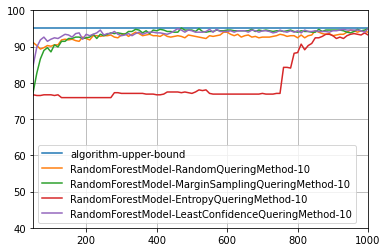

In [41]:
models = ['RandomForestModel']
quering_methods = ['RandomQueringMethod', 'MarginSamplingQueringMethod', 'EntropyQueringMethod', 'LeastConfidenceQueringMethod']

Ks = ['10']
# Ks = ['10','25']
repeats = 1
random_forest_upper_bound = 95.
total_experiments = len(models) * len(quering_methods) * len(Ks) * repeats


plot_results(random_forest_upper_bound, d, ['RandomForestModel'] , quering_methods    , Ks, 1)

Prikaz obucavanja modela, pri selektovanju 25 novih elemenata za obuku

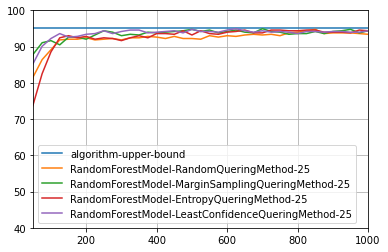

In [42]:
models = ['RandomForestModel']
quering_methods = ['RandomQueringMethod', 'MarginSamplingQueringMethod', 'EntropyQueringMethod', 'LeastConfidenceQueringMethod']
Ks = ['25']
# Ks = ['10','25']
repeats = 1
random_forest_upper_bound = 95.
total_experiments = len(models) * len(quering_methods) * len(Ks) * repeats


plot_results(random_forest_upper_bound, d, ['RandomForestModel'] , quering_methods    , Ks, 1)

Prikaz obucavanja modela, pri selektovanju 50 novih elemenata za obuku

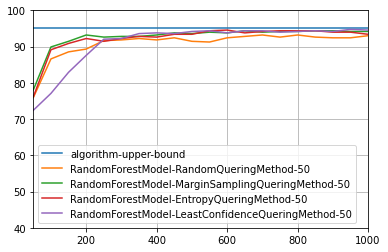

In [43]:
models = ['RandomForestModel']
quering_methods = ['RandomQueringMethod', 'MarginSamplingQueringMethod', 'EntropyQueringMethod', 'LeastConfidenceQueringMethod']
Ks = ['50']
# Ks = ['10','25']
repeats = 1
random_forest_upper_bound = 95.
total_experiments = len(models) * len(quering_methods) * len(Ks) * repeats


plot_results(random_forest_upper_bound, d, ['RandomForestModel'] , quering_methods    , Ks, 1)

<h2>CatBoost experiments</h2>

In [44]:
max_queried = 1000

repeats = 1


models = [CatBoostModel] 


quering_methods = [ RandomQueringMethod, MarginSamplingQueringMethod, EntropyQueringMethod, LeastConfidenceQueringMethod]  # LeastConfidenceQueringMethod


Ks = [10,25,50]

d = {}
stopped_at = -1 

d = experiment(d, models, quering_methods, Ks, repeats, stopped_at+1)
print (d)
results = json.loads(json.dumps(d, indent=2, sort_keys=True))
print(results)

stopping at: 1000
Count = 1, using model = CatBoostModel, quering_method = RandomQueringMethod, k = 10, iteration = 0.
initial train set: (10, 18) (10,) unique(labels): [8 2] [0 1]
Train set: (10, 18) y: (10,)
Val   set: (2049, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6813177	total: 133ms	remaining: 13.2s
1:	learn: 0.6733014	total: 135ms	remaining: 6.6s
2:	learn: 0.6595188	total: 136ms	remaining: 4.39s
3:	learn: 0.6382907	total: 137ms	remaining: 3.28s
4:	learn: 0.6225263	total: 138ms	remaining: 2.62s
5:	learn: 0.6163527	total: 139ms	remaining: 2.17s
6:	learn: 0.6073652	total: 139ms	remaining: 1.85s
7:	learn: 0.5897746	total: 140ms	remaining: 1.61s
8:	learn: 0.5760211	total: 140ms	remaining: 1.42s
9:	learn: 0.5653523	total: 141ms	remaining: 1.27s
10:	learn: 0.5587019	total: 141ms	remaining: 1.14s
11:	learn: 0.5533758	total: 143ms	remaining: 1.05s
12:	learn: 0.5470078	total: 144ms	remaining: 965ms
13:	learn: 0.5421115	total: 145ms	remaining: 892ms
14:	learn: 0.5367155	t

69:	learn: 0.2358551	total: 50ms	remaining: 21.4ms
70:	learn: 0.2338739	total: 51ms	remaining: 20.8ms
71:	learn: 0.2315022	total: 52ms	remaining: 20.2ms
72:	learn: 0.2286861	total: 53.1ms	remaining: 19.6ms
73:	learn: 0.2262320	total: 54ms	remaining: 19ms
74:	learn: 0.2240579	total: 54.8ms	remaining: 18.3ms
75:	learn: 0.2218414	total: 55.6ms	remaining: 17.6ms
76:	learn: 0.2192196	total: 56.4ms	remaining: 16.8ms
77:	learn: 0.2171625	total: 57.2ms	remaining: 16.1ms
78:	learn: 0.2151379	total: 58ms	remaining: 15.4ms
79:	learn: 0.2131643	total: 58.9ms	remaining: 14.7ms
80:	learn: 0.2113142	total: 59.8ms	remaining: 14ms
81:	learn: 0.2093841	total: 60.9ms	remaining: 13.4ms
82:	learn: 0.2078838	total: 62ms	remaining: 12.7ms
83:	learn: 0.2058130	total: 62.9ms	remaining: 12ms
84:	learn: 0.2038241	total: 63.9ms	remaining: 11.3ms
85:	learn: 0.2018244	total: 64.8ms	remaining: 10.6ms
86:	learn: 0.2000581	total: 65.9ms	remaining: 9.84ms
87:	learn: 0.1986863	total: 67ms	remaining: 9.14ms
88:	learn: 0.

90:	learn: 0.1371330	total: 76ms	remaining: 7.51ms
91:	learn: 0.1356191	total: 77.2ms	remaining: 6.71ms
92:	learn: 0.1344917	total: 78.4ms	remaining: 5.9ms
93:	learn: 0.1333807	total: 79.7ms	remaining: 5.09ms
94:	learn: 0.1321429	total: 80.8ms	remaining: 4.25ms
95:	learn: 0.1309251	total: 82.2ms	remaining: 3.42ms
96:	learn: 0.1297295	total: 83.3ms	remaining: 2.57ms
97:	learn: 0.1285516	total: 84.2ms	remaining: 1.72ms
98:	learn: 0.1275272	total: 84.9ms	remaining: 858us
99:	learn: 0.1265188	total: 85.7ms	remaining: 0us
-----------------------------------
In iteration:  4

Accuracy for 85.048544 
updated train set: (50, 18) (50,) unique(labels): [39 11] [0 1]
Train set: (50, 18) y: (50,)
Val   set: (2009, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6640908	total: 899us	remaining: 89ms
1:	learn: 0.6332541	total: 1.78ms	remaining: 87.1ms
2:	learn: 0.6055297	total: 2.62ms	remaining: 84.7ms
3:	learn: 0.5761462	total: 3.58ms	remaining: 85.8ms
4:	learn: 0.5518393	total: 4.55ms	re

92:	learn: 0.1276241	total: 129ms	remaining: 9.74ms
93:	learn: 0.1264274	total: 131ms	remaining: 8.35ms
94:	learn: 0.1254281	total: 132ms	remaining: 6.95ms
95:	learn: 0.1242738	total: 133ms	remaining: 5.55ms
96:	learn: 0.1231459	total: 135ms	remaining: 4.16ms
97:	learn: 0.1220437	total: 136ms	remaining: 2.77ms
98:	learn: 0.1209184	total: 137ms	remaining: 1.38ms
99:	learn: 0.1200154	total: 138ms	remaining: 0us
-----------------------------------
In iteration:  6

Accuracy for 86.019417 
updated train set: (70, 18) (70,) unique(labels): [54 16] [0 1]
Train set: (70, 18) y: (70,)
Val   set: (1989, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6623634	total: 1.26ms	remaining: 125ms
1:	learn: 0.6335770	total: 2.41ms	remaining: 118ms
2:	learn: 0.5974611	total: 4.05ms	remaining: 131ms
3:	learn: 0.5702748	total: 5.35ms	remaining: 128ms
4:	learn: 0.5441012	total: 6.63ms	remaining: 126ms
5:	learn: 0.5264426	total: 8.3ms	remaining: 130ms
6:	learn: 0.5057543	total: 9.1ms	remaining: 12

updated train set: (90, 18) (90,) unique(labels): [68 22] [0 1]
Train set: (90, 18) y: (90,)
Val   set: (1969, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6619004	total: 1.48ms	remaining: 146ms
1:	learn: 0.6316944	total: 2.88ms	remaining: 141ms
2:	learn: 0.6004794	total: 4.44ms	remaining: 144ms
3:	learn: 0.5683394	total: 5.65ms	remaining: 136ms
4:	learn: 0.5423588	total: 7.12ms	remaining: 135ms
5:	learn: 0.5240055	total: 8.29ms	remaining: 130ms
6:	learn: 0.5036281	total: 9.24ms	remaining: 123ms
7:	learn: 0.4800655	total: 10.8ms	remaining: 124ms
8:	learn: 0.4599965	total: 12.1ms	remaining: 122ms
9:	learn: 0.4462689	total: 13.4ms	remaining: 120ms
10:	learn: 0.4337438	total: 14.9ms	remaining: 121ms
11:	learn: 0.4197244	total: 16.5ms	remaining: 121ms
12:	learn: 0.4092792	total: 18ms	remaining: 120ms
13:	learn: 0.4004557	total: 19.4ms	remaining: 119ms
14:	learn: 0.3915139	total: 20.8ms	remaining: 118ms
15:	learn: 0.3828368	total: 22.2ms	remaining: 117ms
16:	learn: 0.3728780	t

94:	learn: 0.1107673	total: 154ms	remaining: 8.11ms
95:	learn: 0.1092796	total: 156ms	remaining: 6.49ms
96:	learn: 0.1079083	total: 157ms	remaining: 4.85ms
97:	learn: 0.1074774	total: 158ms	remaining: 3.22ms
98:	learn: 0.1063132	total: 160ms	remaining: 1.61ms
99:	learn: 0.1049627	total: 161ms	remaining: 0us
-----------------------------------
In iteration:  10

Accuracy for 89.708738 
updated train set: (110, 18) (110,) unique(labels): [81 29] [0 1]
Train set: (110, 18) y: (110,)
Val   set: (1949, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6505390	total: 7.45ms	remaining: 737ms
1:	learn: 0.6166242	total: 8.49ms	remaining: 416ms
2:	learn: 0.5848509	total: 9.4ms	remaining: 304ms
3:	learn: 0.5560832	total: 10.2ms	remaining: 245ms
4:	learn: 0.5359971	total: 11.2ms	remaining: 212ms
5:	learn: 0.5099578	total: 12ms	remaining: 188ms
6:	learn: 0.4871237	total: 12.9ms	remaining: 171ms
7:	learn: 0.4678918	total: 13.8ms	remaining: 159ms
8:	learn: 0.4464060	total: 14.7ms	remaining: 

52:	learn: 0.1792218	total: 67.2ms	remaining: 59.6ms
53:	learn: 0.1778550	total: 68.6ms	remaining: 58.4ms
54:	learn: 0.1743311	total: 70.1ms	remaining: 57.4ms
55:	learn: 0.1728731	total: 71.5ms	remaining: 56.2ms
56:	learn: 0.1696199	total: 72.9ms	remaining: 55ms
57:	learn: 0.1673659	total: 74.2ms	remaining: 53.7ms
58:	learn: 0.1656448	total: 75.2ms	remaining: 52.3ms
59:	learn: 0.1634914	total: 76.3ms	remaining: 50.9ms
60:	learn: 0.1617301	total: 77.6ms	remaining: 49.6ms
61:	learn: 0.1606803	total: 78.8ms	remaining: 48.3ms
62:	learn: 0.1576882	total: 79.9ms	remaining: 46.9ms
63:	learn: 0.1557435	total: 80.9ms	remaining: 45.5ms
64:	learn: 0.1542460	total: 81.8ms	remaining: 44ms
65:	learn: 0.1521683	total: 82.6ms	remaining: 42.6ms
66:	learn: 0.1498678	total: 83.5ms	remaining: 41.1ms
67:	learn: 0.1488743	total: 84.4ms	remaining: 39.7ms
68:	learn: 0.1473900	total: 85.2ms	remaining: 38.3ms
69:	learn: 0.1457067	total: 86.1ms	remaining: 36.9ms
70:	learn: 0.1443955	total: 87.4ms	remaining: 35.7

53:	learn: 0.1874115	total: 55.3ms	remaining: 47.1ms
54:	learn: 0.1855720	total: 56.5ms	remaining: 46.2ms
55:	learn: 0.1833157	total: 57.6ms	remaining: 45.3ms
56:	learn: 0.1812198	total: 58.9ms	remaining: 44.4ms
57:	learn: 0.1796704	total: 59.9ms	remaining: 43.4ms
58:	learn: 0.1774510	total: 60.9ms	remaining: 42.3ms
59:	learn: 0.1756943	total: 61.9ms	remaining: 41.3ms
60:	learn: 0.1733662	total: 62.9ms	remaining: 40.2ms
61:	learn: 0.1716090	total: 63.9ms	remaining: 39.2ms
62:	learn: 0.1705504	total: 64.9ms	remaining: 38.1ms
63:	learn: 0.1686847	total: 66.1ms	remaining: 37.2ms
64:	learn: 0.1665242	total: 67.3ms	remaining: 36.2ms
65:	learn: 0.1636983	total: 68.5ms	remaining: 35.3ms
66:	learn: 0.1625604	total: 69.6ms	remaining: 34.3ms
67:	learn: 0.1610295	total: 70.7ms	remaining: 33.3ms
68:	learn: 0.1595669	total: 71.6ms	remaining: 32.2ms
69:	learn: 0.1582451	total: 72.6ms	remaining: 31.1ms
70:	learn: 0.1560860	total: 73.5ms	remaining: 30ms
71:	learn: 0.1543156	total: 74.5ms	remaining: 29

32:	learn: 0.2369319	total: 39.9ms	remaining: 80.9ms
33:	learn: 0.2343277	total: 41.1ms	remaining: 79.9ms
34:	learn: 0.2308471	total: 42.4ms	remaining: 78.8ms
35:	learn: 0.2277793	total: 43.5ms	remaining: 77.4ms
36:	learn: 0.2246844	total: 44.6ms	remaining: 75.9ms
37:	learn: 0.2210898	total: 45.9ms	remaining: 74.9ms
38:	learn: 0.2179473	total: 47ms	remaining: 73.5ms
39:	learn: 0.2155969	total: 48.2ms	remaining: 72.2ms
40:	learn: 0.2114103	total: 49.2ms	remaining: 70.8ms
41:	learn: 0.2082912	total: 50.2ms	remaining: 69.4ms
42:	learn: 0.2041191	total: 51.1ms	remaining: 67.7ms
43:	learn: 0.2016071	total: 52.1ms	remaining: 66.4ms
44:	learn: 0.1980378	total: 53.4ms	remaining: 65.3ms
45:	learn: 0.1958072	total: 54.8ms	remaining: 64.4ms
46:	learn: 0.1933351	total: 56.2ms	remaining: 63.4ms
47:	learn: 0.1914596	total: 57ms	remaining: 61.7ms
48:	learn: 0.1891880	total: 57.9ms	remaining: 60.3ms
49:	learn: 0.1865438	total: 59.1ms	remaining: 59.1ms
50:	learn: 0.1849884	total: 60.5ms	remaining: 58.1

4:	learn: 0.5190422	total: 6.68ms	remaining: 127ms
5:	learn: 0.4914618	total: 8.05ms	remaining: 126ms
6:	learn: 0.4680030	total: 9.09ms	remaining: 121ms
7:	learn: 0.4474580	total: 10.2ms	remaining: 117ms
8:	learn: 0.4319483	total: 11.1ms	remaining: 112ms
9:	learn: 0.4150832	total: 12ms	remaining: 108ms
10:	learn: 0.3989168	total: 12.8ms	remaining: 104ms
11:	learn: 0.3824954	total: 13.7ms	remaining: 101ms
12:	learn: 0.3704067	total: 14.7ms	remaining: 98.1ms
13:	learn: 0.3574363	total: 15.5ms	remaining: 95.5ms
14:	learn: 0.3461591	total: 16.4ms	remaining: 92.9ms
15:	learn: 0.3368804	total: 17.2ms	remaining: 90.4ms
16:	learn: 0.3268387	total: 18.6ms	remaining: 90.7ms
17:	learn: 0.3167035	total: 19.5ms	remaining: 89ms
18:	learn: 0.3077416	total: 20.6ms	remaining: 88ms
19:	learn: 0.2987390	total: 21.6ms	remaining: 86.5ms
20:	learn: 0.2923356	total: 22.6ms	remaining: 85.2ms
21:	learn: 0.2848221	total: 23.7ms	remaining: 83.9ms
22:	learn: 0.2791008	total: 24.8ms	remaining: 83ms
23:	learn: 0.27


Accuracy for 91.067961 
updated train set: (200, 18) (200,) unique(labels): [150  50] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6407297	total: 13.4ms	remaining: 1.32s
1:	learn: 0.6063545	total: 14.9ms	remaining: 728ms
2:	learn: 0.5698383	total: 16.1ms	remaining: 520ms
3:	learn: 0.5387103	total: 17.3ms	remaining: 416ms
4:	learn: 0.5129451	total: 18.9ms	remaining: 359ms
5:	learn: 0.4856941	total: 20.5ms	remaining: 321ms
6:	learn: 0.4613496	total: 22ms	remaining: 292ms
7:	learn: 0.4394676	total: 23.2ms	remaining: 267ms
8:	learn: 0.4234676	total: 24.7ms	remaining: 250ms
9:	learn: 0.4072694	total: 26.9ms	remaining: 242ms
10:	learn: 0.3904071	total: 28.1ms	remaining: 228ms
11:	learn: 0.3749267	total: 29.5ms	remaining: 216ms
12:	learn: 0.3628662	total: 30.8ms	remaining: 206ms
13:	learn: 0.3497807	total: 32.1ms	remaining: 197ms
14:	learn: 0.3372423	total: 33.6ms	remaining: 190ms
15:	learn: 0.3258555	total: 34.7ms	remainin

1:	learn: 0.6041899	total: 12.9ms	remaining: 633ms
2:	learn: 0.5682407	total: 14.4ms	remaining: 466ms
3:	learn: 0.5369889	total: 15.8ms	remaining: 380ms
4:	learn: 0.5118148	total: 17.2ms	remaining: 326ms
5:	learn: 0.4820925	total: 18.4ms	remaining: 289ms
6:	learn: 0.4570992	total: 19.9ms	remaining: 264ms
7:	learn: 0.4345718	total: 21.2ms	remaining: 243ms
8:	learn: 0.4177097	total: 22.5ms	remaining: 227ms
9:	learn: 0.4008838	total: 23.9ms	remaining: 215ms
10:	learn: 0.3843511	total: 25.1ms	remaining: 203ms
11:	learn: 0.3683307	total: 26.3ms	remaining: 193ms
12:	learn: 0.3553856	total: 28ms	remaining: 187ms
13:	learn: 0.3449848	total: 29.5ms	remaining: 181ms
14:	learn: 0.3342003	total: 30.7ms	remaining: 174ms
15:	learn: 0.3220734	total: 31.9ms	remaining: 167ms
16:	learn: 0.3131056	total: 33.4ms	remaining: 163ms
17:	learn: 0.3051288	total: 34.6ms	remaining: 158ms
18:	learn: 0.2973152	total: 36ms	remaining: 153ms
19:	learn: 0.2884192	total: 37.2ms	remaining: 149ms
20:	learn: 0.2818839	tota

84:	learn: 0.1225882	total: 125ms	remaining: 22.1ms
85:	learn: 0.1217160	total: 127ms	remaining: 20.7ms
86:	learn: 0.1209695	total: 129ms	remaining: 19.2ms
87:	learn: 0.1195707	total: 130ms	remaining: 17.7ms
88:	learn: 0.1186182	total: 132ms	remaining: 16.3ms
89:	learn: 0.1181247	total: 133ms	remaining: 14.8ms
90:	learn: 0.1168212	total: 135ms	remaining: 13.4ms
91:	learn: 0.1159716	total: 137ms	remaining: 11.9ms
92:	learn: 0.1151148	total: 139ms	remaining: 10.5ms
93:	learn: 0.1144094	total: 141ms	remaining: 9.02ms
94:	learn: 0.1131776	total: 143ms	remaining: 7.55ms
95:	learn: 0.1125066	total: 145ms	remaining: 6.06ms
96:	learn: 0.1113448	total: 147ms	remaining: 4.54ms
97:	learn: 0.1105904	total: 148ms	remaining: 3.03ms
98:	learn: 0.1101857	total: 150ms	remaining: 1.52ms
99:	learn: 0.1090875	total: 152ms	remaining: 0us
-----------------------------------
In iteration:  23

Accuracy for 91.844660 
updated train set: (240, 18) (240,) unique(labels): [184  56] [0 1]
Train set: (240, 18) y: 

updated train set: (260, 18) (260,) unique(labels): [199  61] [0 1]
Train set: (260, 18) y: (260,)
Val   set: (1799, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6373627	total: 10.9ms	remaining: 1.07s
1:	learn: 0.5918921	total: 11.9ms	remaining: 585ms
2:	learn: 0.5553894	total: 13.3ms	remaining: 429ms
3:	learn: 0.5239844	total: 14.5ms	remaining: 348ms
4:	learn: 0.4954400	total: 15.9ms	remaining: 302ms
5:	learn: 0.4703663	total: 17.2ms	remaining: 270ms
6:	learn: 0.4518701	total: 18.4ms	remaining: 244ms
7:	learn: 0.4304599	total: 19.5ms	remaining: 224ms
8:	learn: 0.4130755	total: 20.7ms	remaining: 209ms
9:	learn: 0.3915500	total: 21.8ms	remaining: 196ms
10:	learn: 0.3768644	total: 22.9ms	remaining: 185ms
11:	learn: 0.3643427	total: 24ms	remaining: 176ms
12:	learn: 0.3519035	total: 25.3ms	remaining: 169ms
13:	learn: 0.3382749	total: 26.4ms	remaining: 162ms
14:	learn: 0.3284288	total: 27.6ms	remaining: 156ms
15:	learn: 0.3189220	total: 28.7ms	remaining: 151ms
16:	learn: 0.308

59:	learn: 0.1600645	total: 95.2ms	remaining: 63.5ms
60:	learn: 0.1589544	total: 96.6ms	remaining: 61.7ms
61:	learn: 0.1574779	total: 97.9ms	remaining: 60ms
62:	learn: 0.1555577	total: 99.1ms	remaining: 58.2ms
63:	learn: 0.1541496	total: 100ms	remaining: 56.4ms
64:	learn: 0.1526785	total: 102ms	remaining: 54.7ms
65:	learn: 0.1513405	total: 103ms	remaining: 52.9ms
66:	learn: 0.1499791	total: 104ms	remaining: 51.2ms
67:	learn: 0.1483579	total: 105ms	remaining: 49.5ms
68:	learn: 0.1468006	total: 106ms	remaining: 47.8ms
69:	learn: 0.1445910	total: 108ms	remaining: 46.3ms
70:	learn: 0.1431456	total: 109ms	remaining: 44.6ms
71:	learn: 0.1417462	total: 110ms	remaining: 42.9ms
72:	learn: 0.1407071	total: 111ms	remaining: 41.2ms
73:	learn: 0.1395773	total: 113ms	remaining: 39.7ms
74:	learn: 0.1386612	total: 114ms	remaining: 38.1ms
75:	learn: 0.1375357	total: 116ms	remaining: 36.5ms
76:	learn: 0.1363373	total: 117ms	remaining: 34.9ms
77:	learn: 0.1357375	total: 118ms	remaining: 33.3ms
78:	learn:

updated train set: (300, 18) (300,) unique(labels): [230  70] [0 1]
Train set: (300, 18) y: (300,)
Val   set: (1759, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6372669	total: 9.36ms	remaining: 927ms
1:	learn: 0.5922114	total: 10.1ms	remaining: 495ms
2:	learn: 0.5605010	total: 11.3ms	remaining: 364ms
3:	learn: 0.5261045	total: 12.3ms	remaining: 295ms
4:	learn: 0.4951690	total: 13.8ms	remaining: 262ms
5:	learn: 0.4697870	total: 15.3ms	remaining: 240ms
6:	learn: 0.4463491	total: 16.5ms	remaining: 220ms
7:	learn: 0.4271443	total: 17.7ms	remaining: 204ms
8:	learn: 0.4054782	total: 18.8ms	remaining: 191ms
9:	learn: 0.3907094	total: 20.3ms	remaining: 182ms
10:	learn: 0.3737752	total: 22.3ms	remaining: 180ms
11:	learn: 0.3603526	total: 23.6ms	remaining: 173ms
12:	learn: 0.3475522	total: 25.3ms	remaining: 170ms
13:	learn: 0.3340399	total: 26.9ms	remaining: 165ms
14:	learn: 0.3251910	total: 28.2ms	remaining: 160ms
15:	learn: 0.3153970	total: 29.3ms	remaining: 154ms
16:	learn: 0.3

52:	learn: 0.1663693	total: 96.7ms	remaining: 85.7ms
53:	learn: 0.1650659	total: 98ms	remaining: 83.5ms
54:	learn: 0.1635313	total: 99.3ms	remaining: 81.3ms
55:	learn: 0.1617423	total: 101ms	remaining: 79.2ms
56:	learn: 0.1600034	total: 102ms	remaining: 77ms
57:	learn: 0.1582982	total: 103ms	remaining: 74.8ms
58:	learn: 0.1562870	total: 105ms	remaining: 72.7ms
59:	learn: 0.1553581	total: 106ms	remaining: 70.6ms
60:	learn: 0.1540796	total: 107ms	remaining: 68.5ms
61:	learn: 0.1529049	total: 108ms	remaining: 66.5ms
62:	learn: 0.1512795	total: 110ms	remaining: 64.5ms
63:	learn: 0.1502017	total: 111ms	remaining: 62.5ms
64:	learn: 0.1488223	total: 112ms	remaining: 60.4ms
65:	learn: 0.1475848	total: 113ms	remaining: 58.4ms
66:	learn: 0.1464852	total: 114ms	remaining: 56.4ms
67:	learn: 0.1450445	total: 116ms	remaining: 54.4ms
68:	learn: 0.1439744	total: 117ms	remaining: 52.6ms
69:	learn: 0.1430346	total: 118ms	remaining: 50.7ms
70:	learn: 0.1417595	total: 119ms	remaining: 48.8ms
71:	learn: 0.

updated train set: (340, 18) (340,) unique(labels): [257  83] [0 1]
Train set: (340, 18) y: (340,)
Val   set: (1719, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6359697	total: 21.9ms	remaining: 2.17s
1:	learn: 0.5913949	total: 23.4ms	remaining: 1.15s
2:	learn: 0.5531441	total: 24.9ms	remaining: 805ms
3:	learn: 0.5189641	total: 26.8ms	remaining: 644ms
4:	learn: 0.4890947	total: 28.5ms	remaining: 541ms
5:	learn: 0.4613411	total: 30ms	remaining: 470ms
6:	learn: 0.4370310	total: 31.7ms	remaining: 421ms
7:	learn: 0.4190031	total: 33.3ms	remaining: 383ms
8:	learn: 0.3994871	total: 35.2ms	remaining: 356ms
9:	learn: 0.3829006	total: 36.7ms	remaining: 331ms
10:	learn: 0.3674748	total: 38.4ms	remaining: 311ms
11:	learn: 0.3549240	total: 40ms	remaining: 293ms
12:	learn: 0.3434444	total: 41.4ms	remaining: 277ms
13:	learn: 0.3301389	total: 42.9ms	remaining: 263ms
14:	learn: 0.3175912	total: 44.4ms	remaining: 251ms
15:	learn: 0.3080809	total: 46ms	remaining: 241ms
16:	learn: 0.2975354

-----------------------------------
In iteration:  35

Accuracy for 92.815534 
updated train set: (360, 18) (360,) unique(labels): [272  88] [0 1]
Train set: (360, 18) y: (360,)
Val   set: (1699, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6346178	total: 1.37ms	remaining: 136ms
1:	learn: 0.5883987	total: 2.8ms	remaining: 137ms
2:	learn: 0.5494118	total: 4.29ms	remaining: 139ms
3:	learn: 0.5146700	total: 5.73ms	remaining: 138ms
4:	learn: 0.4843925	total: 7.42ms	remaining: 141ms
5:	learn: 0.4580055	total: 8.87ms	remaining: 139ms
6:	learn: 0.4333850	total: 10.4ms	remaining: 138ms
7:	learn: 0.4098953	total: 12.1ms	remaining: 139ms
8:	learn: 0.3897476	total: 13.6ms	remaining: 137ms
9:	learn: 0.3728974	total: 15.1ms	remaining: 135ms
10:	learn: 0.3574339	total: 16.3ms	remaining: 132ms
11:	learn: 0.3446657	total: 17.7ms	remaining: 130ms
12:	learn: 0.3316139	total: 19.2ms	remaining: 129ms
13:	learn: 0.3192611	total: 20.9ms	remaining: 128ms
14:	learn: 0.3083917	total: 22.3ms	remai

62:	learn: 0.1422830	total: 89.7ms	remaining: 52.7ms
63:	learn: 0.1403860	total: 91.2ms	remaining: 51.3ms
64:	learn: 0.1390045	total: 92.5ms	remaining: 49.8ms
65:	learn: 0.1376867	total: 93.7ms	remaining: 48.3ms
66:	learn: 0.1360997	total: 94.8ms	remaining: 46.7ms
67:	learn: 0.1354826	total: 96.2ms	remaining: 45.3ms
68:	learn: 0.1340706	total: 97.4ms	remaining: 43.8ms
69:	learn: 0.1327653	total: 98.6ms	remaining: 42.3ms
70:	learn: 0.1312920	total: 100ms	remaining: 40.9ms
71:	learn: 0.1300681	total: 102ms	remaining: 39.5ms
72:	learn: 0.1281331	total: 103ms	remaining: 38.1ms
73:	learn: 0.1267827	total: 104ms	remaining: 36.6ms
74:	learn: 0.1253340	total: 105ms	remaining: 35.1ms
75:	learn: 0.1241350	total: 107ms	remaining: 33.7ms
76:	learn: 0.1222880	total: 108ms	remaining: 32.2ms
77:	learn: 0.1213135	total: 109ms	remaining: 30.8ms
78:	learn: 0.1195585	total: 110ms	remaining: 29.3ms
79:	learn: 0.1183987	total: 111ms	remaining: 27.8ms
80:	learn: 0.1171836	total: 112ms	remaining: 26.4ms
81:	

-----------------------------------
In iteration:  39

Accuracy for 91.844660 
updated train set: (400, 18) (400,) unique(labels): [300 100] [0 1]
Train set: (400, 18) y: (400,)
Val   set: (1659, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6330379	total: 29.3ms	remaining: 2.9s
1:	learn: 0.5875008	total: 30.9ms	remaining: 1.51s
2:	learn: 0.5444332	total: 32.7ms	remaining: 1.06s
3:	learn: 0.5096360	total: 34.5ms	remaining: 827ms
4:	learn: 0.4786382	total: 36.2ms	remaining: 687ms
5:	learn: 0.4525372	total: 37.9ms	remaining: 594ms
6:	learn: 0.4281891	total: 39.6ms	remaining: 526ms
7:	learn: 0.4058007	total: 41.3ms	remaining: 475ms
8:	learn: 0.3872182	total: 42.9ms	remaining: 434ms
9:	learn: 0.3699976	total: 44.8ms	remaining: 404ms
10:	learn: 0.3538833	total: 46.4ms	remaining: 375ms
11:	learn: 0.3401668	total: 48ms	remaining: 352ms
12:	learn: 0.3283810	total: 49.7ms	remaining: 332ms
13:	learn: 0.3160097	total: 51.5ms	remaining: 316ms
14:	learn: 0.3048049	total: 53.3ms	remaini

0:	learn: 0.6329520	total: 33.6ms	remaining: 3.33s
1:	learn: 0.5884020	total: 35.5ms	remaining: 1.74s
2:	learn: 0.5494080	total: 37ms	remaining: 1.2s
3:	learn: 0.5143129	total: 38.3ms	remaining: 919ms
4:	learn: 0.4851432	total: 39.9ms	remaining: 758ms
5:	learn: 0.4604868	total: 41.5ms	remaining: 650ms
6:	learn: 0.4355394	total: 42.7ms	remaining: 568ms
7:	learn: 0.4133357	total: 44.1ms	remaining: 507ms
8:	learn: 0.3920432	total: 45.5ms	remaining: 460ms
9:	learn: 0.3746048	total: 46.8ms	remaining: 421ms
10:	learn: 0.3585209	total: 47.9ms	remaining: 388ms
11:	learn: 0.3459620	total: 49.1ms	remaining: 360ms
12:	learn: 0.3325877	total: 50.2ms	remaining: 336ms
13:	learn: 0.3207808	total: 51.2ms	remaining: 315ms
14:	learn: 0.3092911	total: 52.4ms	remaining: 297ms
15:	learn: 0.2994163	total: 53.8ms	remaining: 283ms
16:	learn: 0.2904825	total: 55.1ms	remaining: 269ms
17:	learn: 0.2841320	total: 56.3ms	remaining: 256ms
18:	learn: 0.2762585	total: 57.5ms	remaining: 245ms
19:	learn: 0.2682894	tota

82:	learn: 0.1160696	total: 138ms	remaining: 28.3ms
83:	learn: 0.1152543	total: 140ms	remaining: 26.6ms
84:	learn: 0.1142767	total: 141ms	remaining: 24.9ms
85:	learn: 0.1133377	total: 143ms	remaining: 23.2ms
86:	learn: 0.1122001	total: 144ms	remaining: 21.5ms
87:	learn: 0.1115746	total: 146ms	remaining: 19.9ms
88:	learn: 0.1109693	total: 147ms	remaining: 18.2ms
89:	learn: 0.1100270	total: 149ms	remaining: 16.5ms
90:	learn: 0.1092966	total: 150ms	remaining: 14.9ms
91:	learn: 0.1087973	total: 152ms	remaining: 13.2ms
92:	learn: 0.1079760	total: 154ms	remaining: 11.6ms
93:	learn: 0.1070077	total: 155ms	remaining: 9.9ms
94:	learn: 0.1062091	total: 156ms	remaining: 8.23ms
95:	learn: 0.1053389	total: 157ms	remaining: 6.56ms
96:	learn: 0.1045920	total: 159ms	remaining: 4.9ms
97:	learn: 0.1037672	total: 160ms	remaining: 3.27ms
98:	learn: 0.1029736	total: 162ms	remaining: 1.63ms
99:	learn: 0.1024798	total: 163ms	remaining: 0us
-----------------------------------
In iteration:  43

Accuracy for 9

1:	learn: 0.5857782	total: 9.28ms	remaining: 455ms
2:	learn: 0.5465274	total: 10.8ms	remaining: 350ms
3:	learn: 0.5113661	total: 12.2ms	remaining: 293ms
4:	learn: 0.4805888	total: 13.5ms	remaining: 257ms
5:	learn: 0.4549156	total: 14.8ms	remaining: 232ms
6:	learn: 0.4299496	total: 16.2ms	remaining: 215ms
7:	learn: 0.4088080	total: 17.5ms	remaining: 201ms
8:	learn: 0.3890204	total: 18.6ms	remaining: 188ms
9:	learn: 0.3713916	total: 19.8ms	remaining: 179ms
10:	learn: 0.3553509	total: 21.2ms	remaining: 172ms
11:	learn: 0.3417872	total: 22.9ms	remaining: 168ms
12:	learn: 0.3298101	total: 24.5ms	remaining: 164ms
13:	learn: 0.3162285	total: 26.2ms	remaining: 161ms
14:	learn: 0.3051320	total: 27.5ms	remaining: 156ms
15:	learn: 0.2952329	total: 28.8ms	remaining: 151ms
16:	learn: 0.2845032	total: 30.1ms	remaining: 147ms
17:	learn: 0.2768275	total: 31.3ms	remaining: 143ms
18:	learn: 0.2684321	total: 32.5ms	remaining: 138ms
19:	learn: 0.2614474	total: 33.6ms	remaining: 135ms
20:	learn: 0.2546599	

updated train set: (480, 18) (480,) unique(labels): [356 124] [0 1]
Train set: (480, 18) y: (480,)
Val   set: (1579, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6311335	total: 7.17ms	remaining: 710ms
1:	learn: 0.5857036	total: 8.42ms	remaining: 413ms
2:	learn: 0.5460908	total: 9.67ms	remaining: 313ms
3:	learn: 0.5106696	total: 10.7ms	remaining: 258ms
4:	learn: 0.4804355	total: 11.7ms	remaining: 223ms
5:	learn: 0.4552412	total: 12.8ms	remaining: 201ms
6:	learn: 0.4302546	total: 14ms	remaining: 186ms
7:	learn: 0.4098602	total: 15.1ms	remaining: 174ms
8:	learn: 0.3910685	total: 16.2ms	remaining: 164ms
9:	learn: 0.3732557	total: 17.4ms	remaining: 157ms
10:	learn: 0.3572924	total: 18.5ms	remaining: 150ms
11:	learn: 0.3437128	total: 19.6ms	remaining: 144ms
12:	learn: 0.3333675	total: 20.7ms	remaining: 139ms
13:	learn: 0.3198407	total: 21.9ms	remaining: 134ms
14:	learn: 0.3086570	total: 23.3ms	remaining: 132ms
15:	learn: 0.2983827	total: 24.4ms	remaining: 128ms
16:	learn: 0.288

87:	learn: 0.1144389	total: 130ms	remaining: 17.8ms
88:	learn: 0.1134688	total: 132ms	remaining: 16.3ms
89:	learn: 0.1128829	total: 134ms	remaining: 14.9ms
90:	learn: 0.1122785	total: 135ms	remaining: 13.4ms
91:	learn: 0.1113982	total: 137ms	remaining: 11.9ms
92:	learn: 0.1105777	total: 139ms	remaining: 10.4ms
93:	learn: 0.1100330	total: 141ms	remaining: 8.98ms
94:	learn: 0.1087857	total: 142ms	remaining: 7.5ms
95:	learn: 0.1079785	total: 145ms	remaining: 6.03ms
96:	learn: 0.1074826	total: 147ms	remaining: 4.54ms
97:	learn: 0.1066744	total: 149ms	remaining: 3.04ms
98:	learn: 0.1060025	total: 151ms	remaining: 1.52ms
99:	learn: 0.1055828	total: 152ms	remaining: 0us
-----------------------------------
In iteration:  49

Accuracy for 93.398058 
updated train set: (500, 18) (500,) unique(labels): [373 127] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6316469	total: 1.63ms	remaining: 162ms
1:	learn: 0.5858645	total: 3.46ms	

94:	learn: 0.1071130	total: 171ms	remaining: 9ms
95:	learn: 0.1061465	total: 173ms	remaining: 7.21ms
96:	learn: 0.1056994	total: 175ms	remaining: 5.41ms
97:	learn: 0.1050536	total: 177ms	remaining: 3.61ms
98:	learn: 0.1043304	total: 179ms	remaining: 1.81ms
99:	learn: 0.1039361	total: 181ms	remaining: 0us
-----------------------------------
In iteration:  51

Accuracy for 93.980583 
updated train set: (520, 18) (520,) unique(labels): [390 130] [0 1]
Train set: (520, 18) y: (520,)
Val   set: (1539, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6340127	total: 4.79ms	remaining: 474ms
1:	learn: 0.5867799	total: 6.5ms	remaining: 319ms
2:	learn: 0.5474192	total: 8.01ms	remaining: 259ms
3:	learn: 0.5133349	total: 9.33ms	remaining: 224ms
4:	learn: 0.4788795	total: 10.8ms	remaining: 205ms
5:	learn: 0.4504569	total: 12.4ms	remaining: 194ms
6:	learn: 0.4261978	total: 14.4ms	remaining: 192ms
7:	learn: 0.4026945	total: 16.1ms	remaining: 185ms
8:	learn: 0.3849831	total: 18ms	remaining: 1

96:	learn: 0.1047575	total: 161ms	remaining: 4.99ms
97:	learn: 0.1043428	total: 163ms	remaining: 3.32ms
98:	learn: 0.1039379	total: 164ms	remaining: 1.66ms
99:	learn: 0.1035445	total: 166ms	remaining: 0us
-----------------------------------
In iteration:  53

Accuracy for 93.592233 
updated train set: (540, 18) (540,) unique(labels): [405 135] [0 1]
Train set: (540, 18) y: (540,)
Val   set: (1519, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6335082	total: 5.89ms	remaining: 583ms
1:	learn: 0.5872673	total: 7.23ms	remaining: 354ms
2:	learn: 0.5470084	total: 8.8ms	remaining: 285ms
3:	learn: 0.5121066	total: 10.6ms	remaining: 253ms
4:	learn: 0.4770877	total: 12.3ms	remaining: 233ms
5:	learn: 0.4481811	total: 13.6ms	remaining: 213ms
6:	learn: 0.4231513	total: 14.9ms	remaining: 198ms
7:	learn: 0.4003338	total: 16.2ms	remaining: 186ms
8:	learn: 0.3805164	total: 17.4ms	remaining: 176ms
9:	learn: 0.3614171	total: 18.6ms	remaining: 168ms
10:	learn: 0.3456336	total: 19.9ms	remainin

59:	learn: 0.1379694	total: 79.1ms	remaining: 52.7ms
60:	learn: 0.1361486	total: 80.9ms	remaining: 51.7ms
61:	learn: 0.1347561	total: 83.2ms	remaining: 51ms
62:	learn: 0.1328212	total: 85ms	remaining: 49.9ms
63:	learn: 0.1316449	total: 86.8ms	remaining: 48.8ms
64:	learn: 0.1306652	total: 88.4ms	remaining: 47.6ms
65:	learn: 0.1293618	total: 89.9ms	remaining: 46.3ms
66:	learn: 0.1279742	total: 91.7ms	remaining: 45.1ms
67:	learn: 0.1261624	total: 93.4ms	remaining: 43.9ms
68:	learn: 0.1248304	total: 94.9ms	remaining: 42.6ms
69:	learn: 0.1237435	total: 96.4ms	remaining: 41.3ms
70:	learn: 0.1227661	total: 98.2ms	remaining: 40.1ms
71:	learn: 0.1218496	total: 99.7ms	remaining: 38.8ms
72:	learn: 0.1206205	total: 101ms	remaining: 37.3ms
73:	learn: 0.1197188	total: 102ms	remaining: 35.9ms
74:	learn: 0.1185268	total: 103ms	remaining: 34.4ms
75:	learn: 0.1173823	total: 105ms	remaining: 33ms
76:	learn: 0.1166325	total: 106ms	remaining: 31.6ms
77:	learn: 0.1156568	total: 107ms	remaining: 30.2ms
78:	l

10:	learn: 0.3433247	total: 33.5ms	remaining: 271ms
11:	learn: 0.3287154	total: 35ms	remaining: 257ms
12:	learn: 0.3155359	total: 36.3ms	remaining: 243ms
13:	learn: 0.3041185	total: 37.7ms	remaining: 232ms
14:	learn: 0.2936702	total: 39ms	remaining: 221ms
15:	learn: 0.2835372	total: 40.2ms	remaining: 211ms
16:	learn: 0.2741964	total: 41.5ms	remaining: 202ms
17:	learn: 0.2657519	total: 42.9ms	remaining: 196ms
18:	learn: 0.2576665	total: 44.4ms	remaining: 189ms
19:	learn: 0.2499751	total: 45.9ms	remaining: 184ms
20:	learn: 0.2429331	total: 47.3ms	remaining: 178ms
21:	learn: 0.2363690	total: 48.8ms	remaining: 173ms
22:	learn: 0.2302332	total: 50.4ms	remaining: 169ms
23:	learn: 0.2262858	total: 51.8ms	remaining: 164ms
24:	learn: 0.2210481	total: 53.1ms	remaining: 159ms
25:	learn: 0.2164303	total: 54.4ms	remaining: 155ms
26:	learn: 0.2118634	total: 55.8ms	remaining: 151ms
27:	learn: 0.2073508	total: 57.5ms	remaining: 148ms
28:	learn: 0.2028615	total: 58.9ms	remaining: 144ms
29:	learn: 0.200

updated train set: (590, 18) (590,) unique(labels): [447 143] [0 1]
Train set: (590, 18) y: (590,)
Val   set: (1469, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6324120	total: 1.29ms	remaining: 128ms
1:	learn: 0.5852526	total: 2.69ms	remaining: 132ms
2:	learn: 0.5442795	total: 3.9ms	remaining: 126ms
3:	learn: 0.5077771	total: 5.18ms	remaining: 124ms
4:	learn: 0.4730594	total: 6.41ms	remaining: 122ms
5:	learn: 0.4437912	total: 7.56ms	remaining: 118ms
6:	learn: 0.4180898	total: 8.78ms	remaining: 117ms
7:	learn: 0.3951268	total: 10ms	remaining: 115ms
8:	learn: 0.3757738	total: 11.2ms	remaining: 113ms
9:	learn: 0.3574233	total: 12.2ms	remaining: 110ms
10:	learn: 0.3412906	total: 13.4ms	remaining: 109ms
11:	learn: 0.3255119	total: 14.6ms	remaining: 107ms
12:	learn: 0.3115725	total: 15.8ms	remaining: 106ms
13:	learn: 0.3000730	total: 16.9ms	remaining: 104ms
14:	learn: 0.2895646	total: 18ms	remaining: 102ms
15:	learn: 0.2789082	total: 19.1ms	remaining: 100ms
16:	learn: 0.269539

88:	learn: 0.1102668	total: 135ms	remaining: 16.7ms
89:	learn: 0.1096437	total: 137ms	remaining: 15.2ms
90:	learn: 0.1090423	total: 138ms	remaining: 13.7ms
91:	learn: 0.1079433	total: 140ms	remaining: 12.1ms
92:	learn: 0.1071132	total: 141ms	remaining: 10.6ms
93:	learn: 0.1062392	total: 142ms	remaining: 9.07ms
94:	learn: 0.1058167	total: 143ms	remaining: 7.55ms
95:	learn: 0.1050648	total: 145ms	remaining: 6.03ms
96:	learn: 0.1042707	total: 146ms	remaining: 4.53ms
97:	learn: 0.1035889	total: 148ms	remaining: 3.02ms
98:	learn: 0.1028444	total: 150ms	remaining: 1.51ms
99:	learn: 0.1021005	total: 151ms	remaining: 0us
-----------------------------------
In iteration:  60

Accuracy for 93.786408 
updated train set: (610, 18) (610,) unique(labels): [463 147] [0 1]
Train set: (610, 18) y: (610,)
Val   set: (1449, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6313726	total: 12.5ms	remaining: 1.24s
1:	learn: 0.5835163	total: 14.1ms	remaining: 692ms
2:	learn: 0.5426005	total: 15.5ms	

99:	learn: 0.1027669	total: 210ms	remaining: 0us
-----------------------------------
In iteration:  62

Accuracy for 93.980583 
updated train set: (630, 18) (630,) unique(labels): [477 153] [0 1]
Train set: (630, 18) y: (630,)
Val   set: (1429, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6314645	total: 1.46ms	remaining: 144ms
1:	learn: 0.5841863	total: 3.58ms	remaining: 175ms
2:	learn: 0.5431558	total: 5.36ms	remaining: 173ms
3:	learn: 0.5067446	total: 7.36ms	remaining: 177ms
4:	learn: 0.4727014	total: 9.18ms	remaining: 174ms
5:	learn: 0.4437986	total: 11ms	remaining: 172ms
6:	learn: 0.4196517	total: 12.7ms	remaining: 169ms
7:	learn: 0.3975396	total: 14.9ms	remaining: 171ms
8:	learn: 0.3788375	total: 16.6ms	remaining: 168ms
9:	learn: 0.3591919	total: 18.4ms	remaining: 166ms
10:	learn: 0.3430834	total: 20.2ms	remaining: 163ms
11:	learn: 0.3273290	total: 22.1ms	remaining: 162ms
12:	learn: 0.3143096	total: 23.8ms	remaining: 160ms
13:	learn: 0.3032689	total: 25.8ms	remaining

78:	learn: 0.1194063	total: 176ms	remaining: 46.7ms
79:	learn: 0.1182024	total: 178ms	remaining: 44.5ms
80:	learn: 0.1174795	total: 180ms	remaining: 42.2ms
81:	learn: 0.1168368	total: 182ms	remaining: 39.9ms
82:	learn: 0.1160771	total: 183ms	remaining: 37.5ms
83:	learn: 0.1154038	total: 185ms	remaining: 35.3ms
84:	learn: 0.1148066	total: 187ms	remaining: 33ms
85:	learn: 0.1143176	total: 188ms	remaining: 30.7ms
86:	learn: 0.1131012	total: 190ms	remaining: 28.4ms
87:	learn: 0.1123310	total: 192ms	remaining: 26.2ms
88:	learn: 0.1115649	total: 194ms	remaining: 24ms
89:	learn: 0.1110114	total: 196ms	remaining: 21.8ms
90:	learn: 0.1102028	total: 198ms	remaining: 19.5ms
91:	learn: 0.1091022	total: 199ms	remaining: 17.3ms
92:	learn: 0.1082854	total: 201ms	remaining: 15.1ms
93:	learn: 0.1075384	total: 202ms	remaining: 12.9ms
94:	learn: 0.1068973	total: 204ms	remaining: 10.7ms
95:	learn: 0.1061898	total: 206ms	remaining: 8.58ms
96:	learn: 0.1054332	total: 208ms	remaining: 6.42ms
97:	learn: 0.105

updated train set: (670, 18) (670,) unique(labels): [506 164] [0 1]
Train set: (670, 18) y: (670,)
Val   set: (1389, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6309897	total: 7.77ms	remaining: 769ms
1:	learn: 0.5837029	total: 9.51ms	remaining: 466ms
2:	learn: 0.5422176	total: 10.9ms	remaining: 351ms
3:	learn: 0.5068903	total: 12.1ms	remaining: 291ms
4:	learn: 0.4725944	total: 13.4ms	remaining: 255ms
5:	learn: 0.4445159	total: 15ms	remaining: 235ms
6:	learn: 0.4204091	total: 16.2ms	remaining: 216ms
7:	learn: 0.3983704	total: 17.4ms	remaining: 200ms
8:	learn: 0.3797232	total: 18.6ms	remaining: 188ms
9:	learn: 0.3601907	total: 19.8ms	remaining: 178ms
10:	learn: 0.3437926	total: 21.1ms	remaining: 171ms
11:	learn: 0.3277499	total: 22.4ms	remaining: 164ms
12:	learn: 0.3146727	total: 23.6ms	remaining: 158ms
13:	learn: 0.3034457	total: 24.8ms	remaining: 152ms
14:	learn: 0.2929169	total: 26ms	remaining: 147ms
15:	learn: 0.2816289	total: 27.2ms	remaining: 143ms
16:	learn: 0.27136

57:	learn: 0.1404706	total: 96.9ms	remaining: 70.2ms
58:	learn: 0.1394773	total: 98.4ms	remaining: 68.4ms
59:	learn: 0.1381461	total: 99.9ms	remaining: 66.6ms
60:	learn: 0.1365617	total: 101ms	remaining: 64.8ms
61:	learn: 0.1349227	total: 103ms	remaining: 62.9ms
62:	learn: 0.1340422	total: 104ms	remaining: 61.1ms
63:	learn: 0.1330601	total: 106ms	remaining: 59.3ms
64:	learn: 0.1318953	total: 107ms	remaining: 57.7ms
65:	learn: 0.1308183	total: 109ms	remaining: 56ms
66:	learn: 0.1296999	total: 110ms	remaining: 54.3ms
67:	learn: 0.1278432	total: 112ms	remaining: 52.6ms
68:	learn: 0.1267186	total: 113ms	remaining: 50.9ms
69:	learn: 0.1254256	total: 114ms	remaining: 49ms
70:	learn: 0.1240340	total: 115ms	remaining: 47.2ms
71:	learn: 0.1233197	total: 117ms	remaining: 45.5ms
72:	learn: 0.1224886	total: 118ms	remaining: 43.7ms
73:	learn: 0.1214514	total: 119ms	remaining: 41.9ms
74:	learn: 0.1208015	total: 121ms	remaining: 40.2ms
75:	learn: 0.1198313	total: 122ms	remaining: 38.4ms
76:	learn: 0.

updated train set: (710, 18) (710,) unique(labels): [534 176] [0 1]
Train set: (710, 18) y: (710,)
Val   set: (1349, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6311590	total: 9.41ms	remaining: 931ms
1:	learn: 0.5824371	total: 11ms	remaining: 539ms
2:	learn: 0.5407641	total: 12.4ms	remaining: 401ms
3:	learn: 0.5057868	total: 13.6ms	remaining: 326ms
4:	learn: 0.4725108	total: 14.8ms	remaining: 281ms
5:	learn: 0.4433383	total: 16ms	remaining: 250ms
6:	learn: 0.4195107	total: 17.2ms	remaining: 229ms
7:	learn: 0.3981213	total: 18.5ms	remaining: 213ms
8:	learn: 0.3795344	total: 20ms	remaining: 202ms
9:	learn: 0.3594973	total: 21.1ms	remaining: 190ms
10:	learn: 0.3434884	total: 22.5ms	remaining: 182ms
11:	learn: 0.3280149	total: 24ms	remaining: 176ms
12:	learn: 0.3148339	total: 25.4ms	remaining: 170ms
13:	learn: 0.3023072	total: 27.2ms	remaining: 167ms
14:	learn: 0.2912937	total: 28.7ms	remaining: 163ms
15:	learn: 0.2809312	total: 30.3ms	remaining: 159ms
16:	learn: 0.2710556	t

27:	learn: 0.2060251	total: 40.2ms	remaining: 103ms
28:	learn: 0.2023607	total: 41.9ms	remaining: 103ms
29:	learn: 0.1986825	total: 43.3ms	remaining: 101ms
30:	learn: 0.1958188	total: 45.2ms	remaining: 101ms
31:	learn: 0.1926535	total: 47.1ms	remaining: 100ms
32:	learn: 0.1886302	total: 48.6ms	remaining: 98.6ms
33:	learn: 0.1859064	total: 50.1ms	remaining: 97.2ms
34:	learn: 0.1836353	total: 51.7ms	remaining: 96.1ms
35:	learn: 0.1807036	total: 53.5ms	remaining: 95ms
36:	learn: 0.1781364	total: 55.2ms	remaining: 94ms
37:	learn: 0.1756671	total: 56.6ms	remaining: 92.4ms
38:	learn: 0.1733155	total: 58.2ms	remaining: 91ms
39:	learn: 0.1709446	total: 59.8ms	remaining: 89.7ms
40:	learn: 0.1695359	total: 61.3ms	remaining: 88.2ms
41:	learn: 0.1674607	total: 62.8ms	remaining: 86.8ms
42:	learn: 0.1655934	total: 64.3ms	remaining: 85.2ms
43:	learn: 0.1637944	total: 65.7ms	remaining: 83.6ms
44:	learn: 0.1623594	total: 67.3ms	remaining: 82.2ms
45:	learn: 0.1603990	total: 68.8ms	remaining: 80.7ms
46:	

updated train set: (750, 18) (750,) unique(labels): [563 187] [0 1]
Train set: (750, 18) y: (750,)
Val   set: (1309, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6318218	total: 8.35ms	remaining: 826ms
1:	learn: 0.5827519	total: 9.74ms	remaining: 477ms
2:	learn: 0.5421611	total: 11ms	remaining: 357ms
3:	learn: 0.5061575	total: 12.5ms	remaining: 299ms
4:	learn: 0.4729407	total: 14ms	remaining: 266ms
5:	learn: 0.4454456	total: 15.2ms	remaining: 238ms
6:	learn: 0.4196582	total: 16.5ms	remaining: 219ms
7:	learn: 0.3968691	total: 17.7ms	remaining: 204ms
8:	learn: 0.3772934	total: 18.9ms	remaining: 191ms
9:	learn: 0.3578224	total: 20ms	remaining: 180ms
10:	learn: 0.3416874	total: 21.8ms	remaining: 176ms
11:	learn: 0.3267725	total: 23.1ms	remaining: 170ms
12:	learn: 0.3124437	total: 24.5ms	remaining: 164ms
13:	learn: 0.2999562	total: 25.8ms	remaining: 158ms
14:	learn: 0.2900898	total: 26.9ms	remaining: 152ms
15:	learn: 0.2796422	total: 28.1ms	remaining: 148ms
16:	learn: 0.2706249

62:	learn: 0.1370788	total: 84.2ms	remaining: 49.5ms
63:	learn: 0.1364279	total: 85.7ms	remaining: 48.2ms
64:	learn: 0.1350947	total: 87.3ms	remaining: 47ms
65:	learn: 0.1346064	total: 88.9ms	remaining: 45.8ms
66:	learn: 0.1334089	total: 90.3ms	remaining: 44.5ms
67:	learn: 0.1321603	total: 91.7ms	remaining: 43.1ms
68:	learn: 0.1311792	total: 93.2ms	remaining: 41.9ms
69:	learn: 0.1297438	total: 94.9ms	remaining: 40.7ms
70:	learn: 0.1287327	total: 96.8ms	remaining: 39.5ms
71:	learn: 0.1270874	total: 98.1ms	remaining: 38.1ms
72:	learn: 0.1265102	total: 99.3ms	remaining: 36.7ms
73:	learn: 0.1256601	total: 101ms	remaining: 35.3ms
74:	learn: 0.1251953	total: 102ms	remaining: 34ms
75:	learn: 0.1242476	total: 103ms	remaining: 32.6ms
76:	learn: 0.1234625	total: 104ms	remaining: 31.2ms
77:	learn: 0.1225476	total: 106ms	remaining: 29.8ms
78:	learn: 0.1215526	total: 107ms	remaining: 28.4ms
79:	learn: 0.1206048	total: 108ms	remaining: 27ms
80:	learn: 0.1192298	total: 109ms	remaining: 25.6ms
81:	lea

89:	learn: 0.1100629	total: 135ms	remaining: 15ms
90:	learn: 0.1096004	total: 137ms	remaining: 13.5ms
91:	learn: 0.1085435	total: 139ms	remaining: 12ms
92:	learn: 0.1079397	total: 140ms	remaining: 10.6ms
93:	learn: 0.1072885	total: 142ms	remaining: 9.09ms
94:	learn: 0.1068426	total: 144ms	remaining: 7.59ms
95:	learn: 0.1064242	total: 146ms	remaining: 6.09ms
96:	learn: 0.1057848	total: 148ms	remaining: 4.58ms
97:	learn: 0.1051917	total: 150ms	remaining: 3.06ms
98:	learn: 0.1042650	total: 152ms	remaining: 1.53ms
99:	learn: 0.1035913	total: 153ms	remaining: 0us
-----------------------------------
In iteration:  78

Accuracy for 93.980583 
updated train set: (790, 18) (790,) unique(labels): [594 196] [0 1]
Train set: (790, 18) y: (790,)
Val   set: (1269, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6316346	total: 27.9ms	remaining: 2.76s
1:	learn: 0.5825236	total: 29.9ms	remaining: 1.47s
2:	learn: 0.5413932	total: 31.9ms	remaining: 1.03s
3:	learn: 0.5051497	total: 33.7ms	remai

99:	learn: 0.0994305	total: 168ms	remaining: 0us
-----------------------------------
In iteration:  80

Accuracy for 94.174757 
updated train set: (810, 18) (810,) unique(labels): [609 201] [0 1]
Train set: (810, 18) y: (810,)
Val   set: (1249, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6312825	total: 2.11ms	remaining: 209ms
1:	learn: 0.5816503	total: 3.85ms	remaining: 189ms
2:	learn: 0.5404702	total: 5.59ms	remaining: 181ms
3:	learn: 0.5040792	total: 7.53ms	remaining: 181ms
4:	learn: 0.4703793	total: 9.32ms	remaining: 177ms
5:	learn: 0.4420995	total: 11.3ms	remaining: 178ms
6:	learn: 0.4159527	total: 13.3ms	remaining: 176ms
7:	learn: 0.3929900	total: 15.3ms	remaining: 176ms
8:	learn: 0.3750976	total: 17ms	remaining: 172ms
9:	learn: 0.3552464	total: 18.9ms	remaining: 170ms
10:	learn: 0.3387665	total: 20.5ms	remaining: 166ms
11:	learn: 0.3234321	total: 22.2ms	remaining: 163ms
12:	learn: 0.3097182	total: 23.8ms	remaining: 159ms
13:	learn: 0.2971969	total: 25.6ms	remaining

updated train set: (830, 18) (830,) unique(labels): [622 208] [0 1]
Train set: (830, 18) y: (830,)
Val   set: (1229, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6315414	total: 3.12ms	remaining: 309ms
1:	learn: 0.5818173	total: 4.85ms	remaining: 238ms
2:	learn: 0.5407205	total: 6.74ms	remaining: 218ms
3:	learn: 0.5039500	total: 8.29ms	remaining: 199ms
4:	learn: 0.4701226	total: 10ms	remaining: 191ms
5:	learn: 0.4419555	total: 11.5ms	remaining: 181ms
6:	learn: 0.4161169	total: 13ms	remaining: 172ms
7:	learn: 0.3934801	total: 14.3ms	remaining: 165ms
8:	learn: 0.3746415	total: 15.8ms	remaining: 160ms
9:	learn: 0.3546386	total: 17.3ms	remaining: 155ms
10:	learn: 0.3383848	total: 18.9ms	remaining: 153ms
11:	learn: 0.3221660	total: 20.4ms	remaining: 150ms
12:	learn: 0.3091540	total: 21.8ms	remaining: 146ms
13:	learn: 0.2968539	total: 23.2ms	remaining: 143ms
14:	learn: 0.2882485	total: 24.6ms	remaining: 139ms
15:	learn: 0.2772616	total: 26.1ms	remaining: 137ms
16:	learn: 0.26652

68:	learn: 0.1232053	total: 107ms	remaining: 48.2ms
69:	learn: 0.1218155	total: 110ms	remaining: 47ms
70:	learn: 0.1201795	total: 111ms	remaining: 45.5ms
71:	learn: 0.1191587	total: 113ms	remaining: 43.9ms
72:	learn: 0.1182712	total: 114ms	remaining: 42.2ms
73:	learn: 0.1173382	total: 116ms	remaining: 40.6ms
74:	learn: 0.1160698	total: 117ms	remaining: 39ms
75:	learn: 0.1148105	total: 118ms	remaining: 37.4ms
76:	learn: 0.1142163	total: 120ms	remaining: 35.8ms
77:	learn: 0.1128284	total: 121ms	remaining: 34.2ms
78:	learn: 0.1120599	total: 123ms	remaining: 32.6ms
79:	learn: 0.1115152	total: 124ms	remaining: 31ms
80:	learn: 0.1102542	total: 126ms	remaining: 29.5ms
81:	learn: 0.1097336	total: 127ms	remaining: 27.9ms
82:	learn: 0.1090325	total: 129ms	remaining: 26.4ms
83:	learn: 0.1087307	total: 130ms	remaining: 24.9ms
84:	learn: 0.1077721	total: 132ms	remaining: 23.3ms
85:	learn: 0.1070231	total: 134ms	remaining: 21.8ms
86:	learn: 0.1064775	total: 135ms	remaining: 20.2ms
87:	learn: 0.10559

updated train set: (870, 18) (870,) unique(labels): [653 217] [0 1]
Train set: (870, 18) y: (870,)
Val   set: (1189, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6292464	total: 4.26ms	remaining: 421ms
1:	learn: 0.5828481	total: 6.1ms	remaining: 299ms
2:	learn: 0.5374485	total: 7.78ms	remaining: 251ms
3:	learn: 0.4990211	total: 9.28ms	remaining: 223ms
4:	learn: 0.4653629	total: 10.9ms	remaining: 208ms
5:	learn: 0.4381069	total: 12.5ms	remaining: 196ms
6:	learn: 0.4123838	total: 14.1ms	remaining: 187ms
7:	learn: 0.3910052	total: 15.6ms	remaining: 180ms
8:	learn: 0.3717237	total: 17.4ms	remaining: 176ms
9:	learn: 0.3532084	total: 19.1ms	remaining: 172ms
10:	learn: 0.3359195	total: 20.6ms	remaining: 167ms
11:	learn: 0.3222074	total: 22.2ms	remaining: 163ms
12:	learn: 0.3101656	total: 23.8ms	remaining: 159ms
13:	learn: 0.2979823	total: 25.3ms	remaining: 155ms
14:	learn: 0.2878229	total: 26.9ms	remaining: 153ms
15:	learn: 0.2760333	total: 28.5ms	remaining: 150ms
16:	learn: 0.26

14:	learn: 0.2882021	total: 24.9ms	remaining: 141ms
15:	learn: 0.2777472	total: 26.6ms	remaining: 140ms
16:	learn: 0.2663919	total: 28.2ms	remaining: 138ms
17:	learn: 0.2597165	total: 29.6ms	remaining: 135ms
18:	learn: 0.2524142	total: 31ms	remaining: 132ms
19:	learn: 0.2435703	total: 32.4ms	remaining: 130ms
20:	learn: 0.2379696	total: 33.9ms	remaining: 127ms
21:	learn: 0.2326968	total: 35.2ms	remaining: 125ms
22:	learn: 0.2265808	total: 36.5ms	remaining: 122ms
23:	learn: 0.2200127	total: 38ms	remaining: 120ms
24:	learn: 0.2145717	total: 39.4ms	remaining: 118ms
25:	learn: 0.2105101	total: 40.8ms	remaining: 116ms
26:	learn: 0.2060159	total: 42.5ms	remaining: 115ms
27:	learn: 0.2018106	total: 44ms	remaining: 113ms
28:	learn: 0.1972890	total: 45.6ms	remaining: 112ms
29:	learn: 0.1941872	total: 47.1ms	remaining: 110ms
30:	learn: 0.1898151	total: 48.4ms	remaining: 108ms
31:	learn: 0.1866220	total: 49.7ms	remaining: 106ms
32:	learn: 0.1834699	total: 51.1ms	remaining: 104ms
33:	learn: 0.18057

80:	learn: 0.1167726	total: 192ms	remaining: 45.1ms
81:	learn: 0.1156334	total: 195ms	remaining: 42.7ms
82:	learn: 0.1146221	total: 197ms	remaining: 40.2ms
83:	learn: 0.1139917	total: 199ms	remaining: 37.8ms
84:	learn: 0.1129201	total: 200ms	remaining: 35.4ms
85:	learn: 0.1119195	total: 202ms	remaining: 32.9ms
86:	learn: 0.1110882	total: 204ms	remaining: 30.5ms
87:	learn: 0.1099413	total: 206ms	remaining: 28.1ms
88:	learn: 0.1090548	total: 208ms	remaining: 25.7ms
89:	learn: 0.1083629	total: 210ms	remaining: 23.3ms
90:	learn: 0.1076226	total: 212ms	remaining: 20.9ms
91:	learn: 0.1072241	total: 214ms	remaining: 18.6ms
92:	learn: 0.1067213	total: 216ms	remaining: 16.3ms
93:	learn: 0.1059809	total: 218ms	remaining: 13.9ms
94:	learn: 0.1053609	total: 220ms	remaining: 11.6ms
95:	learn: 0.1046894	total: 222ms	remaining: 9.26ms
96:	learn: 0.1040515	total: 224ms	remaining: 6.93ms
97:	learn: 0.1033020	total: 226ms	remaining: 4.61ms
98:	learn: 0.1026464	total: 227ms	remaining: 2.29ms
99:	learn: 0

-----------------------------------
In iteration:  92

Accuracy for 92.815534 
updated train set: (930, 18) (930,) unique(labels): [700 230] [0 1]
Train set: (930, 18) y: (930,)
Val   set: (1129, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6286255	total: 1.74ms	remaining: 172ms
1:	learn: 0.5781633	total: 3.67ms	remaining: 180ms
2:	learn: 0.5342498	total: 5.48ms	remaining: 177ms
3:	learn: 0.4970542	total: 7.39ms	remaining: 177ms
4:	learn: 0.4628773	total: 9.06ms	remaining: 172ms
5:	learn: 0.4352571	total: 10.9ms	remaining: 170ms
6:	learn: 0.4095605	total: 12.6ms	remaining: 167ms
7:	learn: 0.3872567	total: 14.3ms	remaining: 164ms
8:	learn: 0.3668449	total: 16.1ms	remaining: 162ms
9:	learn: 0.3479922	total: 17.8ms	remaining: 160ms
10:	learn: 0.3311588	total: 20.4ms	remaining: 165ms
11:	learn: 0.3174375	total: 22ms	remaining: 161ms
12:	learn: 0.3053710	total: 24.1ms	remaining: 161ms
13:	learn: 0.2932933	total: 25.8ms	remaining: 159ms
14:	learn: 0.2822985	total: 27.4ms	remain

1:	learn: 0.5810779	total: 17.7ms	remaining: 870ms
2:	learn: 0.5369288	total: 20.4ms	remaining: 658ms
3:	learn: 0.4985932	total: 22.2ms	remaining: 533ms
4:	learn: 0.4646921	total: 24.4ms	remaining: 464ms
5:	learn: 0.4384705	total: 26.7ms	remaining: 418ms
6:	learn: 0.4118470	total: 28.8ms	remaining: 383ms
7:	learn: 0.3895320	total: 31ms	remaining: 357ms
8:	learn: 0.3714111	total: 33.4ms	remaining: 337ms
9:	learn: 0.3525917	total: 35.3ms	remaining: 318ms
10:	learn: 0.3356728	total: 39ms	remaining: 315ms
11:	learn: 0.3218332	total: 42.4ms	remaining: 311ms
12:	learn: 0.3095155	total: 45.1ms	remaining: 302ms
13:	learn: 0.2973924	total: 47.8ms	remaining: 294ms
14:	learn: 0.2869332	total: 50.3ms	remaining: 285ms
15:	learn: 0.2748054	total: 55.9ms	remaining: 294ms
16:	learn: 0.2651637	total: 59.3ms	remaining: 290ms
17:	learn: 0.2580519	total: 61.6ms	remaining: 281ms
18:	learn: 0.2502677	total: 65.1ms	remaining: 277ms
19:	learn: 0.2414812	total: 85.9ms	remaining: 343ms
20:	learn: 0.2358495	tota

74:	learn: 0.1220444	total: 183ms	remaining: 60.9ms
75:	learn: 0.1213054	total: 185ms	remaining: 58.4ms
76:	learn: 0.1203784	total: 187ms	remaining: 55.9ms
77:	learn: 0.1195184	total: 189ms	remaining: 53.4ms
78:	learn: 0.1187874	total: 192ms	remaining: 50.9ms
79:	learn: 0.1181263	total: 194ms	remaining: 48.5ms
80:	learn: 0.1165892	total: 196ms	remaining: 46.1ms
81:	learn: 0.1161177	total: 199ms	remaining: 43.6ms
82:	learn: 0.1155790	total: 201ms	remaining: 41.2ms
83:	learn: 0.1150139	total: 203ms	remaining: 38.7ms
84:	learn: 0.1142418	total: 206ms	remaining: 36.3ms
85:	learn: 0.1130360	total: 208ms	remaining: 33.8ms
86:	learn: 0.1126325	total: 210ms	remaining: 31.4ms
87:	learn: 0.1117172	total: 212ms	remaining: 28.9ms
88:	learn: 0.1112235	total: 214ms	remaining: 26.5ms
89:	learn: 0.1108472	total: 216ms	remaining: 24ms
90:	learn: 0.1099671	total: 218ms	remaining: 21.6ms
91:	learn: 0.1095737	total: 220ms	remaining: 19.2ms
92:	learn: 0.1088691	total: 222ms	remaining: 16.7ms
93:	learn: 0.1

39:	learn: 0.1620043	total: 85.5ms	remaining: 128ms
40:	learn: 0.1601752	total: 88ms	remaining: 127ms
41:	learn: 0.1580594	total: 90.5ms	remaining: 125ms
42:	learn: 0.1563308	total: 92.9ms	remaining: 123ms
43:	learn: 0.1540166	total: 112ms	remaining: 143ms
44:	learn: 0.1522709	total: 118ms	remaining: 144ms
45:	learn: 0.1506130	total: 122ms	remaining: 143ms
46:	learn: 0.1495241	total: 124ms	remaining: 140ms
47:	learn: 0.1483156	total: 128ms	remaining: 139ms
48:	learn: 0.1463219	total: 131ms	remaining: 136ms
49:	learn: 0.1446953	total: 134ms	remaining: 134ms
50:	learn: 0.1437638	total: 136ms	remaining: 131ms
51:	learn: 0.1428401	total: 139ms	remaining: 129ms
52:	learn: 0.1408429	total: 143ms	remaining: 127ms
53:	learn: 0.1402498	total: 147ms	remaining: 125ms
54:	learn: 0.1388568	total: 149ms	remaining: 122ms
55:	learn: 0.1374421	total: 152ms	remaining: 119ms
56:	learn: 0.1365500	total: 154ms	remaining: 116ms
57:	learn: 0.1351708	total: 157ms	remaining: 114ms
58:	learn: 0.1341301	total: 1

updated train set: (1000, 18) (1000,) unique(labels): [751 249] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6275334	total: 2.16ms	remaining: 214ms
1:	learn: 0.5752668	total: 4.18ms	remaining: 205ms
2:	learn: 0.5310363	total: 6.39ms	remaining: 207ms
3:	learn: 0.4927488	total: 8.43ms	remaining: 202ms
4:	learn: 0.4588737	total: 10.4ms	remaining: 198ms
5:	learn: 0.4322545	total: 12.5ms	remaining: 196ms
6:	learn: 0.4065604	total: 14.6ms	remaining: 194ms
7:	learn: 0.3836972	total: 16.6ms	remaining: 191ms
8:	learn: 0.3647803	total: 18.9ms	remaining: 192ms
9:	learn: 0.3461339	total: 21.5ms	remaining: 193ms
10:	learn: 0.3291163	total: 23.7ms	remaining: 192ms
11:	learn: 0.3152010	total: 25.8ms	remaining: 189ms
12:	learn: 0.3033118	total: 28.1ms	remaining: 188ms
13:	learn: 0.2910185	total: 30.4ms	remaining: 187ms
14:	learn: 0.2805337	total: 32.6ms	remaining: 184ms
15:	learn: 0.2686596	total: 35ms	remaining: 184ms
16:	learn: 0

38:	learn: 0.3663802	total: 40.8ms	remaining: 63.8ms
39:	learn: 0.3607939	total: 42.4ms	remaining: 63.6ms
40:	learn: 0.3552947	total: 43.9ms	remaining: 63.1ms
41:	learn: 0.3477676	total: 45ms	remaining: 62.1ms
42:	learn: 0.3440008	total: 46.1ms	remaining: 61.1ms
43:	learn: 0.3372439	total: 47.2ms	remaining: 60.1ms
44:	learn: 0.3326848	total: 48.7ms	remaining: 59.5ms
45:	learn: 0.3275531	total: 49.8ms	remaining: 58.5ms
46:	learn: 0.3215746	total: 51ms	remaining: 57.6ms
47:	learn: 0.3177174	total: 52.4ms	remaining: 56.7ms
48:	learn: 0.3135399	total: 53.6ms	remaining: 55.8ms
49:	learn: 0.3092639	total: 54.6ms	remaining: 54.6ms
50:	learn: 0.3047790	total: 55.8ms	remaining: 53.6ms
51:	learn: 0.3003876	total: 57.1ms	remaining: 52.7ms
52:	learn: 0.2956103	total: 58.4ms	remaining: 51.8ms
53:	learn: 0.2916676	total: 59.8ms	remaining: 50.9ms
54:	learn: 0.2873459	total: 60.9ms	remaining: 49.8ms
55:	learn: 0.2825376	total: 62ms	remaining: 48.7ms
56:	learn: 0.2776745	total: 63.1ms	remaining: 47.6ms

updated train set: (75, 18) (75,) unique(labels): [51 24] [0 1]
Train set: (75, 18) y: (75,)
Val   set: (1984, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6605178	total: 1.39ms	remaining: 137ms
1:	learn: 0.6262257	total: 2.68ms	remaining: 131ms
2:	learn: 0.5998593	total: 4.06ms	remaining: 131ms
3:	learn: 0.5726642	total: 5.43ms	remaining: 130ms
4:	learn: 0.5439680	total: 6.72ms	remaining: 128ms
5:	learn: 0.5236344	total: 7.95ms	remaining: 125ms
6:	learn: 0.5037394	total: 9.08ms	remaining: 121ms
7:	learn: 0.4920200	total: 10.1ms	remaining: 117ms
8:	learn: 0.4753545	total: 11.3ms	remaining: 114ms
9:	learn: 0.4584989	total: 12.4ms	remaining: 112ms
10:	learn: 0.4482809	total: 13.6ms	remaining: 110ms
11:	learn: 0.4315894	total: 14.3ms	remaining: 105ms
12:	learn: 0.4180578	total: 15.4ms	remaining: 103ms
13:	learn: 0.4044764	total: 16.4ms	remaining: 101ms
14:	learn: 0.3920186	total: 17.6ms	remaining: 99.5ms
15:	learn: 0.3805231	total: 18.7ms	remaining: 98.3ms
16:	learn: 0.37265

64:	learn: 0.1570009	total: 113ms	remaining: 61ms
65:	learn: 0.1546830	total: 115ms	remaining: 59.2ms
66:	learn: 0.1522411	total: 117ms	remaining: 57.5ms
67:	learn: 0.1514793	total: 119ms	remaining: 55.9ms
68:	learn: 0.1487344	total: 120ms	remaining: 54.1ms
69:	learn: 0.1467189	total: 122ms	remaining: 52.3ms
70:	learn: 0.1444393	total: 124ms	remaining: 50.5ms
71:	learn: 0.1437167	total: 125ms	remaining: 48.7ms
72:	learn: 0.1418659	total: 127ms	remaining: 46.8ms
73:	learn: 0.1411731	total: 128ms	remaining: 45ms
74:	learn: 0.1402147	total: 130ms	remaining: 43.2ms
75:	learn: 0.1383926	total: 132ms	remaining: 41.6ms
76:	learn: 0.1367092	total: 133ms	remaining: 39.8ms
77:	learn: 0.1346882	total: 135ms	remaining: 38.1ms
78:	learn: 0.1326910	total: 136ms	remaining: 36.3ms
79:	learn: 0.1312432	total: 138ms	remaining: 34.5ms
80:	learn: 0.1298643	total: 140ms	remaining: 32.8ms
81:	learn: 0.1283113	total: 141ms	remaining: 31ms
82:	learn: 0.1274475	total: 143ms	remaining: 29.3ms
83:	learn: 0.12624

76:	learn: 0.1183984	total: 136ms	remaining: 40.7ms
77:	learn: 0.1170540	total: 139ms	remaining: 39.3ms
78:	learn: 0.1159832	total: 142ms	remaining: 37.7ms
79:	learn: 0.1143858	total: 145ms	remaining: 36.2ms
80:	learn: 0.1125034	total: 147ms	remaining: 34.6ms
81:	learn: 0.1120965	total: 149ms	remaining: 32.6ms
82:	learn: 0.1107658	total: 150ms	remaining: 30.8ms
83:	learn: 0.1095589	total: 153ms	remaining: 29.1ms
84:	learn: 0.1091763	total: 154ms	remaining: 27.2ms
85:	learn: 0.1084466	total: 156ms	remaining: 25.3ms
86:	learn: 0.1070302	total: 158ms	remaining: 23.6ms
87:	learn: 0.1063992	total: 160ms	remaining: 21.9ms
88:	learn: 0.1055810	total: 162ms	remaining: 20ms
89:	learn: 0.1049938	total: 164ms	remaining: 18.2ms
90:	learn: 0.1042741	total: 166ms	remaining: 16.4ms
91:	learn: 0.1033406	total: 168ms	remaining: 14.6ms
92:	learn: 0.1026242	total: 170ms	remaining: 12.8ms
93:	learn: 0.1019062	total: 171ms	remaining: 10.9ms
94:	learn: 0.1012244	total: 173ms	remaining: 9.1ms
95:	learn: 0.10

50:	learn: 0.1682232	total: 82.9ms	remaining: 79.7ms
51:	learn: 0.1651811	total: 84.4ms	remaining: 78ms
52:	learn: 0.1633407	total: 86.2ms	remaining: 76.4ms
53:	learn: 0.1612803	total: 87.9ms	remaining: 74.9ms
54:	learn: 0.1604761	total: 89.5ms	remaining: 73.2ms
55:	learn: 0.1590447	total: 91ms	remaining: 71.5ms
56:	learn: 0.1571243	total: 92.6ms	remaining: 69.8ms
57:	learn: 0.1553100	total: 94.1ms	remaining: 68.1ms
58:	learn: 0.1535388	total: 95.6ms	remaining: 66.4ms
59:	learn: 0.1512835	total: 97.7ms	remaining: 65.1ms
60:	learn: 0.1496794	total: 99.4ms	remaining: 63.6ms
61:	learn: 0.1487085	total: 101ms	remaining: 62ms
62:	learn: 0.1470826	total: 103ms	remaining: 60.3ms
63:	learn: 0.1448995	total: 104ms	remaining: 58.6ms
64:	learn: 0.1438275	total: 106ms	remaining: 56.9ms
65:	learn: 0.1428669	total: 107ms	remaining: 55.1ms
66:	learn: 0.1399976	total: 108ms	remaining: 53.4ms
67:	learn: 0.1383800	total: 110ms	remaining: 51.8ms
68:	learn: 0.1367415	total: 112ms	remaining: 50.3ms
69:	lea

50:	learn: 0.1708941	total: 83.4ms	remaining: 80.2ms
51:	learn: 0.1685247	total: 85.6ms	remaining: 79ms
52:	learn: 0.1674219	total: 87.3ms	remaining: 77.4ms
53:	learn: 0.1652474	total: 89.5ms	remaining: 76.2ms
54:	learn: 0.1633674	total: 91.1ms	remaining: 74.5ms
55:	learn: 0.1623307	total: 92.8ms	remaining: 72.9ms
56:	learn: 0.1598917	total: 94.6ms	remaining: 71.4ms
57:	learn: 0.1580662	total: 96.2ms	remaining: 69.7ms
58:	learn: 0.1568783	total: 98ms	remaining: 68.1ms
59:	learn: 0.1551304	total: 99.8ms	remaining: 66.6ms
60:	learn: 0.1534021	total: 102ms	remaining: 65ms
61:	learn: 0.1521789	total: 104ms	remaining: 63.6ms
62:	learn: 0.1511269	total: 106ms	remaining: 62.1ms
63:	learn: 0.1493709	total: 108ms	remaining: 60.6ms
64:	learn: 0.1482839	total: 109ms	remaining: 58.9ms
65:	learn: 0.1476183	total: 111ms	remaining: 57.2ms
66:	learn: 0.1463659	total: 113ms	remaining: 55.5ms
67:	learn: 0.1450099	total: 115ms	remaining: 53.9ms
68:	learn: 0.1434945	total: 117ms	remaining: 52.4ms
69:	lear

87:	learn: 0.1108859	total: 131ms	remaining: 17.8ms
88:	learn: 0.1101829	total: 133ms	remaining: 16.4ms
89:	learn: 0.1092497	total: 134ms	remaining: 14.9ms
90:	learn: 0.1086358	total: 136ms	remaining: 13.5ms
91:	learn: 0.1075542	total: 138ms	remaining: 12ms
92:	learn: 0.1069820	total: 139ms	remaining: 10.5ms
93:	learn: 0.1062575	total: 141ms	remaining: 8.99ms
94:	learn: 0.1051594	total: 142ms	remaining: 7.5ms
95:	learn: 0.1044797	total: 144ms	remaining: 6ms
96:	learn: 0.1040042	total: 145ms	remaining: 4.5ms
97:	learn: 0.1034620	total: 147ms	remaining: 3ms
98:	learn: 0.1025118	total: 149ms	remaining: 1.5ms
99:	learn: 0.1017965	total: 151ms	remaining: 0us
-----------------------------------
In iteration:  12

Accuracy for 90.873786 
updated train set: (325, 18) (325,) unique(labels): [235  90] [0 1]
Train set: (325, 18) y: (325,)
Val   set: (1734, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6419937	total: 1.48ms	remaining: 147ms
1:	learn: 0.5959138	total: 3.14ms	remaining:

95:	learn: 0.1083674	total: 169ms	remaining: 7.05ms
96:	learn: 0.1078184	total: 172ms	remaining: 5.31ms
97:	learn: 0.1072839	total: 173ms	remaining: 3.54ms
98:	learn: 0.1066253	total: 175ms	remaining: 1.77ms
99:	learn: 0.1062388	total: 177ms	remaining: 0us
-----------------------------------
In iteration:  14

Accuracy for 91.067961 
updated train set: (375, 18) (375,) unique(labels): [276  99] [0 1]
Train set: (375, 18) y: (375,)
Val   set: (1684, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6382787	total: 15.7ms	remaining: 1.55s
1:	learn: 0.5892973	total: 17.4ms	remaining: 852ms
2:	learn: 0.5492154	total: 19.1ms	remaining: 617ms
3:	learn: 0.5123650	total: 20.7ms	remaining: 496ms
4:	learn: 0.4806906	total: 22.4ms	remaining: 425ms
5:	learn: 0.4558591	total: 23.9ms	remaining: 375ms
6:	learn: 0.4282349	total: 25.5ms	remaining: 339ms
7:	learn: 0.4050433	total: 27.1ms	remaining: 312ms
8:	learn: 0.3846332	total: 28.7ms	remaining: 291ms
9:	learn: 0.3670082	total: 30.2ms	remaini

59:	learn: 0.1409653	total: 138ms	remaining: 92.2ms
60:	learn: 0.1400081	total: 141ms	remaining: 90.3ms
61:	learn: 0.1385285	total: 144ms	remaining: 88.1ms
62:	learn: 0.1370313	total: 146ms	remaining: 85.7ms
63:	learn: 0.1359191	total: 148ms	remaining: 83.4ms
64:	learn: 0.1342927	total: 151ms	remaining: 81ms
65:	learn: 0.1327084	total: 153ms	remaining: 78.8ms
66:	learn: 0.1319166	total: 155ms	remaining: 76.3ms
67:	learn: 0.1307421	total: 157ms	remaining: 74ms
68:	learn: 0.1295993	total: 159ms	remaining: 71.6ms
69:	learn: 0.1286919	total: 161ms	remaining: 69.1ms
70:	learn: 0.1267595	total: 163ms	remaining: 66.7ms
71:	learn: 0.1253443	total: 165ms	remaining: 64.3ms
72:	learn: 0.1237306	total: 168ms	remaining: 62.1ms
73:	learn: 0.1229378	total: 170ms	remaining: 59.8ms
74:	learn: 0.1218738	total: 172ms	remaining: 57.3ms
75:	learn: 0.1209599	total: 174ms	remaining: 55ms
76:	learn: 0.1200119	total: 176ms	remaining: 52.6ms
77:	learn: 0.1186045	total: 178ms	remaining: 50.2ms
78:	learn: 0.11769

26:	learn: 0.2178312	total: 53.4ms	remaining: 144ms
27:	learn: 0.2126568	total: 55.8ms	remaining: 144ms
28:	learn: 0.2090952	total: 57.8ms	remaining: 141ms
29:	learn: 0.2064274	total: 59.9ms	remaining: 140ms
30:	learn: 0.2034509	total: 61.8ms	remaining: 138ms
31:	learn: 0.1996294	total: 63.8ms	remaining: 136ms
32:	learn: 0.1966727	total: 65.8ms	remaining: 134ms
33:	learn: 0.1935790	total: 67.9ms	remaining: 132ms
34:	learn: 0.1900928	total: 69.9ms	remaining: 130ms
35:	learn: 0.1875980	total: 72ms	remaining: 128ms
36:	learn: 0.1848763	total: 74.2ms	remaining: 126ms
37:	learn: 0.1819605	total: 76.3ms	remaining: 124ms
38:	learn: 0.1789871	total: 78.3ms	remaining: 122ms
39:	learn: 0.1759132	total: 80.1ms	remaining: 120ms
40:	learn: 0.1734538	total: 82ms	remaining: 118ms
41:	learn: 0.1707027	total: 83.9ms	remaining: 116ms
42:	learn: 0.1681688	total: 85.8ms	remaining: 114ms
43:	learn: 0.1660588	total: 87.9ms	remaining: 112ms
44:	learn: 0.1637513	total: 89.8ms	remaining: 110ms
45:	learn: 0.162

21:	learn: 0.2446341	total: 39.5ms	remaining: 140ms
22:	learn: 0.2377487	total: 41.4ms	remaining: 139ms
23:	learn: 0.2326022	total: 43.2ms	remaining: 137ms
24:	learn: 0.2294438	total: 45.3ms	remaining: 136ms
25:	learn: 0.2251158	total: 47.2ms	remaining: 134ms
26:	learn: 0.2218066	total: 49.4ms	remaining: 133ms
27:	learn: 0.2166489	total: 51.3ms	remaining: 132ms
28:	learn: 0.2130272	total: 53.2ms	remaining: 130ms
29:	learn: 0.2099669	total: 55.6ms	remaining: 130ms
30:	learn: 0.2058407	total: 58.1ms	remaining: 129ms
31:	learn: 0.2034123	total: 60ms	remaining: 127ms
32:	learn: 0.1996762	total: 61.9ms	remaining: 126ms
33:	learn: 0.1965716	total: 63.8ms	remaining: 124ms
34:	learn: 0.1930803	total: 65.6ms	remaining: 122ms
35:	learn: 0.1908813	total: 67.2ms	remaining: 119ms
36:	learn: 0.1883927	total: 68.7ms	remaining: 117ms
37:	learn: 0.1850046	total: 70.3ms	remaining: 115ms
38:	learn: 0.1822302	total: 72.1ms	remaining: 113ms
39:	learn: 0.1793651	total: 73.7ms	remaining: 111ms
40:	learn: 0.1

76:	learn: 0.1241257	total: 128ms	remaining: 38.2ms
77:	learn: 0.1236253	total: 130ms	remaining: 36.6ms
78:	learn: 0.1231478	total: 132ms	remaining: 35ms
79:	learn: 0.1224982	total: 133ms	remaining: 33.4ms
80:	learn: 0.1212700	total: 135ms	remaining: 31.7ms
81:	learn: 0.1207979	total: 137ms	remaining: 30ms
82:	learn: 0.1198534	total: 138ms	remaining: 28.3ms
83:	learn: 0.1189865	total: 140ms	remaining: 26.6ms
84:	learn: 0.1185272	total: 142ms	remaining: 25ms
85:	learn: 0.1178559	total: 143ms	remaining: 23.4ms
86:	learn: 0.1171198	total: 146ms	remaining: 21.7ms
87:	learn: 0.1167067	total: 147ms	remaining: 20.1ms
88:	learn: 0.1161465	total: 149ms	remaining: 18.4ms
89:	learn: 0.1155813	total: 150ms	remaining: 16.7ms
90:	learn: 0.1151070	total: 152ms	remaining: 15ms
91:	learn: 0.1147388	total: 153ms	remaining: 13.3ms
92:	learn: 0.1143052	total: 155ms	remaining: 11.7ms
93:	learn: 0.1140169	total: 156ms	remaining: 9.99ms
94:	learn: 0.1138978	total: 158ms	remaining: 8.31ms
95:	learn: 0.1128477

65:	learn: 0.1449043	total: 132ms	remaining: 68ms
66:	learn: 0.1434262	total: 134ms	remaining: 66.1ms
67:	learn: 0.1416648	total: 136ms	remaining: 64.2ms
68:	learn: 0.1413183	total: 138ms	remaining: 62.1ms
69:	learn: 0.1398872	total: 140ms	remaining: 60.2ms
70:	learn: 0.1390651	total: 142ms	remaining: 58.2ms
71:	learn: 0.1384869	total: 144ms	remaining: 56ms
72:	learn: 0.1374860	total: 146ms	remaining: 54ms
73:	learn: 0.1363592	total: 148ms	remaining: 52.1ms
74:	learn: 0.1350026	total: 151ms	remaining: 50.2ms
75:	learn: 0.1346527	total: 153ms	remaining: 48.2ms
76:	learn: 0.1341952	total: 155ms	remaining: 46.2ms
77:	learn: 0.1335155	total: 157ms	remaining: 44.2ms
78:	learn: 0.1325661	total: 159ms	remaining: 42.2ms
79:	learn: 0.1314401	total: 161ms	remaining: 40.1ms
80:	learn: 0.1303058	total: 163ms	remaining: 38.1ms
81:	learn: 0.1298152	total: 165ms	remaining: 36.1ms
82:	learn: 0.1292922	total: 167ms	remaining: 34.1ms
83:	learn: 0.1288263	total: 169ms	remaining: 32.1ms
84:	learn: 0.12804

57:	learn: 0.1667902	total: 93.3ms	remaining: 67.6ms
58:	learn: 0.1659176	total: 95ms	remaining: 66ms
59:	learn: 0.1643174	total: 96.6ms	remaining: 64.4ms
60:	learn: 0.1620248	total: 98.3ms	remaining: 62.9ms
61:	learn: 0.1601370	total: 99.7ms	remaining: 61.1ms
62:	learn: 0.1585886	total: 101ms	remaining: 59.4ms
63:	learn: 0.1582570	total: 103ms	remaining: 57.7ms
64:	learn: 0.1572832	total: 104ms	remaining: 56.1ms
65:	learn: 0.1552546	total: 106ms	remaining: 54.4ms
66:	learn: 0.1541582	total: 108ms	remaining: 53.3ms
67:	learn: 0.1529517	total: 110ms	remaining: 51.6ms
68:	learn: 0.1526359	total: 111ms	remaining: 49.8ms
69:	learn: 0.1520956	total: 112ms	remaining: 48ms
70:	learn: 0.1508062	total: 113ms	remaining: 46.3ms
71:	learn: 0.1500657	total: 115ms	remaining: 44.6ms
72:	learn: 0.1489357	total: 116ms	remaining: 42.9ms
73:	learn: 0.1485529	total: 117ms	remaining: 41.2ms
74:	learn: 0.1473967	total: 119ms	remaining: 39.6ms
75:	learn: 0.1471833	total: 120ms	remaining: 37.8ms
76:	learn: 0.

updated train set: (700, 18) (700,) unique(labels): [518 182] [0 1]
Train set: (700, 18) y: (700,)
Val   set: (1359, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6362923	total: 1.62ms	remaining: 161ms
1:	learn: 0.5885658	total: 3.43ms	remaining: 168ms
2:	learn: 0.5460789	total: 5.34ms	remaining: 173ms
3:	learn: 0.5114770	total: 7.07ms	remaining: 170ms
4:	learn: 0.4790069	total: 8.78ms	remaining: 167ms
5:	learn: 0.4506056	total: 11.2ms	remaining: 175ms
6:	learn: 0.4252480	total: 14.9ms	remaining: 198ms
7:	learn: 0.4035547	total: 17.1ms	remaining: 197ms
8:	learn: 0.3846954	total: 19.4ms	remaining: 196ms
9:	learn: 0.3672748	total: 21.9ms	remaining: 197ms
10:	learn: 0.3513773	total: 24.3ms	remaining: 196ms
11:	learn: 0.3377549	total: 26.5ms	remaining: 195ms
12:	learn: 0.3251946	total: 29.4ms	remaining: 197ms
13:	learn: 0.3134027	total: 31.5ms	remaining: 193ms
14:	learn: 0.3041175	total: 33.7ms	remaining: 191ms
15:	learn: 0.2945517	total: 35.3ms	remaining: 185ms
16:	learn: 0.2

0:	learn: 0.6366967	total: 1.39ms	remaining: 138ms
1:	learn: 0.5883808	total: 3.24ms	remaining: 159ms
2:	learn: 0.5482338	total: 4.79ms	remaining: 155ms
3:	learn: 0.5117234	total: 6.51ms	remaining: 156ms
4:	learn: 0.4800003	total: 8.02ms	remaining: 152ms
5:	learn: 0.4529182	total: 9.79ms	remaining: 153ms
6:	learn: 0.4272546	total: 11.5ms	remaining: 153ms
7:	learn: 0.4055700	total: 13.1ms	remaining: 151ms
8:	learn: 0.3862578	total: 14.7ms	remaining: 149ms
9:	learn: 0.3687723	total: 16.6ms	remaining: 149ms
10:	learn: 0.3526267	total: 18.3ms	remaining: 148ms
11:	learn: 0.3388469	total: 19.8ms	remaining: 145ms
12:	learn: 0.3262268	total: 21.3ms	remaining: 143ms
13:	learn: 0.3144096	total: 23ms	remaining: 141ms
14:	learn: 0.3041383	total: 24.6ms	remaining: 139ms
15:	learn: 0.2944767	total: 26ms	remaining: 137ms
16:	learn: 0.2859411	total: 27.5ms	remaining: 134ms
17:	learn: 0.2776482	total: 29ms	remaining: 132ms
18:	learn: 0.2697859	total: 30.5ms	remaining: 130ms
19:	learn: 0.2628523	total: 

87:	learn: 0.1363238	total: 133ms	remaining: 18.2ms
88:	learn: 0.1351578	total: 135ms	remaining: 16.7ms
89:	learn: 0.1343901	total: 137ms	remaining: 15.2ms
90:	learn: 0.1335896	total: 138ms	remaining: 13.7ms
91:	learn: 0.1329266	total: 140ms	remaining: 12.2ms
92:	learn: 0.1322706	total: 142ms	remaining: 10.7ms
93:	learn: 0.1319908	total: 143ms	remaining: 9.14ms
94:	learn: 0.1310203	total: 145ms	remaining: 7.63ms
95:	learn: 0.1305992	total: 147ms	remaining: 6.13ms
96:	learn: 0.1304730	total: 149ms	remaining: 4.6ms
97:	learn: 0.1295948	total: 150ms	remaining: 3.07ms
98:	learn: 0.1286984	total: 152ms	remaining: 1.53ms
99:	learn: 0.1286208	total: 153ms	remaining: 0us
-----------------------------------
In iteration:  31

Accuracy for 93.009709 
updated train set: (800, 18) (800,) unique(labels): [598 202] [0 1]
Train set: (800, 18) y: (800,)
Val   set: (1259, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6359029	total: 1.24ms	remaining: 123ms
1:	learn: 0.5861772	total: 2.85ms	

1:	learn: 0.5844131	total: 4.39ms	remaining: 215ms
2:	learn: 0.5415427	total: 7.1ms	remaining: 230ms
3:	learn: 0.5079291	total: 9.23ms	remaining: 222ms
4:	learn: 0.4754175	total: 11.2ms	remaining: 213ms
5:	learn: 0.4466782	total: 13.7ms	remaining: 214ms
6:	learn: 0.4199111	total: 15.7ms	remaining: 208ms
7:	learn: 0.3974290	total: 17.8ms	remaining: 205ms
8:	learn: 0.3773016	total: 19.8ms	remaining: 200ms
9:	learn: 0.3585182	total: 21.8ms	remaining: 196ms
10:	learn: 0.3429098	total: 24.2ms	remaining: 196ms
11:	learn: 0.3287590	total: 26.1ms	remaining: 191ms
12:	learn: 0.3164860	total: 28ms	remaining: 187ms
13:	learn: 0.3049313	total: 29.6ms	remaining: 182ms
14:	learn: 0.2937272	total: 31.2ms	remaining: 177ms
15:	learn: 0.2841553	total: 32.7ms	remaining: 172ms
16:	learn: 0.2740223	total: 34.1ms	remaining: 166ms
17:	learn: 0.2659627	total: 35.6ms	remaining: 162ms
18:	learn: 0.2582060	total: 37.1ms	remaining: 158ms
19:	learn: 0.2511867	total: 38.8ms	remaining: 155ms
20:	learn: 0.2455361	tot

89:	learn: 0.1294120	total: 142ms	remaining: 15.7ms
90:	learn: 0.1289040	total: 144ms	remaining: 14.2ms
91:	learn: 0.1282684	total: 145ms	remaining: 12.6ms
92:	learn: 0.1277023	total: 147ms	remaining: 11.1ms
93:	learn: 0.1266791	total: 149ms	remaining: 9.49ms
94:	learn: 0.1260243	total: 151ms	remaining: 7.92ms
95:	learn: 0.1250956	total: 152ms	remaining: 6.35ms
96:	learn: 0.1249068	total: 154ms	remaining: 4.77ms
97:	learn: 0.1240164	total: 156ms	remaining: 3.18ms
98:	learn: 0.1231860	total: 158ms	remaining: 1.59ms
99:	learn: 0.1229456	total: 159ms	remaining: 0us
-----------------------------------
In iteration:  35

Accuracy for 92.815534 
updated train set: (900, 18) (900,) unique(labels): [674 226] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6349268	total: 1.27ms	remaining: 125ms
1:	learn: 0.5843537	total: 3ms	remaining: 147ms
2:	learn: 0.5416417	total: 4.54ms	remaining: 147ms
3:	learn: 0.5057279	total: 5.94ms	rema

3:	learn: 0.5077810	total: 7.53ms	remaining: 181ms
4:	learn: 0.4750973	total: 9.41ms	remaining: 179ms
5:	learn: 0.4464327	total: 11.1ms	remaining: 174ms
6:	learn: 0.4209947	total: 12.7ms	remaining: 169ms
7:	learn: 0.3983536	total: 14.7ms	remaining: 169ms
8:	learn: 0.3785286	total: 16.5ms	remaining: 167ms
9:	learn: 0.3597805	total: 18.1ms	remaining: 163ms
10:	learn: 0.3445939	total: 19.9ms	remaining: 161ms
11:	learn: 0.3304194	total: 21.8ms	remaining: 160ms
12:	learn: 0.3178332	total: 23.5ms	remaining: 157ms
13:	learn: 0.3071230	total: 25ms	remaining: 154ms
14:	learn: 0.2965671	total: 26.7ms	remaining: 151ms
15:	learn: 0.2868112	total: 28.4ms	remaining: 149ms
16:	learn: 0.2784451	total: 30ms	remaining: 147ms
17:	learn: 0.2713325	total: 31.6ms	remaining: 144ms
18:	learn: 0.2634109	total: 33.1ms	remaining: 141ms
19:	learn: 0.2564004	total: 34.8ms	remaining: 139ms
20:	learn: 0.2502260	total: 36.5ms	remaining: 137ms
21:	learn: 0.2441502	total: 38.1ms	remaining: 135ms
22:	learn: 0.2397883	to

84:	learn: 0.1396232	total: 137ms	remaining: 24.1ms
85:	learn: 0.1395639	total: 138ms	remaining: 22.5ms
86:	learn: 0.1392486	total: 140ms	remaining: 20.9ms
87:	learn: 0.1380948	total: 142ms	remaining: 19.3ms
88:	learn: 0.1373922	total: 144ms	remaining: 17.7ms
89:	learn: 0.1371287	total: 145ms	remaining: 16.1ms
90:	learn: 0.1362597	total: 147ms	remaining: 14.5ms
91:	learn: 0.1361809	total: 149ms	remaining: 13ms
92:	learn: 0.1360224	total: 151ms	remaining: 11.3ms
93:	learn: 0.1358736	total: 152ms	remaining: 9.73ms
94:	learn: 0.1357468	total: 154ms	remaining: 8.11ms
95:	learn: 0.1354226	total: 156ms	remaining: 6.5ms
96:	learn: 0.1353079	total: 158ms	remaining: 4.89ms
97:	learn: 0.1352320	total: 160ms	remaining: 3.26ms
98:	learn: 0.1351120	total: 162ms	remaining: 1.63ms
99:	learn: 0.1350407	total: 163ms	remaining: 0us
-----------------------------------
In iteration:  39

Accuracy for 94.174757 
updated train set: (1000, 18) (1000,) unique(labels): [744 256] [0 1]
Train set: (1000, 18) y: 

1:	learn: 0.6447105	total: 13.7ms	remaining: 673ms
2:	learn: 0.6272633	total: 15.3ms	remaining: 495ms
3:	learn: 0.6093720	total: 16.8ms	remaining: 404ms
4:	learn: 0.5953910	total: 18.4ms	remaining: 349ms
5:	learn: 0.5799390	total: 19.7ms	remaining: 309ms
6:	learn: 0.5708583	total: 21.3ms	remaining: 283ms
7:	learn: 0.5613628	total: 22.4ms	remaining: 258ms
8:	learn: 0.5484074	total: 23.5ms	remaining: 238ms
9:	learn: 0.5385120	total: 24.8ms	remaining: 223ms
10:	learn: 0.5279160	total: 26ms	remaining: 211ms
11:	learn: 0.5177821	total: 27.5ms	remaining: 201ms
12:	learn: 0.5086248	total: 29.2ms	remaining: 196ms
13:	learn: 0.5026336	total: 30.9ms	remaining: 190ms
14:	learn: 0.4947847	total: 32.4ms	remaining: 184ms
15:	learn: 0.4871172	total: 33.7ms	remaining: 177ms
16:	learn: 0.4823218	total: 35.1ms	remaining: 171ms
17:	learn: 0.4779544	total: 36.2ms	remaining: 165ms
18:	learn: 0.4724955	total: 37.5ms	remaining: 160ms
19:	learn: 0.4676496	total: 38.8ms	remaining: 155ms
20:	learn: 0.4637634	to

updated train set: (200, 18) (200,) unique(labels): [157  43] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6519667	total: 12.9ms	remaining: 1.28s
1:	learn: 0.6230679	total: 14.3ms	remaining: 703ms
2:	learn: 0.5904854	total: 15.4ms	remaining: 498ms
3:	learn: 0.5709945	total: 16.4ms	remaining: 394ms
4:	learn: 0.5480909	total: 17.4ms	remaining: 332ms
5:	learn: 0.5265002	total: 18.4ms	remaining: 288ms
6:	learn: 0.5084425	total: 19.3ms	remaining: 257ms
7:	learn: 0.4923812	total: 20.3ms	remaining: 234ms
8:	learn: 0.4776775	total: 21.3ms	remaining: 215ms
9:	learn: 0.4636176	total: 22.3ms	remaining: 200ms
10:	learn: 0.4532247	total: 23.1ms	remaining: 187ms
11:	learn: 0.4415143	total: 24.1ms	remaining: 176ms
12:	learn: 0.4323589	total: 25.1ms	remaining: 168ms
13:	learn: 0.4231370	total: 26.1ms	remaining: 160ms
14:	learn: 0.4152752	total: 27ms	remaining: 153ms
15:	learn: 0.4080678	total: 27.9ms	remaining: 147ms
16:	learn: 0.400

87:	learn: 0.2342327	total: 130ms	remaining: 17.8ms
88:	learn: 0.2335332	total: 132ms	remaining: 16.3ms
89:	learn: 0.2329714	total: 134ms	remaining: 14.9ms
90:	learn: 0.2309612	total: 136ms	remaining: 13.4ms
91:	learn: 0.2304046	total: 137ms	remaining: 11.9ms
92:	learn: 0.2296273	total: 139ms	remaining: 10.5ms
93:	learn: 0.2291929	total: 141ms	remaining: 8.97ms
94:	learn: 0.2288423	total: 142ms	remaining: 7.49ms
95:	learn: 0.2266602	total: 144ms	remaining: 6ms
96:	learn: 0.2263103	total: 146ms	remaining: 4.51ms
97:	learn: 0.2259700	total: 148ms	remaining: 3.01ms
98:	learn: 0.2242432	total: 150ms	remaining: 1.51ms
99:	learn: 0.2233463	total: 152ms	remaining: 0us
-----------------------------------
In iteration:  5

Accuracy for 87.572816 
updated train set: (300, 18) (300,) unique(labels): [229  71] [0 1]
Train set: (300, 18) y: (300,)
Val   set: (1759, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6481887	total: 1.46ms	remaining: 144ms
1:	learn: 0.6162168	total: 3.16ms	rem

74:	learn: 0.2307004	total: 134ms	remaining: 44.8ms
75:	learn: 0.2297654	total: 136ms	remaining: 43ms
76:	learn: 0.2294110	total: 138ms	remaining: 41.2ms
77:	learn: 0.2286142	total: 140ms	remaining: 39.4ms
78:	learn: 0.2285018	total: 141ms	remaining: 37.6ms
79:	learn: 0.2275945	total: 143ms	remaining: 35.8ms
80:	learn: 0.2260985	total: 145ms	remaining: 34ms
81:	learn: 0.2252017	total: 147ms	remaining: 32.2ms
82:	learn: 0.2244397	total: 148ms	remaining: 30.4ms
83:	learn: 0.2225385	total: 150ms	remaining: 28.6ms
84:	learn: 0.2216928	total: 152ms	remaining: 26.8ms
85:	learn: 0.2208822	total: 154ms	remaining: 25ms
86:	learn: 0.2199674	total: 156ms	remaining: 23.2ms
87:	learn: 0.2187073	total: 157ms	remaining: 21.5ms
88:	learn: 0.2179893	total: 159ms	remaining: 19.6ms
89:	learn: 0.2171086	total: 161ms	remaining: 17.9ms
90:	learn: 0.2152178	total: 163ms	remaining: 16.1ms
91:	learn: 0.2143584	total: 164ms	remaining: 14.3ms
92:	learn: 0.2136440	total: 167ms	remaining: 12.6ms
93:	learn: 0.21315

25:	learn: 0.3002947	total: 46.5ms	remaining: 132ms
26:	learn: 0.2967677	total: 48.7ms	remaining: 132ms
27:	learn: 0.2944383	total: 50.8ms	remaining: 131ms
28:	learn: 0.2906453	total: 52.6ms	remaining: 129ms
29:	learn: 0.2878004	total: 54.5ms	remaining: 127ms
30:	learn: 0.2851756	total: 56.2ms	remaining: 125ms
31:	learn: 0.2835360	total: 58.1ms	remaining: 123ms
32:	learn: 0.2818301	total: 60ms	remaining: 122ms
33:	learn: 0.2799821	total: 62.1ms	remaining: 121ms
34:	learn: 0.2773380	total: 64.3ms	remaining: 119ms
35:	learn: 0.2756208	total: 66.2ms	remaining: 118ms
36:	learn: 0.2731947	total: 68.1ms	remaining: 116ms
37:	learn: 0.2719358	total: 69.8ms	remaining: 114ms
38:	learn: 0.2702458	total: 71.3ms	remaining: 112ms
39:	learn: 0.2680880	total: 72.9ms	remaining: 109ms
40:	learn: 0.2654715	total: 74.4ms	remaining: 107ms
41:	learn: 0.2637637	total: 76.3ms	remaining: 105ms
42:	learn: 0.2612769	total: 78.2ms	remaining: 104ms
43:	learn: 0.2598834	total: 79.7ms	remaining: 101ms
44:	learn: 0.2

13:	learn: 0.3612779	total: 37.3ms	remaining: 229ms
14:	learn: 0.3521026	total: 39.2ms	remaining: 222ms
15:	learn: 0.3434869	total: 41.5ms	remaining: 218ms
16:	learn: 0.3357169	total: 43.3ms	remaining: 211ms
17:	learn: 0.3294767	total: 45.1ms	remaining: 205ms
18:	learn: 0.3224953	total: 46.8ms	remaining: 200ms
19:	learn: 0.3161101	total: 48.5ms	remaining: 194ms
20:	learn: 0.3105992	total: 50.2ms	remaining: 189ms
21:	learn: 0.3055658	total: 52ms	remaining: 184ms
22:	learn: 0.3024861	total: 53.7ms	remaining: 180ms
23:	learn: 0.2983607	total: 55.8ms	remaining: 177ms
24:	learn: 0.2939666	total: 57.6ms	remaining: 173ms
25:	learn: 0.2918390	total: 59.4ms	remaining: 169ms
26:	learn: 0.2882478	total: 61.1ms	remaining: 165ms
27:	learn: 0.2849699	total: 62.7ms	remaining: 161ms
28:	learn: 0.2811161	total: 64.4ms	remaining: 158ms
29:	learn: 0.2782025	total: 66.1ms	remaining: 154ms
30:	learn: 0.2751617	total: 67.7ms	remaining: 151ms
31:	learn: 0.2728673	total: 69.7ms	remaining: 148ms
32:	learn: 0.2

2:	learn: 0.5572760	total: 6.5ms	remaining: 210ms
3:	learn: 0.5277562	total: 8.78ms	remaining: 211ms
4:	learn: 0.4993121	total: 10.8ms	remaining: 205ms
5:	learn: 0.4734187	total: 12.9ms	remaining: 201ms
6:	learn: 0.4518082	total: 14.6ms	remaining: 194ms
7:	learn: 0.4330504	total: 16.7ms	remaining: 192ms
8:	learn: 0.4147276	total: 18.5ms	remaining: 187ms
9:	learn: 0.4002960	total: 20.5ms	remaining: 184ms
10:	learn: 0.3874983	total: 22.4ms	remaining: 181ms
11:	learn: 0.3743092	total: 24.8ms	remaining: 182ms
12:	learn: 0.3638765	total: 26.8ms	remaining: 179ms
13:	learn: 0.3544289	total: 28.6ms	remaining: 176ms
14:	learn: 0.3453842	total: 30.8ms	remaining: 174ms
15:	learn: 0.3365415	total: 32.8ms	remaining: 172ms
16:	learn: 0.3292798	total: 34.7ms	remaining: 169ms
17:	learn: 0.3223697	total: 36.6ms	remaining: 167ms
18:	learn: 0.3156444	total: 38.5ms	remaining: 164ms
19:	learn: 0.3086962	total: 40.2ms	remaining: 161ms
20:	learn: 0.3034573	total: 41.9ms	remaining: 158ms
21:	learn: 0.2982662	

updated train set: (750, 18) (750,) unique(labels): [562 188] [0 1]
Train set: (750, 18) y: (750,)
Val   set: (1309, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6378811	total: 4.51ms	remaining: 446ms
1:	learn: 0.5919705	total: 6.5ms	remaining: 318ms
2:	learn: 0.5541798	total: 8.37ms	remaining: 270ms
3:	learn: 0.5237845	total: 10.1ms	remaining: 242ms
4:	learn: 0.4943551	total: 12.1ms	remaining: 231ms
5:	learn: 0.4690541	total: 14ms	remaining: 220ms
6:	learn: 0.4454022	total: 15.7ms	remaining: 209ms
7:	learn: 0.4244018	total: 17.5ms	remaining: 201ms
8:	learn: 0.4066622	total: 19.1ms	remaining: 193ms
9:	learn: 0.3913257	total: 20.8ms	remaining: 187ms
10:	learn: 0.3777586	total: 22.5ms	remaining: 182ms
11:	learn: 0.3653187	total: 24.4ms	remaining: 179ms
12:	learn: 0.3545520	total: 26.1ms	remaining: 175ms
13:	learn: 0.3442562	total: 28ms	remaining: 172ms
14:	learn: 0.3351513	total: 29.9ms	remaining: 169ms
15:	learn: 0.3261775	total: 31.6ms	remaining: 166ms
16:	learn: 0.318436

87:	learn: 0.1985856	total: 201ms	remaining: 27.4ms
88:	learn: 0.1979390	total: 206ms	remaining: 25.5ms
89:	learn: 0.1974965	total: 209ms	remaining: 23.2ms
90:	learn: 0.1973528	total: 212ms	remaining: 20.9ms
91:	learn: 0.1971068	total: 214ms	remaining: 18.6ms
92:	learn: 0.1968570	total: 217ms	remaining: 16.3ms
93:	learn: 0.1967754	total: 220ms	remaining: 14ms
94:	learn: 0.1965613	total: 223ms	remaining: 11.7ms
95:	learn: 0.1964802	total: 226ms	remaining: 9.4ms
96:	learn: 0.1964017	total: 228ms	remaining: 7.06ms
97:	learn: 0.1963475	total: 231ms	remaining: 4.72ms
98:	learn: 0.1960660	total: 234ms	remaining: 2.36ms
99:	learn: 0.1957592	total: 236ms	remaining: 0us
-----------------------------------
In iteration:  16

Accuracy for 92.427184 
updated train set: (850, 18) (850,) unique(labels): [638 212] [0 1]
Train set: (850, 18) y: (850,)
Val   set: (1209, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6375077	total: 7.85ms	remaining: 777ms
1:	learn: 0.5906943	total: 9.98ms	re

97:	learn: 0.1917086	total: 234ms	remaining: 4.77ms
98:	learn: 0.1914360	total: 236ms	remaining: 2.38ms
99:	learn: 0.1913925	total: 237ms	remaining: 0us
-----------------------------------
In iteration:  18

Accuracy for 92.427184 
updated train set: (950, 18) (950,) unique(labels): [711 239] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6356484	total: 1.96ms	remaining: 194ms
1:	learn: 0.5879753	total: 4.1ms	remaining: 201ms
2:	learn: 0.5458268	total: 6.03ms	remaining: 195ms
3:	learn: 0.5134976	total: 7.99ms	remaining: 192ms
4:	learn: 0.4841120	total: 10.3ms	remaining: 195ms
5:	learn: 0.4571245	total: 12.5ms	remaining: 196ms
6:	learn: 0.4323121	total: 15ms	remaining: 200ms
7:	learn: 0.4122888	total: 16.8ms	remaining: 193ms
8:	learn: 0.3934499	total: 18.8ms	remaining: 190ms
9:	learn: 0.3770301	total: 20.7ms	remaining: 187ms
10:	learn: 0.3623836	total: 22.7ms	remaining: 184ms
11:	learn: 0.3487143	total: 24.9ms	remaining:

60:	learn: 0.1972914	total: 132ms	remaining: 84.6ms
61:	learn: 0.1961770	total: 135ms	remaining: 82.7ms
62:	learn: 0.1955687	total: 138ms	remaining: 80.8ms
63:	learn: 0.1952012	total: 140ms	remaining: 78.6ms
64:	learn: 0.1949447	total: 141ms	remaining: 76ms
65:	learn: 0.1944994	total: 143ms	remaining: 73.7ms
66:	learn: 0.1938218	total: 145ms	remaining: 71.6ms
67:	learn: 0.1934646	total: 148ms	remaining: 69.5ms
68:	learn: 0.1924341	total: 150ms	remaining: 67.4ms
69:	learn: 0.1915693	total: 152ms	remaining: 65.3ms
70:	learn: 0.1911029	total: 154ms	remaining: 63ms
71:	learn: 0.1910336	total: 156ms	remaining: 60.8ms
72:	learn: 0.1903480	total: 158ms	remaining: 58.6ms
73:	learn: 0.1900321	total: 160ms	remaining: 56.4ms
74:	learn: 0.1899495	total: 163ms	remaining: 54.2ms
75:	learn: 0.1898474	total: 165ms	remaining: 52ms
76:	learn: 0.1892916	total: 167ms	remaining: 49.8ms
77:	learn: 0.1892169	total: 168ms	remaining: 47.5ms
78:	learn: 0.1886546	total: 170ms	remaining: 45.3ms
79:	learn: 0.18861

8:	learn: 0.5958415	total: 9.84ms	remaining: 99.4ms
9:	learn: 0.5912935	total: 11.3ms	remaining: 101ms
10:	learn: 0.5803295	total: 12.5ms	remaining: 102ms
11:	learn: 0.5683069	total: 13.8ms	remaining: 101ms
12:	learn: 0.5613081	total: 15.1ms	remaining: 101ms
13:	learn: 0.5464201	total: 16.1ms	remaining: 99.2ms
14:	learn: 0.5325724	total: 16.7ms	remaining: 94.7ms
15:	learn: 0.5223024	total: 17.7ms	remaining: 92.9ms
16:	learn: 0.5162601	total: 18.7ms	remaining: 91.5ms
17:	learn: 0.5104917	total: 19.8ms	remaining: 90.1ms
18:	learn: 0.5013484	total: 20.7ms	remaining: 88.1ms
19:	learn: 0.4924598	total: 21.4ms	remaining: 85.5ms
20:	learn: 0.4841980	total: 22.4ms	remaining: 84.4ms
21:	learn: 0.4711093	total: 23.2ms	remaining: 82.4ms
22:	learn: 0.4655881	total: 24.3ms	remaining: 81.4ms
23:	learn: 0.4587630	total: 25.2ms	remaining: 79.9ms
24:	learn: 0.4521115	total: 26.5ms	remaining: 79.5ms
25:	learn: 0.4476923	total: 27.2ms	remaining: 77.5ms
26:	learn: 0.4406397	total: 28.2ms	remaining: 76.2ms

updated train set: (40, 18) (40,) unique(labels): [17 23] [0 1]
Train set: (40, 18) y: (40,)
Val   set: (2019, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6847661	total: 1.33ms	remaining: 131ms
1:	learn: 0.6796239	total: 2.6ms	remaining: 128ms
2:	learn: 0.6723778	total: 3.66ms	remaining: 118ms
3:	learn: 0.6619256	total: 4.8ms	remaining: 115ms
4:	learn: 0.6509459	total: 5.96ms	remaining: 113ms
5:	learn: 0.6412604	total: 7.15ms	remaining: 112ms
6:	learn: 0.6309759	total: 8.45ms	remaining: 112ms
7:	learn: 0.6216046	total: 9.46ms	remaining: 109ms
8:	learn: 0.6188905	total: 10ms	remaining: 101ms
9:	learn: 0.6100076	total: 11.1ms	remaining: 99.7ms
10:	learn: 0.6002237	total: 12.1ms	remaining: 97.8ms
11:	learn: 0.5907284	total: 13.2ms	remaining: 97ms
12:	learn: 0.5836109	total: 14.3ms	remaining: 95.9ms
13:	learn: 0.5769001	total: 15.4ms	remaining: 94.8ms
14:	learn: 0.5663540	total: 16.3ms	remaining: 92.5ms
15:	learn: 0.5623529	total: 17.5ms	remaining: 91.7ms
16:	learn: 0.557861

updated train set: (60, 18) (60,) unique(labels): [27 33] [0 1]
Train set: (60, 18) y: (60,)
Val   set: (1999, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6756990	total: 10.9ms	remaining: 1.08s
1:	learn: 0.6652896	total: 11.8ms	remaining: 580ms
2:	learn: 0.6574973	total: 13.1ms	remaining: 422ms
3:	learn: 0.6474812	total: 14.4ms	remaining: 345ms
4:	learn: 0.6414356	total: 15.6ms	remaining: 297ms
5:	learn: 0.6347631	total: 16.8ms	remaining: 263ms
6:	learn: 0.6237047	total: 17.9ms	remaining: 238ms
7:	learn: 0.6136361	total: 19.1ms	remaining: 219ms
8:	learn: 0.6022029	total: 20.2ms	remaining: 204ms
9:	learn: 0.5929406	total: 21.3ms	remaining: 192ms
10:	learn: 0.5838373	total: 22.5ms	remaining: 182ms
11:	learn: 0.5778627	total: 23.7ms	remaining: 174ms
12:	learn: 0.5677090	total: 24.8ms	remaining: 166ms
13:	learn: 0.5585906	total: 25.9ms	remaining: 159ms
14:	learn: 0.5469832	total: 27.1ms	remaining: 153ms
15:	learn: 0.5420626	total: 28.2ms	remaining: 148ms
16:	learn: 0.5352291

56:	learn: 0.3171497	total: 77.3ms	remaining: 58.3ms
57:	learn: 0.3139495	total: 78.8ms	remaining: 57.1ms
58:	learn: 0.3089866	total: 80.2ms	remaining: 55.7ms
59:	learn: 0.3049038	total: 81.6ms	remaining: 54.4ms
60:	learn: 0.3013225	total: 82.8ms	remaining: 52.9ms
61:	learn: 0.2971742	total: 84.3ms	remaining: 51.7ms
62:	learn: 0.2935389	total: 86ms	remaining: 50.5ms
63:	learn: 0.2905913	total: 87.5ms	remaining: 49.2ms
64:	learn: 0.2865294	total: 88.9ms	remaining: 47.9ms
65:	learn: 0.2832974	total: 90.4ms	remaining: 46.5ms
66:	learn: 0.2807739	total: 91.9ms	remaining: 45.3ms
67:	learn: 0.2784502	total: 93.4ms	remaining: 44ms
68:	learn: 0.2751339	total: 95.1ms	remaining: 42.7ms
69:	learn: 0.2714632	total: 96.5ms	remaining: 41.4ms
70:	learn: 0.2685644	total: 98.3ms	remaining: 40.2ms
71:	learn: 0.2659714	total: 99.8ms	remaining: 38.8ms
72:	learn: 0.2639139	total: 101ms	remaining: 37.4ms
73:	learn: 0.2618571	total: 102ms	remaining: 35.9ms
74:	learn: 0.2591487	total: 104ms	remaining: 34.5ms


updated train set: (100, 18) (100,) unique(labels): [52 48] [0 1]
Train set: (100, 18) y: (100,)
Val   set: (1959, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6719122	total: 1.55ms	remaining: 153ms
1:	learn: 0.6608702	total: 3.29ms	remaining: 161ms
2:	learn: 0.6445740	total: 4.54ms	remaining: 147ms
3:	learn: 0.6308099	total: 6.02ms	remaining: 144ms
4:	learn: 0.6166620	total: 7.38ms	remaining: 140ms
5:	learn: 0.6081907	total: 8.8ms	remaining: 138ms
6:	learn: 0.5961857	total: 10.1ms	remaining: 134ms
7:	learn: 0.5849066	total: 11.4ms	remaining: 131ms
8:	learn: 0.5751679	total: 12.9ms	remaining: 130ms
9:	learn: 0.5683204	total: 14.2ms	remaining: 128ms
10:	learn: 0.5609676	total: 15.5ms	remaining: 126ms
11:	learn: 0.5504887	total: 17ms	remaining: 125ms
12:	learn: 0.5422590	total: 18.3ms	remaining: 123ms
13:	learn: 0.5343581	total: 19.6ms	remaining: 120ms
14:	learn: 0.5275319	total: 21.2ms	remaining: 120ms
15:	learn: 0.5206895	total: 23.1ms	remaining: 122ms
16:	learn: 0.515139

92:	learn: 0.2548019	total: 90.4ms	remaining: 6.81ms
93:	learn: 0.2536127	total: 91.8ms	remaining: 5.86ms
94:	learn: 0.2507540	total: 93ms	remaining: 4.89ms
95:	learn: 0.2490393	total: 94.3ms	remaining: 3.93ms
96:	learn: 0.2471933	total: 95.5ms	remaining: 2.95ms
97:	learn: 0.2452279	total: 96.6ms	remaining: 1.97ms
98:	learn: 0.2434954	total: 97.6ms	remaining: 986us
99:	learn: 0.2421288	total: 98.3ms	remaining: 0us
-----------------------------------
In iteration:  11

Accuracy for 93.203883 
updated train set: (120, 18) (120,) unique(labels): [65 55] [0 1]
Train set: (120, 18) y: (120,)
Val   set: (1939, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6744084	total: 1.51ms	remaining: 150ms
1:	learn: 0.6630758	total: 3.19ms	remaining: 156ms
2:	learn: 0.6509869	total: 4.94ms	remaining: 160ms
3:	learn: 0.6394465	total: 6.43ms	remaining: 154ms
4:	learn: 0.6291658	total: 7.73ms	remaining: 147ms
5:	learn: 0.6213138	total: 9.01ms	remaining: 141ms
6:	learn: 0.6103973	total: 10.4ms	r

1:	learn: 0.6646373	total: 3.28ms	remaining: 161ms
2:	learn: 0.6502442	total: 4.86ms	remaining: 157ms
3:	learn: 0.6384101	total: 6.69ms	remaining: 161ms
4:	learn: 0.6276888	total: 8.24ms	remaining: 157ms
5:	learn: 0.6203928	total: 9.54ms	remaining: 149ms
6:	learn: 0.6098687	total: 10.7ms	remaining: 142ms
7:	learn: 0.5997468	total: 12ms	remaining: 138ms
8:	learn: 0.5915029	total: 13.4ms	remaining: 135ms
9:	learn: 0.5826045	total: 14.9ms	remaining: 134ms
10:	learn: 0.5736505	total: 16.4ms	remaining: 132ms
11:	learn: 0.5678605	total: 17.9ms	remaining: 131ms
12:	learn: 0.5615958	total: 19.1ms	remaining: 128ms
13:	learn: 0.5522826	total: 20.5ms	remaining: 126ms
14:	learn: 0.5470741	total: 21.7ms	remaining: 123ms
15:	learn: 0.5372702	total: 22.8ms	remaining: 120ms
16:	learn: 0.5285740	total: 24.1ms	remaining: 117ms
17:	learn: 0.5242718	total: 25.3ms	remaining: 115ms
18:	learn: 0.5185085	total: 26.6ms	remaining: 113ms
19:	learn: 0.5128772	total: 27.8ms	remaining: 111ms
20:	learn: 0.5082174	to

0:	learn: 0.6777533	total: 1.38ms	remaining: 137ms
1:	learn: 0.6667726	total: 3.26ms	remaining: 160ms
2:	learn: 0.6547554	total: 4.49ms	remaining: 145ms
3:	learn: 0.6452374	total: 5.74ms	remaining: 138ms
4:	learn: 0.6363337	total: 7.12ms	remaining: 135ms
5:	learn: 0.6278486	total: 8.43ms	remaining: 132ms
6:	learn: 0.6186632	total: 9.71ms	remaining: 129ms
7:	learn: 0.6087522	total: 10.9ms	remaining: 126ms
8:	learn: 0.5989700	total: 12.3ms	remaining: 124ms
9:	learn: 0.5909759	total: 13.6ms	remaining: 122ms
10:	learn: 0.5864819	total: 14.8ms	remaining: 120ms
11:	learn: 0.5791017	total: 15.9ms	remaining: 117ms
12:	learn: 0.5727669	total: 17ms	remaining: 114ms
13:	learn: 0.5631326	total: 18.1ms	remaining: 111ms
14:	learn: 0.5560100	total: 19.1ms	remaining: 108ms
15:	learn: 0.5518988	total: 20.1ms	remaining: 105ms
16:	learn: 0.5456089	total: 21.1ms	remaining: 103ms
17:	learn: 0.5381405	total: 22ms	remaining: 100ms
18:	learn: 0.5317779	total: 23ms	remaining: 98.1ms
19:	learn: 0.5277901	total:

1:	learn: 0.6663867	total: 6.83ms	remaining: 335ms
2:	learn: 0.6566486	total: 8.32ms	remaining: 269ms
3:	learn: 0.6458561	total: 9.61ms	remaining: 231ms
4:	learn: 0.6381233	total: 10.9ms	remaining: 207ms
5:	learn: 0.6315648	total: 12.1ms	remaining: 189ms
6:	learn: 0.6226643	total: 13.3ms	remaining: 177ms
7:	learn: 0.6118215	total: 14.7ms	remaining: 169ms
8:	learn: 0.6039064	total: 16.2ms	remaining: 164ms
9:	learn: 0.5958503	total: 17.6ms	remaining: 158ms
10:	learn: 0.5879240	total: 19ms	remaining: 153ms
11:	learn: 0.5805105	total: 20.1ms	remaining: 147ms
12:	learn: 0.5749009	total: 21.2ms	remaining: 142ms
13:	learn: 0.5674972	total: 22.2ms	remaining: 137ms
14:	learn: 0.5602348	total: 23.3ms	remaining: 132ms
15:	learn: 0.5528562	total: 24.3ms	remaining: 128ms
16:	learn: 0.5455784	total: 25.3ms	remaining: 124ms
17:	learn: 0.5415720	total: 26.3ms	remaining: 120ms
18:	learn: 0.5342161	total: 27.2ms	remaining: 116ms
19:	learn: 0.5293802	total: 28.2ms	remaining: 113ms
20:	learn: 0.5260866	to

1:	learn: 0.6680504	total: 10.4ms	remaining: 509ms
2:	learn: 0.6595657	total: 11.8ms	remaining: 382ms
3:	learn: 0.6532612	total: 13.3ms	remaining: 320ms
4:	learn: 0.6445111	total: 15ms	remaining: 285ms
5:	learn: 0.6378499	total: 16.5ms	remaining: 259ms
6:	learn: 0.6301362	total: 17.9ms	remaining: 237ms
7:	learn: 0.6232713	total: 19.2ms	remaining: 221ms
8:	learn: 0.6153011	total: 20.6ms	remaining: 208ms
9:	learn: 0.6082253	total: 21.9ms	remaining: 197ms
10:	learn: 0.6041472	total: 23.3ms	remaining: 188ms
11:	learn: 0.5981053	total: 24.6ms	remaining: 180ms
12:	learn: 0.5932891	total: 25.9ms	remaining: 174ms
13:	learn: 0.5899815	total: 27.2ms	remaining: 167ms
14:	learn: 0.5860167	total: 28.3ms	remaining: 160ms
15:	learn: 0.5807220	total: 29.3ms	remaining: 154ms
16:	learn: 0.5768521	total: 30.4ms	remaining: 148ms
17:	learn: 0.5718613	total: 31.4ms	remaining: 143ms
18:	learn: 0.5684802	total: 32.4ms	remaining: 138ms
19:	learn: 0.5636045	total: 33.4ms	remaining: 134ms
20:	learn: 0.5590093	to

1:	learn: 0.6692839	total: 4.68ms	remaining: 230ms
2:	learn: 0.6601966	total: 6.06ms	remaining: 196ms
3:	learn: 0.6491659	total: 7.32ms	remaining: 176ms
4:	learn: 0.6392675	total: 8.49ms	remaining: 161ms
5:	learn: 0.6337818	total: 9.46ms	remaining: 148ms
6:	learn: 0.6238097	total: 10.3ms	remaining: 137ms
7:	learn: 0.6133724	total: 11.3ms	remaining: 129ms
8:	learn: 0.6076114	total: 12.2ms	remaining: 123ms
9:	learn: 0.6041131	total: 13.2ms	remaining: 119ms
10:	learn: 0.5983244	total: 14.2ms	remaining: 115ms
11:	learn: 0.5911500	total: 15.5ms	remaining: 114ms
12:	learn: 0.5857559	total: 16.7ms	remaining: 112ms
13:	learn: 0.5827658	total: 18.1ms	remaining: 111ms
14:	learn: 0.5773935	total: 19.2ms	remaining: 109ms
15:	learn: 0.5732274	total: 20.3ms	remaining: 106ms
16:	learn: 0.5693558	total: 21.2ms	remaining: 104ms
17:	learn: 0.5650353	total: 22.1ms	remaining: 101ms
18:	learn: 0.5611697	total: 23.1ms	remaining: 98.3ms
19:	learn: 0.5550903	total: 23.9ms	remaining: 95.7ms
20:	learn: 0.551464

updated train set: (240, 18) (240,) unique(labels): [124 116] [0 1]
Train set: (240, 18) y: (240,)
Val   set: (1819, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6818373	total: 13.5ms	remaining: 1.33s
1:	learn: 0.6732443	total: 15.3ms	remaining: 749ms
2:	learn: 0.6597935	total: 16.6ms	remaining: 536ms
3:	learn: 0.6538500	total: 17.6ms	remaining: 423ms
4:	learn: 0.6455153	total: 18.6ms	remaining: 354ms
5:	learn: 0.6373476	total: 20ms	remaining: 313ms
6:	learn: 0.6302371	total: 21ms	remaining: 279ms
7:	learn: 0.6211137	total: 22.1ms	remaining: 254ms
8:	learn: 0.6151582	total: 23.2ms	remaining: 235ms
9:	learn: 0.6096044	total: 24.2ms	remaining: 217ms
10:	learn: 0.6056582	total: 25.2ms	remaining: 204ms
11:	learn: 0.5978558	total: 26.3ms	remaining: 193ms
12:	learn: 0.5917647	total: 27.3ms	remaining: 183ms
13:	learn: 0.5888273	total: 28.4ms	remaining: 174ms
14:	learn: 0.5857230	total: 29.4ms	remaining: 167ms
15:	learn: 0.5819942	total: 30.5ms	remaining: 160ms
16:	learn: 0.57769

96:	learn: 0.3336034	total: 124ms	remaining: 3.83ms
97:	learn: 0.3319094	total: 125ms	remaining: 2.55ms
98:	learn: 0.3289429	total: 126ms	remaining: 1.27ms
99:	learn: 0.3258257	total: 128ms	remaining: 0us
-----------------------------------
In iteration:  25

Accuracy for 93.398058 
updated train set: (260, 18) (260,) unique(labels): [132 128] [0 1]
Train set: (260, 18) y: (260,)
Val   set: (1799, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6815133	total: 8.36ms	remaining: 828ms
1:	learn: 0.6719892	total: 9.77ms	remaining: 479ms
2:	learn: 0.6619667	total: 11.3ms	remaining: 365ms
3:	learn: 0.6535755	total: 12.7ms	remaining: 304ms
4:	learn: 0.6456414	total: 14.1ms	remaining: 267ms
5:	learn: 0.6389345	total: 15.1ms	remaining: 236ms
6:	learn: 0.6314259	total: 16.1ms	remaining: 214ms
7:	learn: 0.6257268	total: 17.1ms	remaining: 196ms
8:	learn: 0.6192214	total: 18.1ms	remaining: 183ms
9:	learn: 0.6129976	total: 19.1ms	remaining: 172ms
10:	learn: 0.6089774	total: 20.1ms	remaini

3:	learn: 0.6573327	total: 6.33ms	remaining: 152ms
4:	learn: 0.6543938	total: 7.81ms	remaining: 148ms
5:	learn: 0.6484886	total: 9.41ms	remaining: 147ms
6:	learn: 0.6396815	total: 10.9ms	remaining: 144ms
7:	learn: 0.6318095	total: 12.3ms	remaining: 142ms
8:	learn: 0.6265364	total: 13.7ms	remaining: 138ms
9:	learn: 0.6211896	total: 15.1ms	remaining: 136ms
10:	learn: 0.6172150	total: 16.2ms	remaining: 131ms
11:	learn: 0.6102652	total: 17.6ms	remaining: 129ms
12:	learn: 0.6054407	total: 18.8ms	remaining: 126ms
13:	learn: 0.6014293	total: 20.2ms	remaining: 124ms
14:	learn: 0.5965166	total: 21.4ms	remaining: 121ms
15:	learn: 0.5933272	total: 22.4ms	remaining: 118ms
16:	learn: 0.5895196	total: 23.4ms	remaining: 114ms
17:	learn: 0.5857523	total: 24.4ms	remaining: 111ms
18:	learn: 0.5818033	total: 25.4ms	remaining: 108ms
19:	learn: 0.5780914	total: 26.5ms	remaining: 106ms
20:	learn: 0.5714342	total: 27.7ms	remaining: 104ms
21:	learn: 0.5679570	total: 28.7ms	remaining: 102ms
22:	learn: 0.565529

In iteration:  29

Accuracy for 93.398058 
updated train set: (300, 18) (300,) unique(labels): [152 148] [0 1]
Train set: (300, 18) y: (300,)
Val   set: (1759, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6806584	total: 1.7ms	remaining: 168ms
1:	learn: 0.6713952	total: 3.22ms	remaining: 158ms
2:	learn: 0.6600771	total: 4.78ms	remaining: 155ms
3:	learn: 0.6538887	total: 6.27ms	remaining: 150ms
4:	learn: 0.6477005	total: 8.02ms	remaining: 152ms
5:	learn: 0.6416767	total: 9.59ms	remaining: 150ms
6:	learn: 0.6339723	total: 11.3ms	remaining: 150ms
7:	learn: 0.6311549	total: 12.7ms	remaining: 146ms
8:	learn: 0.6229736	total: 14.1ms	remaining: 142ms
9:	learn: 0.6167612	total: 15.7ms	remaining: 141ms
10:	learn: 0.6125454	total: 17ms	remaining: 138ms
11:	learn: 0.6068909	total: 18.4ms	remaining: 135ms
12:	learn: 0.6016116	total: 19.9ms	remaining: 133ms
13:	learn: 0.5981302	total: 21.3ms	remaining: 131ms
14:	learn: 0.5929684	total: 22.8ms	remaining: 129ms
15:	learn: 0.5896427	total

36:	learn: 0.5129479	total: 46.5ms	remaining: 79.2ms
37:	learn: 0.5109345	total: 48ms	remaining: 78.3ms
38:	learn: 0.5087736	total: 49.4ms	remaining: 77.3ms
39:	learn: 0.5056187	total: 50.8ms	remaining: 76.2ms
40:	learn: 0.5024482	total: 52ms	remaining: 74.8ms
41:	learn: 0.4985597	total: 53.2ms	remaining: 73.5ms
42:	learn: 0.4962607	total: 54.5ms	remaining: 72.3ms
43:	learn: 0.4932972	total: 55.8ms	remaining: 71.1ms
44:	learn: 0.4906182	total: 57.2ms	remaining: 69.9ms
45:	learn: 0.4877881	total: 58.6ms	remaining: 68.8ms
46:	learn: 0.4853435	total: 60.1ms	remaining: 67.8ms
47:	learn: 0.4840714	total: 61.5ms	remaining: 66.6ms
48:	learn: 0.4811930	total: 62.7ms	remaining: 65.3ms
49:	learn: 0.4772942	total: 63.9ms	remaining: 63.9ms
50:	learn: 0.4759893	total: 64.9ms	remaining: 62.4ms
51:	learn: 0.4738076	total: 66ms	remaining: 60.9ms
52:	learn: 0.4720087	total: 67ms	remaining: 59.4ms
53:	learn: 0.4703991	total: 68.4ms	remaining: 58.3ms
54:	learn: 0.4677551	total: 69.9ms	remaining: 57.2ms
5

1:	learn: 0.6734894	total: 9.94ms	remaining: 487ms
2:	learn: 0.6622380	total: 11.6ms	remaining: 376ms
3:	learn: 0.6546295	total: 13.3ms	remaining: 319ms
4:	learn: 0.6484898	total: 14.7ms	remaining: 279ms
5:	learn: 0.6435569	total: 15.9ms	remaining: 250ms
6:	learn: 0.6359923	total: 17.4ms	remaining: 232ms
7:	learn: 0.6305720	total: 18.9ms	remaining: 218ms
8:	learn: 0.6240576	total: 20.5ms	remaining: 207ms
9:	learn: 0.6186328	total: 22ms	remaining: 198ms
10:	learn: 0.6136120	total: 23.4ms	remaining: 189ms
11:	learn: 0.6073544	total: 24.8ms	remaining: 182ms
12:	learn: 0.6015607	total: 26ms	remaining: 174ms
13:	learn: 0.5975185	total: 27.1ms	remaining: 167ms
14:	learn: 0.5923476	total: 28.3ms	remaining: 160ms
15:	learn: 0.5902122	total: 29.3ms	remaining: 154ms
16:	learn: 0.5872639	total: 30.4ms	remaining: 148ms
17:	learn: 0.5826083	total: 31.5ms	remaining: 144ms
18:	learn: 0.5803879	total: 32.7ms	remaining: 139ms
19:	learn: 0.5765972	total: 33.8ms	remaining: 135ms
20:	learn: 0.5739396	tota

updated train set: (360, 18) (360,) unique(labels): [186 174] [0 1]
Train set: (360, 18) y: (360,)
Val   set: (1699, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6803791	total: 6.12ms	remaining: 606ms
1:	learn: 0.6729806	total: 7.73ms	remaining: 379ms
2:	learn: 0.6623277	total: 9.07ms	remaining: 293ms
3:	learn: 0.6547946	total: 10.5ms	remaining: 253ms
4:	learn: 0.6477965	total: 11.9ms	remaining: 225ms
5:	learn: 0.6425574	total: 13ms	remaining: 204ms
6:	learn: 0.6354223	total: 14.2ms	remaining: 189ms
7:	learn: 0.6296995	total: 15.4ms	remaining: 177ms
8:	learn: 0.6256518	total: 16.6ms	remaining: 168ms
9:	learn: 0.6208522	total: 17.9ms	remaining: 161ms
10:	learn: 0.6161135	total: 19.1ms	remaining: 155ms
11:	learn: 0.6096937	total: 20.4ms	remaining: 149ms
12:	learn: 0.6036150	total: 21.7ms	remaining: 145ms
13:	learn: 0.5982583	total: 23ms	remaining: 141ms
14:	learn: 0.5944230	total: 24.2ms	remaining: 137ms
15:	learn: 0.5909253	total: 25.4ms	remaining: 134ms
16:	learn: 0.58598

98:	learn: 0.3481662	total: 137ms	remaining: 1.39ms
99:	learn: 0.3466514	total: 139ms	remaining: 0us
-----------------------------------
In iteration:  37

Accuracy for 93.786408 
updated train set: (380, 18) (380,) unique(labels): [195 185] [0 1]
Train set: (380, 18) y: (380,)
Val   set: (1679, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6801625	total: 17.6ms	remaining: 1.75s
1:	learn: 0.6727411	total: 19.2ms	remaining: 942ms
2:	learn: 0.6636503	total: 20.9ms	remaining: 675ms
3:	learn: 0.6547526	total: 22.5ms	remaining: 539ms
4:	learn: 0.6476688	total: 24ms	remaining: 456ms
5:	learn: 0.6419234	total: 25.5ms	remaining: 400ms
6:	learn: 0.6351711	total: 27ms	remaining: 359ms
7:	learn: 0.6292772	total: 28.4ms	remaining: 326ms
8:	learn: 0.6236914	total: 29.7ms	remaining: 300ms
9:	learn: 0.6189211	total: 31ms	remaining: 279ms
10:	learn: 0.6120937	total: 32.2ms	remaining: 261ms
11:	learn: 0.6057133	total: 33.4ms	remaining: 245ms
12:	learn: 0.6011642	total: 34.7ms	remaining: 23

11:	learn: 0.6017891	total: 29.4ms	remaining: 216ms
12:	learn: 0.5964314	total: 31ms	remaining: 207ms
13:	learn: 0.5918049	total: 32.3ms	remaining: 199ms
14:	learn: 0.5881086	total: 33.7ms	remaining: 191ms
15:	learn: 0.5841997	total: 35.1ms	remaining: 184ms
16:	learn: 0.5792740	total: 36.4ms	remaining: 178ms
17:	learn: 0.5754462	total: 37.7ms	remaining: 172ms
18:	learn: 0.5719507	total: 38.9ms	remaining: 166ms
19:	learn: 0.5679092	total: 40.3ms	remaining: 161ms
20:	learn: 0.5633746	total: 41.7ms	remaining: 157ms
21:	learn: 0.5577855	total: 43.1ms	remaining: 153ms
22:	learn: 0.5540861	total: 44.4ms	remaining: 149ms
23:	learn: 0.5503563	total: 45.6ms	remaining: 144ms
24:	learn: 0.5457856	total: 47.1ms	remaining: 141ms
25:	learn: 0.5453030	total: 47.8ms	remaining: 136ms
26:	learn: 0.5397513	total: 49.1ms	remaining: 133ms
27:	learn: 0.5374540	total: 50.4ms	remaining: 130ms
28:	learn: 0.5345444	total: 51.8ms	remaining: 127ms
29:	learn: 0.5310559	total: 52.9ms	remaining: 123ms
30:	learn: 0.5

updated train set: (420, 18) (420,) unique(labels): [215 205] [0 1]
Train set: (420, 18) y: (420,)
Val   set: (1639, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6804052	total: 4.7ms	remaining: 465ms
1:	learn: 0.6726571	total: 6.09ms	remaining: 299ms
2:	learn: 0.6633163	total: 7.69ms	remaining: 249ms
3:	learn: 0.6554235	total: 8.93ms	remaining: 214ms
4:	learn: 0.6480030	total: 10.3ms	remaining: 196ms
5:	learn: 0.6411185	total: 11.6ms	remaining: 181ms
6:	learn: 0.6342239	total: 12.9ms	remaining: 172ms
7:	learn: 0.6278029	total: 14.3ms	remaining: 164ms
8:	learn: 0.6244178	total: 15.8ms	remaining: 160ms
9:	learn: 0.6183563	total: 17.3ms	remaining: 156ms
10:	learn: 0.6110229	total: 18.8ms	remaining: 152ms
11:	learn: 0.6041369	total: 20.3ms	remaining: 149ms
12:	learn: 0.5981059	total: 22.1ms	remaining: 148ms
13:	learn: 0.5942146	total: 23.7ms	remaining: 146ms
14:	learn: 0.5894456	total: 25.4ms	remaining: 144ms
15:	learn: 0.5844099	total: 26.8ms	remaining: 141ms
16:	learn: 0.57

53:	learn: 0.4789174	total: 88.4ms	remaining: 75.3ms
54:	learn: 0.4766122	total: 90.2ms	remaining: 73.8ms
55:	learn: 0.4734302	total: 92.1ms	remaining: 72.3ms
56:	learn: 0.4706087	total: 93.8ms	remaining: 70.8ms
57:	learn: 0.4669974	total: 95.9ms	remaining: 69.4ms
58:	learn: 0.4641054	total: 97.4ms	remaining: 67.7ms
59:	learn: 0.4610890	total: 99ms	remaining: 66ms
60:	learn: 0.4576775	total: 101ms	remaining: 64.4ms
61:	learn: 0.4553417	total: 102ms	remaining: 62.7ms
62:	learn: 0.4530638	total: 104ms	remaining: 61.1ms
63:	learn: 0.4508708	total: 105ms	remaining: 59.3ms
64:	learn: 0.4473957	total: 107ms	remaining: 57.8ms
65:	learn: 0.4448436	total: 109ms	remaining: 56.1ms
66:	learn: 0.4438150	total: 110ms	remaining: 54.4ms
67:	learn: 0.4407134	total: 112ms	remaining: 52.7ms
68:	learn: 0.4387533	total: 114ms	remaining: 51.1ms
69:	learn: 0.4352147	total: 115ms	remaining: 49.4ms
70:	learn: 0.4328595	total: 117ms	remaining: 47.7ms
71:	learn: 0.4296114	total: 118ms	remaining: 46.1ms
72:	learn

In iteration:  45

Accuracy for 93.786408 
updated train set: (460, 18) (460,) unique(labels): [236 224] [0 1]
Train set: (460, 18) y: (460,)
Val   set: (1599, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6794005	total: 2.09ms	remaining: 207ms
1:	learn: 0.6710916	total: 3.96ms	remaining: 194ms
2:	learn: 0.6612374	total: 5.87ms	remaining: 190ms
3:	learn: 0.6509108	total: 7.69ms	remaining: 185ms
4:	learn: 0.6433289	total: 9.46ms	remaining: 180ms
5:	learn: 0.6359721	total: 11.6ms	remaining: 181ms
6:	learn: 0.6294610	total: 13.5ms	remaining: 180ms
7:	learn: 0.6231700	total: 15.3ms	remaining: 176ms
8:	learn: 0.6157769	total: 17.1ms	remaining: 173ms
9:	learn: 0.6087759	total: 18.8ms	remaining: 169ms
10:	learn: 0.6027823	total: 20.7ms	remaining: 168ms
11:	learn: 0.5964728	total: 22.6ms	remaining: 166ms
12:	learn: 0.5905587	total: 24.3ms	remaining: 162ms
13:	learn: 0.5872275	total: 25.9ms	remaining: 159ms
14:	learn: 0.5820807	total: 27.6ms	remaining: 156ms
15:	learn: 0.5771556	to

10:	learn: 0.6071424	total: 26.7ms	remaining: 216ms
11:	learn: 0.5999240	total: 28.5ms	remaining: 209ms
12:	learn: 0.5937579	total: 30.4ms	remaining: 204ms
13:	learn: 0.5900425	total: 31.9ms	remaining: 196ms
14:	learn: 0.5857629	total: 33.4ms	remaining: 189ms
15:	learn: 0.5797961	total: 35ms	remaining: 184ms
16:	learn: 0.5752286	total: 36.6ms	remaining: 179ms
17:	learn: 0.5705879	total: 38.7ms	remaining: 176ms
18:	learn: 0.5669937	total: 40.5ms	remaining: 173ms
19:	learn: 0.5637328	total: 42ms	remaining: 168ms
20:	learn: 0.5598956	total: 43.7ms	remaining: 164ms
21:	learn: 0.5527948	total: 45.3ms	remaining: 161ms
22:	learn: 0.5505217	total: 46.9ms	remaining: 157ms
23:	learn: 0.5473845	total: 48.3ms	remaining: 153ms
24:	learn: 0.5427733	total: 49.8ms	remaining: 150ms
25:	learn: 0.5398321	total: 51ms	remaining: 145ms
26:	learn: 0.5373497	total: 52.5ms	remaining: 142ms
27:	learn: 0.5352683	total: 54.1ms	remaining: 139ms
28:	learn: 0.5315835	total: 55.6ms	remaining: 136ms
29:	learn: 0.53003

0:	learn: 0.6783311	total: 6.36ms	remaining: 630ms
1:	learn: 0.6694404	total: 8ms	remaining: 392ms
2:	learn: 0.6588832	total: 9.26ms	remaining: 299ms
3:	learn: 0.6483010	total: 10.4ms	remaining: 250ms
4:	learn: 0.6426624	total: 11.7ms	remaining: 222ms
5:	learn: 0.6369267	total: 12.9ms	remaining: 202ms
6:	learn: 0.6290757	total: 14.1ms	remaining: 187ms
7:	learn: 0.6223626	total: 15.2ms	remaining: 175ms
8:	learn: 0.6162197	total: 16.3ms	remaining: 165ms
9:	learn: 0.6106607	total: 17.4ms	remaining: 157ms
10:	learn: 0.6035466	total: 18.5ms	remaining: 150ms
11:	learn: 0.5969078	total: 19.8ms	remaining: 145ms
12:	learn: 0.5922107	total: 21ms	remaining: 140ms
13:	learn: 0.5888215	total: 22.1ms	remaining: 136ms
14:	learn: 0.5835038	total: 23.2ms	remaining: 131ms
15:	learn: 0.5792346	total: 24.3ms	remaining: 128ms
16:	learn: 0.5726026	total: 25.5ms	remaining: 125ms
17:	learn: 0.5681400	total: 26.7ms	remaining: 122ms
18:	learn: 0.5645240	total: 27.9ms	remaining: 119ms
19:	learn: 0.5613154	total:

updated train set: (520, 18) (520,) unique(labels): [270 250] [0 1]
Train set: (520, 18) y: (520,)
Val   set: (1539, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6772802	total: 14.3ms	remaining: 1.41s
1:	learn: 0.6687993	total: 15.8ms	remaining: 776ms
2:	learn: 0.6579985	total: 17.3ms	remaining: 558ms
3:	learn: 0.6465502	total: 18.9ms	remaining: 453ms
4:	learn: 0.6377714	total: 20.5ms	remaining: 389ms
5:	learn: 0.6293625	total: 22ms	remaining: 345ms
6:	learn: 0.6201299	total: 23.4ms	remaining: 311ms
7:	learn: 0.6129934	total: 24.8ms	remaining: 286ms
8:	learn: 0.6063837	total: 26.2ms	remaining: 265ms
9:	learn: 0.6012248	total: 27.6ms	remaining: 248ms
10:	learn: 0.5938085	total: 28.7ms	remaining: 232ms
11:	learn: 0.5873812	total: 29.8ms	remaining: 219ms
12:	learn: 0.5810834	total: 31.4ms	remaining: 210ms
13:	learn: 0.5764195	total: 32.8ms	remaining: 202ms
14:	learn: 0.5722099	total: 34.1ms	remaining: 193ms
15:	learn: 0.5677903	total: 35.2ms	remaining: 185ms
16:	learn: 0.563

In iteration:  53

Accuracy for 93.980583 
updated train set: (540, 18) (540,) unique(labels): [280 260] [0 1]
Train set: (540, 18) y: (540,)
Val   set: (1519, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6773752	total: 1.58ms	remaining: 157ms
1:	learn: 0.6676031	total: 3.07ms	remaining: 151ms
2:	learn: 0.6566873	total: 4.28ms	remaining: 138ms
3:	learn: 0.6452497	total: 5.64ms	remaining: 135ms
4:	learn: 0.6376928	total: 7.01ms	remaining: 133ms
5:	learn: 0.6294204	total: 8.58ms	remaining: 134ms
6:	learn: 0.6214310	total: 10.1ms	remaining: 134ms
7:	learn: 0.6133311	total: 11.6ms	remaining: 133ms
8:	learn: 0.6064045	total: 13ms	remaining: 132ms
9:	learn: 0.6006668	total: 14.3ms	remaining: 129ms
10:	learn: 0.5937420	total: 15.6ms	remaining: 126ms
11:	learn: 0.5871874	total: 17ms	remaining: 125ms
12:	learn: 0.5809340	total: 18.5ms	remaining: 124ms
13:	learn: 0.5753849	total: 19.9ms	remaining: 122ms
14:	learn: 0.5678238	total: 21.3ms	remaining: 121ms
15:	learn: 0.5626026	total:

93:	learn: 0.3611490	total: 134ms	remaining: 8.56ms
94:	learn: 0.3577938	total: 136ms	remaining: 7.16ms
95:	learn: 0.3552642	total: 138ms	remaining: 5.73ms
96:	learn: 0.3530231	total: 139ms	remaining: 4.3ms
97:	learn: 0.3507590	total: 140ms	remaining: 2.86ms
98:	learn: 0.3490107	total: 142ms	remaining: 1.43ms
99:	learn: 0.3469064	total: 143ms	remaining: 0us
-----------------------------------
In iteration:  55

Accuracy for 93.786408 
updated train set: (560, 18) (560,) unique(labels): [293 267] [0 1]
Train set: (560, 18) y: (560,)
Val   set: (1499, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6765013	total: 3.93ms	remaining: 389ms
1:	learn: 0.6661512	total: 5.32ms	remaining: 261ms
2:	learn: 0.6536313	total: 6.51ms	remaining: 210ms
3:	learn: 0.6424495	total: 7.63ms	remaining: 183ms
4:	learn: 0.6326548	total: 8.87ms	remaining: 169ms
5:	learn: 0.6256118	total: 10.1ms	remaining: 158ms
6:	learn: 0.6172975	total: 11.2ms	remaining: 148ms
7:	learn: 0.6087358	total: 12.5ms	remain

53:	learn: 0.4317617	total: 85.1ms	remaining: 72.5ms
54:	learn: 0.4295380	total: 86.9ms	remaining: 71.1ms
55:	learn: 0.4277678	total: 88.6ms	remaining: 69.6ms
56:	learn: 0.4254784	total: 90.3ms	remaining: 68.1ms
57:	learn: 0.4234637	total: 91.9ms	remaining: 66.6ms
58:	learn: 0.4222453	total: 93.6ms	remaining: 65ms
59:	learn: 0.4200895	total: 95.5ms	remaining: 63.6ms
60:	learn: 0.4183160	total: 97.5ms	remaining: 62.3ms
61:	learn: 0.4161375	total: 99ms	remaining: 60.6ms
62:	learn: 0.4141349	total: 100ms	remaining: 58.9ms
63:	learn: 0.4127536	total: 102ms	remaining: 57.4ms
64:	learn: 0.4109308	total: 104ms	remaining: 55.8ms
65:	learn: 0.4083533	total: 105ms	remaining: 54.1ms
66:	learn: 0.4065579	total: 107ms	remaining: 52.5ms
67:	learn: 0.4037696	total: 108ms	remaining: 51ms
68:	learn: 0.4014885	total: 110ms	remaining: 49.4ms
69:	learn: 0.3987412	total: 112ms	remaining: 47.9ms
70:	learn: 0.3968049	total: 113ms	remaining: 46.3ms
71:	learn: 0.3949042	total: 115ms	remaining: 44.7ms
72:	learn

65:	learn: 0.4055205	total: 126ms	remaining: 64.8ms
66:	learn: 0.4040956	total: 128ms	remaining: 62.9ms
67:	learn: 0.4030349	total: 129ms	remaining: 60.8ms
68:	learn: 0.4013183	total: 131ms	remaining: 58.8ms
69:	learn: 0.3998925	total: 133ms	remaining: 56.9ms
70:	learn: 0.3982681	total: 134ms	remaining: 54.8ms
71:	learn: 0.3947868	total: 136ms	remaining: 52.7ms
72:	learn: 0.3921870	total: 137ms	remaining: 50.7ms
73:	learn: 0.3907054	total: 139ms	remaining: 48.7ms
74:	learn: 0.3878746	total: 140ms	remaining: 46.7ms
75:	learn: 0.3850057	total: 142ms	remaining: 44.9ms
76:	learn: 0.3830346	total: 144ms	remaining: 42.9ms
77:	learn: 0.3810684	total: 145ms	remaining: 40.9ms
78:	learn: 0.3772341	total: 147ms	remaining: 39ms
79:	learn: 0.3750137	total: 148ms	remaining: 37ms
80:	learn: 0.3730904	total: 150ms	remaining: 35.2ms
81:	learn: 0.3714033	total: 151ms	remaining: 33.2ms
82:	learn: 0.3686930	total: 153ms	remaining: 31.3ms
83:	learn: 0.3662766	total: 154ms	remaining: 29.4ms
84:	learn: 0.364

99:	learn: 0.3257730	total: 170ms	remaining: 0us
-----------------------------------
In iteration:  61

Accuracy for 94.174757 
updated train set: (620, 18) (620,) unique(labels): [328 292] [0 1]
Train set: (620, 18) y: (620,)
Val   set: (1439, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6734624	total: 1.45ms	remaining: 143ms
1:	learn: 0.6571940	total: 3.77ms	remaining: 185ms
2:	learn: 0.6424035	total: 5.53ms	remaining: 179ms
3:	learn: 0.6284067	total: 7.11ms	remaining: 171ms
4:	learn: 0.6162702	total: 9.06ms	remaining: 172ms
5:	learn: 0.6079250	total: 10.7ms	remaining: 168ms
6:	learn: 0.5958558	total: 12.4ms	remaining: 165ms
7:	learn: 0.5862511	total: 14ms	remaining: 161ms
8:	learn: 0.5796039	total: 15.7ms	remaining: 159ms
9:	learn: 0.5698837	total: 17.4ms	remaining: 156ms
10:	learn: 0.5624075	total: 19.2ms	remaining: 155ms
11:	learn: 0.5563377	total: 20.9ms	remaining: 154ms
12:	learn: 0.5483242	total: 22.8ms	remaining: 152ms
13:	learn: 0.5421392	total: 24.6ms	remaining

1:	learn: 0.6555085	total: 15.7ms	remaining: 767ms
2:	learn: 0.6396844	total: 17.8ms	remaining: 575ms
3:	learn: 0.6258350	total: 19.6ms	remaining: 471ms
4:	learn: 0.6141247	total: 21.4ms	remaining: 407ms
5:	learn: 0.6055651	total: 22.8ms	remaining: 357ms
6:	learn: 0.5949585	total: 24.3ms	remaining: 323ms
7:	learn: 0.5841848	total: 25.7ms	remaining: 296ms
8:	learn: 0.5762076	total: 27.2ms	remaining: 276ms
9:	learn: 0.5662560	total: 28.7ms	remaining: 258ms
10:	learn: 0.5579871	total: 30.5ms	remaining: 247ms
11:	learn: 0.5513736	total: 32.1ms	remaining: 236ms
12:	learn: 0.5430038	total: 33.7ms	remaining: 226ms
13:	learn: 0.5364317	total: 35.1ms	remaining: 215ms
14:	learn: 0.5307829	total: 36.3ms	remaining: 206ms
15:	learn: 0.5230992	total: 37.6ms	remaining: 198ms
16:	learn: 0.5184959	total: 39ms	remaining: 190ms
17:	learn: 0.5131620	total: 40.3ms	remaining: 184ms
18:	learn: 0.5067299	total: 41.6ms	remaining: 177ms
19:	learn: 0.5025664	total: 43.1ms	remaining: 172ms
20:	learn: 0.4974008	to

updated train set: (660, 18) (660,) unique(labels): [350 310] [0 1]
Train set: (660, 18) y: (660,)
Val   set: (1399, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6716616	total: 7.99ms	remaining: 791ms
1:	learn: 0.6538135	total: 9.48ms	remaining: 464ms
2:	learn: 0.6398282	total: 10.8ms	remaining: 348ms
3:	learn: 0.6273323	total: 11.9ms	remaining: 286ms
4:	learn: 0.6145984	total: 13.1ms	remaining: 249ms
5:	learn: 0.6053878	total: 14.8ms	remaining: 231ms
6:	learn: 0.5921746	total: 16.1ms	remaining: 214ms
7:	learn: 0.5809442	total: 17.3ms	remaining: 199ms
8:	learn: 0.5728340	total: 18.7ms	remaining: 189ms
9:	learn: 0.5634100	total: 19.9ms	remaining: 179ms
10:	learn: 0.5549230	total: 21.2ms	remaining: 171ms
11:	learn: 0.5478527	total: 22.3ms	remaining: 164ms
12:	learn: 0.5397347	total: 23.4ms	remaining: 157ms
13:	learn: 0.5327966	total: 24.6ms	remaining: 151ms
14:	learn: 0.5262128	total: 25.8ms	remaining: 146ms
15:	learn: 0.5191062	total: 27ms	remaining: 142ms
16:	learn: 0.512

92:	learn: 0.3231924	total: 128ms	remaining: 9.65ms
93:	learn: 0.3214605	total: 130ms	remaining: 8.29ms
94:	learn: 0.3205342	total: 132ms	remaining: 6.93ms
95:	learn: 0.3189119	total: 133ms	remaining: 5.55ms
96:	learn: 0.3168469	total: 135ms	remaining: 4.16ms
97:	learn: 0.3149200	total: 136ms	remaining: 2.77ms
98:	learn: 0.3137372	total: 137ms	remaining: 1.39ms
99:	learn: 0.3122250	total: 139ms	remaining: 0us
-----------------------------------
In iteration:  67

Accuracy for 94.368932 
updated train set: (680, 18) (680,) unique(labels): [363 317] [0 1]
Train set: (680, 18) y: (680,)
Val   set: (1379, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6706189	total: 8.98ms	remaining: 889ms
1:	learn: 0.6525676	total: 10.9ms	remaining: 533ms
2:	learn: 0.6375615	total: 12.8ms	remaining: 415ms
3:	learn: 0.6253266	total: 14.9ms	remaining: 357ms
4:	learn: 0.6124983	total: 16.9ms	remaining: 321ms
5:	learn: 0.6029248	total: 18.5ms	remaining: 290ms
6:	learn: 0.5917355	total: 20.2ms	rema

0:	learn: 0.6701525	total: 19.1ms	remaining: 1.89s
1:	learn: 0.6518206	total: 21.5ms	remaining: 1.05s
2:	learn: 0.6365262	total: 24.2ms	remaining: 782ms
3:	learn: 0.6238717	total: 26.5ms	remaining: 637ms
4:	learn: 0.6095476	total: 29ms	remaining: 550ms
5:	learn: 0.6000744	total: 30.6ms	remaining: 480ms
6:	learn: 0.5886875	total: 32.2ms	remaining: 428ms
7:	learn: 0.5774203	total: 33.7ms	remaining: 387ms
8:	learn: 0.5692018	total: 35.3ms	remaining: 357ms
9:	learn: 0.5604785	total: 37ms	remaining: 333ms
10:	learn: 0.5518045	total: 38.7ms	remaining: 313ms
11:	learn: 0.5443824	total: 40ms	remaining: 293ms
12:	learn: 0.5361186	total: 41.4ms	remaining: 277ms
13:	learn: 0.5288261	total: 42.8ms	remaining: 263ms
14:	learn: 0.5210888	total: 44ms	remaining: 249ms
15:	learn: 0.5146660	total: 45.3ms	remaining: 238ms
16:	learn: 0.5081060	total: 46.6ms	remaining: 227ms
17:	learn: 0.5021551	total: 47.7ms	remaining: 217ms
18:	learn: 0.4953027	total: 49ms	remaining: 209ms
19:	learn: 0.4895636	total: 50.2

99:	learn: 0.3102436	total: 134ms	remaining: 0us
-----------------------------------
In iteration:  71

Accuracy for 93.980583 
updated train set: (720, 18) (720,) unique(labels): [390 330] [0 1]
Train set: (720, 18) y: (720,)
Val   set: (1339, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6688062	total: 6.22ms	remaining: 616ms
1:	learn: 0.6495859	total: 8.31ms	remaining: 407ms
2:	learn: 0.6338837	total: 10.3ms	remaining: 333ms
3:	learn: 0.6204425	total: 12.1ms	remaining: 291ms
4:	learn: 0.6062155	total: 14ms	remaining: 266ms
5:	learn: 0.5949379	total: 15.9ms	remaining: 249ms
6:	learn: 0.5816383	total: 17.7ms	remaining: 235ms
7:	learn: 0.5702921	total: 19.6ms	remaining: 225ms
8:	learn: 0.5602920	total: 21.5ms	remaining: 217ms
9:	learn: 0.5499040	total: 23.2ms	remaining: 209ms
10:	learn: 0.5416583	total: 24.9ms	remaining: 201ms
11:	learn: 0.5343373	total: 26.8ms	remaining: 196ms
12:	learn: 0.5262138	total: 28.5ms	remaining: 191ms
13:	learn: 0.5188032	total: 30.3ms	remaining

76:	learn: 0.3428809	total: 169ms	remaining: 50.4ms
77:	learn: 0.3414961	total: 172ms	remaining: 48.5ms
78:	learn: 0.3402752	total: 175ms	remaining: 46.4ms
79:	learn: 0.3376773	total: 177ms	remaining: 44.3ms
80:	learn: 0.3355215	total: 180ms	remaining: 42.2ms
81:	learn: 0.3332869	total: 183ms	remaining: 40.1ms
82:	learn: 0.3321371	total: 185ms	remaining: 37.9ms
83:	learn: 0.3310404	total: 188ms	remaining: 35.8ms
84:	learn: 0.3298863	total: 190ms	remaining: 33.6ms
85:	learn: 0.3277074	total: 193ms	remaining: 31.4ms
86:	learn: 0.3256549	total: 195ms	remaining: 29.1ms
87:	learn: 0.3245107	total: 198ms	remaining: 27ms
88:	learn: 0.3230019	total: 200ms	remaining: 24.8ms
89:	learn: 0.3211558	total: 203ms	remaining: 22.5ms
90:	learn: 0.3198753	total: 205ms	remaining: 20.3ms
91:	learn: 0.3181646	total: 207ms	remaining: 18ms
92:	learn: 0.3167316	total: 210ms	remaining: 15.8ms
93:	learn: 0.3156627	total: 212ms	remaining: 13.5ms
94:	learn: 0.3131655	total: 214ms	remaining: 11.3ms
95:	learn: 0.312

updated train set: (760, 18) (760,) unique(labels): [420 340] [0 1]
Train set: (760, 18) y: (760,)
Val   set: (1299, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6666300	total: 1.73ms	remaining: 172ms
1:	learn: 0.6444090	total: 3.85ms	remaining: 189ms
2:	learn: 0.6271785	total: 5.67ms	remaining: 183ms
3:	learn: 0.6088486	total: 7.6ms	remaining: 182ms
4:	learn: 0.5935515	total: 9.38ms	remaining: 178ms
5:	learn: 0.5818099	total: 11.1ms	remaining: 174ms
6:	learn: 0.5695485	total: 12.7ms	remaining: 169ms
7:	learn: 0.5574419	total: 14.5ms	remaining: 166ms
8:	learn: 0.5476844	total: 16ms	remaining: 162ms
9:	learn: 0.5370839	total: 17.6ms	remaining: 159ms
10:	learn: 0.5278495	total: 19.4ms	remaining: 157ms
11:	learn: 0.5204003	total: 21.1ms	remaining: 154ms
12:	learn: 0.5114731	total: 22.9ms	remaining: 153ms
13:	learn: 0.5045242	total: 24.5ms	remaining: 151ms
14:	learn: 0.4977357	total: 26.1ms	remaining: 148ms
15:	learn: 0.4910722	total: 27.7ms	remaining: 145ms
16:	learn: 0.4865

updated train set: (780, 18) (780,) unique(labels): [431 349] [0 1]
Train set: (780, 18) y: (780,)
Val   set: (1279, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6656633	total: 1.63ms	remaining: 162ms
1:	learn: 0.6427462	total: 3.54ms	remaining: 174ms
2:	learn: 0.6244042	total: 5.55ms	remaining: 179ms
3:	learn: 0.6093005	total: 7.48ms	remaining: 180ms
4:	learn: 0.5909131	total: 9.5ms	remaining: 181ms
5:	learn: 0.5784868	total: 11.4ms	remaining: 178ms
6:	learn: 0.5647926	total: 13.2ms	remaining: 175ms
7:	learn: 0.5528712	total: 15.1ms	remaining: 173ms
8:	learn: 0.5416008	total: 16.9ms	remaining: 171ms
9:	learn: 0.5320806	total: 18.8ms	remaining: 169ms
10:	learn: 0.5227277	total: 20.5ms	remaining: 166ms
11:	learn: 0.5137606	total: 22.5ms	remaining: 165ms
12:	learn: 0.5055928	total: 24.3ms	remaining: 163ms
13:	learn: 0.4987555	total: 26.2ms	remaining: 161ms
14:	learn: 0.4916012	total: 28.4ms	remaining: 161ms
15:	learn: 0.4845403	total: 30.5ms	remaining: 160ms
16:	learn: 0.47

updated train set: (800, 18) (800,) unique(labels): [445 355] [0 1]
Train set: (800, 18) y: (800,)
Val   set: (1259, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6652504	total: 1.72ms	remaining: 170ms
1:	learn: 0.6413911	total: 3.8ms	remaining: 186ms
2:	learn: 0.6224430	total: 5.56ms	remaining: 180ms
3:	learn: 0.6076307	total: 7.28ms	remaining: 175ms
4:	learn: 0.5883747	total: 9.06ms	remaining: 172ms
5:	learn: 0.5753810	total: 10.8ms	remaining: 169ms
6:	learn: 0.5623649	total: 12.5ms	remaining: 166ms
7:	learn: 0.5502044	total: 14.1ms	remaining: 162ms
8:	learn: 0.5404489	total: 15.8ms	remaining: 160ms
9:	learn: 0.5306090	total: 17.5ms	remaining: 157ms
10:	learn: 0.5196499	total: 19.2ms	remaining: 155ms
11:	learn: 0.5123773	total: 20.9ms	remaining: 153ms
12:	learn: 0.5036623	total: 22.5ms	remaining: 151ms
13:	learn: 0.4960244	total: 24.1ms	remaining: 148ms
14:	learn: 0.4885488	total: 25.9ms	remaining: 147ms
15:	learn: 0.4816948	total: 27.9ms	remaining: 147ms
16:	learn: 0.47

90:	learn: 0.3001297	total: 200ms	remaining: 19.7ms
91:	learn: 0.2988268	total: 202ms	remaining: 17.6ms
92:	learn: 0.2972988	total: 204ms	remaining: 15.4ms
93:	learn: 0.2966710	total: 206ms	remaining: 13.2ms
94:	learn: 0.2954238	total: 208ms	remaining: 10.9ms
95:	learn: 0.2949638	total: 210ms	remaining: 8.74ms
96:	learn: 0.2945186	total: 212ms	remaining: 6.55ms
97:	learn: 0.2930599	total: 214ms	remaining: 4.36ms
98:	learn: 0.2920972	total: 216ms	remaining: 2.18ms
99:	learn: 0.2909837	total: 219ms	remaining: 0us
-----------------------------------
In iteration:  81

Accuracy for 94.174757 
updated train set: (820, 18) (820,) unique(labels): [456 364] [0 1]
Train set: (820, 18) y: (820,)
Val   set: (1239, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6639309	total: 11.2ms	remaining: 1.1s
1:	learn: 0.6391593	total: 13.4ms	remaining: 655ms
2:	learn: 0.6192813	total: 15.7ms	remaining: 509ms
3:	learn: 0.6038984	total: 18.1ms	remaining: 434ms
4:	learn: 0.5863242	total: 20.5ms	rem

68:	learn: 0.3281685	total: 130ms	remaining: 58.4ms
69:	learn: 0.3263213	total: 132ms	remaining: 56.7ms
70:	learn: 0.3243115	total: 134ms	remaining: 54.9ms
71:	learn: 0.3225476	total: 136ms	remaining: 53ms
72:	learn: 0.3216719	total: 138ms	remaining: 51.1ms
73:	learn: 0.3197789	total: 140ms	remaining: 49.2ms
74:	learn: 0.3173764	total: 142ms	remaining: 47.4ms
75:	learn: 0.3162444	total: 144ms	remaining: 45.5ms
76:	learn: 0.3140056	total: 146ms	remaining: 43.6ms
77:	learn: 0.3118449	total: 148ms	remaining: 41.9ms
78:	learn: 0.3102581	total: 151ms	remaining: 40ms
79:	learn: 0.3079973	total: 152ms	remaining: 38.1ms
80:	learn: 0.3057370	total: 154ms	remaining: 36.2ms
81:	learn: 0.3047816	total: 156ms	remaining: 34.2ms
82:	learn: 0.3034744	total: 158ms	remaining: 32.3ms
83:	learn: 0.3024079	total: 160ms	remaining: 30.4ms
84:	learn: 0.3011632	total: 162ms	remaining: 28.5ms
85:	learn: 0.2996209	total: 163ms	remaining: 26.6ms
86:	learn: 0.2976881	total: 165ms	remaining: 24.7ms
87:	learn: 0.295

27:	learn: 0.4054801	total: 74.5ms	remaining: 191ms
28:	learn: 0.4011961	total: 77.2ms	remaining: 189ms
29:	learn: 0.3985462	total: 79.7ms	remaining: 186ms
30:	learn: 0.3954079	total: 82.3ms	remaining: 183ms
31:	learn: 0.3922548	total: 85ms	remaining: 181ms
32:	learn: 0.3882550	total: 87.7ms	remaining: 178ms
33:	learn: 0.3864698	total: 90.5ms	remaining: 176ms
34:	learn: 0.3840738	total: 93.2ms	remaining: 173ms
35:	learn: 0.3817590	total: 95.8ms	remaining: 170ms
36:	learn: 0.3792615	total: 98.5ms	remaining: 168ms
37:	learn: 0.3765699	total: 101ms	remaining: 165ms
38:	learn: 0.3747163	total: 103ms	remaining: 161ms
39:	learn: 0.3728966	total: 105ms	remaining: 158ms
40:	learn: 0.3711515	total: 108ms	remaining: 155ms
41:	learn: 0.3681494	total: 110ms	remaining: 153ms
42:	learn: 0.3652653	total: 113ms	remaining: 150ms
43:	learn: 0.3639243	total: 116ms	remaining: 147ms
44:	learn: 0.3610034	total: 119ms	remaining: 145ms
45:	learn: 0.3586902	total: 121ms	remaining: 142ms
46:	learn: 0.3572136	to

-----------------------------------
In iteration:  86

Accuracy for 94.368932 
updated train set: (870, 18) (870,) unique(labels): [490 380] [0 1]
Train set: (870, 18) y: (870,)
Val   set: (1189, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6612383	total: 1.77ms	remaining: 175ms
1:	learn: 0.6356935	total: 4.35ms	remaining: 213ms
2:	learn: 0.6133753	total: 6.37ms	remaining: 206ms
3:	learn: 0.5938975	total: 8.3ms	remaining: 199ms
4:	learn: 0.5761297	total: 10.4ms	remaining: 197ms
5:	learn: 0.5613619	total: 12.7ms	remaining: 198ms
6:	learn: 0.5461443	total: 14.7ms	remaining: 195ms
7:	learn: 0.5336570	total: 16.7ms	remaining: 192ms
8:	learn: 0.5208764	total: 18.6ms	remaining: 188ms
9:	learn: 0.5098862	total: 20.5ms	remaining: 184ms
10:	learn: 0.4973255	total: 22.5ms	remaining: 182ms
11:	learn: 0.4869759	total: 24.4ms	remaining: 179ms
12:	learn: 0.4775043	total: 26.4ms	remaining: 177ms
13:	learn: 0.4694622	total: 28.5ms	remaining: 175ms
14:	learn: 0.4618176	total: 30.5ms	remai

78:	learn: 0.2922046	total: 186ms	remaining: 49.4ms
79:	learn: 0.2903727	total: 189ms	remaining: 47.2ms
80:	learn: 0.2888754	total: 191ms	remaining: 44.9ms
81:	learn: 0.2873346	total: 194ms	remaining: 42.6ms
82:	learn: 0.2862384	total: 196ms	remaining: 40.2ms
83:	learn: 0.2849586	total: 199ms	remaining: 37.9ms
84:	learn: 0.2834840	total: 202ms	remaining: 35.6ms
85:	learn: 0.2820189	total: 204ms	remaining: 33.2ms
86:	learn: 0.2803914	total: 207ms	remaining: 30.9ms
87:	learn: 0.2786332	total: 209ms	remaining: 28.5ms
88:	learn: 0.2771396	total: 212ms	remaining: 26.2ms
89:	learn: 0.2753769	total: 215ms	remaining: 23.9ms
90:	learn: 0.2734481	total: 217ms	remaining: 21.5ms
91:	learn: 0.2722224	total: 220ms	remaining: 19.1ms
92:	learn: 0.2713823	total: 222ms	remaining: 16.7ms
93:	learn: 0.2706321	total: 224ms	remaining: 14.3ms
94:	learn: 0.2686270	total: 226ms	remaining: 11.9ms
95:	learn: 0.2681080	total: 228ms	remaining: 9.48ms
96:	learn: 0.2671752	total: 230ms	remaining: 7.11ms
97:	learn: 0

65:	learn: 0.3073383	total: 135ms	remaining: 69.7ms
66:	learn: 0.3050917	total: 138ms	remaining: 67.9ms
67:	learn: 0.3030863	total: 140ms	remaining: 65.9ms
68:	learn: 0.3017278	total: 142ms	remaining: 63.9ms
69:	learn: 0.2998722	total: 144ms	remaining: 61.9ms
70:	learn: 0.2980638	total: 147ms	remaining: 59.9ms
71:	learn: 0.2964931	total: 149ms	remaining: 57.9ms
72:	learn: 0.2955266	total: 151ms	remaining: 55.8ms
73:	learn: 0.2939269	total: 153ms	remaining: 53.8ms
74:	learn: 0.2920736	total: 156ms	remaining: 52ms
75:	learn: 0.2905627	total: 159ms	remaining: 50.1ms
76:	learn: 0.2899100	total: 161ms	remaining: 48.2ms
77:	learn: 0.2882722	total: 163ms	remaining: 46.1ms
78:	learn: 0.2869150	total: 165ms	remaining: 43.9ms
79:	learn: 0.2859966	total: 167ms	remaining: 41.8ms
80:	learn: 0.2842253	total: 169ms	remaining: 39.7ms
81:	learn: 0.2830047	total: 172ms	remaining: 37.7ms
82:	learn: 0.2818510	total: 174ms	remaining: 35.6ms
83:	learn: 0.2804919	total: 176ms	remaining: 33.5ms
84:	learn: 0.2

30:	learn: 0.3700686	total: 58.5ms	remaining: 130ms
31:	learn: 0.3667970	total: 60.7ms	remaining: 129ms
32:	learn: 0.3640054	total: 63ms	remaining: 128ms
33:	learn: 0.3611533	total: 65ms	remaining: 126ms
34:	learn: 0.3588599	total: 66.9ms	remaining: 124ms
35:	learn: 0.3569396	total: 68.9ms	remaining: 122ms
36:	learn: 0.3541383	total: 70.9ms	remaining: 121ms
37:	learn: 0.3514657	total: 73.1ms	remaining: 119ms
38:	learn: 0.3495514	total: 75.1ms	remaining: 117ms
39:	learn: 0.3477645	total: 77.3ms	remaining: 116ms
40:	learn: 0.3460886	total: 79.2ms	remaining: 114ms
41:	learn: 0.3439950	total: 81.2ms	remaining: 112ms
42:	learn: 0.3418283	total: 83.3ms	remaining: 110ms
43:	learn: 0.3406092	total: 85.2ms	remaining: 108ms
44:	learn: 0.3396091	total: 87ms	remaining: 106ms
45:	learn: 0.3372312	total: 89.1ms	remaining: 105ms
46:	learn: 0.3348193	total: 90.9ms	remaining: 103ms
47:	learn: 0.3327440	total: 92.7ms	remaining: 100ms
48:	learn: 0.3309433	total: 94.7ms	remaining: 98.6ms
49:	learn: 0.3300

18:	learn: 0.4113577	total: 30.8ms	remaining: 131ms
19:	learn: 0.4059137	total: 32.4ms	remaining: 130ms
20:	learn: 0.4007557	total: 33.9ms	remaining: 128ms
21:	learn: 0.3966921	total: 35.4ms	remaining: 125ms
22:	learn: 0.3918157	total: 36.8ms	remaining: 123ms
23:	learn: 0.3868777	total: 38.3ms	remaining: 121ms
24:	learn: 0.3818107	total: 40ms	remaining: 120ms
25:	learn: 0.3778800	total: 41.6ms	remaining: 118ms
26:	learn: 0.3749781	total: 43.4ms	remaining: 117ms
27:	learn: 0.3720727	total: 45.2ms	remaining: 116ms
28:	learn: 0.3679362	total: 46.7ms	remaining: 114ms
29:	learn: 0.3646653	total: 48.2ms	remaining: 113ms
30:	learn: 0.3602592	total: 49.9ms	remaining: 111ms
31:	learn: 0.3571384	total: 51.3ms	remaining: 109ms
32:	learn: 0.3542232	total: 52.7ms	remaining: 107ms
33:	learn: 0.3520558	total: 54.1ms	remaining: 105ms
34:	learn: 0.3497015	total: 55.5ms	remaining: 103ms
35:	learn: 0.3470443	total: 57ms	remaining: 101ms
36:	learn: 0.3444925	total: 58.8ms	remaining: 100ms
37:	learn: 0.342

updated train set: (960, 18) (960,) unique(labels): [555 405] [0 1]
Train set: (960, 18) y: (960,)
Val   set: (1099, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6590544	total: 1.48ms	remaining: 146ms
1:	learn: 0.6311620	total: 3.41ms	remaining: 167ms
2:	learn: 0.6042901	total: 5.25ms	remaining: 170ms
3:	learn: 0.5836454	total: 6.81ms	remaining: 163ms
4:	learn: 0.5616325	total: 8.28ms	remaining: 157ms
5:	learn: 0.5452981	total: 9.73ms	remaining: 152ms
6:	learn: 0.5289772	total: 11.3ms	remaining: 150ms
7:	learn: 0.5148234	total: 13ms	remaining: 149ms
8:	learn: 0.4981696	total: 14.6ms	remaining: 147ms
9:	learn: 0.4862598	total: 16.6ms	remaining: 149ms
10:	learn: 0.4731535	total: 18.9ms	remaining: 153ms
11:	learn: 0.4626795	total: 20.8ms	remaining: 152ms
12:	learn: 0.4525441	total: 22.8ms	remaining: 153ms
13:	learn: 0.4445264	total: 24.9ms	remaining: 153ms
14:	learn: 0.4361368	total: 26.5ms	remaining: 150ms
15:	learn: 0.4287946	total: 28.5ms	remaining: 150ms
16:	learn: 0.422

In iteration:  97

Accuracy for 94.368932 
updated train set: (980, 18) (980,) unique(labels): [572 408] [0 1]
Train set: (980, 18) y: (980,)
Val   set: (1079, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6582969	total: 1.6ms	remaining: 158ms
1:	learn: 0.6297394	total: 3.81ms	remaining: 187ms
2:	learn: 0.6036337	total: 5.65ms	remaining: 183ms
3:	learn: 0.5808063	total: 7.42ms	remaining: 178ms
4:	learn: 0.5598642	total: 9.07ms	remaining: 172ms
5:	learn: 0.5431820	total: 10.8ms	remaining: 169ms
6:	learn: 0.5248676	total: 12.6ms	remaining: 167ms
7:	learn: 0.5103562	total: 14.4ms	remaining: 165ms
8:	learn: 0.4933408	total: 16.3ms	remaining: 164ms
9:	learn: 0.4811776	total: 18.2ms	remaining: 164ms
10:	learn: 0.4680260	total: 19.9ms	remaining: 161ms
11:	learn: 0.4570599	total: 21.7ms	remaining: 159ms
12:	learn: 0.4472468	total: 23.6ms	remaining: 158ms
13:	learn: 0.4379791	total: 25.5ms	remaining: 157ms
14:	learn: 0.4292171	total: 27.4ms	remaining: 155ms
15:	learn: 0.4221655	tot

14:	learn: 0.4267919	total: 23.2ms	remaining: 131ms
15:	learn: 0.4184913	total: 24.8ms	remaining: 130ms
16:	learn: 0.4112990	total: 26.4ms	remaining: 129ms
17:	learn: 0.4044162	total: 28.1ms	remaining: 128ms
18:	learn: 0.3971302	total: 29.6ms	remaining: 126ms
19:	learn: 0.3911961	total: 31.3ms	remaining: 125ms
20:	learn: 0.3856683	total: 32.9ms	remaining: 124ms
21:	learn: 0.3816674	total: 34.7ms	remaining: 123ms
22:	learn: 0.3767308	total: 36.9ms	remaining: 124ms
23:	learn: 0.3723959	total: 39ms	remaining: 123ms
24:	learn: 0.3683887	total: 40.7ms	remaining: 122ms
25:	learn: 0.3642726	total: 42.2ms	remaining: 120ms
26:	learn: 0.3602114	total: 43.7ms	remaining: 118ms
27:	learn: 0.3565033	total: 45.2ms	remaining: 116ms
28:	learn: 0.3524199	total: 46.7ms	remaining: 114ms
29:	learn: 0.3491914	total: 48ms	remaining: 112ms
30:	learn: 0.3440146	total: 49.6ms	remaining: 110ms
31:	learn: 0.3411285	total: 51.3ms	remaining: 109ms
32:	learn: 0.3384473	total: 53ms	remaining: 108ms
33:	learn: 0.33626

1:	learn: 0.6493416	total: 2.46ms	remaining: 121ms
2:	learn: 0.6375428	total: 3.79ms	remaining: 123ms
3:	learn: 0.6221760	total: 4.74ms	remaining: 114ms
4:	learn: 0.6115319	total: 5.93ms	remaining: 113ms
5:	learn: 0.6002110	total: 7ms	remaining: 110ms
6:	learn: 0.5810814	total: 8.05ms	remaining: 107ms
7:	learn: 0.5712633	total: 9.27ms	remaining: 107ms
8:	learn: 0.5609070	total: 10.2ms	remaining: 104ms
9:	learn: 0.5473217	total: 11.5ms	remaining: 103ms
10:	learn: 0.5379277	total: 12.8ms	remaining: 103ms
11:	learn: 0.5278586	total: 13.9ms	remaining: 102ms
12:	learn: 0.5186266	total: 15.1ms	remaining: 101ms
13:	learn: 0.5129102	total: 16.1ms	remaining: 99.2ms
14:	learn: 0.5058875	total: 17.1ms	remaining: 96.8ms
15:	learn: 0.4985611	total: 18.2ms	remaining: 95.5ms
16:	learn: 0.4871574	total: 19ms	remaining: 92.6ms
17:	learn: 0.4823553	total: 19.9ms	remaining: 90.6ms
18:	learn: 0.4706113	total: 20.7ms	remaining: 88.4ms
19:	learn: 0.4669986	total: 21.5ms	remaining: 86.1ms
20:	learn: 0.460712

0:	learn: 0.6670424	total: 32.8ms	remaining: 3.25s
1:	learn: 0.6492337	total: 34.4ms	remaining: 1.69s
2:	learn: 0.6292160	total: 35.6ms	remaining: 1.15s
3:	learn: 0.6109992	total: 36.8ms	remaining: 883ms
4:	learn: 0.6019163	total: 37.9ms	remaining: 719ms
5:	learn: 0.5811256	total: 38.6ms	remaining: 605ms
6:	learn: 0.5680267	total: 39.7ms	remaining: 528ms
7:	learn: 0.5555616	total: 41.2ms	remaining: 473ms
8:	learn: 0.5447934	total: 42.3ms	remaining: 428ms
9:	learn: 0.5365726	total: 43.3ms	remaining: 390ms
10:	learn: 0.5242144	total: 44.5ms	remaining: 360ms
11:	learn: 0.5194169	total: 45.8ms	remaining: 336ms
12:	learn: 0.5117024	total: 46.9ms	remaining: 314ms
13:	learn: 0.5027970	total: 48ms	remaining: 295ms
14:	learn: 0.4937788	total: 49.1ms	remaining: 278ms
15:	learn: 0.4836302	total: 50ms	remaining: 263ms
16:	learn: 0.4776971	total: 51ms	remaining: 249ms
17:	learn: 0.4719099	total: 52ms	remaining: 237ms
18:	learn: 0.4673553	total: 53ms	remaining: 226ms
19:	learn: 0.4593736	total: 53.9

1:	learn: 0.6544100	total: 18.2ms	remaining: 891ms
2:	learn: 0.6351252	total: 19.9ms	remaining: 642ms
3:	learn: 0.6228354	total: 21.3ms	remaining: 510ms
4:	learn: 0.6080556	total: 22.5ms	remaining: 428ms
5:	learn: 0.5953408	total: 24.1ms	remaining: 377ms
6:	learn: 0.5806603	total: 25.3ms	remaining: 336ms
7:	learn: 0.5702196	total: 26.5ms	remaining: 304ms
8:	learn: 0.5621848	total: 27.7ms	remaining: 280ms
9:	learn: 0.5548491	total: 29.2ms	remaining: 263ms
10:	learn: 0.5460298	total: 30.6ms	remaining: 247ms
11:	learn: 0.5380208	total: 32ms	remaining: 235ms
12:	learn: 0.5297368	total: 33.5ms	remaining: 224ms
13:	learn: 0.5221850	total: 34.8ms	remaining: 214ms
14:	learn: 0.5121723	total: 36ms	remaining: 204ms
15:	learn: 0.5047849	total: 37.1ms	remaining: 195ms
16:	learn: 0.4989938	total: 38.3ms	remaining: 187ms
17:	learn: 0.4917635	total: 39.3ms	remaining: 179ms
18:	learn: 0.4844449	total: 40.6ms	remaining: 173ms
19:	learn: 0.4795741	total: 41.8ms	remaining: 167ms
20:	learn: 0.4735593	tota

updated train set: (200, 18) (200,) unique(labels): [ 95 105] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6780566	total: 1.3ms	remaining: 129ms
1:	learn: 0.6664406	total: 2.65ms	remaining: 130ms
2:	learn: 0.6549445	total: 4.91ms	remaining: 159ms
3:	learn: 0.6447834	total: 6.91ms	remaining: 166ms
4:	learn: 0.6296767	total: 8.58ms	remaining: 163ms
5:	learn: 0.6185843	total: 10.4ms	remaining: 163ms
6:	learn: 0.6097326	total: 12.3ms	remaining: 164ms
7:	learn: 0.5977121	total: 14ms	remaining: 161ms
8:	learn: 0.5888607	total: 15.6ms	remaining: 158ms
9:	learn: 0.5813723	total: 17.1ms	remaining: 154ms
10:	learn: 0.5709535	total: 18.9ms	remaining: 153ms
11:	learn: 0.5626563	total: 20.5ms	remaining: 151ms
12:	learn: 0.5555797	total: 22ms	remaining: 147ms
13:	learn: 0.5474861	total: 23.5ms	remaining: 144ms
14:	learn: 0.5409483	total: 24.9ms	remaining: 141ms
15:	learn: 0.5341365	total: 26.3ms	remaining: 138ms
16:	learn: 0.528058

53:	learn: 0.4128801	total: 72ms	remaining: 61.3ms
54:	learn: 0.4100084	total: 73.2ms	remaining: 59.9ms
55:	learn: 0.4065002	total: 74.8ms	remaining: 58.7ms
56:	learn: 0.4040984	total: 76ms	remaining: 57.3ms
57:	learn: 0.4021962	total: 77.1ms	remaining: 55.8ms
58:	learn: 0.3993087	total: 78.3ms	remaining: 54.4ms
59:	learn: 0.3955593	total: 79.4ms	remaining: 52.9ms
60:	learn: 0.3932212	total: 80.5ms	remaining: 51.4ms
61:	learn: 0.3887075	total: 81.6ms	remaining: 50ms
62:	learn: 0.3855172	total: 82.9ms	remaining: 48.7ms
63:	learn: 0.3834557	total: 84.2ms	remaining: 47.3ms
64:	learn: 0.3788829	total: 85.3ms	remaining: 45.9ms
65:	learn: 0.3758356	total: 86.5ms	remaining: 44.6ms
66:	learn: 0.3736819	total: 87.5ms	remaining: 43.1ms
67:	learn: 0.3693041	total: 88.5ms	remaining: 41.7ms
68:	learn: 0.3652378	total: 89.5ms	remaining: 40.2ms
69:	learn: 0.3631386	total: 90.8ms	remaining: 38.9ms
70:	learn: 0.3612087	total: 92ms	remaining: 37.6ms
71:	learn: 0.3583302	total: 93ms	remaining: 36.2ms
72:

98:	learn: 0.3342408	total: 190ms	remaining: 1.92ms
99:	learn: 0.3327556	total: 192ms	remaining: 0us
-----------------------------------
In iteration:  11

Accuracy for 93.592233 
updated train set: (300, 18) (300,) unique(labels): [148 152] [0 1]
Train set: (300, 18) y: (300,)
Val   set: (1759, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6798061	total: 14.6ms	remaining: 1.45s
1:	learn: 0.6696934	total: 16ms	remaining: 785ms
2:	learn: 0.6587203	total: 17.4ms	remaining: 561ms
3:	learn: 0.6498192	total: 18.5ms	remaining: 444ms
4:	learn: 0.6458296	total: 19.8ms	remaining: 376ms
5:	learn: 0.6381664	total: 21.1ms	remaining: 330ms
6:	learn: 0.6284784	total: 22.3ms	remaining: 296ms
7:	learn: 0.6205418	total: 23.4ms	remaining: 269ms
8:	learn: 0.6150532	total: 24.5ms	remaining: 248ms
9:	learn: 0.6095619	total: 25.6ms	remaining: 230ms
10:	learn: 0.6031789	total: 26.9ms	remaining: 218ms
11:	learn: 0.5967001	total: 28.1ms	remaining: 206ms
12:	learn: 0.5881723	total: 29.2ms	remaining

48:	learn: 0.4728450	total: 72.7ms	remaining: 75.7ms
49:	learn: 0.4705185	total: 74.3ms	remaining: 74.3ms
50:	learn: 0.4683689	total: 75.9ms	remaining: 72.9ms
51:	learn: 0.4657916	total: 77.5ms	remaining: 71.5ms
52:	learn: 0.4629017	total: 78.9ms	remaining: 70ms
53:	learn: 0.4615020	total: 80.3ms	remaining: 68.4ms
54:	learn: 0.4589675	total: 81.6ms	remaining: 66.7ms
55:	learn: 0.4552530	total: 83.2ms	remaining: 65.4ms
56:	learn: 0.4526489	total: 84.7ms	remaining: 63.9ms
57:	learn: 0.4488336	total: 86.3ms	remaining: 62.5ms
58:	learn: 0.4465445	total: 87.6ms	remaining: 60.9ms
59:	learn: 0.4449055	total: 88.9ms	remaining: 59.3ms
60:	learn: 0.4426270	total: 90.1ms	remaining: 57.6ms
61:	learn: 0.4395784	total: 91.5ms	remaining: 56.1ms
62:	learn: 0.4373645	total: 93.1ms	remaining: 54.7ms
63:	learn: 0.4359691	total: 94.7ms	remaining: 53.3ms
64:	learn: 0.4308567	total: 96ms	remaining: 51.7ms
65:	learn: 0.4291894	total: 97.2ms	remaining: 50.1ms
66:	learn: 0.4261566	total: 98.4ms	remaining: 48.5

0:	learn: 0.6817109	total: 35ms	remaining: 3.47s
1:	learn: 0.6743134	total: 36.7ms	remaining: 1.8s
2:	learn: 0.6631833	total: 38.1ms	remaining: 1.23s
3:	learn: 0.6555185	total: 39.5ms	remaining: 947ms
4:	learn: 0.6491186	total: 41ms	remaining: 778ms
5:	learn: 0.6456726	total: 42.3ms	remaining: 662ms
6:	learn: 0.6376853	total: 43.5ms	remaining: 578ms
7:	learn: 0.6322404	total: 44.7ms	remaining: 514ms
8:	learn: 0.6281566	total: 46.2ms	remaining: 468ms
9:	learn: 0.6223622	total: 47.4ms	remaining: 426ms
10:	learn: 0.6160830	total: 48.5ms	remaining: 392ms
11:	learn: 0.6098269	total: 49.5ms	remaining: 363ms
12:	learn: 0.6032494	total: 50.5ms	remaining: 338ms
13:	learn: 0.5980137	total: 51.5ms	remaining: 316ms
14:	learn: 0.5930576	total: 52.5ms	remaining: 298ms
15:	learn: 0.5878672	total: 53.5ms	remaining: 281ms
16:	learn: 0.5832492	total: 54.5ms	remaining: 266ms
17:	learn: 0.5794217	total: 55.5ms	remaining: 253ms
18:	learn: 0.5762331	total: 56.5ms	remaining: 241ms
19:	learn: 0.5721849	total:

updated train set: (425, 18) (425,) unique(labels): [217 208] [0 1]
Train set: (425, 18) y: (425,)
Val   set: (1634, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6787201	total: 14.9ms	remaining: 1.48s
1:	learn: 0.6721971	total: 17.1ms	remaining: 840ms
2:	learn: 0.6626217	total: 19.2ms	remaining: 622ms
3:	learn: 0.6522313	total: 20.8ms	remaining: 499ms
4:	learn: 0.6458159	total: 23ms	remaining: 437ms
5:	learn: 0.6416589	total: 24.5ms	remaining: 384ms
6:	learn: 0.6336837	total: 25.8ms	remaining: 343ms
7:	learn: 0.6272025	total: 27.6ms	remaining: 317ms
8:	learn: 0.6229009	total: 29.2ms	remaining: 295ms
9:	learn: 0.6171551	total: 30.5ms	remaining: 275ms
10:	learn: 0.6110683	total: 32.2ms	remaining: 260ms
11:	learn: 0.6053238	total: 33.7ms	remaining: 247ms
12:	learn: 0.5986777	total: 35.1ms	remaining: 235ms
13:	learn: 0.5943419	total: 36.3ms	remaining: 223ms
14:	learn: 0.5901818	total: 37.6ms	remaining: 213ms
15:	learn: 0.5852749	total: 38.7ms	remaining: 203ms
16:	learn: 0.579

updated train set: (475, 18) (475,) unique(labels): [240 235] [0 1]
Train set: (475, 18) y: (475,)
Val   set: (1584, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6808453	total: 1.68ms	remaining: 166ms
1:	learn: 0.6727496	total: 3.17ms	remaining: 155ms
2:	learn: 0.6596338	total: 4.45ms	remaining: 144ms
3:	learn: 0.6486271	total: 5.74ms	remaining: 138ms
4:	learn: 0.6414516	total: 7.11ms	remaining: 135ms
5:	learn: 0.6368667	total: 8.36ms	remaining: 131ms
6:	learn: 0.6293656	total: 9.59ms	remaining: 127ms
7:	learn: 0.6231005	total: 10.8ms	remaining: 124ms
8:	learn: 0.6192770	total: 12ms	remaining: 121ms
9:	learn: 0.6135844	total: 13.3ms	remaining: 120ms
10:	learn: 0.6063844	total: 14.4ms	remaining: 117ms
11:	learn: 0.6002561	total: 15.7ms	remaining: 115ms
12:	learn: 0.5946429	total: 17.2ms	remaining: 115ms
13:	learn: 0.5900854	total: 18.4ms	remaining: 113ms
14:	learn: 0.5840640	total: 19.7ms	remaining: 111ms
15:	learn: 0.5788584	total: 20.8ms	remaining: 109ms
16:	learn: 0.572

-----------------------------------
In iteration:  20

Accuracy for 93.786408 
updated train set: (525, 18) (525,) unique(labels): [271 254] [0 1]
Train set: (525, 18) y: (525,)
Val   set: (1534, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6810383	total: 28.9ms	remaining: 2.86s
1:	learn: 0.6708508	total: 30.4ms	remaining: 1.49s
2:	learn: 0.6579114	total: 32ms	remaining: 1.03s
3:	learn: 0.6471605	total: 33.7ms	remaining: 809ms
4:	learn: 0.6394193	total: 35.4ms	remaining: 673ms
5:	learn: 0.6341975	total: 36.9ms	remaining: 578ms
6:	learn: 0.6256194	total: 38.4ms	remaining: 511ms
7:	learn: 0.6160381	total: 39.8ms	remaining: 458ms
8:	learn: 0.6085757	total: 41.1ms	remaining: 416ms
9:	learn: 0.6028287	total: 42.4ms	remaining: 382ms
10:	learn: 0.5945441	total: 43.6ms	remaining: 353ms
11:	learn: 0.5880593	total: 44.8ms	remaining: 329ms
12:	learn: 0.5815313	total: 46ms	remaining: 308ms
13:	learn: 0.5763741	total: 47.2ms	remaining: 290ms
14:	learn: 0.5686391	total: 48.7ms	remainin

69:	learn: 0.4156320	total: 90.5ms	remaining: 38.8ms
70:	learn: 0.4143676	total: 92ms	remaining: 37.6ms
71:	learn: 0.4135579	total: 93.6ms	remaining: 36.4ms
72:	learn: 0.4122103	total: 95ms	remaining: 35.1ms
73:	learn: 0.4113740	total: 96.3ms	remaining: 33.9ms
74:	learn: 0.4082123	total: 97.7ms	remaining: 32.6ms
75:	learn: 0.4045693	total: 99.3ms	remaining: 31.3ms
76:	learn: 0.4011869	total: 101ms	remaining: 30.1ms
77:	learn: 0.3986210	total: 102ms	remaining: 28.8ms
78:	learn: 0.3964751	total: 104ms	remaining: 27.5ms
79:	learn: 0.3947698	total: 105ms	remaining: 26.2ms
80:	learn: 0.3931584	total: 106ms	remaining: 24.9ms
81:	learn: 0.3899110	total: 107ms	remaining: 23.6ms
82:	learn: 0.3882659	total: 109ms	remaining: 22.3ms
83:	learn: 0.3869641	total: 110ms	remaining: 20.9ms
84:	learn: 0.3858203	total: 111ms	remaining: 19.6ms
85:	learn: 0.3836031	total: 112ms	remaining: 18.3ms
86:	learn: 0.3819340	total: 113ms	remaining: 16.9ms
87:	learn: 0.3794590	total: 114ms	remaining: 15.6ms
88:	learn

updated train set: (625, 18) (625,) unique(labels): [319 306] [0 1]
Train set: (625, 18) y: (625,)
Val   set: (1434, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6747427	total: 18.2ms	remaining: 1.8s
1:	learn: 0.6594239	total: 19.9ms	remaining: 975ms
2:	learn: 0.6448830	total: 21.6ms	remaining: 699ms
3:	learn: 0.6315060	total: 23.3ms	remaining: 559ms
4:	learn: 0.6212123	total: 25ms	remaining: 475ms
5:	learn: 0.6122712	total: 26.6ms	remaining: 417ms
6:	learn: 0.6034095	total: 28.2ms	remaining: 375ms
7:	learn: 0.5936179	total: 30.2ms	remaining: 347ms
8:	learn: 0.5876625	total: 32ms	remaining: 323ms
9:	learn: 0.5802186	total: 33.6ms	remaining: 303ms
10:	learn: 0.5713159	total: 35.4ms	remaining: 286ms
11:	learn: 0.5643222	total: 37.4ms	remaining: 274ms
12:	learn: 0.5576354	total: 38.9ms	remaining: 261ms
13:	learn: 0.5517351	total: 40.6ms	remaining: 249ms
14:	learn: 0.5429157	total: 42.1ms	remaining: 238ms
15:	learn: 0.5345505	total: 43.9ms	remaining: 231ms
16:	learn: 0.530678

updated train set: (675, 18) (675,) unique(labels): [352 323] [0 1]
Train set: (675, 18) y: (675,)
Val   set: (1384, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6739369	total: 17.9ms	remaining: 1.77s
1:	learn: 0.6594202	total: 20.3ms	remaining: 992ms
2:	learn: 0.6435337	total: 21.7ms	remaining: 702ms
3:	learn: 0.6311585	total: 23.1ms	remaining: 555ms
4:	learn: 0.6182065	total: 24.5ms	remaining: 466ms
5:	learn: 0.6083805	total: 25.8ms	remaining: 404ms
6:	learn: 0.5985786	total: 27.2ms	remaining: 361ms
7:	learn: 0.5873166	total: 28.4ms	remaining: 327ms
8:	learn: 0.5782254	total: 29.6ms	remaining: 300ms
9:	learn: 0.5695967	total: 30.9ms	remaining: 278ms
10:	learn: 0.5608280	total: 32.4ms	remaining: 262ms
11:	learn: 0.5518220	total: 33.8ms	remaining: 248ms
12:	learn: 0.5432413	total: 34.9ms	remaining: 234ms
13:	learn: 0.5363803	total: 36.1ms	remaining: 222ms
14:	learn: 0.5304280	total: 37.2ms	remaining: 211ms
15:	learn: 0.5239703	total: 38.4ms	remaining: 202ms
16:	learn: 0.5

66:	learn: 0.3765350	total: 91.8ms	remaining: 45.2ms
67:	learn: 0.3743183	total: 93.4ms	remaining: 44ms
68:	learn: 0.3734632	total: 95.4ms	remaining: 42.8ms
69:	learn: 0.3726110	total: 96.9ms	remaining: 41.5ms
70:	learn: 0.3703050	total: 98.5ms	remaining: 40.2ms
71:	learn: 0.3681444	total: 100ms	remaining: 38.9ms
72:	learn: 0.3668089	total: 102ms	remaining: 37.7ms
73:	learn: 0.3642983	total: 104ms	remaining: 36.4ms
74:	learn: 0.3618712	total: 105ms	remaining: 35.1ms
75:	learn: 0.3604208	total: 107ms	remaining: 33.6ms
76:	learn: 0.3576077	total: 108ms	remaining: 32.2ms
77:	learn: 0.3567010	total: 109ms	remaining: 30.8ms
78:	learn: 0.3553102	total: 110ms	remaining: 29.4ms
79:	learn: 0.3539882	total: 112ms	remaining: 27.9ms
80:	learn: 0.3525092	total: 113ms	remaining: 26.6ms
81:	learn: 0.3507992	total: 115ms	remaining: 25.2ms
82:	learn: 0.3491457	total: 116ms	remaining: 23.8ms
83:	learn: 0.3472324	total: 118ms	remaining: 22.5ms
84:	learn: 0.3471073	total: 119ms	remaining: 21ms
85:	learn: 

In iteration:  30

Accuracy for 94.368932 
updated train set: (775, 18) (775,) unique(labels): [408 367] [0 1]
Train set: (775, 18) y: (775,)
Val   set: (1284, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6698576	total: 2.53ms	remaining: 251ms
1:	learn: 0.6495328	total: 4.65ms	remaining: 228ms
2:	learn: 0.6307800	total: 6.14ms	remaining: 198ms
3:	learn: 0.6168448	total: 7.5ms	remaining: 180ms
4:	learn: 0.6015525	total: 9.1ms	remaining: 173ms
5:	learn: 0.5905175	total: 10.8ms	remaining: 169ms
6:	learn: 0.5792187	total: 12.3ms	remaining: 164ms
7:	learn: 0.5667580	total: 14ms	remaining: 161ms
8:	learn: 0.5552390	total: 15.7ms	remaining: 158ms
9:	learn: 0.5451896	total: 17.1ms	remaining: 154ms
10:	learn: 0.5368199	total: 18.3ms	remaining: 148ms
11:	learn: 0.5289566	total: 19.6ms	remaining: 144ms
12:	learn: 0.5203845	total: 20.8ms	remaining: 139ms
13:	learn: 0.5123736	total: 22ms	remaining: 135ms
14:	learn: 0.5068763	total: 23.3ms	remaining: 132ms
15:	learn: 0.5004503	total: 2

89:	learn: 0.3225415	total: 196ms	remaining: 21.7ms
90:	learn: 0.3205367	total: 198ms	remaining: 19.5ms
91:	learn: 0.3191298	total: 200ms	remaining: 17.4ms
92:	learn: 0.3176842	total: 202ms	remaining: 15.2ms
93:	learn: 0.3158440	total: 204ms	remaining: 13ms
94:	learn: 0.3137749	total: 206ms	remaining: 10.9ms
95:	learn: 0.3130569	total: 208ms	remaining: 8.68ms
96:	learn: 0.3119411	total: 210ms	remaining: 6.5ms
97:	learn: 0.3113524	total: 212ms	remaining: 4.34ms
98:	learn: 0.3106878	total: 215ms	remaining: 2.17ms
99:	learn: 0.3099403	total: 217ms	remaining: 0us
-----------------------------------
In iteration:  32

Accuracy for 94.951456 
updated train set: (825, 18) (825,) unique(labels): [442 383] [0 1]
Train set: (825, 18) y: (825,)
Val   set: (1234, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6677624	total: 1.68ms	remaining: 166ms
1:	learn: 0.6458465	total: 3.8ms	remaining: 186ms
2:	learn: 0.6256725	total: 6.08ms	remaining: 196ms
3:	learn: 0.6098975	total: 8.31ms	remai

63:	learn: 0.3521786	total: 128ms	remaining: 72ms
64:	learn: 0.3502337	total: 130ms	remaining: 70.3ms
65:	learn: 0.3489751	total: 133ms	remaining: 68.3ms
66:	learn: 0.3463083	total: 135ms	remaining: 66.4ms
67:	learn: 0.3450083	total: 137ms	remaining: 64.4ms
68:	learn: 0.3443063	total: 139ms	remaining: 62.4ms
69:	learn: 0.3436049	total: 141ms	remaining: 60.4ms
70:	learn: 0.3418104	total: 143ms	remaining: 58.5ms
71:	learn: 0.3397191	total: 146ms	remaining: 56.8ms
72:	learn: 0.3390306	total: 148ms	remaining: 54.8ms
73:	learn: 0.3368780	total: 150ms	remaining: 52.9ms
74:	learn: 0.3359507	total: 152ms	remaining: 50.8ms
75:	learn: 0.3337685	total: 154ms	remaining: 48.7ms
76:	learn: 0.3327004	total: 156ms	remaining: 46.6ms
77:	learn: 0.3320116	total: 158ms	remaining: 44.6ms
78:	learn: 0.3309027	total: 160ms	remaining: 42.6ms
79:	learn: 0.3296320	total: 162ms	remaining: 40.5ms
80:	learn: 0.3277354	total: 164ms	remaining: 38.4ms
81:	learn: 0.3268254	total: 166ms	remaining: 36.4ms
82:	learn: 0.3

16:	learn: 0.4514524	total: 58.7ms	remaining: 287ms
17:	learn: 0.4458077	total: 61.3ms	remaining: 279ms
18:	learn: 0.4404314	total: 64.1ms	remaining: 273ms
19:	learn: 0.4356048	total: 66.6ms	remaining: 266ms
20:	learn: 0.4304929	total: 69.3ms	remaining: 261ms
21:	learn: 0.4262196	total: 73ms	remaining: 259ms
22:	learn: 0.4231537	total: 76ms	remaining: 254ms
23:	learn: 0.4201357	total: 78.9ms	remaining: 250ms
24:	learn: 0.4155852	total: 81.3ms	remaining: 244ms
25:	learn: 0.4111430	total: 83.9ms	remaining: 239ms
26:	learn: 0.4077679	total: 86.6ms	remaining: 234ms
27:	learn: 0.4047992	total: 89ms	remaining: 229ms
28:	learn: 0.4009331	total: 91.5ms	remaining: 224ms
29:	learn: 0.3963155	total: 94.4ms	remaining: 220ms
30:	learn: 0.3933892	total: 97ms	remaining: 216ms
31:	learn: 0.3914233	total: 99.6ms	remaining: 212ms
32:	learn: 0.3893844	total: 102ms	remaining: 207ms
33:	learn: 0.3877378	total: 105ms	remaining: 204ms
34:	learn: 0.3853486	total: 108ms	remaining: 200ms
35:	learn: 0.3830240	to

85:	learn: 0.2963982	total: 193ms	remaining: 31.4ms
86:	learn: 0.2938668	total: 196ms	remaining: 29.2ms
87:	learn: 0.2933275	total: 198ms	remaining: 27ms
88:	learn: 0.2917220	total: 200ms	remaining: 24.7ms
89:	learn: 0.2904871	total: 203ms	remaining: 22.5ms
90:	learn: 0.2895148	total: 205ms	remaining: 20.3ms
91:	learn: 0.2879004	total: 207ms	remaining: 18ms
92:	learn: 0.2872217	total: 209ms	remaining: 15.8ms
93:	learn: 0.2854505	total: 212ms	remaining: 13.5ms
94:	learn: 0.2841679	total: 215ms	remaining: 11.3ms
95:	learn: 0.2837763	total: 217ms	remaining: 9.04ms
96:	learn: 0.2831408	total: 219ms	remaining: 6.78ms
97:	learn: 0.2818857	total: 221ms	remaining: 4.52ms
98:	learn: 0.2815266	total: 224ms	remaining: 2.26ms
99:	learn: 0.2812543	total: 226ms	remaining: 0us
-----------------------------------
In iteration:  37

Accuracy for 94.757282 
updated train set: (950, 18) (950,) unique(labels): [531 419] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
traini

88:	learn: 0.2833475	total: 210ms	remaining: 26ms
89:	learn: 0.2825073	total: 213ms	remaining: 23.7ms
90:	learn: 0.2816049	total: 215ms	remaining: 21.3ms
91:	learn: 0.2806652	total: 217ms	remaining: 18.9ms
92:	learn: 0.2799985	total: 220ms	remaining: 16.5ms
93:	learn: 0.2781668	total: 222ms	remaining: 14.2ms
94:	learn: 0.2764182	total: 224ms	remaining: 11.8ms
95:	learn: 0.2760020	total: 227ms	remaining: 9.44ms
96:	learn: 0.2748481	total: 229ms	remaining: 7.08ms
97:	learn: 0.2742279	total: 232ms	remaining: 4.72ms
98:	learn: 0.2737198	total: 234ms	remaining: 2.36ms
99:	learn: 0.2734152	total: 236ms	remaining: 0us
-----------------------------------
In iteration:  39

Accuracy for 93.980583 
updated train set: (1000, 18) (1000,) unique(labels): [564 436] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6591524	total: 1.81ms	remaining: 179ms
1:	learn: 0.6299290	total: 3.99ms	remaining: 196ms
2:	learn: 0.6045270	total: 6.16m

initial train set: (50, 18) (50,) unique(labels): [36 14] [0 1]
Train set: (50, 18) y: (50,)
Val   set: (2009, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6846024	total: 1.4ms	remaining: 139ms
1:	learn: 0.6714939	total: 2.75ms	remaining: 135ms
2:	learn: 0.6606387	total: 3.9ms	remaining: 126ms
3:	learn: 0.6481326	total: 5.02ms	remaining: 120ms
4:	learn: 0.6415275	total: 6.25ms	remaining: 119ms
5:	learn: 0.6359789	total: 7.45ms	remaining: 117ms
6:	learn: 0.6291068	total: 8.51ms	remaining: 113ms
7:	learn: 0.6203596	total: 9.5ms	remaining: 109ms
8:	learn: 0.6128598	total: 10.5ms	remaining: 106ms
9:	learn: 0.6072286	total: 11.5ms	remaining: 103ms
10:	learn: 0.6015548	total: 12.5ms	remaining: 101ms
11:	learn: 0.5952870	total: 13.7ms	remaining: 100ms
12:	learn: 0.5891594	total: 14.7ms	remaining: 98.4ms
13:	learn: 0.5834571	total: 15.7ms	remaining: 96.5ms
14:	learn: 0.5788932	total: 16.7ms	remaining: 94.8ms
15:	learn: 0.5734051	total: 17.8ms	remaining: 93.4ms
16:	learn: 0.567421

88:	learn: 0.2258273	total: 138ms	remaining: 17.1ms
89:	learn: 0.2242005	total: 140ms	remaining: 15.6ms
90:	learn: 0.2214775	total: 142ms	remaining: 14ms
91:	learn: 0.2194240	total: 143ms	remaining: 12.4ms
92:	learn: 0.2176003	total: 145ms	remaining: 10.9ms
93:	learn: 0.2159851	total: 146ms	remaining: 9.34ms
94:	learn: 0.2140575	total: 148ms	remaining: 7.78ms
95:	learn: 0.2127318	total: 149ms	remaining: 6.21ms
96:	learn: 0.2103084	total: 150ms	remaining: 4.65ms
97:	learn: 0.2078157	total: 152ms	remaining: 3.09ms
98:	learn: 0.2062356	total: 153ms	remaining: 1.54ms
99:	learn: 0.2049416	total: 154ms	remaining: 0us
-----------------------------------
In iteration:  2

Accuracy for 74.757282 
updated train set: (150, 18) (150,) unique(labels): [116  34] [0 1]
Train set: (150, 18) y: (150,)
Val   set: (1909, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6564624	total: 9.55ms	remaining: 946ms
1:	learn: 0.6176421	total: 11.3ms	remaining: 556ms
2:	learn: 0.5904853	total: 13ms	remai

87:	learn: 0.2126053	total: 135ms	remaining: 18.5ms
88:	learn: 0.2108351	total: 137ms	remaining: 16.9ms
89:	learn: 0.2084637	total: 139ms	remaining: 15.4ms
90:	learn: 0.2074694	total: 140ms	remaining: 13.9ms
91:	learn: 0.2044616	total: 142ms	remaining: 12.3ms
92:	learn: 0.2036602	total: 143ms	remaining: 10.8ms
93:	learn: 0.2021834	total: 145ms	remaining: 9.25ms
94:	learn: 0.2005118	total: 146ms	remaining: 7.7ms
95:	learn: 0.1998323	total: 148ms	remaining: 6.16ms
96:	learn: 0.1989576	total: 149ms	remaining: 4.62ms
97:	learn: 0.1979300	total: 151ms	remaining: 3.08ms
98:	learn: 0.1970449	total: 152ms	remaining: 1.54ms
99:	learn: 0.1962532	total: 154ms	remaining: 0us
-----------------------------------
In iteration:  4

Accuracy for 88.932039 
updated train set: (250, 18) (250,) unique(labels): [138 112] [0 1]
Train set: (250, 18) y: (250,)
Val   set: (1809, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6547732	total: 2.91ms	remaining: 288ms
1:	learn: 0.6263617	total: 5ms	rema

69:	learn: 0.3039104	total: 141ms	remaining: 60.2ms
70:	learn: 0.3015969	total: 143ms	remaining: 58.3ms
71:	learn: 0.3009072	total: 145ms	remaining: 56.4ms
72:	learn: 0.2989408	total: 147ms	remaining: 54.3ms
73:	learn: 0.2964387	total: 149ms	remaining: 52.3ms
74:	learn: 0.2940295	total: 151ms	remaining: 50.2ms
75:	learn: 0.2925380	total: 153ms	remaining: 48.2ms
76:	learn: 0.2916906	total: 155ms	remaining: 46.2ms
77:	learn: 0.2896773	total: 157ms	remaining: 44.2ms
78:	learn: 0.2873397	total: 159ms	remaining: 42.2ms
79:	learn: 0.2854215	total: 161ms	remaining: 40.3ms
80:	learn: 0.2846014	total: 163ms	remaining: 38.3ms
81:	learn: 0.2831019	total: 165ms	remaining: 36.3ms
82:	learn: 0.2810414	total: 168ms	remaining: 34.3ms
83:	learn: 0.2797478	total: 170ms	remaining: 32.3ms
84:	learn: 0.2786699	total: 172ms	remaining: 30.3ms
85:	learn: 0.2768545	total: 174ms	remaining: 28.3ms
86:	learn: 0.2750123	total: 176ms	remaining: 26.3ms
87:	learn: 0.2732312	total: 178ms	remaining: 24.3ms
88:	learn: 0

19:	learn: 0.4784708	total: 49.6ms	remaining: 198ms
20:	learn: 0.4736315	total: 52ms	remaining: 195ms
21:	learn: 0.4703002	total: 54.1ms	remaining: 192ms
22:	learn: 0.4656577	total: 56.2ms	remaining: 188ms
23:	learn: 0.4624168	total: 58.2ms	remaining: 184ms
24:	learn: 0.4603883	total: 60.2ms	remaining: 180ms
25:	learn: 0.4569518	total: 62.2ms	remaining: 177ms
26:	learn: 0.4538911	total: 64.2ms	remaining: 173ms
27:	learn: 0.4507761	total: 66.2ms	remaining: 170ms
28:	learn: 0.4469957	total: 68.5ms	remaining: 168ms
29:	learn: 0.4429575	total: 70.7ms	remaining: 165ms
30:	learn: 0.4393427	total: 72.7ms	remaining: 162ms
31:	learn: 0.4364097	total: 74.6ms	remaining: 159ms
32:	learn: 0.4338145	total: 76.4ms	remaining: 155ms
33:	learn: 0.4316846	total: 78.3ms	remaining: 152ms
34:	learn: 0.4299986	total: 80.2ms	remaining: 149ms
35:	learn: 0.4282749	total: 82.3ms	remaining: 146ms
36:	learn: 0.4246838	total: 84.1ms	remaining: 143ms
37:	learn: 0.4231798	total: 85.9ms	remaining: 140ms
38:	learn: 0.4

96:	learn: 0.3065797	total: 131ms	remaining: 4.04ms
97:	learn: 0.3047357	total: 132ms	remaining: 2.7ms
98:	learn: 0.3021825	total: 134ms	remaining: 1.35ms
99:	learn: 0.3010256	total: 135ms	remaining: 0us
-----------------------------------
In iteration:  9

Accuracy for 93.786408 
updated train set: (500, 18) (500,) unique(labels): [260 240] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6697026	total: 10ms	remaining: 991ms
1:	learn: 0.6518467	total: 11.6ms	remaining: 567ms
2:	learn: 0.6345569	total: 13.3ms	remaining: 431ms
3:	learn: 0.6218401	total: 14.7ms	remaining: 352ms
4:	learn: 0.6103087	total: 16.1ms	remaining: 307ms
5:	learn: 0.5989406	total: 17.4ms	remaining: 273ms
6:	learn: 0.5881419	total: 18.7ms	remaining: 248ms
7:	learn: 0.5783207	total: 19.9ms	remaining: 228ms
8:	learn: 0.5699941	total: 21ms	remaining: 213ms
9:	learn: 0.5612112	total: 22.1ms	remaining: 199ms
10:	learn: 0.5534431	total: 23.4ms	remaining: 18

46:	learn: 0.4264465	total: 79ms	remaining: 89.1ms
47:	learn: 0.4242174	total: 80.8ms	remaining: 87.6ms
48:	learn: 0.4228918	total: 82.4ms	remaining: 85.8ms
49:	learn: 0.4209548	total: 84ms	remaining: 84ms
50:	learn: 0.4180104	total: 85.3ms	remaining: 82ms
51:	learn: 0.4160429	total: 86.6ms	remaining: 79.9ms
52:	learn: 0.4145413	total: 87.9ms	remaining: 78ms
53:	learn: 0.4126867	total: 89.3ms	remaining: 76.1ms
54:	learn: 0.4113225	total: 90.8ms	remaining: 74.3ms
55:	learn: 0.4085058	total: 92.2ms	remaining: 72.4ms
56:	learn: 0.4068511	total: 93.4ms	remaining: 70.5ms
57:	learn: 0.4054134	total: 94.6ms	remaining: 68.5ms
58:	learn: 0.4039900	total: 95.7ms	remaining: 66.5ms
59:	learn: 0.4021067	total: 96.8ms	remaining: 64.6ms
60:	learn: 0.4004684	total: 98.4ms	remaining: 62.9ms
61:	learn: 0.3982790	total: 100ms	remaining: 61.3ms
62:	learn: 0.3958305	total: 101ms	remaining: 59.5ms
63:	learn: 0.3946663	total: 102ms	remaining: 57.6ms
64:	learn: 0.3920559	total: 104ms	remaining: 55.8ms
65:	lea

1:	learn: 0.6541319	total: 13.3ms	remaining: 650ms
2:	learn: 0.6368427	total: 15ms	remaining: 486ms
3:	learn: 0.6233634	total: 16.8ms	remaining: 402ms
4:	learn: 0.6098192	total: 18.3ms	remaining: 347ms
5:	learn: 0.5995840	total: 19.6ms	remaining: 307ms
6:	learn: 0.5888583	total: 20.7ms	remaining: 275ms
7:	learn: 0.5798802	total: 22.1ms	remaining: 254ms
8:	learn: 0.5728737	total: 23.5ms	remaining: 238ms
9:	learn: 0.5632644	total: 25.1ms	remaining: 225ms
10:	learn: 0.5565883	total: 26.8ms	remaining: 217ms
11:	learn: 0.5502158	total: 28.3ms	remaining: 208ms
12:	learn: 0.5426464	total: 30ms	remaining: 201ms
13:	learn: 0.5364713	total: 31.5ms	remaining: 193ms
14:	learn: 0.5283282	total: 33ms	remaining: 187ms
15:	learn: 0.5210199	total: 34.5ms	remaining: 181ms
16:	learn: 0.5176218	total: 36ms	remaining: 176ms
17:	learn: 0.5131830	total: 37.4ms	remaining: 170ms
18:	learn: 0.5077873	total: 38.9ms	remaining: 166ms
19:	learn: 0.5024956	total: 40.4ms	remaining: 161ms
20:	learn: 0.4978588	total: 4

updated train set: (750, 18) (750,) unique(labels): [424 326] [0 1]
Train set: (750, 18) y: (750,)
Val   set: (1309, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6687398	total: 5.07ms	remaining: 502ms
1:	learn: 0.6501945	total: 7.47ms	remaining: 366ms
2:	learn: 0.6325098	total: 9.39ms	remaining: 304ms
3:	learn: 0.6176022	total: 11.1ms	remaining: 267ms
4:	learn: 0.6017734	total: 12.9ms	remaining: 245ms
5:	learn: 0.5891802	total: 14.8ms	remaining: 231ms
6:	learn: 0.5771113	total: 16ms	remaining: 213ms
7:	learn: 0.5666269	total: 17.6ms	remaining: 202ms
8:	learn: 0.5556176	total: 19.3ms	remaining: 195ms
9:	learn: 0.5440809	total: 20.8ms	remaining: 187ms
10:	learn: 0.5345435	total: 22.1ms	remaining: 179ms
11:	learn: 0.5266979	total: 23.4ms	remaining: 172ms
12:	learn: 0.5177940	total: 24.8ms	remaining: 166ms
13:	learn: 0.5104916	total: 26.1ms	remaining: 160ms
14:	learn: 0.5029243	total: 27.4ms	remaining: 155ms
15:	learn: 0.4955607	total: 28.7ms	remaining: 151ms
16:	learn: 0.491

60:	learn: 0.3744518	total: 97.7ms	remaining: 62.5ms
61:	learn: 0.3725288	total: 99.6ms	remaining: 61.1ms
62:	learn: 0.3702970	total: 101ms	remaining: 59.5ms
63:	learn: 0.3690775	total: 103ms	remaining: 58ms
64:	learn: 0.3670688	total: 105ms	remaining: 56.5ms
65:	learn: 0.3661497	total: 107ms	remaining: 54.9ms
66:	learn: 0.3641384	total: 108ms	remaining: 53.4ms
67:	learn: 0.3627454	total: 110ms	remaining: 52ms
68:	learn: 0.3608807	total: 112ms	remaining: 50.4ms
69:	learn: 0.3592715	total: 114ms	remaining: 48.8ms
70:	learn: 0.3586077	total: 115ms	remaining: 47.1ms
71:	learn: 0.3579247	total: 117ms	remaining: 45.4ms
72:	learn: 0.3570566	total: 118ms	remaining: 43.8ms
73:	learn: 0.3547841	total: 120ms	remaining: 42.1ms
74:	learn: 0.3531189	total: 121ms	remaining: 40.4ms
75:	learn: 0.3508116	total: 123ms	remaining: 38.8ms
76:	learn: 0.3493417	total: 124ms	remaining: 37.2ms
77:	learn: 0.3472957	total: 126ms	remaining: 35.5ms
78:	learn: 0.3454278	total: 128ms	remaining: 33.9ms
79:	learn: 0.3

82:	learn: 0.3157729	total: 138ms	remaining: 28.2ms
83:	learn: 0.3147971	total: 140ms	remaining: 26.6ms
84:	learn: 0.3129452	total: 141ms	remaining: 24.9ms
85:	learn: 0.3124735	total: 143ms	remaining: 23.3ms
86:	learn: 0.3114191	total: 145ms	remaining: 21.6ms
87:	learn: 0.3093351	total: 147ms	remaining: 20ms
88:	learn: 0.3086237	total: 149ms	remaining: 18.4ms
89:	learn: 0.3079855	total: 150ms	remaining: 16.7ms
90:	learn: 0.3068194	total: 152ms	remaining: 15ms
91:	learn: 0.3047384	total: 154ms	remaining: 13.4ms
92:	learn: 0.3039176	total: 156ms	remaining: 11.7ms
93:	learn: 0.3021041	total: 157ms	remaining: 10ms
94:	learn: 0.3017551	total: 158ms	remaining: 8.34ms
95:	learn: 0.3012684	total: 160ms	remaining: 6.66ms
96:	learn: 0.3007796	total: 162ms	remaining: 5ms
97:	learn: 0.2997996	total: 163ms	remaining: 3.33ms
98:	learn: 0.2978823	total: 164ms	remaining: 1.66ms
99:	learn: 0.2967002	total: 166ms	remaining: 0us
-----------------------------------
In iteration:  18

Accuracy for 94.56310

saved Active-learning-experiment-6.pkl C:\Users\Mihajlo\Desktop\Mihajlo\faks\4 godina\diplomski ['.ipynb_checkpoints', 'Active-learning-experiment-1.pkl', 'Active-learning-experiment-10.pkl', 'Active-learning-experiment-11.pkl', 'Active-learning-experiment-12.pkl', 'Active-learning-experiment-2.pkl', 'Active-learning-experiment-3.pkl', 'Active-learning-experiment-4.pkl', 'Active-learning-experiment-5.pkl', 'Active-learning-experiment-6.pkl', 'Active-learning-experiment-7.pkl', 'Active-learning-experiment-8.pkl', 'Active-learning-experiment-9.pkl', 'catboost_info', 'Dataset', 'God class - active learning.ipynb', 'God class.ipynb', 'Long methode - active learning.ipynb', 'Long methode.ipynb', 'na gitu', 'slike']

---------------------------- FINISHED ---------------------------

Count = 7, using model = CatBoostModel, quering_method = EntropyQueringMethod, k = 10, iteration = 0.
initial train set: (10, 18) (10,) unique(labels): [9 1] [0 1]
Train set: (10, 18) y: (10,)
Val   set: (2049, 1

40:	learn: 0.2638827	total: 32.2ms	remaining: 46.3ms
41:	learn: 0.2606643	total: 33.3ms	remaining: 45.9ms
42:	learn: 0.2570165	total: 34.4ms	remaining: 45.7ms
43:	learn: 0.2525316	total: 35.4ms	remaining: 45ms
44:	learn: 0.2497678	total: 36.4ms	remaining: 44.5ms
45:	learn: 0.2467686	total: 37.3ms	remaining: 43.8ms
46:	learn: 0.2442756	total: 38.1ms	remaining: 42.9ms
47:	learn: 0.2374214	total: 38.7ms	remaining: 41.9ms
48:	learn: 0.2345987	total: 39.5ms	remaining: 41.2ms
49:	learn: 0.2309272	total: 40.3ms	remaining: 40.3ms
50:	learn: 0.2277624	total: 41.3ms	remaining: 39.6ms
51:	learn: 0.2248069	total: 42.2ms	remaining: 38.9ms
52:	learn: 0.2219131	total: 43.2ms	remaining: 38.3ms
53:	learn: 0.2199487	total: 44.3ms	remaining: 37.7ms
54:	learn: 0.2172536	total: 45.4ms	remaining: 37.1ms
55:	learn: 0.2153503	total: 46.5ms	remaining: 36.5ms
56:	learn: 0.2125692	total: 47.6ms	remaining: 35.9ms
57:	learn: 0.2105158	total: 48.6ms	remaining: 35.2ms
58:	learn: 0.2084093	total: 49.4ms	remaining: 34

73:	learn: 0.1624380	total: 69.7ms	remaining: 24.5ms
74:	learn: 0.1605268	total: 70.9ms	remaining: 23.6ms
75:	learn: 0.1587686	total: 72.1ms	remaining: 22.8ms
76:	learn: 0.1568281	total: 73.4ms	remaining: 21.9ms
77:	learn: 0.1550667	total: 74.5ms	remaining: 21ms
78:	learn: 0.1534851	total: 75.6ms	remaining: 20.1ms
79:	learn: 0.1519137	total: 76.6ms	remaining: 19.2ms
80:	learn: 0.1503679	total: 77.7ms	remaining: 18.2ms
81:	learn: 0.1487239	total: 78.7ms	remaining: 17.3ms
82:	learn: 0.1470442	total: 79.6ms	remaining: 16.3ms
83:	learn: 0.1455765	total: 80.6ms	remaining: 15.4ms
84:	learn: 0.1441325	total: 81.7ms	remaining: 14.4ms
85:	learn: 0.1427124	total: 82.9ms	remaining: 13.5ms
86:	learn: 0.1411992	total: 84.1ms	remaining: 12.6ms
87:	learn: 0.1397124	total: 85.5ms	remaining: 11.7ms
88:	learn: 0.1382518	total: 86.4ms	remaining: 10.7ms
89:	learn: 0.1369238	total: 87.4ms	remaining: 9.71ms
90:	learn: 0.1355109	total: 88.2ms	remaining: 8.72ms
91:	learn: 0.1341237	total: 89.4ms	remaining: 7.

85:	learn: 0.1838739	total: 77.5ms	remaining: 12.6ms
86:	learn: 0.1822521	total: 78.5ms	remaining: 11.7ms
87:	learn: 0.1812526	total: 79.5ms	remaining: 10.8ms
88:	learn: 0.1800662	total: 80.5ms	remaining: 9.95ms
89:	learn: 0.1785253	total: 81.8ms	remaining: 9.08ms
90:	learn: 0.1776538	total: 82.7ms	remaining: 8.18ms
91:	learn: 0.1762306	total: 83.5ms	remaining: 7.26ms
92:	learn: 0.1754082	total: 84.4ms	remaining: 6.36ms
93:	learn: 0.1733927	total: 85.3ms	remaining: 5.44ms
94:	learn: 0.1712445	total: 86.1ms	remaining: 4.53ms
95:	learn: 0.1693135	total: 87ms	remaining: 3.63ms
96:	learn: 0.1679654	total: 88ms	remaining: 2.72ms
97:	learn: 0.1671965	total: 89.3ms	remaining: 1.82ms
98:	learn: 0.1664914	total: 90.4ms	remaining: 912us
99:	learn: 0.1645079	total: 91.5ms	remaining: 0us
-----------------------------------
In iteration:  7

Accuracy for 89.126214 
verovatnoce: 
[[0.9241558  0.0758442 ]
 [0.94161634 0.05838366]
 [0.95784209 0.04215791]
 ...
 [0.86086093 0.13913907]
 [0.95980517 0.0

83:	learn: 0.1982373	total: 108ms	remaining: 20.6ms
84:	learn: 0.1961860	total: 109ms	remaining: 19.3ms
85:	learn: 0.1939408	total: 111ms	remaining: 18.1ms
86:	learn: 0.1920356	total: 112ms	remaining: 16.8ms
87:	learn: 0.1899592	total: 114ms	remaining: 15.5ms
88:	learn: 0.1886635	total: 115ms	remaining: 14.2ms
89:	learn: 0.1868561	total: 117ms	remaining: 12.9ms
90:	learn: 0.1856249	total: 118ms	remaining: 11.6ms
91:	learn: 0.1844270	total: 119ms	remaining: 10.3ms
92:	learn: 0.1830369	total: 120ms	remaining: 9.04ms
93:	learn: 0.1818738	total: 122ms	remaining: 7.76ms
94:	learn: 0.1804699	total: 123ms	remaining: 6.47ms
95:	learn: 0.1791140	total: 124ms	remaining: 5.18ms
96:	learn: 0.1779026	total: 126ms	remaining: 3.89ms
97:	learn: 0.1763896	total: 127ms	remaining: 2.59ms
98:	learn: 0.1754426	total: 128ms	remaining: 1.29ms
99:	learn: 0.1740204	total: 129ms	remaining: 0us
-----------------------------------
In iteration:  9

Accuracy for 92.621359 
verovatnoce: 
[[0.94110489 0.05889511]
 [

81:	learn: 0.2262428	total: 77.5ms	remaining: 17ms
82:	learn: 0.2239097	total: 78.6ms	remaining: 16.1ms
83:	learn: 0.2218850	total: 79.7ms	remaining: 15.2ms
84:	learn: 0.2200979	total: 80.9ms	remaining: 14.3ms
85:	learn: 0.2181895	total: 82ms	remaining: 13.3ms
86:	learn: 0.2153628	total: 83ms	remaining: 12.4ms
87:	learn: 0.2126617	total: 84.2ms	remaining: 11.5ms
88:	learn: 0.2103531	total: 85.2ms	remaining: 10.5ms
89:	learn: 0.2082556	total: 86.1ms	remaining: 9.57ms
90:	learn: 0.2058514	total: 87.1ms	remaining: 8.62ms
91:	learn: 0.2040333	total: 88.3ms	remaining: 7.68ms
92:	learn: 0.2021083	total: 89.5ms	remaining: 6.74ms
93:	learn: 0.2008188	total: 90.6ms	remaining: 5.78ms
94:	learn: 0.1992896	total: 92.1ms	remaining: 4.84ms
95:	learn: 0.1973543	total: 93.2ms	remaining: 3.88ms
96:	learn: 0.1953430	total: 94.4ms	remaining: 2.92ms
97:	learn: 0.1937512	total: 95.4ms	remaining: 1.95ms
98:	learn: 0.1915131	total: 96.3ms	remaining: 973us
99:	learn: 0.1897499	total: 97.3ms	remaining: 0us
---

40:	learn: 0.3844342	total: 48.8ms	remaining: 70.3ms
41:	learn: 0.3812954	total: 50.3ms	remaining: 69.5ms
42:	learn: 0.3779160	total: 52ms	remaining: 69ms
43:	learn: 0.3734877	total: 53.4ms	remaining: 68ms
44:	learn: 0.3687976	total: 54.8ms	remaining: 67ms
45:	learn: 0.3660542	total: 56ms	remaining: 65.8ms
46:	learn: 0.3639256	total: 57.2ms	remaining: 64.5ms
47:	learn: 0.3603885	total: 58.6ms	remaining: 63.5ms
48:	learn: 0.3572293	total: 59.8ms	remaining: 62.3ms
49:	learn: 0.3532318	total: 61.2ms	remaining: 61.2ms
50:	learn: 0.3489584	total: 62.4ms	remaining: 59.9ms
51:	learn: 0.3451343	total: 63.5ms	remaining: 58.6ms
52:	learn: 0.3414570	total: 64.7ms	remaining: 57.4ms
53:	learn: 0.3369407	total: 66.2ms	remaining: 56.4ms
54:	learn: 0.3344524	total: 67.5ms	remaining: 55.2ms
55:	learn: 0.3316853	total: 68.8ms	remaining: 54.1ms
56:	learn: 0.3278007	total: 70.1ms	remaining: 52.9ms
57:	learn: 0.3221106	total: 71.4ms	remaining: 51.7ms
58:	learn: 0.3183529	total: 72.9ms	remaining: 50.6ms
59:

5:	learn: 0.6174870	total: 19.9ms	remaining: 311ms
6:	learn: 0.6090105	total: 21.2ms	remaining: 282ms
7:	learn: 0.5982242	total: 22.5ms	remaining: 259ms
8:	learn: 0.5913204	total: 23.9ms	remaining: 242ms
9:	learn: 0.5814974	total: 25.4ms	remaining: 228ms
10:	learn: 0.5691109	total: 26.6ms	remaining: 216ms
11:	learn: 0.5640297	total: 28.3ms	remaining: 207ms
12:	learn: 0.5560870	total: 29.5ms	remaining: 198ms
13:	learn: 0.5496617	total: 31.2ms	remaining: 192ms
14:	learn: 0.5415066	total: 32.7ms	remaining: 185ms
15:	learn: 0.5332880	total: 34.5ms	remaining: 181ms
16:	learn: 0.5264524	total: 36.1ms	remaining: 176ms
17:	learn: 0.5203925	total: 37.4ms	remaining: 171ms
18:	learn: 0.5164953	total: 38.7ms	remaining: 165ms
19:	learn: 0.5111836	total: 39.9ms	remaining: 160ms
20:	learn: 0.5036633	total: 41.6ms	remaining: 156ms
21:	learn: 0.4992708	total: 43.2ms	remaining: 153ms
22:	learn: 0.4939754	total: 44.8ms	remaining: 150ms
23:	learn: 0.4876622	total: 46.2ms	remaining: 146ms
24:	learn: 0.4811

In iteration:  16

Accuracy for 93.009709 
verovatnoce: 
[[0.89201355 0.10798645]
 [0.95615234 0.04384766]
 [0.96722005 0.03277995]
 ...
 [0.63015282 0.36984718]
 [0.96636704 0.03363296]
 [0.91743355 0.08256645]]
izracunato: 
[0.49381245 0.25966362 0.2081471  ... 0.95055468 0.21229588 0.41115831]
sta je selektovano:
[  86 1333  431 1264  564 1227 1273  525  488 1265]
updated train set: (170, 18) (170,) unique(labels): [79 91] [0 1]
Train set: (170, 18) y: (170,)
Val   set: (1889, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6795935	total: 46ms	remaining: 4.55s
1:	learn: 0.6684267	total: 48ms	remaining: 2.35s
2:	learn: 0.6539553	total: 49.8ms	remaining: 1.61s
3:	learn: 0.6445343	total: 51.6ms	remaining: 1.24s
4:	learn: 0.6329712	total: 53.4ms	remaining: 1.01s
5:	learn: 0.6236577	total: 55.2ms	remaining: 865ms
6:	learn: 0.6176959	total: 56.9ms	remaining: 756ms
7:	learn: 0.6092407	total: 58.4ms	remaining: 672ms
8:	learn: 0.6009159	total: 60ms	remaining: 606ms
9:	learn: 0.593

verovatnoce: 
[[0.88671092 0.11328908]
 [0.93641628 0.06358372]
 [0.96779304 0.03220696]
 ...
 [0.69364204 0.30635796]
 [0.96433683 0.03566317]
 [0.92975948 0.07024052]]
izracunato: 
[0.50975778 0.34150966 0.20534171 ... 0.88892452 0.22204172 0.36682057]
sta je selektovano:
[1203 1293  620 1378  105  899 1839  515  867 1282]
updated train set: (190, 18) (190,) unique(labels): [ 89 101] [0 1]
Train set: (190, 18) y: (190,)
Val   set: (1869, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6823115	total: 17.2ms	remaining: 1.7s
1:	learn: 0.6719801	total: 18.4ms	remaining: 904ms
2:	learn: 0.6586837	total: 19.7ms	remaining: 639ms
3:	learn: 0.6471277	total: 20.8ms	remaining: 500ms
4:	learn: 0.6355919	total: 21.9ms	remaining: 415ms
5:	learn: 0.6270343	total: 23.1ms	remaining: 362ms
6:	learn: 0.6169122	total: 24.2ms	remaining: 322ms
7:	learn: 0.6094864	total: 25.3ms	remaining: 291ms
8:	learn: 0.5999964	total: 26.4ms	remaining: 267ms
9:	learn: 0.5932450	total: 27.4ms	remaining: 247ms


verovatnoce: 
[[0.92085944 0.07914056]
 [0.94019397 0.05980603]
 [0.9689471  0.0310529 ]
 ...
 [0.70912629 0.29087371]
 [0.96756372 0.03243628]
 [0.89929216 0.10070784]]
izracunato: 
[0.39914363 0.32667444 0.1996449  ... 0.8698472  0.20646624 0.47123538]
sta je selektovano:
[1050  253  768  196  747 1246  892  476  736  381]
updated train set: (210, 18) (210,) unique(labels): [ 99 111] [0 1]
Train set: (210, 18) y: (210,)
Val   set: (1849, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6798135	total: 10.7ms	remaining: 1.05s
1:	learn: 0.6706318	total: 11.7ms	remaining: 573ms
2:	learn: 0.6585618	total: 13ms	remaining: 420ms
3:	learn: 0.6460522	total: 14.1ms	remaining: 339ms
4:	learn: 0.6358335	total: 15.2ms	remaining: 289ms
5:	learn: 0.6269803	total: 16.4ms	remaining: 257ms
6:	learn: 0.6211279	total: 17.7ms	remaining: 235ms
7:	learn: 0.6135533	total: 19ms	remaining: 218ms
8:	learn: 0.6065861	total: 20ms	remaining: 202ms
9:	learn: 0.5994777	total: 20.9ms	remaining: 188ms
10:	l

0:	learn: 0.6796854	total: 19.8ms	remaining: 1.96s
1:	learn: 0.6706049	total: 20.9ms	remaining: 1.03s
2:	learn: 0.6588165	total: 22.1ms	remaining: 715ms
3:	learn: 0.6503314	total: 23.4ms	remaining: 561ms
4:	learn: 0.6402743	total: 24.7ms	remaining: 469ms
5:	learn: 0.6316713	total: 25.7ms	remaining: 403ms
6:	learn: 0.6258901	total: 26.8ms	remaining: 356ms
7:	learn: 0.6204284	total: 27.7ms	remaining: 318ms
8:	learn: 0.6127261	total: 28.6ms	remaining: 289ms
9:	learn: 0.6055602	total: 29.5ms	remaining: 265ms
10:	learn: 0.5986595	total: 30.4ms	remaining: 246ms
11:	learn: 0.5941044	total: 31.3ms	remaining: 230ms
12:	learn: 0.5873438	total: 32.4ms	remaining: 217ms
13:	learn: 0.5809184	total: 33.4ms	remaining: 205ms
14:	learn: 0.5735256	total: 34.3ms	remaining: 195ms
15:	learn: 0.5679385	total: 35.2ms	remaining: 185ms
16:	learn: 0.5621649	total: 36.1ms	remaining: 176ms
17:	learn: 0.5573552	total: 37.1ms	remaining: 169ms
18:	learn: 0.5505201	total: 38ms	remaining: 162ms
19:	learn: 0.5458483	tot

0:	learn: 0.6811766	total: 7.11ms	remaining: 704ms
1:	learn: 0.6733553	total: 8.48ms	remaining: 416ms
2:	learn: 0.6620637	total: 9.51ms	remaining: 307ms
3:	learn: 0.6528023	total: 10.6ms	remaining: 255ms
4:	learn: 0.6435587	total: 11.7ms	remaining: 223ms
5:	learn: 0.6368055	total: 12.8ms	remaining: 201ms
6:	learn: 0.6306661	total: 14.1ms	remaining: 188ms
7:	learn: 0.6234289	total: 15.3ms	remaining: 176ms
8:	learn: 0.6168928	total: 16.2ms	remaining: 164ms
9:	learn: 0.6100439	total: 17.2ms	remaining: 155ms
10:	learn: 0.6040598	total: 18.2ms	remaining: 147ms
11:	learn: 0.5987440	total: 19.2ms	remaining: 141ms
12:	learn: 0.5908973	total: 20.1ms	remaining: 135ms
13:	learn: 0.5844121	total: 21ms	remaining: 129ms
14:	learn: 0.5774130	total: 22ms	remaining: 125ms
15:	learn: 0.5728155	total: 22.9ms	remaining: 120ms
16:	learn: 0.5672938	total: 23.9ms	remaining: 117ms
17:	learn: 0.5630268	total: 24.9ms	remaining: 113ms
18:	learn: 0.5584092	total: 25.8ms	remaining: 110ms
19:	learn: 0.5532920	total

0:	learn: 0.6809826	total: 18.9ms	remaining: 1.87s
1:	learn: 0.6745432	total: 20.5ms	remaining: 1s
2:	learn: 0.6636150	total: 22ms	remaining: 713ms
3:	learn: 0.6542691	total: 23.8ms	remaining: 571ms
4:	learn: 0.6448854	total: 25.5ms	remaining: 484ms
5:	learn: 0.6377063	total: 27ms	remaining: 422ms
6:	learn: 0.6312434	total: 28.2ms	remaining: 375ms
7:	learn: 0.6232834	total: 29.2ms	remaining: 336ms
8:	learn: 0.6163564	total: 30.4ms	remaining: 308ms
9:	learn: 0.6098976	total: 31.6ms	remaining: 285ms
10:	learn: 0.6011639	total: 33.3ms	remaining: 269ms
11:	learn: 0.5934915	total: 34.5ms	remaining: 253ms
12:	learn: 0.5882963	total: 35.7ms	remaining: 239ms
13:	learn: 0.5802818	total: 36.9ms	remaining: 227ms
14:	learn: 0.5741977	total: 38ms	remaining: 216ms
15:	learn: 0.5703074	total: 39.3ms	remaining: 206ms
16:	learn: 0.5646792	total: 40.5ms	remaining: 198ms
17:	learn: 0.5605953	total: 41.7ms	remaining: 190ms
18:	learn: 0.5562167	total: 42.7ms	remaining: 182ms
19:	learn: 0.5515001	total: 44.

0:	learn: 0.6841090	total: 30.7ms	remaining: 3.04s
1:	learn: 0.6756607	total: 32.3ms	remaining: 1.58s
2:	learn: 0.6666256	total: 33.4ms	remaining: 1.08s
3:	learn: 0.6583245	total: 34.6ms	remaining: 830ms
4:	learn: 0.6499606	total: 35.6ms	remaining: 677ms
5:	learn: 0.6425022	total: 37ms	remaining: 579ms
6:	learn: 0.6343934	total: 38.2ms	remaining: 507ms
7:	learn: 0.6285621	total: 39.3ms	remaining: 451ms
8:	learn: 0.6208781	total: 40.4ms	remaining: 408ms
9:	learn: 0.6148716	total: 41.4ms	remaining: 372ms
10:	learn: 0.6075110	total: 42.3ms	remaining: 343ms
11:	learn: 0.6016191	total: 43.5ms	remaining: 319ms
12:	learn: 0.5968378	total: 44.5ms	remaining: 298ms
13:	learn: 0.5906261	total: 45.5ms	remaining: 279ms
14:	learn: 0.5850765	total: 46.4ms	remaining: 263ms
15:	learn: 0.5802090	total: 47.4ms	remaining: 249ms
16:	learn: 0.5756857	total: 48.7ms	remaining: 238ms
17:	learn: 0.5709423	total: 49.8ms	remaining: 227ms
18:	learn: 0.5686250	total: 50.9ms	remaining: 217ms
19:	learn: 0.5627526	tot

82:	learn: 0.3704647	total: 134ms	remaining: 27.5ms
83:	learn: 0.3671562	total: 136ms	remaining: 25.9ms
84:	learn: 0.3648310	total: 137ms	remaining: 24.2ms
85:	learn: 0.3618543	total: 139ms	remaining: 22.6ms
86:	learn: 0.3597029	total: 140ms	remaining: 21ms
87:	learn: 0.3559732	total: 142ms	remaining: 19.3ms
88:	learn: 0.3541665	total: 143ms	remaining: 17.7ms
89:	learn: 0.3526752	total: 145ms	remaining: 16.1ms
90:	learn: 0.3503417	total: 146ms	remaining: 14.5ms
91:	learn: 0.3490214	total: 148ms	remaining: 12.9ms
92:	learn: 0.3472621	total: 150ms	remaining: 11.3ms
93:	learn: 0.3455038	total: 151ms	remaining: 9.66ms
94:	learn: 0.3439363	total: 153ms	remaining: 8.06ms
95:	learn: 0.3425079	total: 154ms	remaining: 6.44ms
96:	learn: 0.3405532	total: 156ms	remaining: 4.82ms
97:	learn: 0.3389982	total: 157ms	remaining: 3.21ms
98:	learn: 0.3364836	total: 159ms	remaining: 1.6ms
99:	learn: 0.3341992	total: 160ms	remaining: 0us
-----------------------------------
In iteration:  30

Accuracy for 93

Train set: (330, 18) y: (330,)
Val   set: (1729, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6833520	total: 1.07ms	remaining: 106ms
1:	learn: 0.6749784	total: 2.9ms	remaining: 142ms
2:	learn: 0.6672861	total: 4.47ms	remaining: 144ms
3:	learn: 0.6616333	total: 5.75ms	remaining: 138ms
4:	learn: 0.6527432	total: 7.08ms	remaining: 135ms
5:	learn: 0.6483296	total: 8.3ms	remaining: 130ms
6:	learn: 0.6395339	total: 9.28ms	remaining: 123ms
7:	learn: 0.6315439	total: 10.3ms	remaining: 119ms
8:	learn: 0.6251578	total: 11.4ms	remaining: 116ms
9:	learn: 0.6172600	total: 12.7ms	remaining: 115ms
10:	learn: 0.6119463	total: 13.8ms	remaining: 112ms
11:	learn: 0.6061335	total: 14.9ms	remaining: 109ms
12:	learn: 0.5979733	total: 15.9ms	remaining: 107ms
13:	learn: 0.5937006	total: 17ms	remaining: 104ms
14:	learn: 0.5904482	total: 18ms	remaining: 102ms
15:	learn: 0.5855216	total: 19.1ms	remaining: 100ms
16:	learn: 0.5815495	total: 20.2ms	remaining: 98.6ms
17:	learn: 0.5791916	total: 21.2ms	

89:	learn: 0.3631415	total: 126ms	remaining: 14ms
90:	learn: 0.3604062	total: 127ms	remaining: 12.6ms
91:	learn: 0.3572261	total: 129ms	remaining: 11.2ms
92:	learn: 0.3541060	total: 131ms	remaining: 9.82ms
93:	learn: 0.3519811	total: 132ms	remaining: 8.42ms
94:	learn: 0.3494594	total: 133ms	remaining: 7.03ms
95:	learn: 0.3476087	total: 135ms	remaining: 5.63ms
96:	learn: 0.3458645	total: 137ms	remaining: 4.23ms
97:	learn: 0.3439033	total: 139ms	remaining: 2.83ms
98:	learn: 0.3421641	total: 141ms	remaining: 1.42ms
99:	learn: 0.3398696	total: 142ms	remaining: 0us
-----------------------------------
In iteration:  34

Accuracy for 93.786408 
verovatnoce: 
[[0.94171033 0.05828967]
 [0.95686022 0.04313978]
 [0.97526802 0.02473198]
 ...
 [0.62070425 0.37929575]
 [0.97372526 0.02627474]
 [0.93560336 0.06439664]]
izracunato: 
[0.32061782 0.25650723 0.16724223 ... 0.95754311 0.17535116 0.34465615]
sta je selektovano:
[ 555 1716  269  706 1276 1672 1468  781 1505  830]
updated train set: (350, 18

11:	learn: 0.6031692	total: 17.9ms	remaining: 131ms
12:	learn: 0.5947944	total: 19.5ms	remaining: 130ms
13:	learn: 0.5890588	total: 21.2ms	remaining: 130ms
14:	learn: 0.5855962	total: 22.6ms	remaining: 128ms
15:	learn: 0.5799073	total: 24.1ms	remaining: 127ms
16:	learn: 0.5754469	total: 25.4ms	remaining: 124ms
17:	learn: 0.5725592	total: 26.7ms	remaining: 122ms
18:	learn: 0.5664790	total: 28.1ms	remaining: 120ms
19:	learn: 0.5619124	total: 29.5ms	remaining: 118ms
20:	learn: 0.5572345	total: 31.2ms	remaining: 117ms
21:	learn: 0.5522764	total: 32.8ms	remaining: 116ms
22:	learn: 0.5489492	total: 34.2ms	remaining: 114ms
23:	learn: 0.5465835	total: 35.5ms	remaining: 113ms
24:	learn: 0.5417904	total: 36.8ms	remaining: 110ms
25:	learn: 0.5379774	total: 38.1ms	remaining: 108ms
26:	learn: 0.5359789	total: 39.4ms	remaining: 106ms
27:	learn: 0.5342856	total: 40.8ms	remaining: 105ms
28:	learn: 0.5311322	total: 42.1ms	remaining: 103ms
29:	learn: 0.5277030	total: 43.3ms	remaining: 101ms
30:	learn: 0

verovatnoce: 
[[0.93429928 0.06570072]
 [0.95945823 0.04054177]
 [0.97084544 0.02915456]
 ...
 [0.85883724 0.14116276]
 [0.97052659 0.02947341]
 [0.91546031 0.08453969]]
izracunato: 
[0.34967079 0.24477068 0.19013415 ... 0.58727589 0.1917441  0.41797649]
sta je selektovano:
[1407  153 1311 1392  674  120  766  821  486  783]
updated train set: (390, 18) (390,) unique(labels): [188 202] [0 1]
Train set: (390, 18) y: (390,)
Val   set: (1669, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6835134	total: 8.95ms	remaining: 886ms
1:	learn: 0.6744959	total: 10.4ms	remaining: 510ms
2:	learn: 0.6663261	total: 11.8ms	remaining: 382ms
3:	learn: 0.6566585	total: 12.9ms	remaining: 311ms
4:	learn: 0.6469206	total: 14.1ms	remaining: 268ms
5:	learn: 0.6411926	total: 15.3ms	remaining: 239ms
6:	learn: 0.6343599	total: 16.3ms	remaining: 217ms
7:	learn: 0.6270235	total: 17.3ms	remaining: 199ms
8:	learn: 0.6202564	total: 18.4ms	remaining: 186ms
9:	learn: 0.6125210	total: 19.4ms	remaining: 175ms

verovatnoce: 
[[0.94737363 0.05262637]
 [0.96047701 0.03952299]
 [0.97326065 0.02673935]
 ...
 [0.8854577  0.1145423 ]
 [0.96978936 0.03021064]
 [0.95164397 0.04835603]]
izracunato: 
[0.29745052 0.24010084 0.17776654 ... 0.51346669 0.19544711 0.27937203]
sta je selektovano:
[1366 1595  651  853  613 1065 1367  473 1151  405]
updated train set: (410, 18) (410,) unique(labels): [198 212] [0 1]
Train set: (410, 18) y: (410,)
Val   set: (1649, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6832388	total: 6.26ms	remaining: 620ms
1:	learn: 0.6757755	total: 7.51ms	remaining: 368ms
2:	learn: 0.6685220	total: 8.78ms	remaining: 284ms
3:	learn: 0.6595139	total: 9.91ms	remaining: 238ms
4:	learn: 0.6499525	total: 11.2ms	remaining: 213ms
5:	learn: 0.6441341	total: 12.5ms	remaining: 195ms
6:	learn: 0.6371479	total: 13.6ms	remaining: 180ms
7:	learn: 0.6306670	total: 14.7ms	remaining: 169ms
8:	learn: 0.6254808	total: 15.8ms	remaining: 159ms
9:	learn: 0.6169643	total: 16.8ms	remaining: 151ms

97:	learn: 0.3484919	total: 131ms	remaining: 2.67ms
98:	learn: 0.3466392	total: 133ms	remaining: 1.34ms
99:	learn: 0.3453483	total: 134ms	remaining: 0us
-----------------------------------
In iteration:  42

Accuracy for 93.786408 
verovatnoce: 
[[0.92739552 0.07260448]
 [0.95276613 0.04723387]
 [0.97326677 0.02673323]
 ...
 [0.90833398 0.09166602]
 [0.96375517 0.03624483]
 [0.92417416 0.07582584]]
izracunato: 
[0.37556876 0.27452837 0.1777348  ... 0.44200647 0.22480162 0.38729772]
sta je selektovano:
[1508 1481 1358  434  869 1485  517 1536 1117  819]
updated train set: (430, 18) (430,) unique(labels): [209 221] [0 1]
Train set: (430, 18) y: (430,)
Val   set: (1629, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6821303	total: 15.4ms	remaining: 1.52s
1:	learn: 0.6776240	total: 16.3ms	remaining: 798ms
2:	learn: 0.6670651	total: 17.8ms	remaining: 576ms
3:	learn: 0.6582308	total: 19.1ms	remaining: 458ms
4:	learn: 0.6497646	total: 20.4ms	remaining: 388ms
5:	learn: 0.6427828	to

56:	learn: 0.4350444	total: 63.7ms	remaining: 48ms
57:	learn: 0.4320728	total: 65.3ms	remaining: 47.3ms
58:	learn: 0.4287024	total: 66.7ms	remaining: 46.4ms
59:	learn: 0.4274975	total: 68ms	remaining: 45.4ms
60:	learn: 0.4251208	total: 69.2ms	remaining: 44.3ms
61:	learn: 0.4231773	total: 70.5ms	remaining: 43.2ms
62:	learn: 0.4202239	total: 71.6ms	remaining: 42ms
63:	learn: 0.4175835	total: 72.8ms	remaining: 40.9ms
64:	learn: 0.4138032	total: 74ms	remaining: 39.8ms
65:	learn: 0.4111855	total: 75.3ms	remaining: 38.8ms
66:	learn: 0.4093724	total: 76.6ms	remaining: 37.7ms
67:	learn: 0.4065576	total: 78.1ms	remaining: 36.8ms
68:	learn: 0.4050308	total: 79.4ms	remaining: 35.7ms
69:	learn: 0.4005022	total: 80.7ms	remaining: 34.6ms
70:	learn: 0.3973866	total: 81.9ms	remaining: 33.5ms
71:	learn: 0.3953083	total: 83.1ms	remaining: 32.3ms
72:	learn: 0.3935544	total: 84.2ms	remaining: 31.2ms
73:	learn: 0.3904429	total: 85.5ms	remaining: 30ms
74:	learn: 0.3878014	total: 86.5ms	remaining: 28.8ms
75:

19:	learn: 0.5482072	total: 29ms	remaining: 116ms
20:	learn: 0.5441775	total: 30.5ms	remaining: 115ms
21:	learn: 0.5398625	total: 32.2ms	remaining: 114ms
22:	learn: 0.5361789	total: 33.7ms	remaining: 113ms
23:	learn: 0.5324865	total: 35.1ms	remaining: 111ms
24:	learn: 0.5286235	total: 36.6ms	remaining: 110ms
25:	learn: 0.5239748	total: 37.9ms	remaining: 108ms
26:	learn: 0.5203358	total: 39.4ms	remaining: 106ms
27:	learn: 0.5184308	total: 40.8ms	remaining: 105ms
28:	learn: 0.5156782	total: 42.2ms	remaining: 103ms
29:	learn: 0.5123205	total: 43.4ms	remaining: 101ms
30:	learn: 0.5082777	total: 44.4ms	remaining: 98.9ms
31:	learn: 0.5042063	total: 45.5ms	remaining: 96.6ms
32:	learn: 0.5024240	total: 46.7ms	remaining: 94.7ms
33:	learn: 0.5006973	total: 48ms	remaining: 93.2ms
34:	learn: 0.4986704	total: 49.5ms	remaining: 92ms
35:	learn: 0.4949941	total: 50.9ms	remaining: 90.5ms
36:	learn: 0.4910846	total: 52.3ms	remaining: 89.1ms
37:	learn: 0.4886689	total: 53.7ms	remaining: 87.7ms
38:	learn:

verovatnoce: 
[[0.96734268 0.03265732]
 [0.97414502 0.02585498]
 [0.97655321 0.02344679]
 ...
 [0.87512496 0.12487504]
 [0.97499627 0.02500373]
 [0.94745552 0.05254448]]
izracunato: 
[0.20754795 0.17315845 0.1603787  ... 0.54321354 0.16868063 0.29710894]
sta je selektovano:
[ 764  561  186  513  731 1028  687   40  813  882]
updated train set: (480, 18) (480,) unique(labels): [239 241] [0 1]
Train set: (480, 18) y: (480,)
Val   set: (1579, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6805770	total: 1.48ms	remaining: 146ms
1:	learn: 0.6705082	total: 3.25ms	remaining: 159ms
2:	learn: 0.6602976	total: 5.05ms	remaining: 163ms
3:	learn: 0.6525651	total: 6.87ms	remaining: 165ms
4:	learn: 0.6415488	total: 8.89ms	remaining: 169ms
5:	learn: 0.6351428	total: 10.9ms	remaining: 170ms
6:	learn: 0.6280654	total: 12.6ms	remaining: 168ms
7:	learn: 0.6183486	total: 14.4ms	remaining: 166ms
8:	learn: 0.6122378	total: 16.1ms	remaining: 163ms
9:	learn: 0.6034328	total: 17.9ms	remaining: 161ms

53:	learn: 0.4252000	total: 65.4ms	remaining: 55.7ms
54:	learn: 0.4226936	total: 66.7ms	remaining: 54.6ms
55:	learn: 0.4209831	total: 68.2ms	remaining: 53.6ms
56:	learn: 0.4183142	total: 69.8ms	remaining: 52.7ms
57:	learn: 0.4173294	total: 71.1ms	remaining: 51.5ms
58:	learn: 0.4150839	total: 72.5ms	remaining: 50.4ms
59:	learn: 0.4135417	total: 73.8ms	remaining: 49.2ms
60:	learn: 0.4105588	total: 75.2ms	remaining: 48.1ms
61:	learn: 0.4079061	total: 76.6ms	remaining: 47ms
62:	learn: 0.4054419	total: 78.3ms	remaining: 46ms
63:	learn: 0.4034674	total: 80ms	remaining: 45ms
64:	learn: 0.4010330	total: 81.7ms	remaining: 44ms
65:	learn: 0.3991800	total: 83.1ms	remaining: 42.8ms
66:	learn: 0.3970768	total: 84.5ms	remaining: 41.6ms
67:	learn: 0.3938823	total: 86.3ms	remaining: 40.6ms
68:	learn: 0.3919266	total: 87.7ms	remaining: 39.4ms
69:	learn: 0.3891640	total: 89.2ms	remaining: 38.2ms
70:	learn: 0.3870375	total: 90.8ms	remaining: 37.1ms
71:	learn: 0.3833445	total: 92.3ms	remaining: 35.9ms
72:

verovatnoce: 
[[0.9625384  0.0374616 ]
 [0.97533455 0.02466545]
 [0.98241305 0.01758695]
 ...
 [0.90113125 0.09886875]
 [0.98086303 0.01913697]
 [0.94852834 0.05147166]]
izracunato: 
[0.23053015 0.16688936 0.12766867 ... 0.46539932 0.1365671  0.29261587]
sta je selektovano:
[1490  184   32 1085  870  504   58  238  621 1313]
updated train set: (510, 18) (510,) unique(labels): [248 262] [0 1]
Train set: (510, 18) y: (510,)
Val   set: (1549, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6784798	total: 1.21ms	remaining: 120ms
1:	learn: 0.6684602	total: 2.98ms	remaining: 146ms
2:	learn: 0.6584107	total: 4.81ms	remaining: 155ms
3:	learn: 0.6481161	total: 6.48ms	remaining: 155ms
4:	learn: 0.6368219	total: 8.14ms	remaining: 155ms
5:	learn: 0.6284795	total: 9.82ms	remaining: 154ms
6:	learn: 0.6194124	total: 11.6ms	remaining: 155ms
7:	learn: 0.6106952	total: 13.1ms	remaining: 151ms
8:	learn: 0.6035942	total: 14.7ms	remaining: 148ms
9:	learn: 0.5949056	total: 16.2ms	remaining: 146ms

41:	learn: 0.4547067	total: 71ms	remaining: 98.1ms
42:	learn: 0.4516634	total: 72.5ms	remaining: 96ms
43:	learn: 0.4476251	total: 73.9ms	remaining: 94.1ms
44:	learn: 0.4456799	total: 75.4ms	remaining: 92.1ms
45:	learn: 0.4430560	total: 77.2ms	remaining: 90.6ms
46:	learn: 0.4412441	total: 78.6ms	remaining: 88.7ms
47:	learn: 0.4394495	total: 80.1ms	remaining: 86.8ms
48:	learn: 0.4370865	total: 81.6ms	remaining: 84.9ms
49:	learn: 0.4347084	total: 83.2ms	remaining: 83.2ms
50:	learn: 0.4315426	total: 84.9ms	remaining: 81.6ms
51:	learn: 0.4294668	total: 86.4ms	remaining: 79.7ms
52:	learn: 0.4268411	total: 87.7ms	remaining: 77.8ms
53:	learn: 0.4234282	total: 89ms	remaining: 75.8ms
54:	learn: 0.4206048	total: 90.5ms	remaining: 74.1ms
55:	learn: 0.4188563	total: 92.3ms	remaining: 72.5ms
56:	learn: 0.4161775	total: 93.9ms	remaining: 70.8ms
57:	learn: 0.4146493	total: 95.3ms	remaining: 69ms
58:	learn: 0.4116356	total: 96.6ms	remaining: 67.1ms
59:	learn: 0.4085006	total: 97.9ms	remaining: 65.3ms
6

-----------------------------------
In iteration:  53

Accuracy for 94.368932 
verovatnoce: 
[[0.96860729 0.03139271]
 [0.98182248 0.01817752]
 [0.98664073 0.01335927]
 ...
 [0.89806538 0.10193462]
 [0.98483509 0.01516491]
 [0.95082712 0.04917288]]
izracunato: 
[0.20132884 0.13108177 0.10231907 ... 0.47509838 0.11335496 0.28287297]
sta je selektovano:
[ 216  307 1232  990  490 1090 1078 1003 1285   58]
updated train set: (540, 18) (540,) unique(labels): [271 269] [0 1]
Train set: (540, 18) y: (540,)
Val   set: (1519, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6746634	total: 1.96ms	remaining: 194ms
1:	learn: 0.6660392	total: 3.9ms	remaining: 191ms
2:	learn: 0.6511078	total: 5.81ms	remaining: 188ms
3:	learn: 0.6391403	total: 7.76ms	remaining: 186ms
4:	learn: 0.6285282	total: 9.61ms	remaining: 183ms
5:	learn: 0.6206934	total: 11.5ms	remaining: 180ms
6:	learn: 0.6118508	total: 13.4ms	remaining: 178ms
7:	learn: 0.6037320	total: 15.3ms	remaining: 175ms
8:	learn: 0.5940735	tot

-----------------------------------
In iteration:  55

Accuracy for 93.592233 
verovatnoce: 
[[0.96605355 0.03394645]
 [0.9725198  0.0274802 ]
 [0.9765139  0.0234861 ]
 ...
 [0.91093849 0.08906151]
 [0.97807936 0.02192064]
 [0.94766084 0.05233916]]
izracunato: 
[0.21381243 0.18159334 0.16059014 ... 0.43332948 0.15209268 0.29625163]
sta je selektovano:
[ 581  729 1121  823  220  119  506  888 1044 1356]
updated train set: (560, 18) (560,) unique(labels): [281 279] [0 1]
Train set: (560, 18) y: (560,)
Val   set: (1499, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6774291	total: 10.2ms	remaining: 1.01s
1:	learn: 0.6658940	total: 12.1ms	remaining: 594ms
2:	learn: 0.6527980	total: 13.9ms	remaining: 449ms
3:	learn: 0.6409837	total: 15.5ms	remaining: 371ms
4:	learn: 0.6299309	total: 17.2ms	remaining: 327ms
5:	learn: 0.6215749	total: 18.7ms	remaining: 294ms
6:	learn: 0.6138765	total: 20.2ms	remaining: 269ms
7:	learn: 0.6042511	total: 21.8ms	remaining: 250ms
8:	learn: 0.5973527	to

verovatnoce: 
[[0.96384056 0.03615944]
 [0.98056325 0.01943675]
 [0.98496447 0.01503553]
 ...
 [0.90496692 0.09503308]
 [0.98497748 0.01502252]
 [0.94244659 0.05755341]]
izracunato: 
[0.22439733 0.13826629 0.11257514 ... 0.45305012 0.11249665 0.3176553 ]
sta je selektovano:
[ 778  999 1259  998  416  992 1035  154 1114  222]
updated train set: (580, 18) (580,) unique(labels): [289 291] [0 1]
Train set: (580, 18) y: (580,)
Val   set: (1479, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6745873	total: 2.08ms	remaining: 206ms
1:	learn: 0.6634396	total: 4.56ms	remaining: 223ms
2:	learn: 0.6489097	total: 6.71ms	remaining: 217ms
3:	learn: 0.6368539	total: 8.67ms	remaining: 208ms
4:	learn: 0.6274728	total: 10.5ms	remaining: 199ms
5:	learn: 0.6207657	total: 12.5ms	remaining: 197ms
6:	learn: 0.6115230	total: 14.3ms	remaining: 190ms
7:	learn: 0.6032701	total: 16ms	remaining: 184ms
8:	learn: 0.5947491	total: 17.9ms	remaining: 181ms
9:	learn: 0.5842735	total: 19.7ms	remaining: 177ms
1

97:	learn: 0.3261137	total: 196ms	remaining: 4ms
98:	learn: 0.3247327	total: 198ms	remaining: 2ms
99:	learn: 0.3237662	total: 200ms	remaining: 0us
-----------------------------------
In iteration:  59

Accuracy for 93.592233 
verovatnoce: 
[[0.97452186 0.02547814]
 [0.97910481 0.02089519]
 [0.98067209 0.01932791]
 ...
 [0.89365976 0.10634024]
 [0.98250733 0.01749267]
 [0.95021482 0.04978518]]
izracunato: 
[0.17118137 0.14643769 0.13765014 ... 0.48877735 0.12712114 0.2854837 ]
sta je selektovano:
[ 572 1222  291  658  412 1455 1274 1149  945 1112]
updated train set: (600, 18) (600,) unique(labels): [303 297] [0 1]
Train set: (600, 18) y: (600,)
Val   set: (1459, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6762714	total: 1.69ms	remaining: 168ms
1:	learn: 0.6642401	total: 3.67ms	remaining: 180ms
2:	learn: 0.6518592	total: 5.67ms	remaining: 183ms
3:	learn: 0.6393715	total: 7.53ms	remaining: 181ms
4:	learn: 0.6272677	total: 9.44ms	remaining: 179ms
5:	learn: 0.6181969	total: 1

61:	learn: 0.3939472	total: 131ms	remaining: 80ms
62:	learn: 0.3925501	total: 133ms	remaining: 77.9ms
63:	learn: 0.3893601	total: 135ms	remaining: 75.8ms
64:	learn: 0.3867198	total: 137ms	remaining: 73.7ms
65:	learn: 0.3845839	total: 139ms	remaining: 71.7ms
66:	learn: 0.3826360	total: 141ms	remaining: 69.5ms
67:	learn: 0.3804952	total: 143ms	remaining: 67.5ms
68:	learn: 0.3775263	total: 146ms	remaining: 65.4ms
69:	learn: 0.3761892	total: 148ms	remaining: 63.4ms
70:	learn: 0.3739088	total: 150ms	remaining: 61.3ms
71:	learn: 0.3722096	total: 152ms	remaining: 59.1ms
72:	learn: 0.3693891	total: 154ms	remaining: 57ms
73:	learn: 0.3678755	total: 156ms	remaining: 55ms
74:	learn: 0.3656812	total: 159ms	remaining: 52.9ms
75:	learn: 0.3626151	total: 161ms	remaining: 50.8ms
76:	learn: 0.3600530	total: 163ms	remaining: 48.7ms
77:	learn: 0.3584528	total: 165ms	remaining: 46.5ms
78:	learn: 0.3556949	total: 167ms	remaining: 44.3ms
79:	learn: 0.3530553	total: 169ms	remaining: 42.2ms
80:	learn: 0.35100

22:	learn: 0.4863793	total: 52.7ms	remaining: 176ms
23:	learn: 0.4805046	total: 54.9ms	remaining: 174ms
24:	learn: 0.4769228	total: 57ms	remaining: 171ms
25:	learn: 0.4727524	total: 59ms	remaining: 168ms
26:	learn: 0.4702008	total: 60.8ms	remaining: 164ms
27:	learn: 0.4665694	total: 62.6ms	remaining: 161ms
28:	learn: 0.4629496	total: 64.5ms	remaining: 158ms
29:	learn: 0.4602302	total: 65.7ms	remaining: 153ms
30:	learn: 0.4570518	total: 67.5ms	remaining: 150ms
31:	learn: 0.4540293	total: 69.5ms	remaining: 148ms
32:	learn: 0.4511940	total: 71.6ms	remaining: 145ms
33:	learn: 0.4493583	total: 73.6ms	remaining: 143ms
34:	learn: 0.4475498	total: 75.4ms	remaining: 140ms
35:	learn: 0.4436587	total: 77.2ms	remaining: 137ms
36:	learn: 0.4413870	total: 79ms	remaining: 135ms
37:	learn: 0.4395785	total: 80.8ms	remaining: 132ms
38:	learn: 0.4373628	total: 82.6ms	remaining: 129ms
39:	learn: 0.4350811	total: 84.6ms	remaining: 127ms
40:	learn: 0.4314116	total: 86.6ms	remaining: 125ms
41:	learn: 0.42866

13:	learn: 0.5334438	total: 28.1ms	remaining: 173ms
14:	learn: 0.5262350	total: 30.2ms	remaining: 171ms
15:	learn: 0.5189806	total: 32.2ms	remaining: 169ms
16:	learn: 0.5143484	total: 34.2ms	remaining: 167ms
17:	learn: 0.5082653	total: 36.3ms	remaining: 165ms
18:	learn: 0.5022157	total: 38.2ms	remaining: 163ms
19:	learn: 0.4966196	total: 40.2ms	remaining: 161ms
20:	learn: 0.4916764	total: 42.2ms	remaining: 159ms
21:	learn: 0.4879524	total: 44ms	remaining: 156ms
22:	learn: 0.4831361	total: 46.1ms	remaining: 154ms
23:	learn: 0.4773280	total: 48.3ms	remaining: 153ms
24:	learn: 0.4717639	total: 50.4ms	remaining: 151ms
25:	learn: 0.4682966	total: 52.4ms	remaining: 149ms
26:	learn: 0.4648899	total: 54.3ms	remaining: 147ms
27:	learn: 0.4607588	total: 56.2ms	remaining: 144ms
28:	learn: 0.4568735	total: 58.1ms	remaining: 142ms
29:	learn: 0.4549084	total: 59.5ms	remaining: 139ms
30:	learn: 0.4512359	total: 61.5ms	remaining: 137ms
31:	learn: 0.4487880	total: 63.4ms	remaining: 135ms
32:	learn: 0.4

0:	learn: 0.6728791	total: 1.7ms	remaining: 168ms
1:	learn: 0.6585758	total: 3.75ms	remaining: 184ms
2:	learn: 0.6446935	total: 5.86ms	remaining: 190ms
3:	learn: 0.6296082	total: 8.04ms	remaining: 193ms
4:	learn: 0.6151086	total: 9.91ms	remaining: 188ms
5:	learn: 0.6045590	total: 11.8ms	remaining: 185ms
6:	learn: 0.5926223	total: 13.4ms	remaining: 178ms
7:	learn: 0.5826502	total: 15ms	remaining: 173ms
8:	learn: 0.5742348	total: 16.6ms	remaining: 167ms
9:	learn: 0.5623731	total: 18.1ms	remaining: 163ms
10:	learn: 0.5534860	total: 19.8ms	remaining: 160ms
11:	learn: 0.5468451	total: 21.4ms	remaining: 157ms
12:	learn: 0.5375990	total: 23ms	remaining: 154ms
13:	learn: 0.5303408	total: 24.6ms	remaining: 151ms
14:	learn: 0.5250473	total: 26.3ms	remaining: 149ms
15:	learn: 0.5168976	total: 27.9ms	remaining: 147ms
16:	learn: 0.5108252	total: 29.5ms	remaining: 144ms
17:	learn: 0.5047400	total: 31.1ms	remaining: 142ms
18:	learn: 0.4984239	total: 32.7ms	remaining: 139ms
19:	learn: 0.4934575	total:

47:	learn: 0.4110506	total: 79.7ms	remaining: 86.3ms
48:	learn: 0.4098346	total: 81.6ms	remaining: 84.9ms
49:	learn: 0.4078524	total: 83.7ms	remaining: 83.7ms
50:	learn: 0.4058173	total: 85.8ms	remaining: 82.4ms
51:	learn: 0.4034924	total: 87.6ms	remaining: 80.9ms
52:	learn: 0.4020509	total: 89.4ms	remaining: 79.3ms
53:	learn: 0.4005747	total: 91.3ms	remaining: 77.8ms
54:	learn: 0.3985725	total: 93ms	remaining: 76.1ms
55:	learn: 0.3960577	total: 94.8ms	remaining: 74.5ms
56:	learn: 0.3941748	total: 96.7ms	remaining: 73ms
57:	learn: 0.3922932	total: 98.6ms	remaining: 71.4ms
58:	learn: 0.3908384	total: 100ms	remaining: 69.8ms
59:	learn: 0.3887073	total: 102ms	remaining: 68.2ms
60:	learn: 0.3868711	total: 104ms	remaining: 66.4ms
61:	learn: 0.3842715	total: 106ms	remaining: 64.7ms
62:	learn: 0.3824006	total: 107ms	remaining: 63ms
63:	learn: 0.3795796	total: 109ms	remaining: 61.2ms
64:	learn: 0.3783718	total: 111ms	remaining: 59.5ms
65:	learn: 0.3762989	total: 112ms	remaining: 57.8ms
66:	lea

33:	learn: 0.4321876	total: 58.9ms	remaining: 114ms
34:	learn: 0.4301623	total: 61.1ms	remaining: 113ms
35:	learn: 0.4274924	total: 63.2ms	remaining: 112ms
36:	learn: 0.4245722	total: 65.3ms	remaining: 111ms
37:	learn: 0.4215176	total: 67.3ms	remaining: 110ms
38:	learn: 0.4189943	total: 69.2ms	remaining: 108ms
39:	learn: 0.4171097	total: 70.9ms	remaining: 106ms
40:	learn: 0.4140554	total: 72.8ms	remaining: 105ms
41:	learn: 0.4116916	total: 74.8ms	remaining: 103ms
42:	learn: 0.4095409	total: 77.1ms	remaining: 102ms
43:	learn: 0.4071499	total: 78.9ms	remaining: 100ms
44:	learn: 0.4056456	total: 80.9ms	remaining: 98.8ms
45:	learn: 0.4029865	total: 82.6ms	remaining: 96.9ms
46:	learn: 0.4007733	total: 84.2ms	remaining: 94.9ms
47:	learn: 0.3985450	total: 85.8ms	remaining: 92.9ms
48:	learn: 0.3960464	total: 87.5ms	remaining: 91.1ms
49:	learn: 0.3946402	total: 89.5ms	remaining: 89.5ms
50:	learn: 0.3928831	total: 91.2ms	remaining: 87.6ms
51:	learn: 0.3910923	total: 92.7ms	remaining: 85.6ms
52:	

12:	learn: 0.5248835	total: 24.9ms	remaining: 166ms
13:	learn: 0.5161641	total: 26.9ms	remaining: 165ms
14:	learn: 0.5094024	total: 29ms	remaining: 164ms
15:	learn: 0.5013910	total: 31ms	remaining: 163ms
16:	learn: 0.4962028	total: 33ms	remaining: 161ms
17:	learn: 0.4899659	total: 34.8ms	remaining: 159ms
18:	learn: 0.4843315	total: 37ms	remaining: 158ms
19:	learn: 0.4793727	total: 39.2ms	remaining: 157ms
20:	learn: 0.4747647	total: 41.4ms	remaining: 156ms
21:	learn: 0.4710266	total: 43.4ms	remaining: 154ms
22:	learn: 0.4675614	total: 45.7ms	remaining: 153ms
23:	learn: 0.4625792	total: 48ms	remaining: 152ms
24:	learn: 0.4583090	total: 50.5ms	remaining: 151ms
25:	learn: 0.4531412	total: 53ms	remaining: 151ms
26:	learn: 0.4498887	total: 55.5ms	remaining: 150ms
27:	learn: 0.4462519	total: 57.9ms	remaining: 149ms
28:	learn: 0.4429111	total: 60.7ms	remaining: 149ms
29:	learn: 0.4406785	total: 62.9ms	remaining: 147ms
30:	learn: 0.4368164	total: 65.2ms	remaining: 145ms
31:	learn: 0.4333278	tot

90:	learn: 0.3173718	total: 189ms	remaining: 18.7ms
91:	learn: 0.3157501	total: 191ms	remaining: 16.6ms
92:	learn: 0.3143067	total: 194ms	remaining: 14.6ms
93:	learn: 0.3128431	total: 196ms	remaining: 12.5ms
94:	learn: 0.3117532	total: 198ms	remaining: 10.4ms
95:	learn: 0.3096183	total: 200ms	remaining: 8.35ms
96:	learn: 0.3083638	total: 203ms	remaining: 6.27ms
97:	learn: 0.3075468	total: 205ms	remaining: 4.19ms
98:	learn: 0.3059813	total: 207ms	remaining: 2.09ms
99:	learn: 0.3050159	total: 209ms	remaining: 0us
-----------------------------------
In iteration:  73

Accuracy for 93.980583 
verovatnoce: 
[[0.96247888 0.03752112]
 [0.96855525 0.03144475]
 [0.97222157 0.02777843]
 ...
 [0.05499443 0.94500557]
 [0.96884482 0.03115518]
 [0.95391843 0.04608157]]
izracunato: 
[0.23080882 0.20158626 0.18312542 ... 0.30724549 0.20015234 0.26951258]
sta je selektovano:
[1169  756 1020  146 1278  730  543 1041 1227   49]
updated train set: (740, 18) (740,) unique(labels): [399 341] [0 1]
Train set

74:	learn: 0.3354730	total: 132ms	remaining: 44.1ms
75:	learn: 0.3344974	total: 134ms	remaining: 42.4ms
76:	learn: 0.3314581	total: 136ms	remaining: 40.7ms
77:	learn: 0.3291571	total: 138ms	remaining: 39ms
78:	learn: 0.3279765	total: 140ms	remaining: 37.2ms
79:	learn: 0.3272416	total: 142ms	remaining: 35.5ms
80:	learn: 0.3251632	total: 144ms	remaining: 33.8ms
81:	learn: 0.3243279	total: 146ms	remaining: 32ms
82:	learn: 0.3216713	total: 148ms	remaining: 30.3ms
83:	learn: 0.3204253	total: 150ms	remaining: 28.5ms
84:	learn: 0.3186467	total: 152ms	remaining: 26.8ms
85:	learn: 0.3173727	total: 154ms	remaining: 25.1ms
86:	learn: 0.3166308	total: 156ms	remaining: 23.3ms
87:	learn: 0.3151137	total: 158ms	remaining: 21.5ms
88:	learn: 0.3137253	total: 159ms	remaining: 19.7ms
89:	learn: 0.3122902	total: 161ms	remaining: 17.9ms
90:	learn: 0.3098796	total: 162ms	remaining: 16.1ms
91:	learn: 0.3074549	total: 164ms	remaining: 14.3ms
92:	learn: 0.3059021	total: 167ms	remaining: 12.6ms
93:	learn: 0.304

verovatnoce: 
[[0.96308431 0.03691569]
 [0.9745161  0.0254839 ]
 [0.98417047 0.01582953]
 ...
 [0.03940784 0.96059216]
 [0.98291623 0.01708377]
 [0.96269356 0.03730644]]
izracunato: 
[0.22796746 0.17121167 0.11733568 ... 0.23957053 0.12473766 0.229803  ]
sta je selektovano:
[ 474  772  251 1205  902  156  464  542  716  400]
updated train set: (780, 18) (780,) unique(labels): [422 358] [0 1]
Train set: (780, 18) y: (780,)
Val   set: (1279, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6676149	total: 6.77ms	remaining: 670ms
1:	learn: 0.6493408	total: 8.37ms	remaining: 410ms
2:	learn: 0.6296915	total: 9.79ms	remaining: 317ms
3:	learn: 0.6120691	total: 11.3ms	remaining: 271ms
4:	learn: 0.5977391	total: 12.8ms	remaining: 242ms
5:	learn: 0.5845986	total: 14ms	remaining: 219ms
6:	learn: 0.5700381	total: 15.3ms	remaining: 203ms
7:	learn: 0.5575740	total: 16.5ms	remaining: 190ms
8:	learn: 0.5481770	total: 17.7ms	remaining: 179ms
9:	learn: 0.5382143	total: 18.9ms	remaining: 170ms
1

87:	learn: 0.2967409	total: 123ms	remaining: 16.7ms
88:	learn: 0.2951823	total: 124ms	remaining: 15.4ms
89:	learn: 0.2947477	total: 126ms	remaining: 14ms
90:	learn: 0.2933604	total: 127ms	remaining: 12.6ms
91:	learn: 0.2915648	total: 129ms	remaining: 11.2ms
92:	learn: 0.2897447	total: 130ms	remaining: 9.79ms
93:	learn: 0.2884030	total: 131ms	remaining: 8.39ms
94:	learn: 0.2877195	total: 133ms	remaining: 7ms
95:	learn: 0.2866867	total: 135ms	remaining: 5.61ms
96:	learn: 0.2862140	total: 136ms	remaining: 4.21ms
97:	learn: 0.2847002	total: 138ms	remaining: 2.81ms
98:	learn: 0.2834646	total: 139ms	remaining: 1.41ms
99:	learn: 0.2820682	total: 141ms	remaining: 0us
-----------------------------------
In iteration:  79

Accuracy for 94.368932 
verovatnoce: 
[[0.96734706 0.03265294]
 [0.97867587 0.02132413]
 [0.982311   0.017689  ]
 ...
 [0.04464507 0.95535493]
 [0.98458897 0.01541103]
 [0.96376309 0.03623691]]
izracunato: 
[0.20752652 0.14881196 0.1282605  ... 0.26319854 0.11483398 0.22476417

38:	learn: 0.3771684	total: 56ms	remaining: 87.7ms
39:	learn: 0.3751737	total: 57.5ms	remaining: 86.3ms
40:	learn: 0.3727290	total: 59.2ms	remaining: 85.1ms
41:	learn: 0.3706150	total: 60.7ms	remaining: 83.9ms
42:	learn: 0.3676111	total: 62.4ms	remaining: 82.8ms
43:	learn: 0.3662332	total: 64ms	remaining: 81.4ms
44:	learn: 0.3647367	total: 65.8ms	remaining: 80.4ms
45:	learn: 0.3618389	total: 67.5ms	remaining: 79.2ms
46:	learn: 0.3601738	total: 69ms	remaining: 77.8ms
47:	learn: 0.3578151	total: 70.4ms	remaining: 76.2ms
48:	learn: 0.3557346	total: 71.7ms	remaining: 74.7ms
49:	learn: 0.3546407	total: 73.3ms	remaining: 73.3ms
50:	learn: 0.3529508	total: 74.7ms	remaining: 71.7ms
51:	learn: 0.3514498	total: 76ms	remaining: 70.1ms
52:	learn: 0.3482952	total: 77.6ms	remaining: 68.8ms
53:	learn: 0.3454756	total: 79.2ms	remaining: 67.5ms
54:	learn: 0.3434571	total: 80.7ms	remaining: 66ms
55:	learn: 0.3413262	total: 82.1ms	remaining: 64.5ms
56:	learn: 0.3399789	total: 83.4ms	remaining: 62.9ms
57:

0:	learn: 0.6646015	total: 1.63ms	remaining: 161ms
1:	learn: 0.6441869	total: 3.53ms	remaining: 173ms
2:	learn: 0.6205889	total: 5.44ms	remaining: 176ms
3:	learn: 0.6012626	total: 7.11ms	remaining: 171ms
4:	learn: 0.5819976	total: 8.84ms	remaining: 168ms
5:	learn: 0.5680161	total: 10.2ms	remaining: 160ms
6:	learn: 0.5550548	total: 11.5ms	remaining: 153ms
7:	learn: 0.5417986	total: 13ms	remaining: 149ms
8:	learn: 0.5302915	total: 14.4ms	remaining: 145ms
9:	learn: 0.5180184	total: 15.7ms	remaining: 142ms
10:	learn: 0.5058248	total: 17.3ms	remaining: 140ms
11:	learn: 0.4960679	total: 18.7ms	remaining: 137ms
12:	learn: 0.4860937	total: 20.1ms	remaining: 135ms
13:	learn: 0.4778910	total: 21.4ms	remaining: 131ms
14:	learn: 0.4698191	total: 22.7ms	remaining: 129ms
15:	learn: 0.4612019	total: 24.2ms	remaining: 127ms
16:	learn: 0.4538570	total: 25.5ms	remaining: 125ms
17:	learn: 0.4469616	total: 26.9ms	remaining: 122ms
18:	learn: 0.4412735	total: 28.3ms	remaining: 121ms
19:	learn: 0.4353733	tot

89:	learn: 0.2809749	total: 140ms	remaining: 15.5ms
90:	learn: 0.2800151	total: 141ms	remaining: 14ms
91:	learn: 0.2783736	total: 143ms	remaining: 12.4ms
92:	learn: 0.2774032	total: 145ms	remaining: 10.9ms
93:	learn: 0.2759403	total: 146ms	remaining: 9.34ms
94:	learn: 0.2746336	total: 148ms	remaining: 7.79ms
95:	learn: 0.2741371	total: 149ms	remaining: 6.22ms
96:	learn: 0.2735028	total: 151ms	remaining: 4.66ms
97:	learn: 0.2721638	total: 152ms	remaining: 3.11ms
98:	learn: 0.2700710	total: 154ms	remaining: 1.56ms
99:	learn: 0.2696176	total: 156ms	remaining: 0us
-----------------------------------
In iteration:  84

Accuracy for 94.563107 
verovatnoce: 
[[0.97368816 0.02631184]
 [0.97893192 0.02106808]
 [0.98126087 0.01873913]
 ...
 [0.03502827 0.96497173]
 [0.98201172 0.01798828]
 [0.96827906 0.03172094]]
izracunato: 
[0.17554445 0.14739621 0.13430136 ... 0.219013   0.12999119 0.20295021]
sta je selektovano:
[ 257  165   68   76  401 1155  781  865 1169  731]
updated train set: (850, 18

82:	learn: 0.2862065	total: 196ms	remaining: 40.2ms
83:	learn: 0.2846121	total: 199ms	remaining: 37.8ms
84:	learn: 0.2831260	total: 201ms	remaining: 35.4ms
85:	learn: 0.2817922	total: 203ms	remaining: 33ms
86:	learn: 0.2806274	total: 205ms	remaining: 30.6ms
87:	learn: 0.2793116	total: 206ms	remaining: 28.1ms
88:	learn: 0.2788737	total: 208ms	remaining: 25.8ms
89:	learn: 0.2781242	total: 211ms	remaining: 23.4ms
90:	learn: 0.2765544	total: 214ms	remaining: 21.1ms
91:	learn: 0.2752675	total: 216ms	remaining: 18.7ms
92:	learn: 0.2735060	total: 218ms	remaining: 16.4ms
93:	learn: 0.2718667	total: 219ms	remaining: 14ms
94:	learn: 0.2712235	total: 221ms	remaining: 11.6ms
95:	learn: 0.2704193	total: 223ms	remaining: 9.29ms
96:	learn: 0.2693680	total: 225ms	remaining: 6.95ms
97:	learn: 0.2681646	total: 227ms	remaining: 4.62ms
98:	learn: 0.2667225	total: 228ms	remaining: 2.31ms
99:	learn: 0.2659836	total: 230ms	remaining: 0us
-----------------------------------
In iteration:  86

Accuracy for 94.

verovatnoce: 
[[0.9791999  0.0208001 ]
 [0.98304638 0.01695362]
 [0.9866387  0.0133613 ]
 ...
 [0.0230512  0.9769488 ]
 [0.98887498 0.01112502]
 [0.97437365 0.02562635]]
izracunato: 
[0.14590964 0.12397602 0.10233166 ... 0.15824539 0.08816234 0.17195991]
sta je selektovano:
[ 907  212 1154  351  227  945 1131 1044 1116  808]
updated train set: (890, 18) (890,) unique(labels): [499 391] [0 1]
Train set: (890, 18) y: (890,)
Val   set: (1169, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6611899	total: 9.33ms	remaining: 924ms
1:	learn: 0.6384335	total: 11.1ms	remaining: 545ms
2:	learn: 0.6124262	total: 12.7ms	remaining: 411ms
3:	learn: 0.5904084	total: 14.6ms	remaining: 349ms
4:	learn: 0.5698853	total: 16.4ms	remaining: 312ms
5:	learn: 0.5549048	total: 18.2ms	remaining: 286ms
6:	learn: 0.5410891	total: 19.6ms	remaining: 260ms
7:	learn: 0.5267105	total: 21.1ms	remaining: 242ms
8:	learn: 0.5129299	total: 22.6ms	remaining: 229ms
9:	learn: 0.5000988	total: 24.1ms	remaining: 217ms

56:	learn: 0.3105295	total: 95.3ms	remaining: 71.9ms
57:	learn: 0.3087518	total: 97ms	remaining: 70.2ms
58:	learn: 0.3071858	total: 98.6ms	remaining: 68.5ms
59:	learn: 0.3060403	total: 100ms	remaining: 66.9ms
60:	learn: 0.3047242	total: 102ms	remaining: 65.2ms
61:	learn: 0.3033708	total: 104ms	remaining: 63.7ms
62:	learn: 0.3019780	total: 106ms	remaining: 62ms
63:	learn: 0.3007174	total: 107ms	remaining: 60.4ms
64:	learn: 0.2992270	total: 109ms	remaining: 58.7ms
65:	learn: 0.2979702	total: 111ms	remaining: 57ms
66:	learn: 0.2965459	total: 112ms	remaining: 55.2ms
67:	learn: 0.2953527	total: 113ms	remaining: 53.4ms
68:	learn: 0.2946849	total: 115ms	remaining: 51.7ms
69:	learn: 0.2924878	total: 116ms	remaining: 49.9ms
70:	learn: 0.2913141	total: 118ms	remaining: 48.1ms
71:	learn: 0.2896246	total: 119ms	remaining: 46.3ms
72:	learn: 0.2883734	total: 121ms	remaining: 44.6ms
73:	learn: 0.2873205	total: 122ms	remaining: 42.9ms
74:	learn: 0.2864739	total: 123ms	remaining: 41.1ms
75:	learn: 0.28

1:	learn: 0.6360194	total: 13.1ms	remaining: 641ms
2:	learn: 0.6112429	total: 15.1ms	remaining: 488ms
3:	learn: 0.5881766	total: 16.9ms	remaining: 407ms
4:	learn: 0.5669890	total: 18.8ms	remaining: 357ms
5:	learn: 0.5512452	total: 20.3ms	remaining: 318ms
6:	learn: 0.5358728	total: 21.9ms	remaining: 291ms
7:	learn: 0.5200070	total: 23.7ms	remaining: 273ms
8:	learn: 0.5061643	total: 25.5ms	remaining: 258ms
9:	learn: 0.4919864	total: 27.1ms	remaining: 244ms
10:	learn: 0.4806532	total: 28.6ms	remaining: 231ms
11:	learn: 0.4691149	total: 30.1ms	remaining: 220ms
12:	learn: 0.4597037	total: 31.6ms	remaining: 211ms
13:	learn: 0.4504836	total: 33.1ms	remaining: 203ms
14:	learn: 0.4424898	total: 34.6ms	remaining: 196ms
15:	learn: 0.4339201	total: 36ms	remaining: 189ms
16:	learn: 0.4257154	total: 37.5ms	remaining: 183ms
17:	learn: 0.4192367	total: 38.9ms	remaining: 177ms
18:	learn: 0.4135244	total: 40.2ms	remaining: 171ms
19:	learn: 0.4080482	total: 41.6ms	remaining: 166ms
20:	learn: 0.4030599	to

91:	learn: 0.2580326	total: 135ms	remaining: 11.7ms
92:	learn: 0.2572991	total: 137ms	remaining: 10.3ms
93:	learn: 0.2565289	total: 138ms	remaining: 8.83ms
94:	learn: 0.2559291	total: 140ms	remaining: 7.38ms
95:	learn: 0.2554143	total: 142ms	remaining: 5.91ms
96:	learn: 0.2540338	total: 143ms	remaining: 4.43ms
97:	learn: 0.2531830	total: 145ms	remaining: 2.96ms
98:	learn: 0.2510756	total: 147ms	remaining: 1.48ms
99:	learn: 0.2507343	total: 148ms	remaining: 0us
-----------------------------------
In iteration:  93

Accuracy for 94.757282 
verovatnoce: 
[[0.9810592  0.0189408 ]
 [0.98705346 0.01294654]
 [0.99072488 0.00927512]
 ...
 [0.02249708 0.97750292]
 [0.9892339  0.0107661 ]
 [0.97047329 0.02952671]]
izracunato: 
[0.13545139 0.09974798 0.07594843 ... 0.15524022 0.08583017 0.19201275]
sta je selektovano:
[ 20 951 184   9 230 196 499 997 938 763]
updated train set: (940, 18) (940,) unique(labels): [527 413] [0 1]
Train set: (940, 18) y: (940,)
Val   set: (1119, 18)
Test  set: (515, 1

32:	learn: 0.3519390	total: 60.1ms	remaining: 122ms
33:	learn: 0.3489652	total: 61.9ms	remaining: 120ms
34:	learn: 0.3472897	total: 63.7ms	remaining: 118ms
35:	learn: 0.3443154	total: 65.3ms	remaining: 116ms
36:	learn: 0.3417732	total: 66.9ms	remaining: 114ms
37:	learn: 0.3391365	total: 68.7ms	remaining: 112ms
38:	learn: 0.3373985	total: 70.6ms	remaining: 110ms
39:	learn: 0.3354752	total: 72.6ms	remaining: 109ms
40:	learn: 0.3336129	total: 74ms	remaining: 106ms
41:	learn: 0.3316986	total: 75.4ms	remaining: 104ms
42:	learn: 0.3295239	total: 76.8ms	remaining: 102ms
43:	learn: 0.3273994	total: 78.3ms	remaining: 99.7ms
44:	learn: 0.3262881	total: 80ms	remaining: 97.7ms
45:	learn: 0.3240321	total: 81.8ms	remaining: 96ms
46:	learn: 0.3223890	total: 83.2ms	remaining: 93.8ms
47:	learn: 0.3201709	total: 84.6ms	remaining: 91.7ms
48:	learn: 0.3194538	total: 86.1ms	remaining: 89.6ms
49:	learn: 0.3186199	total: 87.6ms	remaining: 87.6ms
50:	learn: 0.3171071	total: 89ms	remaining: 85.5ms
51:	learn: 0

verovatnoce: 
[[0.97656548 0.02343452]
 [0.98443261 0.01556739]
 [0.98834519 0.01165481]
 ...
 [0.01972862 0.98027138]
 [0.98810847 0.01189153]
 [0.96661194 0.03338806]]
izracunato: 
[0.1603127  0.11577054 0.09157404 ... 0.13991411 0.09308693 0.2111081 ]
sta je selektovano:
[1052   97  615   22  249  394 1014  683  506  687]
updated train set: (970, 18) (970,) unique(labels): [551 419] [0 1]
Train set: (970, 18) y: (970,)
Val   set: (1089, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6575986	total: 1.39ms	remaining: 137ms
1:	learn: 0.6326233	total: 3.03ms	remaining: 149ms
2:	learn: 0.6064671	total: 4.8ms	remaining: 155ms
3:	learn: 0.5822089	total: 6.47ms	remaining: 155ms
4:	learn: 0.5601268	total: 8.44ms	remaining: 160ms
5:	learn: 0.5435162	total: 9.93ms	remaining: 156ms
6:	learn: 0.5256537	total: 11.6ms	remaining: 154ms
7:	learn: 0.5098812	total: 13.1ms	remaining: 151ms
8:	learn: 0.4956425	total: 14.9ms	remaining: 151ms
9:	learn: 0.4814806	total: 16.4ms	remaining: 148ms


52:	learn: 0.3048707	total: 92ms	remaining: 81.5ms
53:	learn: 0.3027385	total: 93.9ms	remaining: 80ms
54:	learn: 0.3009244	total: 95.7ms	remaining: 78.3ms
55:	learn: 0.2990635	total: 97.4ms	remaining: 76.6ms
56:	learn: 0.2970366	total: 99ms	remaining: 74.7ms
57:	learn: 0.2957892	total: 101ms	remaining: 72.8ms
58:	learn: 0.2946376	total: 102ms	remaining: 71ms
59:	learn: 0.2938002	total: 104ms	remaining: 69.4ms
60:	learn: 0.2921265	total: 106ms	remaining: 67.7ms
61:	learn: 0.2908478	total: 108ms	remaining: 66.1ms
62:	learn: 0.2901713	total: 109ms	remaining: 64.2ms
63:	learn: 0.2889946	total: 111ms	remaining: 62.3ms
64:	learn: 0.2877922	total: 112ms	remaining: 60.5ms
65:	learn: 0.2869976	total: 114ms	remaining: 58.5ms
66:	learn: 0.2854061	total: 115ms	remaining: 56.7ms
67:	learn: 0.2836597	total: 117ms	remaining: 54.9ms
68:	learn: 0.2825981	total: 118ms	remaining: 53.1ms
69:	learn: 0.2808986	total: 120ms	remaining: 51.3ms
70:	learn: 0.2801379	total: 121ms	remaining: 49.5ms
71:	learn: 0.27

1:	learn: 0.6302778	total: 3.51ms	remaining: 172ms
2:	learn: 0.6030001	total: 5.28ms	remaining: 171ms
3:	learn: 0.5778569	total: 6.93ms	remaining: 166ms
4:	learn: 0.5550973	total: 8.74ms	remaining: 166ms
5:	learn: 0.5379238	total: 10.6ms	remaining: 166ms
6:	learn: 0.5195851	total: 12.2ms	remaining: 162ms
7:	learn: 0.5048553	total: 13.8ms	remaining: 158ms
8:	learn: 0.4895595	total: 15.5ms	remaining: 157ms
9:	learn: 0.4750511	total: 18.1ms	remaining: 163ms
10:	learn: 0.4618670	total: 19.9ms	remaining: 161ms
11:	learn: 0.4500074	total: 21.5ms	remaining: 158ms
12:	learn: 0.4386971	total: 23ms	remaining: 154ms
13:	learn: 0.4303954	total: 24.6ms	remaining: 151ms
14:	learn: 0.4218770	total: 26.1ms	remaining: 148ms
15:	learn: 0.4140015	total: 27.6ms	remaining: 145ms
16:	learn: 0.4064466	total: 29.2ms	remaining: 143ms
17:	learn: 0.3990011	total: 30.6ms	remaining: 139ms
18:	learn: 0.3933278	total: 32.2ms	remaining: 137ms
19:	learn: 0.3880282	total: 33.8ms	remaining: 135ms
20:	learn: 0.3830432	to

0:	learn: 0.6674223	total: 1.47ms	remaining: 145ms
1:	learn: 0.6500663	total: 2.67ms	remaining: 131ms
2:	learn: 0.6345779	total: 3.57ms	remaining: 116ms
3:	learn: 0.6184851	total: 4.75ms	remaining: 114ms
4:	learn: 0.6018947	total: 5.94ms	remaining: 113ms
5:	learn: 0.5790709	total: 7.16ms	remaining: 112ms
6:	learn: 0.5639421	total: 8.46ms	remaining: 112ms
7:	learn: 0.5557718	total: 9.63ms	remaining: 111ms
8:	learn: 0.5477079	total: 10.5ms	remaining: 106ms
9:	learn: 0.5350254	total: 11.5ms	remaining: 104ms
10:	learn: 0.5256810	total: 12.3ms	remaining: 99.2ms
11:	learn: 0.5193793	total: 13.5ms	remaining: 99.1ms
12:	learn: 0.5113582	total: 14.6ms	remaining: 97.8ms
13:	learn: 0.4994737	total: 15.6ms	remaining: 96ms
14:	learn: 0.4905377	total: 16.7ms	remaining: 94.4ms
15:	learn: 0.4836483	total: 17.3ms	remaining: 90.7ms
16:	learn: 0.4761774	total: 18.3ms	remaining: 89.3ms
17:	learn: 0.4692514	total: 19.3ms	remaining: 88.1ms
18:	learn: 0.4628517	total: 20.4ms	remaining: 87.1ms
19:	learn: 0.45

1:	learn: 0.6373490	total: 17.2ms	remaining: 842ms
2:	learn: 0.6144164	total: 18.5ms	remaining: 599ms
3:	learn: 0.5976722	total: 20ms	remaining: 480ms
4:	learn: 0.5752546	total: 21.4ms	remaining: 406ms
5:	learn: 0.5576965	total: 22.7ms	remaining: 356ms
6:	learn: 0.5437058	total: 24ms	remaining: 319ms
7:	learn: 0.5292186	total: 25.2ms	remaining: 290ms
8:	learn: 0.5153151	total: 26.7ms	remaining: 270ms
9:	learn: 0.5037064	total: 28.3ms	remaining: 255ms
10:	learn: 0.4935497	total: 29.5ms	remaining: 239ms
11:	learn: 0.4840358	total: 30.8ms	remaining: 226ms
12:	learn: 0.4747252	total: 31.9ms	remaining: 213ms
13:	learn: 0.4681003	total: 32.8ms	remaining: 202ms
14:	learn: 0.4617815	total: 33.8ms	remaining: 191ms
15:	learn: 0.4511577	total: 34.8ms	remaining: 182ms
16:	learn: 0.4435129	total: 35.7ms	remaining: 174ms
17:	learn: 0.4373046	total: 36.5ms	remaining: 166ms
18:	learn: 0.4313437	total: 37.3ms	remaining: 159ms
19:	learn: 0.4254607	total: 38.2ms	remaining: 153ms
20:	learn: 0.4173222	tota

verovatnoce: 
[[0.89575717 0.10424283]
 [0.84264396 0.15735604]
 [0.89335314 0.10664686]
 ...
 [0.79851375 0.20148625]
 [0.90089383 0.09910617]
 [0.90396936 0.09603064]]
izracunato: 
[0.48230255 0.62794668 0.48971827 ... 0.72489064 0.4661558  0.45628522]
sta je selektovano:
[ 638  679 1446 1017  129  958  701 1928  136 1728  792 1612 1103 1687
   50  322 1052 1852  800 1621  249  983 1196 1351  990]
updated train set: (150, 18) (150,) unique(labels): [95 55] [0 1]
Train set: (150, 18) y: (150,)
Val   set: (1909, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6651470	total: 14.7ms	remaining: 1.45s
1:	learn: 0.6408697	total: 15.3ms	remaining: 752ms
2:	learn: 0.6201982	total: 16.7ms	remaining: 540ms
3:	learn: 0.6035668	total: 17.8ms	remaining: 427ms
4:	learn: 0.5840648	total: 18.7ms	remaining: 356ms
5:	learn: 0.5694677	total: 19.9ms	remaining: 311ms
6:	learn: 0.5580336	total: 21ms	remaining: 279ms
7:	learn: 0.5481204	total: 21.9ms	remaining: 252ms
8:	learn: 0.5377413	total: 22

verovatnoce: 
[[0.90688101 0.09311899]
 [0.87438814 0.12561186]
 [0.89537536 0.10462464]
 ...
 [0.81127641 0.18872359]
 [0.83546401 0.16453599]
 [0.84248932 0.15751068]]
izracunato: 
[0.44679581 0.54527968 0.48348625 ... 0.69879365 0.64505149 0.62832091]
sta je selektovano:
[1255 1654  493 1642 1522  883 1661  987  112 1769 1344 1305  913  424
 1749 1511  234 1340 1019  318 1168 1782   72  183 1871]
updated train set: (200, 18) (200,) unique(labels): [113  87] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6690697	total: 5.79ms	remaining: 573ms
1:	learn: 0.6516371	total: 6.61ms	remaining: 324ms
2:	learn: 0.6348370	total: 8.08ms	remaining: 261ms
3:	learn: 0.6206900	total: 9.28ms	remaining: 223ms
4:	learn: 0.6067316	total: 10.3ms	remaining: 196ms
5:	learn: 0.5925703	total: 11.4ms	remaining: 179ms
6:	learn: 0.5781535	total: 12.8ms	remaining: 170ms
7:	learn: 0.5684997	total: 14ms	remaining: 161ms
8:	learn: 0.5609084	total: 

verovatnoce: 
[[0.9031525  0.0968475 ]
 [0.89809163 0.10190837]
 [0.90867719 0.09132281]
 ...
 [0.71783226 0.28216774]
 [0.78301368 0.21698632]
 [0.86520929 0.13479071]]
izracunato: 
[0.458922   0.47501597 0.44086983 ... 0.85838772 0.7546263  0.57043186]
sta je selektovano:
[ 732   73  548 1101 1012   76  650 1071  826 1232 1357  620 1812 1749
  943 1229 1341  729  945  632  409  873 1265  805 1124]
updated train set: (250, 18) (250,) unique(labels): [136 114] [0 1]
Train set: (250, 18) y: (250,)
Val   set: (1809, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6726044	total: 28.5ms	remaining: 2.82s
1:	learn: 0.6552399	total: 30.2ms	remaining: 1.48s
2:	learn: 0.6420888	total: 32.1ms	remaining: 1.04s
3:	learn: 0.6310490	total: 33.8ms	remaining: 810ms
4:	learn: 0.6204361	total: 35.2ms	remaining: 669ms
5:	learn: 0.6099466	total: 37ms	remaining: 579ms
6:	learn: 0.5992692	total: 38.6ms	remaining: 513ms
7:	learn: 0.5894645	total: 40.5ms	remaining: 466ms
8:	learn: 0.5833345	total: 

verovatnoce: 
[[0.88697329 0.11302671]
 [0.82599178 0.17400822]
 [0.92718079 0.07281921]
 ...
 [0.4881536  0.5118464 ]
 [0.85009025 0.14990975]
 [0.83681025 0.16318975]]
izracunato: 
[0.50897847 0.66679226 0.37635741 ... 0.99959503 0.60961441 0.64188612]
sta je selektovano:
[ 191  178  765 1202 1781  913  119   98   10  982  265  852  154 1644
  945  789 1607  363 1665 1121  903  275  910  445 1621]
updated train set: (300, 18) (300,) unique(labels): [163 137] [0 1]
Train set: (300, 18) y: (300,)
Val   set: (1759, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6754159	total: 31.4ms	remaining: 3.11s
1:	learn: 0.6601350	total: 33.6ms	remaining: 1.65s
2:	learn: 0.6488413	total: 35.6ms	remaining: 1.15s
3:	learn: 0.6386367	total: 37.6ms	remaining: 903ms
4:	learn: 0.6290897	total: 39.7ms	remaining: 754ms
5:	learn: 0.6199420	total: 41.7ms	remaining: 653ms
6:	learn: 0.6098181	total: 43.7ms	remaining: 581ms
7:	learn: 0.5982945	total: 45.5ms	remaining: 523ms
8:	learn: 0.5904200	total

verovatnoce: 
[[0.89104264 0.10895736]
 [0.8753638  0.1246362 ]
 [0.92779217 0.07220783]
 ...
 [0.753543   0.246457  ]
 [0.86473711 0.13526289]
 [0.89848582 0.10151418]]
izracunato: 
[0.496763   0.54254226 0.37410933 ... 0.80561416 0.571697   0.47377714]
sta je selektovano:
[1384  399  509 1715  375 1556 1713 1355 1472  798  209 1664  536 1559
  611   31  514 1299 1233  930  467  417 1498 1700 1177]
updated train set: (350, 18) (350,) unique(labels): [186 164] [0 1]
Train set: (350, 18) y: (350,)
Val   set: (1709, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6766103	total: 12ms	remaining: 1.19s
1:	learn: 0.6626618	total: 13.5ms	remaining: 663ms
2:	learn: 0.6498255	total: 15.1ms	remaining: 488ms
3:	learn: 0.6400802	total: 16.5ms	remaining: 397ms
4:	learn: 0.6304595	total: 18ms	remaining: 341ms
5:	learn: 0.6223174	total: 19.6ms	remaining: 307ms
6:	learn: 0.6135478	total: 21ms	remaining: 279ms
7:	learn: 0.6048400	total: 22.3ms	remaining: 257ms
8:	learn: 0.6001161	total: 23.9

95:	learn: 0.3517853	total: 206ms	remaining: 8.59ms
96:	learn: 0.3495064	total: 209ms	remaining: 6.45ms
97:	learn: 0.3488305	total: 211ms	remaining: 4.3ms
98:	learn: 0.3466375	total: 213ms	remaining: 2.15ms
99:	learn: 0.3447241	total: 215ms	remaining: 0us
-----------------------------------
In iteration:  15

Accuracy for 94.757282 
verovatnoce: 
[[0.90515136 0.09484864]
 [0.91086487 0.08913513]
 [0.90909138 0.09090862]
 ...
 [0.65894765 0.34105235]
 [0.87823899 0.12176101]
 [0.86732258 0.13267742]]
izracunato: 
[0.45245016 0.43357639 0.43949542 ... 0.92582218 0.53440174 0.56473556]
sta je selektovano:
[ 222  153  428  367 1219  218 1408 1226 1399  380 1625  865  811 1244
  624  583 1364  738  503 1156  149 1459 1681  235 1426]
updated train set: (400, 18) (400,) unique(labels): [214 186] [0 1]
Train set: (400, 18) y: (400,)
Val   set: (1659, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6783939	total: 1.54ms	remaining: 152ms
1:	learn: 0.6647852	total: 3.98ms	remaining: 19

70:	learn: 0.4074350	total: 129ms	remaining: 52.8ms
71:	learn: 0.4038280	total: 131ms	remaining: 51.1ms
72:	learn: 0.4013762	total: 134ms	remaining: 49.4ms
73:	learn: 0.3981101	total: 135ms	remaining: 47.6ms
74:	learn: 0.3943219	total: 137ms	remaining: 45.7ms
75:	learn: 0.3916789	total: 139ms	remaining: 43.9ms
76:	learn: 0.3902825	total: 141ms	remaining: 42.1ms
77:	learn: 0.3878136	total: 143ms	remaining: 40.4ms
78:	learn: 0.3862438	total: 145ms	remaining: 38.7ms
79:	learn: 0.3825360	total: 149ms	remaining: 37.3ms
80:	learn: 0.3797308	total: 151ms	remaining: 35.5ms
81:	learn: 0.3770209	total: 153ms	remaining: 33.6ms
82:	learn: 0.3746305	total: 155ms	remaining: 31.8ms
83:	learn: 0.3722996	total: 158ms	remaining: 30ms
84:	learn: 0.3693822	total: 160ms	remaining: 28.2ms
85:	learn: 0.3668488	total: 162ms	remaining: 26.3ms
86:	learn: 0.3640926	total: 164ms	remaining: 24.5ms
87:	learn: 0.3621488	total: 166ms	remaining: 22.6ms
88:	learn: 0.3609076	total: 168ms	remaining: 20.7ms
89:	learn: 0.3

26:	learn: 0.5126719	total: 48.5ms	remaining: 131ms
27:	learn: 0.5094184	total: 50.5ms	remaining: 130ms
28:	learn: 0.5064088	total: 52.3ms	remaining: 128ms
29:	learn: 0.5038401	total: 53.9ms	remaining: 126ms
30:	learn: 0.5009917	total: 55.6ms	remaining: 124ms
31:	learn: 0.4962214	total: 57.3ms	remaining: 122ms
32:	learn: 0.4929616	total: 59ms	remaining: 120ms
33:	learn: 0.4906234	total: 60.8ms	remaining: 118ms
34:	learn: 0.4890128	total: 62.5ms	remaining: 116ms
35:	learn: 0.4866982	total: 64.6ms	remaining: 115ms
36:	learn: 0.4844153	total: 66.6ms	remaining: 113ms
37:	learn: 0.4828936	total: 68.2ms	remaining: 111ms
38:	learn: 0.4797367	total: 69.9ms	remaining: 109ms
39:	learn: 0.4767272	total: 71.4ms	remaining: 107ms
40:	learn: 0.4738601	total: 73.2ms	remaining: 105ms
41:	learn: 0.4720453	total: 74.9ms	remaining: 103ms
42:	learn: 0.4691289	total: 76.7ms	remaining: 102ms
43:	learn: 0.4658252	total: 78.3ms	remaining: 99.7ms
44:	learn: 0.4646531	total: 80.1ms	remaining: 97.9ms
45:	learn: 0

13:	learn: 0.5546963	total: 32.9ms	remaining: 202ms
14:	learn: 0.5503433	total: 34.7ms	remaining: 197ms
15:	learn: 0.5436945	total: 36.6ms	remaining: 192ms
16:	learn: 0.5377813	total: 38.6ms	remaining: 189ms
17:	learn: 0.5330189	total: 40.7ms	remaining: 185ms
18:	learn: 0.5281135	total: 42.6ms	remaining: 182ms
19:	learn: 0.5234032	total: 44.6ms	remaining: 178ms
20:	learn: 0.5189727	total: 46.4ms	remaining: 175ms
21:	learn: 0.5140296	total: 48.3ms	remaining: 171ms
22:	learn: 0.5094315	total: 50.5ms	remaining: 169ms
23:	learn: 0.5054885	total: 52.8ms	remaining: 167ms
24:	learn: 0.5023657	total: 54.8ms	remaining: 164ms
25:	learn: 0.4989883	total: 56.6ms	remaining: 161ms
26:	learn: 0.4973684	total: 58.6ms	remaining: 158ms
27:	learn: 0.4945489	total: 60.5ms	remaining: 155ms
28:	learn: 0.4913230	total: 62.2ms	remaining: 152ms
29:	learn: 0.4883166	total: 63.8ms	remaining: 149ms
30:	learn: 0.4848466	total: 65.4ms	remaining: 146ms
31:	learn: 0.4811008	total: 67.1ms	remaining: 143ms
32:	learn: 0

72:	learn: 0.3781979	total: 136ms	remaining: 50.2ms
73:	learn: 0.3754754	total: 138ms	remaining: 48.4ms
74:	learn: 0.3736427	total: 140ms	remaining: 46.7ms
75:	learn: 0.3720745	total: 142ms	remaining: 44.9ms
76:	learn: 0.3695882	total: 144ms	remaining: 43ms
77:	learn: 0.3669891	total: 146ms	remaining: 41.1ms
78:	learn: 0.3642748	total: 148ms	remaining: 39.2ms
79:	learn: 0.3624649	total: 150ms	remaining: 37.4ms
80:	learn: 0.3592035	total: 152ms	remaining: 35.6ms
81:	learn: 0.3570892	total: 154ms	remaining: 33.8ms
82:	learn: 0.3546125	total: 156ms	remaining: 32ms
83:	learn: 0.3516126	total: 158ms	remaining: 30.1ms
84:	learn: 0.3496858	total: 160ms	remaining: 28.2ms
85:	learn: 0.3476305	total: 162ms	remaining: 26.3ms
86:	learn: 0.3459803	total: 164ms	remaining: 24.4ms
87:	learn: 0.3455089	total: 165ms	remaining: 22.5ms
88:	learn: 0.3435033	total: 167ms	remaining: 20.7ms
89:	learn: 0.3426332	total: 169ms	remaining: 18.8ms
90:	learn: 0.3409342	total: 171ms	remaining: 16.9ms
91:	learn: 0.338

43:	learn: 0.4354587	total: 84.5ms	remaining: 108ms
44:	learn: 0.4335420	total: 86.7ms	remaining: 106ms
45:	learn: 0.4316966	total: 88.6ms	remaining: 104ms
46:	learn: 0.4304293	total: 90.4ms	remaining: 102ms
47:	learn: 0.4281341	total: 92.2ms	remaining: 99.8ms
48:	learn: 0.4269975	total: 93.9ms	remaining: 97.7ms
49:	learn: 0.4259119	total: 95.7ms	remaining: 95.7ms
50:	learn: 0.4234701	total: 97.4ms	remaining: 93.6ms
51:	learn: 0.4212533	total: 99.1ms	remaining: 91.5ms
52:	learn: 0.4192357	total: 101ms	remaining: 89.5ms
53:	learn: 0.4174936	total: 103ms	remaining: 88ms
54:	learn: 0.4155355	total: 105ms	remaining: 86.1ms
55:	learn: 0.4120466	total: 107ms	remaining: 84.2ms
56:	learn: 0.4087027	total: 109ms	remaining: 82.3ms
57:	learn: 0.4059681	total: 111ms	remaining: 80.3ms
58:	learn: 0.4036922	total: 113ms	remaining: 78.4ms
59:	learn: 0.4024885	total: 115ms	remaining: 76.4ms
60:	learn: 0.4012441	total: 117ms	remaining: 74.5ms
61:	learn: 0.3999624	total: 119ms	remaining: 72.7ms
62:	learn

93:	learn: 0.3309951	total: 157ms	remaining: 10ms
94:	learn: 0.3292870	total: 159ms	remaining: 8.39ms
95:	learn: 0.3275889	total: 161ms	remaining: 6.72ms
96:	learn: 0.3269034	total: 163ms	remaining: 5.05ms
97:	learn: 0.3248504	total: 165ms	remaining: 3.36ms
98:	learn: 0.3230321	total: 167ms	remaining: 1.68ms
99:	learn: 0.3215841	total: 168ms	remaining: 0us
-----------------------------------
In iteration:  25

Accuracy for 93.786408 
verovatnoce: 
[[0.93394315 0.06605685]
 [0.90820741 0.09179259]
 [0.93795725 0.06204275]
 ...
 [0.07116767 0.92883233]
 [0.91869001 0.08130999]
 [0.90182125 0.09817875]]
izracunato: 
[0.35103323 0.44242511 0.33550107 ... 0.37026612 0.40677829 0.46319563]
sta je selektovano:
[ 686  131  781   30  598  245  958 1195  748  464  798  345  590  716
  143  669 1418  737   96  437   92 1207  749  692 1166]
updated train set: (650, 18) (650,) unique(labels): [358 292] [0 1]
Train set: (650, 18) y: (650,)
Val   set: (1409, 18)
Test  set: (515, 18)
training cat boos

57:	learn: 0.3940775	total: 133ms	remaining: 96.1ms
58:	learn: 0.3914585	total: 135ms	remaining: 94.1ms
59:	learn: 0.3886822	total: 138ms	remaining: 91.8ms
60:	learn: 0.3876571	total: 140ms	remaining: 89.4ms
61:	learn: 0.3861330	total: 142ms	remaining: 87.1ms
62:	learn: 0.3843500	total: 144ms	remaining: 84.6ms
63:	learn: 0.3825598	total: 146ms	remaining: 82.3ms
64:	learn: 0.3801675	total: 149ms	remaining: 80ms
65:	learn: 0.3786673	total: 151ms	remaining: 77.7ms
66:	learn: 0.3772214	total: 153ms	remaining: 75.5ms
67:	learn: 0.3761653	total: 155ms	remaining: 73.1ms
68:	learn: 0.3746852	total: 158ms	remaining: 70.9ms
69:	learn: 0.3731015	total: 160ms	remaining: 68.7ms
70:	learn: 0.3713838	total: 162ms	remaining: 66.3ms
71:	learn: 0.3704262	total: 165ms	remaining: 64.1ms
72:	learn: 0.3677802	total: 168ms	remaining: 62ms
73:	learn: 0.3655640	total: 170ms	remaining: 59.7ms
74:	learn: 0.3643365	total: 172ms	remaining: 57.4ms
75:	learn: 0.3625111	total: 175ms	remaining: 55.1ms
76:	learn: 0.361

24:	learn: 0.4616476	total: 47.7ms	remaining: 143ms
25:	learn: 0.4580565	total: 49.8ms	remaining: 142ms
26:	learn: 0.4543002	total: 51.9ms	remaining: 140ms
27:	learn: 0.4504882	total: 54ms	remaining: 139ms
28:	learn: 0.4477828	total: 56ms	remaining: 137ms
29:	learn: 0.4452768	total: 58.1ms	remaining: 136ms
30:	learn: 0.4422734	total: 60.1ms	remaining: 134ms
31:	learn: 0.4391964	total: 62ms	remaining: 132ms
32:	learn: 0.4376713	total: 63.9ms	remaining: 130ms
33:	learn: 0.4359261	total: 65.9ms	remaining: 128ms
34:	learn: 0.4331887	total: 68.2ms	remaining: 127ms
35:	learn: 0.4305334	total: 70.2ms	remaining: 125ms
36:	learn: 0.4273938	total: 72ms	remaining: 123ms
37:	learn: 0.4244241	total: 73.8ms	remaining: 120ms
38:	learn: 0.4215900	total: 75.6ms	remaining: 118ms
39:	learn: 0.4194273	total: 77.3ms	remaining: 116ms
40:	learn: 0.4172877	total: 79.3ms	remaining: 114ms
41:	learn: 0.4162544	total: 80.3ms	remaining: 111ms
42:	learn: 0.4137909	total: 82.1ms	remaining: 109ms
43:	learn: 0.4108972

15:	learn: 0.4877441	total: 40.1ms	remaining: 210ms
16:	learn: 0.4815168	total: 42.3ms	remaining: 206ms
17:	learn: 0.4767976	total: 44.4ms	remaining: 202ms
18:	learn: 0.4695842	total: 46.7ms	remaining: 199ms
19:	learn: 0.4644713	total: 48.6ms	remaining: 195ms
20:	learn: 0.4601174	total: 50.7ms	remaining: 191ms
21:	learn: 0.4567105	total: 52.8ms	remaining: 187ms
22:	learn: 0.4526863	total: 54.9ms	remaining: 184ms
23:	learn: 0.4499382	total: 56.9ms	remaining: 180ms
24:	learn: 0.4466259	total: 58.9ms	remaining: 177ms
25:	learn: 0.4429153	total: 60.7ms	remaining: 173ms
26:	learn: 0.4397278	total: 62.7ms	remaining: 170ms
27:	learn: 0.4375174	total: 64.4ms	remaining: 166ms
28:	learn: 0.4343111	total: 66ms	remaining: 162ms
29:	learn: 0.4318056	total: 67.9ms	remaining: 158ms
30:	learn: 0.4285645	total: 69.8ms	remaining: 155ms
31:	learn: 0.4259016	total: 71.8ms	remaining: 153ms
32:	learn: 0.4219511	total: 73.8ms	remaining: 150ms
33:	learn: 0.4205122	total: 75.9ms	remaining: 147ms
34:	learn: 0.4

1:	learn: 0.6448403	total: 3.63ms	remaining: 178ms
2:	learn: 0.6234249	total: 5.22ms	remaining: 169ms
3:	learn: 0.6071289	total: 7.13ms	remaining: 171ms
4:	learn: 0.5894655	total: 8.82ms	remaining: 168ms
5:	learn: 0.5760528	total: 10.5ms	remaining: 165ms
6:	learn: 0.5627480	total: 12.2ms	remaining: 161ms
7:	learn: 0.5495689	total: 13.8ms	remaining: 159ms
8:	learn: 0.5371880	total: 15.7ms	remaining: 159ms
9:	learn: 0.5256605	total: 17.3ms	remaining: 156ms
10:	learn: 0.5165420	total: 19ms	remaining: 154ms
11:	learn: 0.5075654	total: 20.5ms	remaining: 150ms
12:	learn: 0.4982876	total: 21.7ms	remaining: 146ms
13:	learn: 0.4907167	total: 23ms	remaining: 141ms
14:	learn: 0.4856265	total: 24.3ms	remaining: 138ms
15:	learn: 0.4765778	total: 25.6ms	remaining: 134ms
16:	learn: 0.4685865	total: 26.8ms	remaining: 131ms
17:	learn: 0.4635166	total: 28.1ms	remaining: 128ms
18:	learn: 0.4568857	total: 29.5ms	remaining: 126ms
19:	learn: 0.4519929	total: 30.7ms	remaining: 123ms
20:	learn: 0.4471781	tota

-----------------------------------
In iteration:  34

Accuracy for 94.368932 
verovatnoce: 
[[0.95020274 0.04979726]
 [0.94723603 0.05276397]
 [0.94398325 0.05601675]
 ...
 [0.0382207  0.9617793 ]
 [0.9374283  0.0625717 ]
 [0.93470405 0.06529595]]
izracunato: 
[0.28553512 0.29802404 0.31142564 ... 0.23407383 0.33757014 0.34811861]
sta je selektovano:
[ 149  569  366  921  104 1070  464  645 1007 1122  386  292 1083   21
  994  959 1141  362  239  598  510  165  805  474  208]
updated train set: (875, 18) (875,) unique(labels): [517 358] [0 1]
Train set: (875, 18) y: (875,)
Val   set: (1184, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6623973	total: 1.31ms	remaining: 130ms
1:	learn: 0.6388408	total: 2.94ms	remaining: 144ms
2:	learn: 0.6175353	total: 4.38ms	remaining: 142ms
3:	learn: 0.6009439	total: 5.77ms	remaining: 138ms
4:	learn: 0.5827003	total: 7.09ms	remaining: 135ms
5:	learn: 0.5678292	total: 8.52ms	remaining: 133ms
6:	learn: 0.5532927	total: 9.93ms	remaining: 132

70:	learn: 0.3161232	total: 106ms	remaining: 43.2ms
71:	learn: 0.3150348	total: 107ms	remaining: 41.7ms
72:	learn: 0.3133530	total: 109ms	remaining: 40.3ms
73:	learn: 0.3117070	total: 111ms	remaining: 38.9ms
74:	learn: 0.3104428	total: 112ms	remaining: 37.4ms
75:	learn: 0.3094874	total: 114ms	remaining: 35.9ms
76:	learn: 0.3074197	total: 115ms	remaining: 34.4ms
77:	learn: 0.3056390	total: 117ms	remaining: 33ms
78:	learn: 0.3046156	total: 119ms	remaining: 31.6ms
79:	learn: 0.3030949	total: 121ms	remaining: 30.2ms
80:	learn: 0.3014494	total: 122ms	remaining: 28.7ms
81:	learn: 0.3002453	total: 124ms	remaining: 27.2ms
82:	learn: 0.2990421	total: 125ms	remaining: 25.6ms
83:	learn: 0.2977375	total: 126ms	remaining: 24.1ms
84:	learn: 0.2961438	total: 128ms	remaining: 22.5ms
85:	learn: 0.2947753	total: 129ms	remaining: 21ms
86:	learn: 0.2934517	total: 130ms	remaining: 19.4ms
87:	learn: 0.2918088	total: 132ms	remaining: 17.9ms
88:	learn: 0.2913187	total: 133ms	remaining: 16.4ms
89:	learn: 0.290

11:	learn: 0.4691247	total: 27.7ms	remaining: 203ms
12:	learn: 0.4589390	total: 29.3ms	remaining: 196ms
13:	learn: 0.4497366	total: 31.2ms	remaining: 191ms
14:	learn: 0.4421059	total: 32.8ms	remaining: 186ms
15:	learn: 0.4337705	total: 34.4ms	remaining: 180ms
16:	learn: 0.4281945	total: 35.9ms	remaining: 175ms
17:	learn: 0.4234932	total: 37.4ms	remaining: 170ms
18:	learn: 0.4164897	total: 39.2ms	remaining: 167ms
19:	learn: 0.4104833	total: 40.9ms	remaining: 164ms
20:	learn: 0.4053942	total: 42.4ms	remaining: 160ms
21:	learn: 0.3993793	total: 43.8ms	remaining: 155ms
22:	learn: 0.3945416	total: 45.4ms	remaining: 152ms
23:	learn: 0.3904846	total: 46.9ms	remaining: 149ms
24:	learn: 0.3865064	total: 48.4ms	remaining: 145ms
25:	learn: 0.3830826	total: 49.8ms	remaining: 142ms
26:	learn: 0.3788133	total: 51.2ms	remaining: 138ms
27:	learn: 0.3760651	total: 52.6ms	remaining: 135ms
28:	learn: 0.3724724	total: 54.1ms	remaining: 133ms
29:	learn: 0.3694128	total: 55.8ms	remaining: 130ms
30:	learn: 0

In iteration:  39

Accuracy for 94.563107 
verovatnoce: 
[[0.96333047 0.03666953]
 [0.9628196  0.0371804 ]
 [0.96888356 0.03111644]
 ...
 [0.0248734  0.9751266 ]
 [0.9620345  0.0379655 ]
 [0.94989607 0.05010393]]
izracunato: 
[0.22680797 0.22921161 0.19996019 ... 0.16799132 0.23288505 0.28683827]
sta je selektovano:
[ 624  281  417 1071 1012  233  422  227 1019  140 1062  910   68  286
  966  856  226   83   47  198  661  531  228  889 1055]
updated train set: (1000, 18) (1000,) unique(labels): [611 389] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6568594	total: 7.71ms	remaining: 764ms
1:	learn: 0.6293856	total: 9.71ms	remaining: 476ms
2:	learn: 0.6021473	total: 11.5ms	remaining: 372ms
3:	learn: 0.5793245	total: 13.8ms	remaining: 332ms
4:	learn: 0.5578402	total: 16.1ms	remaining: 305ms
5:	learn: 0.5411774	total: 18.2ms	remaining: 285ms
6:	learn: 0.5248346	total: 20.2ms	remaining: 268ms
7:	learn: 0.5095661	total: 22

1:	learn: 0.6621588	total: 16.9ms	remaining: 827ms
2:	learn: 0.6509812	total: 18.3ms	remaining: 592ms
3:	learn: 0.6393329	total: 19.7ms	remaining: 473ms
4:	learn: 0.6254357	total: 20.9ms	remaining: 397ms
5:	learn: 0.6144065	total: 22.3ms	remaining: 349ms
6:	learn: 0.6036899	total: 23.4ms	remaining: 311ms
7:	learn: 0.5917420	total: 24.8ms	remaining: 285ms
8:	learn: 0.5776193	total: 25.8ms	remaining: 261ms
9:	learn: 0.5712967	total: 27.1ms	remaining: 244ms
10:	learn: 0.5628006	total: 28.3ms	remaining: 229ms
11:	learn: 0.5530991	total: 29.5ms	remaining: 216ms
12:	learn: 0.5449130	total: 30.7ms	remaining: 205ms
13:	learn: 0.5374346	total: 32.1ms	remaining: 197ms
14:	learn: 0.5317327	total: 33.4ms	remaining: 189ms
15:	learn: 0.5260000	total: 34.6ms	remaining: 182ms
16:	learn: 0.5186234	total: 35.9ms	remaining: 175ms
17:	learn: 0.5117681	total: 37.3ms	remaining: 170ms
18:	learn: 0.5033797	total: 38.6ms	remaining: 164ms
19:	learn: 0.4976665	total: 39.7ms	remaining: 159ms
20:	learn: 0.4913070	

1:	learn: 0.6632283	total: 5.92ms	remaining: 290ms
2:	learn: 0.6496152	total: 7.23ms	remaining: 234ms
3:	learn: 0.6401064	total: 8.54ms	remaining: 205ms
4:	learn: 0.6274946	total: 9.59ms	remaining: 182ms
5:	learn: 0.6188017	total: 11ms	remaining: 173ms
6:	learn: 0.6073416	total: 12.1ms	remaining: 160ms
7:	learn: 0.5980759	total: 13.1ms	remaining: 150ms
8:	learn: 0.5912106	total: 14.1ms	remaining: 143ms
9:	learn: 0.5806791	total: 15.2ms	remaining: 137ms
10:	learn: 0.5700977	total: 16.2ms	remaining: 131ms
11:	learn: 0.5626844	total: 17.2ms	remaining: 126ms
12:	learn: 0.5550840	total: 18.4ms	remaining: 123ms
13:	learn: 0.5493887	total: 19.5ms	remaining: 120ms
14:	learn: 0.5443477	total: 20.7ms	remaining: 118ms
15:	learn: 0.5356371	total: 22ms	remaining: 116ms
16:	learn: 0.5277843	total: 23.2ms	remaining: 113ms
17:	learn: 0.5244606	total: 24.3ms	remaining: 111ms
18:	learn: 0.5188515	total: 25.7ms	remaining: 110ms
19:	learn: 0.5151044	total: 26.9ms	remaining: 108ms
20:	learn: 0.5103677	tota

1:	learn: 0.6705264	total: 8.79ms	remaining: 431ms
2:	learn: 0.6601231	total: 10ms	remaining: 325ms
3:	learn: 0.6502788	total: 11.1ms	remaining: 266ms
4:	learn: 0.6409747	total: 12.5ms	remaining: 237ms
5:	learn: 0.6338000	total: 13.7ms	remaining: 215ms
6:	learn: 0.6249562	total: 15.3ms	remaining: 203ms
7:	learn: 0.6189751	total: 16.6ms	remaining: 191ms
8:	learn: 0.6147793	total: 18ms	remaining: 182ms
9:	learn: 0.6077263	total: 19.3ms	remaining: 174ms
10:	learn: 0.6011167	total: 20.8ms	remaining: 168ms
11:	learn: 0.5957652	total: 22.2ms	remaining: 163ms
12:	learn: 0.5870974	total: 23.6ms	remaining: 158ms
13:	learn: 0.5800505	total: 24.9ms	remaining: 153ms
14:	learn: 0.5740572	total: 26.2ms	remaining: 148ms
15:	learn: 0.5703703	total: 27.3ms	remaining: 143ms
16:	learn: 0.5657059	total: 28.6ms	remaining: 140ms
17:	learn: 0.5614403	total: 29.9ms	remaining: 136ms
18:	learn: 0.5556038	total: 31.3ms	remaining: 133ms
19:	learn: 0.5525299	total: 32.3ms	remaining: 129ms
20:	learn: 0.5495652	tota

77:	learn: 0.3952368	total: 136ms	remaining: 38.4ms
78:	learn: 0.3936232	total: 138ms	remaining: 36.6ms
79:	learn: 0.3917010	total: 139ms	remaining: 34.7ms
80:	learn: 0.3892588	total: 140ms	remaining: 32.9ms
81:	learn: 0.3882035	total: 142ms	remaining: 31.2ms
82:	learn: 0.3847959	total: 143ms	remaining: 29.4ms
83:	learn: 0.3814018	total: 145ms	remaining: 27.6ms
84:	learn: 0.3794796	total: 146ms	remaining: 25.8ms
85:	learn: 0.3776451	total: 148ms	remaining: 24ms
86:	learn: 0.3752484	total: 149ms	remaining: 22.2ms
87:	learn: 0.3728424	total: 150ms	remaining: 20.5ms
88:	learn: 0.3709787	total: 152ms	remaining: 18.8ms
89:	learn: 0.3693099	total: 154ms	remaining: 17.1ms
90:	learn: 0.3675382	total: 156ms	remaining: 15.4ms
91:	learn: 0.3663638	total: 157ms	remaining: 13.7ms
92:	learn: 0.3647204	total: 159ms	remaining: 12ms
93:	learn: 0.3624504	total: 160ms	remaining: 10.2ms
94:	learn: 0.3602966	total: 162ms	remaining: 8.51ms
95:	learn: 0.3587782	total: 163ms	remaining: 6.8ms
96:	learn: 0.3564

87:	learn: 0.3922814	total: 130ms	remaining: 17.8ms
88:	learn: 0.3904546	total: 131ms	remaining: 16.3ms
89:	learn: 0.3889014	total: 133ms	remaining: 14.8ms
90:	learn: 0.3854741	total: 134ms	remaining: 13.3ms
91:	learn: 0.3831882	total: 136ms	remaining: 11.8ms
92:	learn: 0.3822377	total: 137ms	remaining: 10.3ms
93:	learn: 0.3795923	total: 139ms	remaining: 8.85ms
94:	learn: 0.3775000	total: 140ms	remaining: 7.37ms
95:	learn: 0.3756638	total: 141ms	remaining: 5.89ms
96:	learn: 0.3741296	total: 143ms	remaining: 4.42ms
97:	learn: 0.3729300	total: 144ms	remaining: 2.94ms
98:	learn: 0.3705991	total: 146ms	remaining: 1.47ms
99:	learn: 0.3691396	total: 147ms	remaining: 0us
-----------------------------------
In iteration:  9

Accuracy for 94.563107 
verovatnoce: 
[[0.89578838 0.10421162]
 [0.91015159 0.08984841]
 [0.87547884 0.12452116]
 ...
 [0.83649486 0.16350514]
 [0.80480142 0.19519858]
 [0.84950534 0.15049466]]
izracunato: 
[0.48220567 0.43596362 0.54221864 ... 0.6426294  0.71222069 0.6110

43:	learn: 0.4528136	total: 72.4ms	remaining: 92.1ms
44:	learn: 0.4509608	total: 74.1ms	remaining: 90.6ms
45:	learn: 0.4477732	total: 75.8ms	remaining: 89ms
46:	learn: 0.4452108	total: 77.6ms	remaining: 87.5ms
47:	learn: 0.4429021	total: 79ms	remaining: 85.6ms
48:	learn: 0.4407207	total: 80.5ms	remaining: 83.7ms
49:	learn: 0.4387463	total: 82ms	remaining: 82ms
50:	learn: 0.4376228	total: 83.5ms	remaining: 80.2ms
51:	learn: 0.4363415	total: 85.1ms	remaining: 78.6ms
52:	learn: 0.4338955	total: 86.8ms	remaining: 77ms
53:	learn: 0.4310185	total: 88.2ms	remaining: 75.2ms
54:	learn: 0.4292451	total: 89.7ms	remaining: 73.4ms
55:	learn: 0.4266356	total: 91ms	remaining: 71.5ms
56:	learn: 0.4248379	total: 92.5ms	remaining: 69.8ms
57:	learn: 0.4214472	total: 93.8ms	remaining: 67.9ms
58:	learn: 0.4194854	total: 95.1ms	remaining: 66.1ms
59:	learn: 0.4182828	total: 96.9ms	remaining: 64.6ms
60:	learn: 0.4165581	total: 98.4ms	remaining: 62.9ms
61:	learn: 0.4146448	total: 99.8ms	remaining: 61.2ms
62:	l

0:	learn: 0.6749820	total: 21.7ms	remaining: 2.15s
1:	learn: 0.6603713	total: 23.7ms	remaining: 1.16s
2:	learn: 0.6438498	total: 25.6ms	remaining: 828ms
3:	learn: 0.6309400	total: 27.5ms	remaining: 660ms
4:	learn: 0.6180452	total: 29.3ms	remaining: 557ms
5:	learn: 0.6106008	total: 31.4ms	remaining: 492ms
6:	learn: 0.5995265	total: 33.5ms	remaining: 445ms
7:	learn: 0.5888394	total: 35.1ms	remaining: 404ms
8:	learn: 0.5805028	total: 37ms	remaining: 374ms
9:	learn: 0.5721038	total: 38.6ms	remaining: 348ms
10:	learn: 0.5640255	total: 40.5ms	remaining: 328ms
11:	learn: 0.5558478	total: 42ms	remaining: 308ms
12:	learn: 0.5478719	total: 43.4ms	remaining: 291ms
13:	learn: 0.5424524	total: 44.7ms	remaining: 275ms
14:	learn: 0.5371356	total: 46ms	remaining: 261ms
15:	learn: 0.5311534	total: 47.5ms	remaining: 249ms
16:	learn: 0.5254131	total: 49.2ms	remaining: 240ms
17:	learn: 0.5216473	total: 50.6ms	remaining: 230ms
18:	learn: 0.5170078	total: 51.9ms	remaining: 221ms
19:	learn: 0.5122003	total: 

95:	learn: 0.3398933	total: 134ms	remaining: 5.59ms
96:	learn: 0.3382320	total: 136ms	remaining: 4.2ms
97:	learn: 0.3372304	total: 137ms	remaining: 2.8ms
98:	learn: 0.3364555	total: 138ms	remaining: 1.4ms
99:	learn: 0.3349680	total: 140ms	remaining: 0us
-----------------------------------
In iteration:  14

Accuracy for 94.174757 
verovatnoce: 
[[0.92997327 0.07002673]
 [0.94615066 0.05384934]
 [0.9326406  0.0673594 ]
 ...
 [0.04622262 0.95377738]
 [0.92347616 0.07652384]
 [0.93302667 0.06697333]]
izracunato: 
[0.3660234  0.30252891 0.35599128 ... 0.27012888 0.3898107  0.35452582]
sta je selektovano:
[ 505   88  825 1183  700  430  610 1004  863  870  155  603  308  312
  346 1225 1345  999  823    4   19  739  980  110  519 1122 1163  970
  781  351  891   86  295 1211  890 1105 1001  818  750  843  347  655
   16 1229  540 1178  645  960  831  444]
updated train set: (750, 18) (750,) unique(labels): [428 322] [0 1]
Train set: (750, 18) y: (750,)
Val   set: (1309, 18)
Test  set: (515,

48:	learn: 0.3882520	total: 82.9ms	remaining: 86.3ms
49:	learn: 0.3865989	total: 84.4ms	remaining: 84.4ms
50:	learn: 0.3859338	total: 85.9ms	remaining: 82.5ms
51:	learn: 0.3841721	total: 87.5ms	remaining: 80.8ms
52:	learn: 0.3820747	total: 88.9ms	remaining: 78.8ms
53:	learn: 0.3798785	total: 90.2ms	remaining: 76.8ms
54:	learn: 0.3783267	total: 91.5ms	remaining: 74.8ms
55:	learn: 0.3760151	total: 93ms	remaining: 73.1ms
56:	learn: 0.3746311	total: 94.5ms	remaining: 71.3ms
57:	learn: 0.3728435	total: 96.2ms	remaining: 69.6ms
58:	learn: 0.3720396	total: 97.7ms	remaining: 67.9ms
59:	learn: 0.3696670	total: 99.5ms	remaining: 66.3ms
60:	learn: 0.3676580	total: 101ms	remaining: 64.6ms
61:	learn: 0.3668272	total: 102ms	remaining: 62.8ms
62:	learn: 0.3652914	total: 104ms	remaining: 60.9ms
63:	learn: 0.3635913	total: 105ms	remaining: 59.1ms
64:	learn: 0.3618204	total: 106ms	remaining: 57.2ms
65:	learn: 0.3605094	total: 107ms	remaining: 55.4ms
66:	learn: 0.3590200	total: 109ms	remaining: 53.6ms
67

verovatnoce: 
[[0.94876274 0.05123726]
 [0.95340835 0.04659165]
 [0.96319097 0.03680903]
 ...
 [0.0391566  0.9608434 ]
 [0.94383795 0.05616205]
 [0.94842833 0.05157167]]
izracunato: 
[0.29162969 0.2717382  0.22746534 ... 0.2384118  0.31201742 0.29303613]
sta je selektovano:
[  40 1016  848  388  627  355   63  435  856  304  494 1127  484  416
 1141  163  195  975  614  247 1181  380   23   15  838    5  782 1018
  967  428  344  384  149  422  787  533  171  248  768  310 1111  226
  242  828  326 1167  758  786   68 1093]
updated train set: (900, 18) (900,) unique(labels): [542 358] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6631910	total: 1.18ms	remaining: 117ms
1:	learn: 0.6361509	total: 2.87ms	remaining: 141ms
2:	learn: 0.6133171	total: 4.78ms	remaining: 155ms
3:	learn: 0.5938222	total: 6.59ms	remaining: 158ms
4:	learn: 0.5730274	total: 8.24ms	remaining: 157ms
5:	learn: 0.5588087	total: 9.84ms	remaining: 154ms


50:	learn: 0.3391471	total: 100ms	remaining: 96.2ms
51:	learn: 0.3376223	total: 102ms	remaining: 94.6ms
52:	learn: 0.3359987	total: 104ms	remaining: 92.5ms
53:	learn: 0.3341633	total: 108ms	remaining: 91.6ms
54:	learn: 0.3325038	total: 110ms	remaining: 89.6ms
55:	learn: 0.3306352	total: 111ms	remaining: 87.4ms
56:	learn: 0.3295956	total: 113ms	remaining: 85.4ms
57:	learn: 0.3279058	total: 115ms	remaining: 83.3ms
58:	learn: 0.3260892	total: 117ms	remaining: 81.2ms
59:	learn: 0.3246949	total: 119ms	remaining: 79.1ms
60:	learn: 0.3237289	total: 120ms	remaining: 77ms
61:	learn: 0.3228828	total: 122ms	remaining: 74.8ms
62:	learn: 0.3218617	total: 124ms	remaining: 72.6ms
63:	learn: 0.3201950	total: 126ms	remaining: 70.6ms
64:	learn: 0.3189382	total: 127ms	remaining: 68.6ms
65:	learn: 0.3182778	total: 129ms	remaining: 66.6ms
66:	learn: 0.3162264	total: 131ms	remaining: 64.7ms
67:	learn: 0.3136909	total: 133ms	remaining: 62.8ms
68:	learn: 0.3125196	total: 135ms	remaining: 60.8ms
69:	learn: 0.3

updated train set: (20, 18) (20,) unique(labels): [16  4] [0 1]
Train set: (20, 18) y: (20,)
Val   set: (2039, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6714965	total: 647us	remaining: 64.1ms
1:	learn: 0.6554400	total: 1.77ms	remaining: 86.6ms
2:	learn: 0.6201817	total: 2.7ms	remaining: 87.2ms
3:	learn: 0.6063189	total: 3.33ms	remaining: 80ms
4:	learn: 0.5846633	total: 4.13ms	remaining: 78.4ms
5:	learn: 0.5744412	total: 5ms	remaining: 78.3ms
6:	learn: 0.5613306	total: 5.77ms	remaining: 76.6ms
7:	learn: 0.5506062	total: 6.49ms	remaining: 74.6ms
8:	learn: 0.5318902	total: 7.13ms	remaining: 72.2ms
9:	learn: 0.5085585	total: 7.69ms	remaining: 69.2ms
10:	learn: 0.4972610	total: 8.54ms	remaining: 69.1ms
11:	learn: 0.4830780	total: 9.93ms	remaining: 72.8ms
12:	learn: 0.4757609	total: 10.8ms	remaining: 72.3ms
13:	learn: 0.4662388	total: 11.8ms	remaining: 72.5ms
14:	learn: 0.4511246	total: 12.7ms	remaining: 71.9ms
15:	learn: 0.4373939	total: 13.4ms	remaining: 70.4ms
16:	learn: 

updated train set: (40, 18) (40,) unique(labels): [26 14] [0 1]
Train set: (40, 18) y: (40,)
Val   set: (2019, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6791276	total: 6.91ms	remaining: 684ms
1:	learn: 0.6636073	total: 7.88ms	remaining: 386ms
2:	learn: 0.6447012	total: 9.35ms	remaining: 302ms
3:	learn: 0.6294906	total: 10.8ms	remaining: 258ms
4:	learn: 0.6140086	total: 11.9ms	remaining: 227ms
5:	learn: 0.6028358	total: 13.1ms	remaining: 205ms
6:	learn: 0.5899216	total: 14.1ms	remaining: 187ms
7:	learn: 0.5774106	total: 15.4ms	remaining: 177ms
8:	learn: 0.5602350	total: 16.1ms	remaining: 163ms
9:	learn: 0.5492847	total: 16.8ms	remaining: 151ms
10:	learn: 0.5349179	total: 17.8ms	remaining: 144ms
11:	learn: 0.5235040	total: 18.8ms	remaining: 138ms
12:	learn: 0.5150775	total: 19.9ms	remaining: 133ms
13:	learn: 0.5060165	total: 21ms	remaining: 129ms
14:	learn: 0.4934031	total: 22.1ms	remaining: 125ms
15:	learn: 0.4847729	total: 23.5ms	remaining: 123ms
16:	learn: 0.4766025	t

1:	learn: 0.6536366	total: 2.61ms	remaining: 128ms
2:	learn: 0.6342876	total: 3.35ms	remaining: 108ms
3:	learn: 0.6144980	total: 4.31ms	remaining: 103ms
4:	learn: 0.5985434	total: 5.23ms	remaining: 99.4ms
5:	learn: 0.5823640	total: 6.29ms	remaining: 98.6ms
6:	learn: 0.5708960	total: 7.43ms	remaining: 98.7ms
7:	learn: 0.5604986	total: 8.35ms	remaining: 96ms
8:	learn: 0.5510450	total: 9.28ms	remaining: 93.8ms
9:	learn: 0.5419737	total: 10.2ms	remaining: 91.5ms
10:	learn: 0.5360630	total: 11.1ms	remaining: 90ms
11:	learn: 0.5262209	total: 12ms	remaining: 88.1ms
12:	learn: 0.5160246	total: 13.3ms	remaining: 88.8ms
13:	learn: 0.5091614	total: 14.3ms	remaining: 87.7ms
14:	learn: 0.5017543	total: 15.3ms	remaining: 86.6ms
15:	learn: 0.4931201	total: 16.2ms	remaining: 85.3ms
16:	learn: 0.4868022	total: 17.4ms	remaining: 85.1ms
17:	learn: 0.4787203	total: 18.5ms	remaining: 84.3ms
18:	learn: 0.4723626	total: 19.7ms	remaining: 84.2ms
19:	learn: 0.4655322	total: 20.6ms	remaining: 82.5ms
20:	learn: 

updated train set: (80, 18) (80,) unique(labels): [45 35] [0 1]
Train set: (80, 18) y: (80,)
Val   set: (1979, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6764745	total: 1.25ms	remaining: 124ms
1:	learn: 0.6523759	total: 2.33ms	remaining: 114ms
2:	learn: 0.6329043	total: 2.89ms	remaining: 93.5ms
3:	learn: 0.6163754	total: 4.03ms	remaining: 96.6ms
4:	learn: 0.6008279	total: 5.19ms	remaining: 98.6ms
5:	learn: 0.5857390	total: 6.41ms	remaining: 100ms
6:	learn: 0.5666613	total: 7.35ms	remaining: 97.7ms
7:	learn: 0.5560148	total: 8.35ms	remaining: 96.1ms
8:	learn: 0.5455684	total: 9.32ms	remaining: 94.2ms
9:	learn: 0.5361281	total: 10.3ms	remaining: 92.3ms
10:	learn: 0.5254639	total: 11.2ms	remaining: 90.5ms
11:	learn: 0.5159499	total: 12.3ms	remaining: 90.2ms
12:	learn: 0.5060565	total: 13.7ms	remaining: 91.5ms
13:	learn: 0.5000971	total: 14.7ms	remaining: 90.5ms
14:	learn: 0.4918542	total: 15.6ms	remaining: 88.7ms
15:	learn: 0.4835823	total: 16.6ms	remaining: 87.1ms
16:	lea

updated train set: (100, 18) (100,) unique(labels): [56 44] [0 1]
Train set: (100, 18) y: (100,)
Val   set: (1959, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6761768	total: 33.2ms	remaining: 3.29s
1:	learn: 0.6612846	total: 35.1ms	remaining: 1.72s
2:	learn: 0.6456583	total: 36.9ms	remaining: 1.19s
3:	learn: 0.6364253	total: 38.4ms	remaining: 922ms
4:	learn: 0.6253149	total: 39.5ms	remaining: 751ms
5:	learn: 0.6100626	total: 40.8ms	remaining: 639ms
6:	learn: 0.6006327	total: 41.8ms	remaining: 555ms
7:	learn: 0.5884326	total: 42.7ms	remaining: 491ms
8:	learn: 0.5790743	total: 43.7ms	remaining: 441ms
9:	learn: 0.5678393	total: 44.8ms	remaining: 403ms
10:	learn: 0.5607706	total: 45.9ms	remaining: 371ms
11:	learn: 0.5525420	total: 46.9ms	remaining: 344ms
12:	learn: 0.5408845	total: 47.9ms	remaining: 320ms
13:	learn: 0.5318991	total: 48.8ms	remaining: 300ms
14:	learn: 0.5228773	total: 49.8ms	remaining: 282ms
15:	learn: 0.5161968	total: 50.6ms	remaining: 266ms
16:	learn: 0.508

76:	learn: 0.2650744	total: 89.3ms	remaining: 26.7ms
77:	learn: 0.2629825	total: 90.4ms	remaining: 25.5ms
78:	learn: 0.2602854	total: 91.5ms	remaining: 24.3ms
79:	learn: 0.2572640	total: 92.5ms	remaining: 23.1ms
80:	learn: 0.2550989	total: 93.6ms	remaining: 22ms
81:	learn: 0.2537193	total: 94.9ms	remaining: 20.8ms
82:	learn: 0.2507510	total: 95.9ms	remaining: 19.6ms
83:	learn: 0.2484472	total: 96.9ms	remaining: 18.4ms
84:	learn: 0.2458751	total: 97.8ms	remaining: 17.3ms
85:	learn: 0.2441324	total: 98.8ms	remaining: 16.1ms
86:	learn: 0.2419965	total: 99.8ms	remaining: 14.9ms
87:	learn: 0.2401477	total: 101ms	remaining: 13.8ms
88:	learn: 0.2379381	total: 106ms	remaining: 13.1ms
89:	learn: 0.2354111	total: 107ms	remaining: 11.9ms
90:	learn: 0.2334620	total: 108ms	remaining: 10.7ms
91:	learn: 0.2318223	total: 109ms	remaining: 9.46ms
92:	learn: 0.2305163	total: 110ms	remaining: 8.25ms
93:	learn: 0.2292425	total: 110ms	remaining: 7.05ms
94:	learn: 0.2272831	total: 111ms	remaining: 5.86ms
95:

59:	learn: 0.3321129	total: 79.2ms	remaining: 52.8ms
60:	learn: 0.3292966	total: 80.5ms	remaining: 51.5ms
61:	learn: 0.3261179	total: 81.9ms	remaining: 50.2ms
62:	learn: 0.3230296	total: 83.4ms	remaining: 49ms
63:	learn: 0.3198022	total: 84.8ms	remaining: 47.7ms
64:	learn: 0.3163843	total: 86.1ms	remaining: 46.4ms
65:	learn: 0.3137740	total: 87.2ms	remaining: 44.9ms
66:	learn: 0.3087261	total: 88.4ms	remaining: 43.5ms
67:	learn: 0.3062940	total: 89.6ms	remaining: 42.1ms
68:	learn: 0.3037787	total: 90.8ms	remaining: 40.8ms
69:	learn: 0.3016417	total: 92.3ms	remaining: 39.6ms
70:	learn: 0.2984913	total: 93.7ms	remaining: 38.3ms
71:	learn: 0.2950591	total: 94.9ms	remaining: 36.9ms
72:	learn: 0.2918693	total: 96.1ms	remaining: 35.5ms
73:	learn: 0.2901030	total: 97.3ms	remaining: 34.2ms
74:	learn: 0.2873727	total: 98.7ms	remaining: 32.9ms
75:	learn: 0.2843416	total: 100ms	remaining: 31.6ms
76:	learn: 0.2807221	total: 101ms	remaining: 30.3ms
77:	learn: 0.2785495	total: 103ms	remaining: 28.9m

10:	learn: 0.5763938	total: 14.7ms	remaining: 119ms
11:	learn: 0.5702399	total: 16ms	remaining: 118ms
12:	learn: 0.5597945	total: 17ms	remaining: 114ms
13:	learn: 0.5519412	total: 18ms	remaining: 111ms
14:	learn: 0.5454113	total: 19.1ms	remaining: 108ms
15:	learn: 0.5381642	total: 20.1ms	remaining: 105ms
16:	learn: 0.5331390	total: 21.2ms	remaining: 103ms
17:	learn: 0.5296777	total: 22.2ms	remaining: 101ms
18:	learn: 0.5260983	total: 23.7ms	remaining: 101ms
19:	learn: 0.5204166	total: 24.8ms	remaining: 99.2ms
20:	learn: 0.5157423	total: 26.2ms	remaining: 98.6ms
21:	learn: 0.5098195	total: 27.4ms	remaining: 97.1ms
22:	learn: 0.5011276	total: 28.6ms	remaining: 95.8ms
23:	learn: 0.4969228	total: 29.7ms	remaining: 94.2ms
24:	learn: 0.4919608	total: 30.7ms	remaining: 92.1ms
25:	learn: 0.4881011	total: 31.7ms	remaining: 90.2ms
26:	learn: 0.4836164	total: 32.8ms	remaining: 88.6ms
27:	learn: 0.4811446	total: 33.7ms	remaining: 86.8ms
28:	learn: 0.4748926	total: 34.6ms	remaining: 84.8ms
29:	lear

3:	learn: 0.6502637	total: 5.97ms	remaining: 143ms
4:	learn: 0.6422359	total: 7.43ms	remaining: 141ms
5:	learn: 0.6344193	total: 8.7ms	remaining: 136ms
6:	learn: 0.6260042	total: 10.1ms	remaining: 135ms
7:	learn: 0.6163778	total: 11.3ms	remaining: 130ms
8:	learn: 0.6078626	total: 12.2ms	remaining: 123ms
9:	learn: 0.5999872	total: 13.1ms	remaining: 118ms
10:	learn: 0.5918975	total: 14.2ms	remaining: 115ms
11:	learn: 0.5843431	total: 15.3ms	remaining: 112ms
12:	learn: 0.5742616	total: 17.1ms	remaining: 115ms
13:	learn: 0.5671427	total: 18.7ms	remaining: 115ms
14:	learn: 0.5591226	total: 20.4ms	remaining: 115ms
15:	learn: 0.5527862	total: 22ms	remaining: 115ms
16:	learn: 0.5478215	total: 23.9ms	remaining: 117ms
17:	learn: 0.5447164	total: 25.6ms	remaining: 117ms
18:	learn: 0.5410200	total: 27.2ms	remaining: 116ms
19:	learn: 0.5361194	total: 28.5ms	remaining: 114ms
20:	learn: 0.5316519	total: 29.9ms	remaining: 113ms
21:	learn: 0.5256386	total: 31.3ms	remaining: 111ms
22:	learn: 0.5181235	t

updated train set: (190, 18) (190,) unique(labels): [98 92] [0 1]
Train set: (190, 18) y: (190,)
Val   set: (1869, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6764629	total: 14.5ms	remaining: 1.43s
1:	learn: 0.6668677	total: 15.9ms	remaining: 781ms
2:	learn: 0.6536402	total: 17.5ms	remaining: 565ms
3:	learn: 0.6442296	total: 19.3ms	remaining: 464ms
4:	learn: 0.6318482	total: 20.9ms	remaining: 398ms
5:	learn: 0.6234121	total: 22.3ms	remaining: 350ms
6:	learn: 0.6122028	total: 23.9ms	remaining: 317ms
7:	learn: 0.6020158	total: 25.4ms	remaining: 292ms
8:	learn: 0.5947723	total: 27ms	remaining: 273ms
9:	learn: 0.5860639	total: 28.7ms	remaining: 259ms
10:	learn: 0.5773557	total: 30.3ms	remaining: 245ms
11:	learn: 0.5705657	total: 32.3ms	remaining: 237ms
12:	learn: 0.5631242	total: 33.8ms	remaining: 226ms
13:	learn: 0.5562921	total: 36.6ms	remaining: 225ms
14:	learn: 0.5491700	total: 39.6ms	remaining: 225ms
15:	learn: 0.5439221	total: 41.4ms	remaining: 217ms
16:	learn: 0.53794

62:	learn: 0.3772031	total: 87.7ms	remaining: 51.5ms
63:	learn: 0.3751311	total: 89.2ms	remaining: 50.2ms
64:	learn: 0.3710543	total: 91ms	remaining: 49ms
65:	learn: 0.3683047	total: 92.7ms	remaining: 47.8ms
66:	learn: 0.3648647	total: 94.5ms	remaining: 46.5ms
67:	learn: 0.3621753	total: 96ms	remaining: 45.2ms
68:	learn: 0.3595968	total: 97.6ms	remaining: 43.8ms
69:	learn: 0.3557602	total: 99.4ms	remaining: 42.6ms
70:	learn: 0.3519509	total: 101ms	remaining: 41.3ms
71:	learn: 0.3482847	total: 103ms	remaining: 40ms
72:	learn: 0.3446592	total: 104ms	remaining: 38.6ms
73:	learn: 0.3426433	total: 106ms	remaining: 37.3ms
74:	learn: 0.3393138	total: 108ms	remaining: 36ms
75:	learn: 0.3359915	total: 110ms	remaining: 34.7ms
76:	learn: 0.3330505	total: 111ms	remaining: 33.3ms
77:	learn: 0.3311140	total: 113ms	remaining: 31.8ms
78:	learn: 0.3282313	total: 114ms	remaining: 30.4ms
79:	learn: 0.3247932	total: 116ms	remaining: 29ms
80:	learn: 0.3216436	total: 117ms	remaining: 27.6ms
81:	learn: 0.319

1:	learn: 0.6713881	total: 6.84ms	remaining: 335ms
2:	learn: 0.6584034	total: 8.56ms	remaining: 277ms
3:	learn: 0.6506965	total: 9.78ms	remaining: 235ms
4:	learn: 0.6408828	total: 10.9ms	remaining: 207ms
5:	learn: 0.6332102	total: 12.1ms	remaining: 189ms
6:	learn: 0.6228688	total: 13.3ms	remaining: 177ms
7:	learn: 0.6119123	total: 14.5ms	remaining: 167ms
8:	learn: 0.6061007	total: 15.7ms	remaining: 158ms
9:	learn: 0.5984180	total: 17.5ms	remaining: 158ms
10:	learn: 0.5912919	total: 18.8ms	remaining: 152ms
11:	learn: 0.5845137	total: 20.2ms	remaining: 148ms
12:	learn: 0.5784457	total: 21.4ms	remaining: 143ms
13:	learn: 0.5728069	total: 23.2ms	remaining: 142ms
14:	learn: 0.5655041	total: 24.9ms	remaining: 141ms
15:	learn: 0.5604851	total: 26.1ms	remaining: 137ms
16:	learn: 0.5569657	total: 27.1ms	remaining: 132ms
17:	learn: 0.5546657	total: 28.1ms	remaining: 128ms
18:	learn: 0.5494412	total: 29.2ms	remaining: 125ms
19:	learn: 0.5464493	total: 30.4ms	remaining: 121ms
20:	learn: 0.5424133	

1:	learn: 0.6694198	total: 7.98ms	remaining: 391ms
2:	learn: 0.6611211	total: 9.75ms	remaining: 315ms
3:	learn: 0.6532223	total: 11.1ms	remaining: 266ms
4:	learn: 0.6450154	total: 12.5ms	remaining: 238ms
5:	learn: 0.6387558	total: 13.9ms	remaining: 218ms
6:	learn: 0.6319647	total: 15.1ms	remaining: 200ms
7:	learn: 0.6262110	total: 16.2ms	remaining: 186ms
8:	learn: 0.6209020	total: 17.5ms	remaining: 177ms
9:	learn: 0.6157035	total: 18.7ms	remaining: 168ms
10:	learn: 0.6107734	total: 20.1ms	remaining: 163ms
11:	learn: 0.6039906	total: 21.4ms	remaining: 157ms
12:	learn: 0.5964911	total: 22.8ms	remaining: 153ms
13:	learn: 0.5916534	total: 24.1ms	remaining: 148ms
14:	learn: 0.5854762	total: 25.5ms	remaining: 144ms
15:	learn: 0.5808020	total: 26.9ms	remaining: 141ms
16:	learn: 0.5767030	total: 28.4ms	remaining: 139ms
17:	learn: 0.5742804	total: 29.6ms	remaining: 135ms
18:	learn: 0.5677350	total: 30.7ms	remaining: 131ms
19:	learn: 0.5657888	total: 31.9ms	remaining: 128ms
20:	learn: 0.5618172	

updated train set: (270, 18) (270,) unique(labels): [136 134] [0 1]
Train set: (270, 18) y: (270,)
Val   set: (1789, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6825564	total: 25.2ms	remaining: 2.49s
1:	learn: 0.6712204	total: 26.6ms	remaining: 1.3s
2:	learn: 0.6628077	total: 27.7ms	remaining: 896ms
3:	learn: 0.6550961	total: 28.8ms	remaining: 691ms
4:	learn: 0.6450539	total: 30ms	remaining: 571ms
5:	learn: 0.6393512	total: 31.1ms	remaining: 488ms
6:	learn: 0.6328318	total: 32.2ms	remaining: 427ms
7:	learn: 0.6272520	total: 33.4ms	remaining: 384ms
8:	learn: 0.6225713	total: 34.6ms	remaining: 350ms
9:	learn: 0.6180650	total: 35.5ms	remaining: 320ms
10:	learn: 0.6121030	total: 36.5ms	remaining: 295ms
11:	learn: 0.6068192	total: 37.5ms	remaining: 275ms
12:	learn: 0.5993717	total: 38.5ms	remaining: 258ms
13:	learn: 0.5938821	total: 39.4ms	remaining: 242ms
14:	learn: 0.5884517	total: 40.3ms	remaining: 229ms
15:	learn: 0.5831369	total: 41.3ms	remaining: 217ms
16:	learn: 0.5800

99:	learn: 0.3350837	total: 142ms	remaining: 0us
-----------------------------------
In iteration:  28

Accuracy for 93.786408 
updated train set: (290, 18) (290,) unique(labels): [146 144] [0 1]
Train set: (290, 18) y: (290,)
Val   set: (1769, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6834151	total: 12.2ms	remaining: 1.2s
1:	learn: 0.6730381	total: 13.4ms	remaining: 657ms
2:	learn: 0.6651938	total: 14.7ms	remaining: 474ms
3:	learn: 0.6571837	total: 15.8ms	remaining: 380ms
4:	learn: 0.6485660	total: 17.7ms	remaining: 337ms
5:	learn: 0.6419175	total: 19.1ms	remaining: 300ms
6:	learn: 0.6358345	total: 20.3ms	remaining: 270ms
7:	learn: 0.6303020	total: 21.6ms	remaining: 248ms
8:	learn: 0.6245778	total: 22.7ms	remaining: 230ms
9:	learn: 0.6184927	total: 23.8ms	remaining: 214ms
10:	learn: 0.6125056	total: 24.9ms	remaining: 201ms
11:	learn: 0.6061478	total: 25.9ms	remaining: 190ms
12:	learn: 0.6001008	total: 27ms	remaining: 180ms
13:	learn: 0.5936483	total: 28.2ms	remaining:

60:	learn: 0.4390291	total: 86.1ms	remaining: 55.1ms
61:	learn: 0.4353174	total: 87.6ms	remaining: 53.7ms
62:	learn: 0.4339553	total: 88.9ms	remaining: 52.2ms
63:	learn: 0.4305138	total: 90.3ms	remaining: 50.8ms
64:	learn: 0.4281944	total: 91.6ms	remaining: 49.3ms
65:	learn: 0.4255539	total: 92.9ms	remaining: 47.9ms
66:	learn: 0.4239513	total: 94.2ms	remaining: 46.4ms
67:	learn: 0.4221926	total: 95.5ms	remaining: 44.9ms
68:	learn: 0.4176582	total: 97ms	remaining: 43.6ms
69:	learn: 0.4143352	total: 98.5ms	remaining: 42.2ms
70:	learn: 0.4108637	total: 100ms	remaining: 40.8ms
71:	learn: 0.4074833	total: 103ms	remaining: 39.9ms
72:	learn: 0.4059048	total: 104ms	remaining: 38.4ms
73:	learn: 0.4030378	total: 105ms	remaining: 36.9ms
74:	learn: 0.4001279	total: 106ms	remaining: 35.4ms
75:	learn: 0.3970213	total: 107ms	remaining: 33.8ms
76:	learn: 0.3933892	total: 108ms	remaining: 32.3ms
77:	learn: 0.3902982	total: 109ms	remaining: 30.9ms
78:	learn: 0.3885945	total: 111ms	remaining: 29.5ms
79:	

12:	learn: 0.6063844	total: 40.9ms	remaining: 274ms
13:	learn: 0.6023593	total: 42.8ms	remaining: 263ms
14:	learn: 0.5970721	total: 44.6ms	remaining: 252ms
15:	learn: 0.5928336	total: 46ms	remaining: 242ms
16:	learn: 0.5863303	total: 47.6ms	remaining: 233ms
17:	learn: 0.5832007	total: 49.1ms	remaining: 224ms
18:	learn: 0.5791739	total: 50.6ms	remaining: 216ms
19:	learn: 0.5757050	total: 52ms	remaining: 208ms
20:	learn: 0.5712478	total: 53.4ms	remaining: 201ms
21:	learn: 0.5671906	total: 55ms	remaining: 195ms
22:	learn: 0.5621760	total: 56.3ms	remaining: 188ms
23:	learn: 0.5588728	total: 57.6ms	remaining: 182ms
24:	learn: 0.5552620	total: 59.1ms	remaining: 177ms
25:	learn: 0.5527074	total: 60.6ms	remaining: 173ms
26:	learn: 0.5460190	total: 62ms	remaining: 168ms
27:	learn: 0.5415996	total: 63.2ms	remaining: 162ms
28:	learn: 0.5363949	total: 64.3ms	remaining: 157ms
29:	learn: 0.5350030	total: 64.9ms	remaining: 151ms
30:	learn: 0.5322544	total: 66ms	remaining: 147ms
31:	learn: 0.5295809	t

updated train set: (340, 18) (340,) unique(labels): [178 162] [0 1]
Train set: (340, 18) y: (340,)
Val   set: (1719, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6791857	total: 1.42ms	remaining: 141ms
1:	learn: 0.6717150	total: 3.3ms	remaining: 162ms
2:	learn: 0.6625254	total: 4.92ms	remaining: 159ms
3:	learn: 0.6568350	total: 5.96ms	remaining: 143ms
4:	learn: 0.6489157	total: 7.62ms	remaining: 145ms
5:	learn: 0.6448205	total: 8.96ms	remaining: 140ms
6:	learn: 0.6370475	total: 10.5ms	remaining: 140ms
7:	learn: 0.6299222	total: 11.8ms	remaining: 136ms
8:	learn: 0.6225692	total: 13.2ms	remaining: 133ms
9:	learn: 0.6142329	total: 14.5ms	remaining: 131ms
10:	learn: 0.6103669	total: 16ms	remaining: 129ms
11:	learn: 0.6058388	total: 17.5ms	remaining: 128ms
12:	learn: 0.5994822	total: 19.1ms	remaining: 128ms
13:	learn: 0.5941572	total: 20.6ms	remaining: 127ms
14:	learn: 0.5928330	total: 22.2ms	remaining: 126ms
15:	learn: 0.5858481	total: 23.7ms	remaining: 124ms
16:	learn: 0.5809

61:	learn: 0.4430387	total: 93.3ms	remaining: 57.2ms
62:	learn: 0.4403311	total: 94.9ms	remaining: 55.7ms
63:	learn: 0.4383936	total: 96.5ms	remaining: 54.3ms
64:	learn: 0.4346285	total: 98.4ms	remaining: 53ms
65:	learn: 0.4328526	total: 99.9ms	remaining: 51.5ms
66:	learn: 0.4294021	total: 101ms	remaining: 50ms
67:	learn: 0.4266211	total: 103ms	remaining: 48.5ms
68:	learn: 0.4248464	total: 105ms	remaining: 47.1ms
69:	learn: 0.4216767	total: 106ms	remaining: 45.6ms
70:	learn: 0.4181770	total: 108ms	remaining: 44.2ms
71:	learn: 0.4143372	total: 110ms	remaining: 42.6ms
72:	learn: 0.4109490	total: 111ms	remaining: 41.1ms
73:	learn: 0.4081468	total: 113ms	remaining: 39.6ms
74:	learn: 0.4065276	total: 114ms	remaining: 38.1ms
75:	learn: 0.4032515	total: 116ms	remaining: 36.6ms
76:	learn: 0.4009592	total: 117ms	remaining: 35ms
77:	learn: 0.3993620	total: 119ms	remaining: 33.5ms
78:	learn: 0.3963433	total: 120ms	remaining: 31.9ms
79:	learn: 0.3940422	total: 122ms	remaining: 30.4ms
80:	learn: 0.

93:	learn: 0.3553284	total: 139ms	remaining: 8.9ms
94:	learn: 0.3529306	total: 141ms	remaining: 7.41ms
95:	learn: 0.3509691	total: 142ms	remaining: 5.93ms
96:	learn: 0.3490579	total: 144ms	remaining: 4.45ms
97:	learn: 0.3472718	total: 145ms	remaining: 2.96ms
98:	learn: 0.3438118	total: 147ms	remaining: 1.48ms
99:	learn: 0.3421426	total: 148ms	remaining: 0us
-----------------------------------
In iteration:  37

Accuracy for 93.398058 
updated train set: (380, 18) (380,) unique(labels): [198 182] [0 1]
Train set: (380, 18) y: (380,)
Val   set: (1679, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6837691	total: 14.3ms	remaining: 1.42s
1:	learn: 0.6726940	total: 16.2ms	remaining: 792ms
2:	learn: 0.6648962	total: 18.2ms	remaining: 589ms
3:	learn: 0.6565030	total: 19.6ms	remaining: 470ms
4:	learn: 0.6452633	total: 21.1ms	remaining: 400ms
5:	learn: 0.6399280	total: 22.4ms	remaining: 350ms
6:	learn: 0.6341163	total: 23.8ms	remaining: 317ms
7:	learn: 0.6272797	total: 24.9ms	remain

63:	learn: 0.4459175	total: 78.7ms	remaining: 44.3ms
64:	learn: 0.4420282	total: 80.2ms	remaining: 43.2ms
65:	learn: 0.4388899	total: 81.9ms	remaining: 42.2ms
66:	learn: 0.4360881	total: 83.1ms	remaining: 40.9ms
67:	learn: 0.4342586	total: 84.5ms	remaining: 39.8ms
68:	learn: 0.4300362	total: 85.9ms	remaining: 38.6ms
69:	learn: 0.4275248	total: 87.2ms	remaining: 37.4ms
70:	learn: 0.4254409	total: 88.8ms	remaining: 36.3ms
71:	learn: 0.4231162	total: 90.3ms	remaining: 35.1ms
72:	learn: 0.4195353	total: 91.8ms	remaining: 34ms
73:	learn: 0.4173127	total: 92.9ms	remaining: 32.6ms
74:	learn: 0.4147544	total: 94ms	remaining: 31.3ms
75:	learn: 0.4122197	total: 95.2ms	remaining: 30.1ms
76:	learn: 0.4094782	total: 96.4ms	remaining: 28.8ms
77:	learn: 0.4067046	total: 97.5ms	remaining: 27.5ms
78:	learn: 0.4042880	total: 98.5ms	remaining: 26.2ms
79:	learn: 0.4021955	total: 99.5ms	remaining: 24.9ms
80:	learn: 0.3992958	total: 100ms	remaining: 23.6ms
81:	learn: 0.3967728	total: 101ms	remaining: 22.3ms

29:	learn: 0.5370802	total: 38.6ms	remaining: 90.1ms
30:	learn: 0.5345849	total: 40ms	remaining: 89ms
31:	learn: 0.5310300	total: 41.5ms	remaining: 88.1ms
32:	learn: 0.5298619	total: 43ms	remaining: 87.3ms
33:	learn: 0.5266207	total: 44.3ms	remaining: 86ms
34:	learn: 0.5228845	total: 45.6ms	remaining: 84.7ms
35:	learn: 0.5183298	total: 47.2ms	remaining: 83.9ms
36:	learn: 0.5164690	total: 48.6ms	remaining: 82.8ms
37:	learn: 0.5116454	total: 50.1ms	remaining: 81.7ms
38:	learn: 0.5091545	total: 51.8ms	remaining: 81ms
39:	learn: 0.5070591	total: 53.7ms	remaining: 80.5ms
40:	learn: 0.5040271	total: 54.9ms	remaining: 79ms
41:	learn: 0.5013328	total: 56ms	remaining: 77.4ms
42:	learn: 0.4987443	total: 57.4ms	remaining: 76.1ms
43:	learn: 0.4966015	total: 58.6ms	remaining: 74.6ms
44:	learn: 0.4942065	total: 60.1ms	remaining: 73.5ms
45:	learn: 0.4908750	total: 61.5ms	remaining: 72.2ms
46:	learn: 0.4871352	total: 62.8ms	remaining: 70.8ms
47:	learn: 0.4832707	total: 64ms	remaining: 69.3ms
48:	learn

updated train set: (430, 18) (430,) unique(labels): [225 205] [0 1]
Train set: (430, 18) y: (430,)
Val   set: (1629, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6823047	total: 29.6ms	remaining: 2.93s
1:	learn: 0.6708772	total: 31.2ms	remaining: 1.53s
2:	learn: 0.6632239	total: 32.9ms	remaining: 1.06s
3:	learn: 0.6526659	total: 34.6ms	remaining: 832ms
4:	learn: 0.6416400	total: 35.9ms	remaining: 681ms
5:	learn: 0.6348777	total: 37.6ms	remaining: 588ms
6:	learn: 0.6281563	total: 39.1ms	remaining: 520ms
7:	learn: 0.6207977	total: 40.5ms	remaining: 466ms
8:	learn: 0.6139418	total: 41.9ms	remaining: 423ms
9:	learn: 0.6076736	total: 43.4ms	remaining: 391ms
10:	learn: 0.6024353	total: 44.8ms	remaining: 362ms
11:	learn: 0.5972298	total: 46.2ms	remaining: 339ms
12:	learn: 0.5906109	total: 47.5ms	remaining: 318ms
13:	learn: 0.5865745	total: 49ms	remaining: 301ms
14:	learn: 0.5824198	total: 50.3ms	remaining: 285ms
15:	learn: 0.5779290	total: 51.6ms	remaining: 271ms
16:	learn: 0.574

Train set: (450, 18) y: (450,)
Val   set: (1609, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6799182	total: 1.89ms	remaining: 187ms
1:	learn: 0.6715644	total: 3.8ms	remaining: 186ms
2:	learn: 0.6602196	total: 5.24ms	remaining: 170ms
3:	learn: 0.6527898	total: 6.67ms	remaining: 160ms
4:	learn: 0.6463612	total: 8.29ms	remaining: 158ms
5:	learn: 0.6409458	total: 9.74ms	remaining: 153ms
6:	learn: 0.6327652	total: 11.2ms	remaining: 149ms
7:	learn: 0.6255773	total: 12.9ms	remaining: 148ms
8:	learn: 0.6205947	total: 14.3ms	remaining: 145ms
9:	learn: 0.6156200	total: 15.8ms	remaining: 142ms
10:	learn: 0.6082896	total: 17.4ms	remaining: 141ms
11:	learn: 0.6008418	total: 18.9ms	remaining: 138ms
12:	learn: 0.5952719	total: 20.4ms	remaining: 136ms
13:	learn: 0.5904176	total: 21.8ms	remaining: 134ms
14:	learn: 0.5853987	total: 23.3ms	remaining: 132ms
15:	learn: 0.5806092	total: 24.8ms	remaining: 130ms
16:	learn: 0.5768023	total: 26.3ms	remaining: 129ms
17:	learn: 0.5728518	total: 27.

updated train set: (470, 18) (470,) unique(labels): [243 227] [0 1]
Train set: (470, 18) y: (470,)
Val   set: (1589, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6785333	total: 1.95ms	remaining: 193ms
1:	learn: 0.6693114	total: 3.85ms	remaining: 188ms
2:	learn: 0.6574850	total: 5.39ms	remaining: 174ms
3:	learn: 0.6485758	total: 7.13ms	remaining: 171ms
4:	learn: 0.6412285	total: 8.79ms	remaining: 167ms
5:	learn: 0.6352931	total: 10.5ms	remaining: 165ms
6:	learn: 0.6284163	total: 12.2ms	remaining: 162ms
7:	learn: 0.6210005	total: 13.7ms	remaining: 157ms
8:	learn: 0.6159153	total: 15.1ms	remaining: 153ms
9:	learn: 0.6104702	total: 16.6ms	remaining: 149ms
10:	learn: 0.6026947	total: 18.3ms	remaining: 148ms
11:	learn: 0.5956612	total: 20.2ms	remaining: 148ms
12:	learn: 0.5894981	total: 21.9ms	remaining: 147ms
13:	learn: 0.5844574	total: 23.4ms	remaining: 144ms
14:	learn: 0.5788146	total: 25.2ms	remaining: 143ms
15:	learn: 0.5738155	total: 26.9ms	remaining: 141ms
16:	learn: 0.5

92:	learn: 0.3547166	total: 201ms	remaining: 15.1ms
93:	learn: 0.3531246	total: 203ms	remaining: 13ms
94:	learn: 0.3503478	total: 205ms	remaining: 10.8ms
95:	learn: 0.3483046	total: 208ms	remaining: 8.65ms
96:	learn: 0.3460868	total: 209ms	remaining: 6.48ms
97:	learn: 0.3442099	total: 212ms	remaining: 4.32ms
98:	learn: 0.3421031	total: 214ms	remaining: 2.16ms
99:	learn: 0.3401268	total: 216ms	remaining: 0us
-----------------------------------
In iteration:  48

Accuracy for 93.786408 
updated train set: (490, 18) (490,) unique(labels): [253 237] [0 1]
Train set: (490, 18) y: (490,)
Val   set: (1569, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6784818	total: 1.95ms	remaining: 193ms
1:	learn: 0.6672180	total: 3.76ms	remaining: 184ms
2:	learn: 0.6542100	total: 5.34ms	remaining: 173ms
3:	learn: 0.6438793	total: 7.34ms	remaining: 176ms
4:	learn: 0.6352771	total: 9.02ms	remaining: 171ms
5:	learn: 0.6303609	total: 10.7ms	remaining: 168ms
6:	learn: 0.6219991	total: 12.5ms	remain

64:	learn: 0.4220222	total: 131ms	remaining: 70.4ms
65:	learn: 0.4205829	total: 134ms	remaining: 68.8ms
66:	learn: 0.4178202	total: 136ms	remaining: 66.9ms
67:	learn: 0.4162245	total: 138ms	remaining: 65.1ms
68:	learn: 0.4138111	total: 140ms	remaining: 63.1ms
69:	learn: 0.4118358	total: 143ms	remaining: 61.2ms
70:	learn: 0.4094352	total: 145ms	remaining: 59.2ms
71:	learn: 0.4054720	total: 147ms	remaining: 57.3ms
72:	learn: 0.4027200	total: 150ms	remaining: 55.5ms
73:	learn: 0.4003758	total: 153ms	remaining: 53.6ms
74:	learn: 0.3991114	total: 155ms	remaining: 51.7ms
75:	learn: 0.3972440	total: 157ms	remaining: 49.7ms
76:	learn: 0.3942027	total: 160ms	remaining: 47.6ms
77:	learn: 0.3917218	total: 162ms	remaining: 45.6ms
78:	learn: 0.3893829	total: 164ms	remaining: 43.5ms
79:	learn: 0.3864897	total: 166ms	remaining: 41.5ms
80:	learn: 0.3832595	total: 169ms	remaining: 39.5ms
81:	learn: 0.3802648	total: 171ms	remaining: 37.4ms
82:	learn: 0.3788291	total: 173ms	remaining: 35.4ms
83:	learn: 0

18:	learn: 0.5413101	total: 33ms	remaining: 141ms
19:	learn: 0.5366088	total: 35.2ms	remaining: 141ms
20:	learn: 0.5305212	total: 37.1ms	remaining: 140ms
21:	learn: 0.5258633	total: 38.9ms	remaining: 138ms
22:	learn: 0.5224843	total: 40.9ms	remaining: 137ms
23:	learn: 0.5177232	total: 42.7ms	remaining: 135ms
24:	learn: 0.5162375	total: 44.4ms	remaining: 133ms
25:	learn: 0.5119519	total: 46.3ms	remaining: 132ms
26:	learn: 0.5087377	total: 48.1ms	remaining: 130ms
27:	learn: 0.5061942	total: 50.3ms	remaining: 129ms
28:	learn: 0.5016976	total: 52.3ms	remaining: 128ms
29:	learn: 0.4980847	total: 54.1ms	remaining: 126ms
30:	learn: 0.4961142	total: 56ms	remaining: 125ms
31:	learn: 0.4926398	total: 57.6ms	remaining: 122ms
32:	learn: 0.4895489	total: 59.3ms	remaining: 120ms
33:	learn: 0.4848589	total: 61ms	remaining: 118ms
34:	learn: 0.4825961	total: 62.6ms	remaining: 116ms
35:	learn: 0.4799029	total: 64.7ms	remaining: 115ms
36:	learn: 0.4772593	total: 66.4ms	remaining: 113ms
37:	learn: 0.47566

72:	learn: 0.3935877	total: 138ms	remaining: 51.2ms
73:	learn: 0.3901760	total: 141ms	remaining: 49.4ms
74:	learn: 0.3876496	total: 143ms	remaining: 47.5ms
75:	learn: 0.3855697	total: 145ms	remaining: 45.7ms
76:	learn: 0.3836012	total: 147ms	remaining: 43.8ms
77:	learn: 0.3812932	total: 148ms	remaining: 41.9ms
78:	learn: 0.3796725	total: 151ms	remaining: 40.1ms
79:	learn: 0.3769830	total: 153ms	remaining: 38.2ms
80:	learn: 0.3741315	total: 155ms	remaining: 36.3ms
81:	learn: 0.3723137	total: 157ms	remaining: 34.4ms
82:	learn: 0.3693774	total: 159ms	remaining: 32.5ms
83:	learn: 0.3677098	total: 161ms	remaining: 30.6ms
84:	learn: 0.3664941	total: 162ms	remaining: 28.7ms
85:	learn: 0.3644115	total: 164ms	remaining: 26.8ms
86:	learn: 0.3621368	total: 166ms	remaining: 24.8ms
87:	learn: 0.3603532	total: 168ms	remaining: 22.9ms
88:	learn: 0.3598870	total: 170ms	remaining: 21ms
89:	learn: 0.3578174	total: 172ms	remaining: 19.1ms
90:	learn: 0.3559288	total: 173ms	remaining: 17.1ms
91:	learn: 0.3

65:	learn: 0.4004458	total: 126ms	remaining: 65ms
66:	learn: 0.3988635	total: 128ms	remaining: 63.2ms
67:	learn: 0.3967318	total: 131ms	remaining: 61.4ms
68:	learn: 0.3944751	total: 133ms	remaining: 59.6ms
69:	learn: 0.3928479	total: 134ms	remaining: 57.6ms
70:	learn: 0.3907745	total: 136ms	remaining: 55.7ms
71:	learn: 0.3891997	total: 138ms	remaining: 53.7ms
72:	learn: 0.3859242	total: 140ms	remaining: 51.8ms
73:	learn: 0.3835441	total: 142ms	remaining: 49.9ms
74:	learn: 0.3811066	total: 144ms	remaining: 48ms
75:	learn: 0.3784032	total: 146ms	remaining: 46.1ms
76:	learn: 0.3757711	total: 148ms	remaining: 44.2ms
77:	learn: 0.3722159	total: 150ms	remaining: 42.3ms
78:	learn: 0.3698813	total: 152ms	remaining: 40.4ms
79:	learn: 0.3668384	total: 154ms	remaining: 38.5ms
80:	learn: 0.3640846	total: 156ms	remaining: 36.5ms
81:	learn: 0.3623040	total: 157ms	remaining: 34.6ms
82:	learn: 0.3601223	total: 159ms	remaining: 32.6ms
83:	learn: 0.3576652	total: 161ms	remaining: 30.7ms
84:	learn: 0.355

31:	learn: 0.4780170	total: 72.5ms	remaining: 154ms
32:	learn: 0.4750309	total: 74.6ms	remaining: 151ms
33:	learn: 0.4719201	total: 76.7ms	remaining: 149ms
34:	learn: 0.4696847	total: 78.7ms	remaining: 146ms
35:	learn: 0.4659857	total: 80.5ms	remaining: 143ms
36:	learn: 0.4629659	total: 82.4ms	remaining: 140ms
37:	learn: 0.4604087	total: 84.1ms	remaining: 137ms
38:	learn: 0.4578729	total: 86.2ms	remaining: 135ms
39:	learn: 0.4551097	total: 88.1ms	remaining: 132ms
40:	learn: 0.4517874	total: 90.2ms	remaining: 130ms
41:	learn: 0.4497937	total: 92.3ms	remaining: 127ms
42:	learn: 0.4461464	total: 94.4ms	remaining: 125ms
43:	learn: 0.4437579	total: 96.2ms	remaining: 122ms
44:	learn: 0.4420616	total: 98ms	remaining: 120ms
45:	learn: 0.4384477	total: 99.9ms	remaining: 117ms
46:	learn: 0.4366252	total: 102ms	remaining: 115ms
47:	learn: 0.4348905	total: 103ms	remaining: 112ms
48:	learn: 0.4330834	total: 105ms	remaining: 110ms
49:	learn: 0.4310913	total: 107ms	remaining: 107ms
50:	learn: 0.42975

11:	learn: 0.5661042	total: 23.7ms	remaining: 174ms
12:	learn: 0.5573693	total: 25.5ms	remaining: 171ms
13:	learn: 0.5520242	total: 27.4ms	remaining: 169ms
14:	learn: 0.5458276	total: 29.4ms	remaining: 166ms
15:	learn: 0.5389002	total: 31.4ms	remaining: 165ms
16:	learn: 0.5338156	total: 33.2ms	remaining: 162ms
17:	learn: 0.5283120	total: 35.3ms	remaining: 161ms
18:	learn: 0.5223565	total: 37.2ms	remaining: 159ms
19:	learn: 0.5177579	total: 39.2ms	remaining: 157ms
20:	learn: 0.5127562	total: 41.4ms	remaining: 156ms
21:	learn: 0.5084293	total: 43.5ms	remaining: 154ms
22:	learn: 0.5044548	total: 45.8ms	remaining: 153ms
23:	learn: 0.5007324	total: 47.8ms	remaining: 151ms
24:	learn: 0.4960653	total: 49.7ms	remaining: 149ms
25:	learn: 0.4915853	total: 51.7ms	remaining: 147ms
26:	learn: 0.4878021	total: 53.6ms	remaining: 145ms
27:	learn: 0.4843936	total: 55.4ms	remaining: 143ms
28:	learn: 0.4800496	total: 57.4ms	remaining: 140ms
29:	learn: 0.4762936	total: 59.4ms	remaining: 139ms
30:	learn: 0

96:	learn: 0.3149260	total: 196ms	remaining: 6.07ms
97:	learn: 0.3134238	total: 198ms	remaining: 4.05ms
98:	learn: 0.3109999	total: 200ms	remaining: 2.02ms
99:	learn: 0.3083094	total: 203ms	remaining: 0us
-----------------------------------
In iteration:  60

Accuracy for 93.592233 
updated train set: (610, 18) (610,) unique(labels): [323 287] [0 1]
Train set: (610, 18) y: (610,)
Val   set: (1449, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6760957	total: 9.6ms	remaining: 950ms
1:	learn: 0.6592584	total: 11.5ms	remaining: 564ms
2:	learn: 0.6440171	total: 13.3ms	remaining: 431ms
3:	learn: 0.6343561	total: 15.1ms	remaining: 363ms
4:	learn: 0.6197086	total: 17.2ms	remaining: 326ms
5:	learn: 0.6114639	total: 19.1ms	remaining: 300ms
6:	learn: 0.6011880	total: 21.1ms	remaining: 281ms
7:	learn: 0.5904082	total: 23.1ms	remaining: 265ms
8:	learn: 0.5824813	total: 25.4ms	remaining: 257ms
9:	learn: 0.5741523	total: 27.5ms	remaining: 247ms
10:	learn: 0.5638054	total: 29.4ms	remainin

75:	learn: 0.3504895	total: 130ms	remaining: 41.1ms
76:	learn: 0.3488893	total: 132ms	remaining: 39.4ms
77:	learn: 0.3461826	total: 134ms	remaining: 37.8ms
78:	learn: 0.3441047	total: 136ms	remaining: 36.1ms
79:	learn: 0.3426608	total: 137ms	remaining: 34.3ms
80:	learn: 0.3404005	total: 139ms	remaining: 32.6ms
81:	learn: 0.3370912	total: 141ms	remaining: 30.9ms
82:	learn: 0.3352010	total: 143ms	remaining: 29.2ms
83:	learn: 0.3332668	total: 144ms	remaining: 27.5ms
84:	learn: 0.3320707	total: 146ms	remaining: 25.8ms
85:	learn: 0.3298223	total: 148ms	remaining: 24.1ms
86:	learn: 0.3280219	total: 150ms	remaining: 22.4ms
87:	learn: 0.3261789	total: 152ms	remaining: 20.7ms
88:	learn: 0.3241765	total: 153ms	remaining: 18.9ms
89:	learn: 0.3222812	total: 155ms	remaining: 17.2ms
90:	learn: 0.3200841	total: 157ms	remaining: 15.5ms
91:	learn: 0.3185844	total: 158ms	remaining: 13.8ms
92:	learn: 0.3170181	total: 160ms	remaining: 12ms
93:	learn: 0.3154154	total: 162ms	remaining: 10.3ms
94:	learn: 0.3

56:	learn: 0.3843116	total: 129ms	remaining: 97.5ms
57:	learn: 0.3808881	total: 132ms	remaining: 95.5ms
58:	learn: 0.3789813	total: 134ms	remaining: 93.3ms
59:	learn: 0.3761892	total: 137ms	remaining: 91.2ms
60:	learn: 0.3747758	total: 139ms	remaining: 88.9ms
61:	learn: 0.3731924	total: 141ms	remaining: 86.7ms
62:	learn: 0.3712400	total: 144ms	remaining: 84.4ms
63:	learn: 0.3693718	total: 147ms	remaining: 82.5ms
64:	learn: 0.3679826	total: 149ms	remaining: 80.3ms
65:	learn: 0.3664947	total: 152ms	remaining: 78.1ms
66:	learn: 0.3652944	total: 154ms	remaining: 75.7ms
67:	learn: 0.3628846	total: 156ms	remaining: 73.5ms
68:	learn: 0.3607649	total: 158ms	remaining: 71.1ms
69:	learn: 0.3583742	total: 161ms	remaining: 68.8ms
70:	learn: 0.3562196	total: 164ms	remaining: 66.8ms
71:	learn: 0.3545481	total: 166ms	remaining: 64.5ms
72:	learn: 0.3530874	total: 169ms	remaining: 62.4ms
73:	learn: 0.3504354	total: 171ms	remaining: 60.1ms
74:	learn: 0.3487921	total: 173ms	remaining: 57.8ms
75:	learn: 0

36:	learn: 0.4275161	total: 70.7ms	remaining: 120ms
37:	learn: 0.4240570	total: 72.9ms	remaining: 119ms
38:	learn: 0.4214115	total: 75.2ms	remaining: 118ms
39:	learn: 0.4187322	total: 77.2ms	remaining: 116ms
40:	learn: 0.4156793	total: 80ms	remaining: 115ms
41:	learn: 0.4124285	total: 81.8ms	remaining: 113ms
42:	learn: 0.4097413	total: 83.3ms	remaining: 110ms
43:	learn: 0.4073783	total: 84.9ms	remaining: 108ms
44:	learn: 0.4060797	total: 86.5ms	remaining: 106ms
45:	learn: 0.4029082	total: 88.4ms	remaining: 104ms
46:	learn: 0.4013409	total: 90.2ms	remaining: 102ms
47:	learn: 0.3996388	total: 91.8ms	remaining: 99.4ms
48:	learn: 0.3977523	total: 93.4ms	remaining: 97.2ms
49:	learn: 0.3963362	total: 95ms	remaining: 95ms
50:	learn: 0.3953888	total: 96.4ms	remaining: 92.6ms
51:	learn: 0.3926796	total: 97.9ms	remaining: 90.3ms
52:	learn: 0.3909187	total: 99.2ms	remaining: 88ms
53:	learn: 0.3878266	total: 101ms	remaining: 85.8ms
54:	learn: 0.3852956	total: 102ms	remaining: 83.6ms
55:	learn: 0.3

updated train set: (680, 18) (680,) unique(labels): [367 313] [0 1]
Train set: (680, 18) y: (680,)
Val   set: (1379, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6732232	total: 14.5ms	remaining: 1.43s
1:	learn: 0.6530701	total: 16ms	remaining: 785ms
2:	learn: 0.6364506	total: 17.4ms	remaining: 562ms
3:	learn: 0.6259517	total: 18.8ms	remaining: 450ms
4:	learn: 0.6098035	total: 20.2ms	remaining: 385ms
5:	learn: 0.6008515	total: 21.6ms	remaining: 338ms
6:	learn: 0.5885833	total: 22.9ms	remaining: 304ms
7:	learn: 0.5759903	total: 24.1ms	remaining: 277ms
8:	learn: 0.5670238	total: 25.3ms	remaining: 256ms
9:	learn: 0.5569988	total: 26.5ms	remaining: 238ms
10:	learn: 0.5470257	total: 27.7ms	remaining: 224ms
11:	learn: 0.5385965	total: 28.9ms	remaining: 212ms
12:	learn: 0.5295193	total: 30.1ms	remaining: 201ms
13:	learn: 0.5228959	total: 31.2ms	remaining: 192ms
14:	learn: 0.5160747	total: 32.4ms	remaining: 184ms
15:	learn: 0.5095866	total: 33.5ms	remaining: 176ms
16:	learn: 0.503

63:	learn: 0.3709287	total: 102ms	remaining: 57.2ms
64:	learn: 0.3681668	total: 103ms	remaining: 55.6ms
65:	learn: 0.3671853	total: 105ms	remaining: 53.9ms
66:	learn: 0.3659345	total: 106ms	remaining: 52.3ms
67:	learn: 0.3644054	total: 108ms	remaining: 50.6ms
68:	learn: 0.3627158	total: 109ms	remaining: 48.9ms
69:	learn: 0.3609866	total: 110ms	remaining: 47.2ms
70:	learn: 0.3590896	total: 112ms	remaining: 45.6ms
71:	learn: 0.3564251	total: 113ms	remaining: 44.1ms
72:	learn: 0.3551647	total: 115ms	remaining: 42.6ms
73:	learn: 0.3534972	total: 117ms	remaining: 41.1ms
74:	learn: 0.3509205	total: 119ms	remaining: 39.5ms
75:	learn: 0.3500701	total: 120ms	remaining: 37.9ms
76:	learn: 0.3484331	total: 122ms	remaining: 36.3ms
77:	learn: 0.3460967	total: 123ms	remaining: 34.7ms
78:	learn: 0.3442089	total: 125ms	remaining: 33.1ms
79:	learn: 0.3422935	total: 126ms	remaining: 31.5ms
80:	learn: 0.3408233	total: 128ms	remaining: 29.9ms
81:	learn: 0.3392167	total: 129ms	remaining: 28.3ms
82:	learn: 0

updated train set: (720, 18) (720,) unique(labels): [397 323] [0 1]
Train set: (720, 18) y: (720,)
Val   set: (1339, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6721686	total: 1.45ms	remaining: 143ms
1:	learn: 0.6521300	total: 3.3ms	remaining: 162ms
2:	learn: 0.6345591	total: 5.36ms	remaining: 173ms
3:	learn: 0.6219103	total: 7.31ms	remaining: 175ms
4:	learn: 0.6055692	total: 9.31ms	remaining: 177ms
5:	learn: 0.5956488	total: 11.3ms	remaining: 177ms
6:	learn: 0.5819849	total: 13.3ms	remaining: 177ms
7:	learn: 0.5691206	total: 15.1ms	remaining: 174ms
8:	learn: 0.5589869	total: 16.9ms	remaining: 171ms
9:	learn: 0.5480578	total: 18.9ms	remaining: 171ms
10:	learn: 0.5390963	total: 20.7ms	remaining: 168ms
11:	learn: 0.5308250	total: 22.5ms	remaining: 165ms
12:	learn: 0.5215126	total: 24.2ms	remaining: 162ms
13:	learn: 0.5151204	total: 26.2ms	remaining: 161ms
14:	learn: 0.5084985	total: 28.1ms	remaining: 159ms
15:	learn: 0.5019168	total: 29.9ms	remaining: 157ms
16:	learn: 0.49

Train set: (740, 18) y: (740,)
Val   set: (1319, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6696757	total: 21.7ms	remaining: 2.15s
1:	learn: 0.6487914	total: 23.6ms	remaining: 1.16s
2:	learn: 0.6303797	total: 25.6ms	remaining: 829ms
3:	learn: 0.6157092	total: 27.4ms	remaining: 658ms
4:	learn: 0.6019522	total: 29.3ms	remaining: 556ms
5:	learn: 0.5913154	total: 31ms	remaining: 486ms
6:	learn: 0.5782754	total: 32.9ms	remaining: 437ms
7:	learn: 0.5647406	total: 34.9ms	remaining: 401ms
8:	learn: 0.5554950	total: 36.5ms	remaining: 369ms
9:	learn: 0.5440370	total: 38.1ms	remaining: 343ms
10:	learn: 0.5340457	total: 40ms	remaining: 323ms
11:	learn: 0.5248872	total: 41.6ms	remaining: 305ms
12:	learn: 0.5150272	total: 43.3ms	remaining: 290ms
13:	learn: 0.5083927	total: 45.1ms	remaining: 277ms
14:	learn: 0.5012863	total: 46.9ms	remaining: 266ms
15:	learn: 0.4946368	total: 48.6ms	remaining: 255ms
16:	learn: 0.4870377	total: 50.4ms	remaining: 246ms
17:	learn: 0.4810460	total: 52.2ms

updated train set: (760, 18) (760,) unique(labels): [423 337] [0 1]
Train set: (760, 18) y: (760,)
Val   set: (1299, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6689636	total: 12.8ms	remaining: 1.26s
1:	learn: 0.6469029	total: 14.3ms	remaining: 702ms
2:	learn: 0.6277957	total: 16.1ms	remaining: 520ms
3:	learn: 0.6100329	total: 17.5ms	remaining: 420ms
4:	learn: 0.5963614	total: 18.9ms	remaining: 358ms
5:	learn: 0.5856904	total: 20.5ms	remaining: 322ms
6:	learn: 0.5729817	total: 21.9ms	remaining: 290ms
7:	learn: 0.5600510	total: 23.1ms	remaining: 265ms
8:	learn: 0.5489581	total: 24.4ms	remaining: 247ms
9:	learn: 0.5375655	total: 25.7ms	remaining: 231ms
10:	learn: 0.5264244	total: 26.9ms	remaining: 218ms
11:	learn: 0.5177981	total: 28.1ms	remaining: 206ms
12:	learn: 0.5082759	total: 29.5ms	remaining: 198ms
13:	learn: 0.5019244	total: 31.2ms	remaining: 192ms
14:	learn: 0.4953150	total: 32.6ms	remaining: 185ms
15:	learn: 0.4894954	total: 33.9ms	remaining: 178ms
16:	learn: 0.4

56:	learn: 0.3592750	total: 93.5ms	remaining: 70.5ms
57:	learn: 0.3577939	total: 95.5ms	remaining: 69.1ms
58:	learn: 0.3559936	total: 97.2ms	remaining: 67.6ms
59:	learn: 0.3537782	total: 99ms	remaining: 66ms
60:	learn: 0.3518899	total: 101ms	remaining: 64.4ms
61:	learn: 0.3504220	total: 103ms	remaining: 62.9ms
62:	learn: 0.3490852	total: 104ms	remaining: 61.3ms
63:	learn: 0.3473591	total: 106ms	remaining: 59.7ms
64:	learn: 0.3455892	total: 108ms	remaining: 58.2ms
65:	learn: 0.3435564	total: 110ms	remaining: 56.5ms
66:	learn: 0.3424001	total: 111ms	remaining: 54.9ms
67:	learn: 0.3404603	total: 113ms	remaining: 53.3ms
68:	learn: 0.3390214	total: 115ms	remaining: 51.5ms
69:	learn: 0.3381542	total: 116ms	remaining: 49.9ms
70:	learn: 0.3358187	total: 118ms	remaining: 48.2ms
71:	learn: 0.3343837	total: 120ms	remaining: 46.5ms
72:	learn: 0.3336731	total: 121ms	remaining: 44.9ms
73:	learn: 0.3324586	total: 123ms	remaining: 43.3ms
74:	learn: 0.3303359	total: 125ms	remaining: 41.6ms
75:	learn: 0

86:	learn: 0.3027702	total: 183ms	remaining: 27.4ms
87:	learn: 0.3012892	total: 185ms	remaining: 25.3ms
88:	learn: 0.2995431	total: 187ms	remaining: 23.2ms
89:	learn: 0.2978286	total: 189ms	remaining: 21ms
90:	learn: 0.2967183	total: 191ms	remaining: 18.9ms
91:	learn: 0.2945307	total: 192ms	remaining: 16.7ms
92:	learn: 0.2929696	total: 194ms	remaining: 14.6ms
93:	learn: 0.2914635	total: 195ms	remaining: 12.5ms
94:	learn: 0.2897109	total: 198ms	remaining: 10.4ms
95:	learn: 0.2871971	total: 200ms	remaining: 8.32ms
96:	learn: 0.2858123	total: 201ms	remaining: 6.23ms
97:	learn: 0.2846360	total: 203ms	remaining: 4.14ms
98:	learn: 0.2830952	total: 205ms	remaining: 2.07ms
99:	learn: 0.2821765	total: 207ms	remaining: 0us
-----------------------------------
In iteration:  79

Accuracy for 93.398058 
updated train set: (800, 18) (800,) unique(labels): [449 351] [0 1]
Train set: (800, 18) y: (800,)
Val   set: (1259, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6668782	total: 27.5ms	

0:	learn: 0.6660280	total: 7.71ms	remaining: 764ms
1:	learn: 0.6422587	total: 9.45ms	remaining: 463ms
2:	learn: 0.6209001	total: 11ms	remaining: 356ms
3:	learn: 0.6024605	total: 12.6ms	remaining: 302ms
4:	learn: 0.5843015	total: 14ms	remaining: 267ms
5:	learn: 0.5717278	total: 15.5ms	remaining: 243ms
6:	learn: 0.5578121	total: 16.9ms	remaining: 225ms
7:	learn: 0.5451230	total: 18.1ms	remaining: 208ms
8:	learn: 0.5336637	total: 19.4ms	remaining: 196ms
9:	learn: 0.5216508	total: 20.6ms	remaining: 186ms
10:	learn: 0.5096169	total: 21.9ms	remaining: 177ms
11:	learn: 0.5003213	total: 23.2ms	remaining: 170ms
12:	learn: 0.4905706	total: 24.4ms	remaining: 163ms
13:	learn: 0.4838817	total: 25.6ms	remaining: 157ms
14:	learn: 0.4763547	total: 26.8ms	remaining: 152ms
15:	learn: 0.4687794	total: 28.1ms	remaining: 148ms
16:	learn: 0.4611137	total: 29.4ms	remaining: 144ms
17:	learn: 0.4554100	total: 30.6ms	remaining: 140ms
18:	learn: 0.4508975	total: 31.9ms	remaining: 136ms
19:	learn: 0.4456629	total

82:	learn: 0.3002502	total: 128ms	remaining: 26.1ms
83:	learn: 0.2990475	total: 129ms	remaining: 24.6ms
84:	learn: 0.2979932	total: 131ms	remaining: 23.1ms
85:	learn: 0.2964620	total: 132ms	remaining: 21.5ms
86:	learn: 0.2943286	total: 134ms	remaining: 20ms
87:	learn: 0.2927441	total: 135ms	remaining: 18.4ms
88:	learn: 0.2913116	total: 137ms	remaining: 16.9ms
89:	learn: 0.2909217	total: 138ms	remaining: 15.4ms
90:	learn: 0.2892477	total: 140ms	remaining: 13.8ms
91:	learn: 0.2880505	total: 142ms	remaining: 12.3ms
92:	learn: 0.2866724	total: 143ms	remaining: 10.8ms
93:	learn: 0.2853293	total: 144ms	remaining: 9.2ms
94:	learn: 0.2832653	total: 146ms	remaining: 7.66ms
95:	learn: 0.2823540	total: 147ms	remaining: 6.11ms
96:	learn: 0.2808226	total: 148ms	remaining: 4.58ms
97:	learn: 0.2796672	total: 149ms	remaining: 3.05ms
98:	learn: 0.2779731	total: 151ms	remaining: 1.53ms
99:	learn: 0.2767345	total: 153ms	remaining: 0us
-----------------------------------
In iteration:  83

Accuracy for 93

0:	learn: 0.6641540	total: 1.53ms	remaining: 152ms
1:	learn: 0.6383771	total: 3.59ms	remaining: 176ms
2:	learn: 0.6160009	total: 5.79ms	remaining: 187ms
3:	learn: 0.5978467	total: 7.73ms	remaining: 186ms
4:	learn: 0.5811470	total: 9.59ms	remaining: 182ms
5:	learn: 0.5675599	total: 11.7ms	remaining: 183ms
6:	learn: 0.5527669	total: 13.3ms	remaining: 177ms
7:	learn: 0.5397500	total: 15.4ms	remaining: 177ms
8:	learn: 0.5283092	total: 17.3ms	remaining: 175ms
9:	learn: 0.5156964	total: 19.1ms	remaining: 172ms
10:	learn: 0.5046927	total: 20.9ms	remaining: 169ms
11:	learn: 0.4951867	total: 22.8ms	remaining: 167ms
12:	learn: 0.4862630	total: 24.6ms	remaining: 165ms
13:	learn: 0.4779709	total: 26.5ms	remaining: 163ms
14:	learn: 0.4700022	total: 28.5ms	remaining: 162ms
15:	learn: 0.4615642	total: 30.6ms	remaining: 160ms
16:	learn: 0.4543687	total: 32.7ms	remaining: 160ms
17:	learn: 0.4484589	total: 34.6ms	remaining: 157ms
18:	learn: 0.4428455	total: 36.5ms	remaining: 156ms
19:	learn: 0.4378941	t

1:	learn: 0.6364768	total: 11.5ms	remaining: 564ms
2:	learn: 0.6135171	total: 13.5ms	remaining: 436ms
3:	learn: 0.5930016	total: 15.8ms	remaining: 380ms
4:	learn: 0.5765590	total: 17.8ms	remaining: 339ms
5:	learn: 0.5634035	total: 19.6ms	remaining: 308ms
6:	learn: 0.5484777	total: 21.7ms	remaining: 288ms
7:	learn: 0.5331834	total: 23.8ms	remaining: 274ms
8:	learn: 0.5204997	total: 25.5ms	remaining: 258ms
9:	learn: 0.5081501	total: 27.4ms	remaining: 247ms
10:	learn: 0.4957509	total: 29.1ms	remaining: 236ms
11:	learn: 0.4850099	total: 31ms	remaining: 227ms
12:	learn: 0.4745061	total: 32.8ms	remaining: 220ms
13:	learn: 0.4667481	total: 34.5ms	remaining: 212ms
14:	learn: 0.4588226	total: 37.1ms	remaining: 210ms
15:	learn: 0.4525172	total: 38.5ms	remaining: 202ms
16:	learn: 0.4440029	total: 40.2ms	remaining: 196ms
17:	learn: 0.4382717	total: 41.9ms	remaining: 191ms
18:	learn: 0.4328776	total: 43.7ms	remaining: 186ms
19:	learn: 0.4278913	total: 45.6ms	remaining: 182ms
20:	learn: 0.4225508	to

0:	learn: 0.6618530	total: 1.64ms	remaining: 163ms
1:	learn: 0.6344921	total: 3.63ms	remaining: 178ms
2:	learn: 0.6108104	total: 5.47ms	remaining: 177ms
3:	learn: 0.5896860	total: 7.08ms	remaining: 170ms
4:	learn: 0.5727505	total: 8.63ms	remaining: 164ms
5:	learn: 0.5592334	total: 10.4ms	remaining: 163ms
6:	learn: 0.5438428	total: 11.9ms	remaining: 158ms
7:	learn: 0.5273452	total: 13.3ms	remaining: 153ms
8:	learn: 0.5144543	total: 14.8ms	remaining: 150ms
9:	learn: 0.5017513	total: 16.3ms	remaining: 146ms
10:	learn: 0.4899857	total: 17.8ms	remaining: 144ms
11:	learn: 0.4799353	total: 19.2ms	remaining: 141ms
12:	learn: 0.4693145	total: 20.8ms	remaining: 139ms
13:	learn: 0.4608063	total: 22.1ms	remaining: 136ms
14:	learn: 0.4528301	total: 23.5ms	remaining: 133ms
15:	learn: 0.4447717	total: 24.9ms	remaining: 131ms
16:	learn: 0.4374782	total: 26.3ms	remaining: 128ms
17:	learn: 0.4327336	total: 27.7ms	remaining: 126ms
18:	learn: 0.4278222	total: 29.2ms	remaining: 124ms
19:	learn: 0.4225675	t

95:	learn: 0.2676456	total: 142ms	remaining: 5.9ms
96:	learn: 0.2667423	total: 143ms	remaining: 4.43ms
97:	learn: 0.2650634	total: 145ms	remaining: 2.96ms
98:	learn: 0.2635351	total: 147ms	remaining: 1.48ms
99:	learn: 0.2632278	total: 148ms	remaining: 0us
-----------------------------------
In iteration:  91

Accuracy for 94.174757 
updated train set: (920, 18) (920,) unique(labels): [540 380] [0 1]
Train set: (920, 18) y: (920,)
Val   set: (1139, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6607265	total: 3.62ms	remaining: 358ms
1:	learn: 0.6325711	total: 5.08ms	remaining: 249ms
2:	learn: 0.6082011	total: 6.54ms	remaining: 211ms
3:	learn: 0.5863934	total: 8.21ms	remaining: 197ms
4:	learn: 0.5691423	total: 9.96ms	remaining: 189ms
5:	learn: 0.5553683	total: 11.4ms	remaining: 179ms
6:	learn: 0.5395860	total: 12.9ms	remaining: 172ms
7:	learn: 0.5227652	total: 14.4ms	remaining: 166ms
8:	learn: 0.5093361	total: 16.1ms	remaining: 163ms
9:	learn: 0.4963084	total: 17.9ms	remainin

0:	learn: 0.6595999	total: 13.8ms	remaining: 1.36s
1:	learn: 0.6306045	total: 16.2ms	remaining: 793ms
2:	learn: 0.6054654	total: 18.2ms	remaining: 588ms
3:	learn: 0.5832830	total: 20.2ms	remaining: 485ms
4:	learn: 0.5654798	total: 22.4ms	remaining: 426ms
5:	learn: 0.5512810	total: 24.3ms	remaining: 381ms
6:	learn: 0.5369894	total: 26.6ms	remaining: 353ms
7:	learn: 0.5220761	total: 28.2ms	remaining: 324ms
8:	learn: 0.5087498	total: 30.1ms	remaining: 304ms
9:	learn: 0.4967907	total: 31.7ms	remaining: 286ms
10:	learn: 0.4840594	total: 33.3ms	remaining: 270ms
11:	learn: 0.4721811	total: 34.8ms	remaining: 255ms
12:	learn: 0.4610250	total: 36.2ms	remaining: 242ms
13:	learn: 0.4526302	total: 37.6ms	remaining: 231ms
14:	learn: 0.4442321	total: 39ms	remaining: 221ms
15:	learn: 0.4353830	total: 40.6ms	remaining: 213ms
16:	learn: 0.4280843	total: 42.1ms	remaining: 206ms
17:	learn: 0.4226053	total: 43.6ms	remaining: 198ms
18:	learn: 0.4166601	total: 44.9ms	remaining: 191ms
19:	learn: 0.4111032	tot

82:	learn: 0.2684867	total: 139ms	remaining: 28.5ms
83:	learn: 0.2677354	total: 141ms	remaining: 26.8ms
84:	learn: 0.2667075	total: 142ms	remaining: 25.1ms
85:	learn: 0.2654714	total: 144ms	remaining: 23.5ms
86:	learn: 0.2641596	total: 146ms	remaining: 21.8ms
87:	learn: 0.2627217	total: 147ms	remaining: 20.1ms
88:	learn: 0.2619270	total: 149ms	remaining: 18.5ms
89:	learn: 0.2602335	total: 151ms	remaining: 16.8ms
90:	learn: 0.2588690	total: 153ms	remaining: 15.2ms
91:	learn: 0.2572178	total: 155ms	remaining: 13.5ms
92:	learn: 0.2563607	total: 156ms	remaining: 11.8ms
93:	learn: 0.2553495	total: 158ms	remaining: 10.1ms
94:	learn: 0.2544722	total: 159ms	remaining: 8.38ms
95:	learn: 0.2535283	total: 161ms	remaining: 6.7ms
96:	learn: 0.2519763	total: 162ms	remaining: 5.01ms
97:	learn: 0.2512263	total: 164ms	remaining: 3.34ms
98:	learn: 0.2509562	total: 165ms	remaining: 1.67ms
99:	learn: 0.2499406	total: 167ms	remaining: 0us
-----------------------------------
In iteration:  95

Accuracy for 

updated train set: (980, 18) (980,) unique(labels): [581 399] [0 1]
Train set: (980, 18) y: (980,)
Val   set: (1079, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6575609	total: 27.6ms	remaining: 2.73s
1:	learn: 0.6271507	total: 29.6ms	remaining: 1.45s
2:	learn: 0.6007687	total: 31.8ms	remaining: 1.03s
3:	learn: 0.5770980	total: 33.9ms	remaining: 813ms
4:	learn: 0.5585161	total: 36ms	remaining: 684ms
5:	learn: 0.5433609	total: 37.9ms	remaining: 593ms
6:	learn: 0.5283046	total: 40.4ms	remaining: 537ms
7:	learn: 0.5104951	total: 42.5ms	remaining: 489ms
8:	learn: 0.4968697	total: 44.6ms	remaining: 450ms
9:	learn: 0.4837957	total: 46.5ms	remaining: 419ms
10:	learn: 0.4708341	total: 48.5ms	remaining: 392ms
11:	learn: 0.4599085	total: 50.5ms	remaining: 370ms
12:	learn: 0.4493968	total: 52.4ms	remaining: 351ms
13:	learn: 0.4399114	total: 54.4ms	remaining: 334ms
14:	learn: 0.4312600	total: 56.5ms	remaining: 320ms
15:	learn: 0.4224617	total: 58.5ms	remaining: 307ms
16:	learn: 0.415

71:	learn: 0.2719480	total: 168ms	remaining: 65.5ms
72:	learn: 0.2712942	total: 171ms	remaining: 63.4ms
73:	learn: 0.2702647	total: 174ms	remaining: 61.1ms
74:	learn: 0.2689666	total: 177ms	remaining: 58.9ms
75:	learn: 0.2679649	total: 179ms	remaining: 56.6ms
76:	learn: 0.2670480	total: 182ms	remaining: 54.4ms
77:	learn: 0.2660756	total: 185ms	remaining: 52.3ms
78:	learn: 0.2650840	total: 188ms	remaining: 49.9ms
79:	learn: 0.2632921	total: 190ms	remaining: 47.6ms
80:	learn: 0.2617674	total: 193ms	remaining: 45.2ms
81:	learn: 0.2601126	total: 195ms	remaining: 42.9ms
82:	learn: 0.2588616	total: 198ms	remaining: 40.5ms
83:	learn: 0.2578551	total: 201ms	remaining: 38.2ms
84:	learn: 0.2569969	total: 203ms	remaining: 35.9ms
85:	learn: 0.2554257	total: 206ms	remaining: 33.5ms
86:	learn: 0.2539425	total: 209ms	remaining: 31.2ms
87:	learn: 0.2529463	total: 211ms	remaining: 28.8ms
88:	learn: 0.2519843	total: 214ms	remaining: 26.4ms
89:	learn: 0.2515033	total: 216ms	remaining: 24ms
90:	learn: 0.2

initial train set: (25, 18) (25,) unique(labels): [14 11] [0 1]
Train set: (25, 18) y: (25,)
Val   set: (2034, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6884960	total: 1.09ms	remaining: 108ms
1:	learn: 0.6823850	total: 2.35ms	remaining: 115ms
2:	learn: 0.6741902	total: 4.14ms	remaining: 134ms
3:	learn: 0.6633454	total: 5.22ms	remaining: 125ms
4:	learn: 0.6547621	total: 5.95ms	remaining: 113ms
5:	learn: 0.6432326	total: 6.89ms	remaining: 108ms
6:	learn: 0.6313221	total: 8.04ms	remaining: 107ms
7:	learn: 0.6215649	total: 9.43ms	remaining: 108ms
8:	learn: 0.6169555	total: 10.5ms	remaining: 106ms
9:	learn: 0.6080459	total: 11.5ms	remaining: 103ms
10:	learn: 0.6067883	total: 12.2ms	remaining: 99ms
11:	learn: 0.5966374	total: 13.4ms	remaining: 98ms
12:	learn: 0.5917831	total: 15.2ms	remaining: 102ms
13:	learn: 0.5826241	total: 16.2ms	remaining: 99.7ms
14:	learn: 0.5698127	total: 17.4ms	remaining: 98.6ms
15:	learn: 0.5577084	total: 18.7ms	remaining: 97.9ms
16:	learn: 0.551047

96:	learn: 0.1685430	total: 121ms	remaining: 3.75ms
97:	learn: 0.1667176	total: 123ms	remaining: 2.5ms
98:	learn: 0.1649308	total: 124ms	remaining: 1.25ms
99:	learn: 0.1631776	total: 125ms	remaining: 0us
-----------------------------------
In iteration:  2

Accuracy for 75.922330 
updated train set: (75, 18) (75,) unique(labels): [43 32] [0 1]
Train set: (75, 18) y: (75,)
Val   set: (1984, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6778104	total: 1.6ms	remaining: 158ms
1:	learn: 0.6666325	total: 3.48ms	remaining: 171ms
2:	learn: 0.6528190	total: 4.69ms	remaining: 152ms
3:	learn: 0.6419469	total: 6.07ms	remaining: 146ms
4:	learn: 0.6260747	total: 7.45ms	remaining: 142ms
5:	learn: 0.6119087	total: 8.97ms	remaining: 141ms
6:	learn: 0.6042140	total: 10.2ms	remaining: 135ms
7:	learn: 0.5908461	total: 11.3ms	remaining: 130ms
8:	learn: 0.5819255	total: 12.5ms	remaining: 126ms
9:	learn: 0.5705534	total: 13.7ms	remaining: 123ms
10:	learn: 0.5612469	total: 15ms	remaining: 121ms
1

updated train set: (125, 18) (125,) unique(labels): [73 52] [0 1]
Train set: (125, 18) y: (125,)
Val   set: (1934, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6715672	total: 11.2ms	remaining: 1.11s
1:	learn: 0.6559988	total: 12.6ms	remaining: 619ms
2:	learn: 0.6419463	total: 14.1ms	remaining: 455ms
3:	learn: 0.6303119	total: 15.3ms	remaining: 366ms
4:	learn: 0.6128438	total: 16.4ms	remaining: 312ms
5:	learn: 0.6012516	total: 17.9ms	remaining: 281ms
6:	learn: 0.5924560	total: 19.1ms	remaining: 254ms
7:	learn: 0.5805869	total: 20.3ms	remaining: 233ms
8:	learn: 0.5699126	total: 21.5ms	remaining: 217ms
9:	learn: 0.5600446	total: 22.7ms	remaining: 204ms
10:	learn: 0.5508878	total: 24ms	remaining: 194ms
11:	learn: 0.5438983	total: 25.2ms	remaining: 185ms
12:	learn: 0.5343276	total: 25.9ms	remaining: 173ms
13:	learn: 0.5267359	total: 27ms	remaining: 166ms
14:	learn: 0.5194051	total: 28.2ms	remaining: 160ms
15:	learn: 0.5119613	total: 29.3ms	remaining: 154ms
16:	learn: 0.5076568

1:	learn: 0.6596805	total: 5.66ms	remaining: 277ms
2:	learn: 0.6483744	total: 7.53ms	remaining: 244ms
3:	learn: 0.6375797	total: 9.42ms	remaining: 226ms
4:	learn: 0.6232022	total: 11.2ms	remaining: 212ms
5:	learn: 0.6103967	total: 12.6ms	remaining: 197ms
6:	learn: 0.6038208	total: 14.1ms	remaining: 187ms
7:	learn: 0.5919909	total: 15.8ms	remaining: 182ms
8:	learn: 0.5828171	total: 17.4ms	remaining: 176ms
9:	learn: 0.5759653	total: 18.9ms	remaining: 170ms
10:	learn: 0.5680955	total: 20.4ms	remaining: 165ms
11:	learn: 0.5594479	total: 22.3ms	remaining: 163ms
12:	learn: 0.5512832	total: 23.9ms	remaining: 160ms
13:	learn: 0.5444771	total: 25.5ms	remaining: 157ms
14:	learn: 0.5373096	total: 27.4ms	remaining: 156ms
15:	learn: 0.5303762	total: 29.2ms	remaining: 153ms
16:	learn: 0.5238245	total: 30.7ms	remaining: 150ms
17:	learn: 0.5173391	total: 32.1ms	remaining: 146ms
18:	learn: 0.5119245	total: 33.4ms	remaining: 142ms
19:	learn: 0.5078111	total: 34.7ms	remaining: 139ms
20:	learn: 0.5015815	

91:	learn: 0.3018400	total: 139ms	remaining: 12.1ms
92:	learn: 0.2994758	total: 140ms	remaining: 10.6ms
93:	learn: 0.2969569	total: 142ms	remaining: 9.07ms
94:	learn: 0.2935863	total: 144ms	remaining: 7.56ms
95:	learn: 0.2909424	total: 145ms	remaining: 6.05ms
96:	learn: 0.2890556	total: 147ms	remaining: 4.54ms
97:	learn: 0.2862796	total: 148ms	remaining: 3.03ms
98:	learn: 0.2832948	total: 150ms	remaining: 1.52ms
99:	learn: 0.2818400	total: 152ms	remaining: 0us
-----------------------------------
In iteration:  8

Accuracy for 92.815534 
updated train set: (225, 18) (225,) unique(labels): [126  99] [0 1]
Train set: (225, 18) y: (225,)
Val   set: (1834, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6767636	total: 1.74ms	remaining: 172ms
1:	learn: 0.6651711	total: 3.4ms	remaining: 167ms
2:	learn: 0.6549810	total: 4.92ms	remaining: 159ms
3:	learn: 0.6428189	total: 6.73ms	remaining: 162ms
4:	learn: 0.6321962	total: 8.21ms	remaining: 156ms
5:	learn: 0.6206516	total: 9.61ms	remai

updated train set: (275, 18) (275,) unique(labels): [149 126] [0 1]
Train set: (275, 18) y: (275,)
Val   set: (1784, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6804237	total: 30.1ms	remaining: 2.98s
1:	learn: 0.6690340	total: 31.8ms	remaining: 1.55s
2:	learn: 0.6583007	total: 33.1ms	remaining: 1.07s
3:	learn: 0.6488152	total: 34.8ms	remaining: 836ms
4:	learn: 0.6389223	total: 36.4ms	remaining: 691ms
5:	learn: 0.6296058	total: 37.9ms	remaining: 593ms
6:	learn: 0.6244151	total: 39.2ms	remaining: 521ms
7:	learn: 0.6145527	total: 40.5ms	remaining: 465ms
8:	learn: 0.6090577	total: 41.8ms	remaining: 423ms
9:	learn: 0.6013894	total: 43.2ms	remaining: 389ms
10:	learn: 0.5946406	total: 44.5ms	remaining: 360ms
11:	learn: 0.5898850	total: 45.9ms	remaining: 336ms
12:	learn: 0.5843665	total: 47.1ms	remaining: 316ms
13:	learn: 0.5786607	total: 48.5ms	remaining: 298ms
14:	learn: 0.5732165	total: 50ms	remaining: 283ms
15:	learn: 0.5691261	total: 51.3ms	remaining: 269ms
16:	learn: 0.563

86:	learn: 0.3754783	total: 171ms	remaining: 25.6ms
87:	learn: 0.3729943	total: 173ms	remaining: 23.6ms
88:	learn: 0.3709377	total: 175ms	remaining: 21.6ms
89:	learn: 0.3698778	total: 177ms	remaining: 19.6ms
90:	learn: 0.3687623	total: 178ms	remaining: 17.7ms
91:	learn: 0.3665932	total: 180ms	remaining: 15.7ms
92:	learn: 0.3634932	total: 182ms	remaining: 13.7ms
93:	learn: 0.3599161	total: 184ms	remaining: 11.7ms
94:	learn: 0.3570735	total: 185ms	remaining: 9.76ms
95:	learn: 0.3556032	total: 187ms	remaining: 7.81ms
96:	learn: 0.3539310	total: 190ms	remaining: 5.86ms
97:	learn: 0.3533880	total: 192ms	remaining: 3.91ms
98:	learn: 0.3506161	total: 194ms	remaining: 1.96ms
99:	learn: 0.3487400	total: 196ms	remaining: 0us
-----------------------------------
In iteration:  12

Accuracy for 93.786408 
updated train set: (325, 18) (325,) unique(labels): [177 148] [0 1]
Train set: (325, 18) y: (325,)
Val   set: (1734, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6820394	total: 6.12m

74:	learn: 0.4190621	total: 127ms	remaining: 42.2ms
75:	learn: 0.4176339	total: 128ms	remaining: 40.6ms
76:	learn: 0.4141759	total: 130ms	remaining: 38.9ms
77:	learn: 0.4119790	total: 132ms	remaining: 37.2ms
78:	learn: 0.4104362	total: 134ms	remaining: 35.6ms
79:	learn: 0.4085355	total: 135ms	remaining: 33.9ms
80:	learn: 0.4047096	total: 137ms	remaining: 32.2ms
81:	learn: 0.4027944	total: 139ms	remaining: 30.5ms
82:	learn: 0.4005783	total: 141ms	remaining: 28.8ms
83:	learn: 0.3982492	total: 142ms	remaining: 27.1ms
84:	learn: 0.3955192	total: 144ms	remaining: 25.5ms
85:	learn: 0.3932055	total: 146ms	remaining: 23.8ms
86:	learn: 0.3917549	total: 148ms	remaining: 22.1ms
87:	learn: 0.3890197	total: 150ms	remaining: 20.5ms
88:	learn: 0.3864775	total: 152ms	remaining: 18.8ms
89:	learn: 0.3853669	total: 154ms	remaining: 17.1ms
90:	learn: 0.3838306	total: 156ms	remaining: 15.4ms
91:	learn: 0.3821409	total: 157ms	remaining: 13.7ms
92:	learn: 0.3802084	total: 159ms	remaining: 11.9ms
93:	learn: 0

87:	learn: 0.3916586	total: 139ms	remaining: 18.9ms
88:	learn: 0.3896338	total: 141ms	remaining: 17.4ms
89:	learn: 0.3875444	total: 143ms	remaining: 15.9ms
90:	learn: 0.3853424	total: 145ms	remaining: 14.3ms
91:	learn: 0.3833582	total: 147ms	remaining: 12.7ms
92:	learn: 0.3798950	total: 148ms	remaining: 11.2ms
93:	learn: 0.3774439	total: 150ms	remaining: 9.57ms
94:	learn: 0.3752716	total: 152ms	remaining: 7.99ms
95:	learn: 0.3724558	total: 154ms	remaining: 6.4ms
96:	learn: 0.3702494	total: 155ms	remaining: 4.8ms
97:	learn: 0.3698886	total: 157ms	remaining: 3.2ms
98:	learn: 0.3684342	total: 159ms	remaining: 1.6ms
99:	learn: 0.3664004	total: 160ms	remaining: 0us
-----------------------------------
In iteration:  16

Accuracy for 93.786408 
updated train set: (425, 18) (425,) unique(labels): [228 197] [0 1]
Train set: (425, 18) y: (425,)
Val   set: (1634, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6833058	total: 33.1ms	remaining: 3.28s
1:	learn: 0.6716234	total: 35.9ms	rem

83:	learn: 0.3985569	total: 128ms	remaining: 24.4ms
84:	learn: 0.3958148	total: 130ms	remaining: 23ms
85:	learn: 0.3942170	total: 132ms	remaining: 21.5ms
86:	learn: 0.3920436	total: 134ms	remaining: 20.1ms
87:	learn: 0.3896026	total: 136ms	remaining: 18.6ms
88:	learn: 0.3865513	total: 138ms	remaining: 17.1ms
89:	learn: 0.3854912	total: 140ms	remaining: 15.5ms
90:	learn: 0.3828675	total: 142ms	remaining: 14ms
91:	learn: 0.3803580	total: 144ms	remaining: 12.5ms
92:	learn: 0.3792417	total: 146ms	remaining: 11ms
93:	learn: 0.3775633	total: 148ms	remaining: 9.46ms
94:	learn: 0.3761614	total: 150ms	remaining: 7.9ms
95:	learn: 0.3742756	total: 152ms	remaining: 6.32ms
96:	learn: 0.3717271	total: 153ms	remaining: 4.74ms
97:	learn: 0.3698353	total: 155ms	remaining: 3.16ms
98:	learn: 0.3675629	total: 156ms	remaining: 1.58ms
99:	learn: 0.3656209	total: 158ms	remaining: 0us
-----------------------------------
In iteration:  18

Accuracy for 93.592233 
updated train set: (475, 18) (475,) unique(labe

62:	learn: 0.4381049	total: 147ms	remaining: 86.6ms
63:	learn: 0.4359275	total: 150ms	remaining: 84.2ms
64:	learn: 0.4326466	total: 152ms	remaining: 81.7ms
65:	learn: 0.4290228	total: 154ms	remaining: 79.2ms
66:	learn: 0.4252574	total: 156ms	remaining: 76.6ms
67:	learn: 0.4224353	total: 157ms	remaining: 74ms
68:	learn: 0.4193355	total: 159ms	remaining: 71.5ms
69:	learn: 0.4183683	total: 161ms	remaining: 68.9ms
70:	learn: 0.4159323	total: 163ms	remaining: 66.4ms
71:	learn: 0.4126209	total: 165ms	remaining: 64ms
72:	learn: 0.4098708	total: 167ms	remaining: 61.6ms
73:	learn: 0.4067791	total: 168ms	remaining: 59.1ms
74:	learn: 0.4033437	total: 170ms	remaining: 56.8ms
75:	learn: 0.4018095	total: 172ms	remaining: 54.4ms
76:	learn: 0.3997296	total: 174ms	remaining: 51.9ms
77:	learn: 0.3969854	total: 175ms	remaining: 49.5ms
78:	learn: 0.3958068	total: 177ms	remaining: 47.1ms
79:	learn: 0.3927462	total: 179ms	remaining: 44.8ms
80:	learn: 0.3902813	total: 181ms	remaining: 42.4ms
81:	learn: 0.387

84:	learn: 0.3816945	total: 148ms	remaining: 26.2ms
85:	learn: 0.3797153	total: 150ms	remaining: 24.4ms
86:	learn: 0.3773921	total: 152ms	remaining: 22.7ms
87:	learn: 0.3753212	total: 154ms	remaining: 21ms
88:	learn: 0.3731295	total: 155ms	remaining: 19.2ms
89:	learn: 0.3714693	total: 157ms	remaining: 17.4ms
90:	learn: 0.3695694	total: 159ms	remaining: 15.7ms
91:	learn: 0.3678393	total: 160ms	remaining: 13.9ms
92:	learn: 0.3650501	total: 162ms	remaining: 12.2ms
93:	learn: 0.3637199	total: 164ms	remaining: 10.4ms
94:	learn: 0.3616212	total: 165ms	remaining: 8.7ms
95:	learn: 0.3590589	total: 167ms	remaining: 6.95ms
96:	learn: 0.3571959	total: 168ms	remaining: 5.2ms
97:	learn: 0.3563487	total: 170ms	remaining: 3.46ms
98:	learn: 0.3541507	total: 171ms	remaining: 1.73ms
99:	learn: 0.3532220	total: 172ms	remaining: 0us
-----------------------------------
In iteration:  22

Accuracy for 94.563107 
updated train set: (575, 18) (575,) unique(labels): [303 272] [0 1]
Train set: (575, 18) y: (575

updated train set: (625, 18) (625,) unique(labels): [336 289] [0 1]
Train set: (625, 18) y: (625,)
Val   set: (1434, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6760957	total: 6.69ms	remaining: 662ms
1:	learn: 0.6631313	total: 8.39ms	remaining: 411ms
2:	learn: 0.6503295	total: 9.92ms	remaining: 321ms
3:	learn: 0.6391542	total: 11.4ms	remaining: 274ms
4:	learn: 0.6255811	total: 12.8ms	remaining: 244ms
5:	learn: 0.6168591	total: 14.6ms	remaining: 229ms
6:	learn: 0.6077571	total: 16.2ms	remaining: 215ms
7:	learn: 0.5982720	total: 17.7ms	remaining: 204ms
8:	learn: 0.5892935	total: 19.1ms	remaining: 193ms
9:	learn: 0.5806245	total: 20.4ms	remaining: 184ms
10:	learn: 0.5730771	total: 21.8ms	remaining: 177ms
11:	learn: 0.5653319	total: 23.2ms	remaining: 170ms
12:	learn: 0.5581196	total: 24.6ms	remaining: 164ms
13:	learn: 0.5523520	total: 26ms	remaining: 160ms
14:	learn: 0.5448843	total: 27.4ms	remaining: 155ms
15:	learn: 0.5377298	total: 28.9ms	remaining: 152ms
16:	learn: 0.531

55:	learn: 0.4215541	total: 92.6ms	remaining: 72.8ms
56:	learn: 0.4197346	total: 94.4ms	remaining: 71.2ms
57:	learn: 0.4189818	total: 95.8ms	remaining: 69.4ms
58:	learn: 0.4180451	total: 97.3ms	remaining: 67.6ms
59:	learn: 0.4157375	total: 98.8ms	remaining: 65.9ms
60:	learn: 0.4147595	total: 101ms	remaining: 64.3ms
61:	learn: 0.4133248	total: 102ms	remaining: 62.5ms
62:	learn: 0.4118009	total: 103ms	remaining: 60.7ms
63:	learn: 0.4108390	total: 105ms	remaining: 58.9ms
64:	learn: 0.4089194	total: 106ms	remaining: 57.3ms
65:	learn: 0.4078942	total: 108ms	remaining: 55.7ms
66:	learn: 0.4067507	total: 110ms	remaining: 54ms
67:	learn: 0.4046494	total: 111ms	remaining: 52.3ms
68:	learn: 0.4015269	total: 112ms	remaining: 50.5ms
69:	learn: 0.3997879	total: 114ms	remaining: 49ms
70:	learn: 0.3986782	total: 116ms	remaining: 47.3ms
71:	learn: 0.3962851	total: 117ms	remaining: 45.6ms
72:	learn: 0.3930434	total: 119ms	remaining: 43.9ms
73:	learn: 0.3909557	total: 120ms	remaining: 42.3ms
74:	learn: 

85:	learn: 0.3481089	total: 134ms	remaining: 21.8ms
86:	learn: 0.3463827	total: 135ms	remaining: 20.2ms
87:	learn: 0.3448249	total: 137ms	remaining: 18.7ms
88:	learn: 0.3435486	total: 138ms	remaining: 17.1ms
89:	learn: 0.3421673	total: 140ms	remaining: 15.5ms
90:	learn: 0.3415523	total: 141ms	remaining: 14ms
91:	learn: 0.3410877	total: 143ms	remaining: 12.4ms
92:	learn: 0.3380547	total: 144ms	remaining: 10.8ms
93:	learn: 0.3378067	total: 146ms	remaining: 9.29ms
94:	learn: 0.3376495	total: 147ms	remaining: 7.74ms
95:	learn: 0.3354881	total: 149ms	remaining: 6.19ms
96:	learn: 0.3338194	total: 150ms	remaining: 4.65ms
97:	learn: 0.3305022	total: 152ms	remaining: 3.1ms
98:	learn: 0.3290412	total: 153ms	remaining: 1.55ms
99:	learn: 0.3274298	total: 155ms	remaining: 0us
-----------------------------------
In iteration:  28

Accuracy for 94.368932 
updated train set: (725, 18) (725,) unique(labels): [398 327] [0 1]
Train set: (725, 18) y: (725,)
Val   set: (1334, 18)
Test  set: (515, 18)
train

updated train set: (775, 18) (775,) unique(labels): [434 341] [0 1]
Train set: (775, 18) y: (775,)
Val   set: (1284, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6687267	total: 8.97ms	remaining: 889ms
1:	learn: 0.6492779	total: 10.7ms	remaining: 524ms
2:	learn: 0.6320083	total: 12.4ms	remaining: 400ms
3:	learn: 0.6180937	total: 13.9ms	remaining: 334ms
4:	learn: 0.6010528	total: 15.2ms	remaining: 289ms
5:	learn: 0.5899360	total: 16.9ms	remaining: 264ms
6:	learn: 0.5776570	total: 18.3ms	remaining: 243ms
7:	learn: 0.5647663	total: 19.6ms	remaining: 225ms
8:	learn: 0.5534098	total: 20.9ms	remaining: 211ms
9:	learn: 0.5432476	total: 22.2ms	remaining: 200ms
10:	learn: 0.5335087	total: 23.5ms	remaining: 191ms
11:	learn: 0.5226609	total: 24.9ms	remaining: 183ms
12:	learn: 0.5128725	total: 26.2ms	remaining: 176ms
13:	learn: 0.5051159	total: 27.4ms	remaining: 168ms
14:	learn: 0.4976589	total: 28.7ms	remaining: 163ms
15:	learn: 0.4898773	total: 30ms	remaining: 157ms
16:	learn: 0.482

55:	learn: 0.3652607	total: 97.8ms	remaining: 76.9ms
56:	learn: 0.3636157	total: 99.7ms	remaining: 75.2ms
57:	learn: 0.3623946	total: 101ms	remaining: 73.4ms
58:	learn: 0.3616178	total: 103ms	remaining: 71.6ms
59:	learn: 0.3593315	total: 105ms	remaining: 69.9ms
60:	learn: 0.3571651	total: 107ms	remaining: 68.1ms
61:	learn: 0.3559155	total: 108ms	remaining: 66.4ms
62:	learn: 0.3539162	total: 110ms	remaining: 64.6ms
63:	learn: 0.3524626	total: 112ms	remaining: 62.9ms
64:	learn: 0.3510895	total: 114ms	remaining: 61.1ms
65:	learn: 0.3497310	total: 115ms	remaining: 59.3ms
66:	learn: 0.3477517	total: 117ms	remaining: 57.4ms
67:	learn: 0.3456676	total: 118ms	remaining: 55.5ms
68:	learn: 0.3440182	total: 120ms	remaining: 53.7ms
69:	learn: 0.3426573	total: 121ms	remaining: 51.9ms
70:	learn: 0.3421462	total: 123ms	remaining: 50.1ms
71:	learn: 0.3408160	total: 124ms	remaining: 48.2ms
72:	learn: 0.3385417	total: 125ms	remaining: 46.4ms
73:	learn: 0.3364879	total: 127ms	remaining: 44.6ms
74:	learn:

updated train set: (875, 18) (875,) unique(labels): [508 367] [0 1]
Train set: (875, 18) y: (875,)
Val   set: (1184, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6641083	total: 1.39ms	remaining: 137ms
1:	learn: 0.6406560	total: 3.12ms	remaining: 153ms
2:	learn: 0.6202711	total: 4.64ms	remaining: 150ms
3:	learn: 0.6011898	total: 6.46ms	remaining: 155ms
4:	learn: 0.5822233	total: 8.22ms	remaining: 156ms
5:	learn: 0.5679239	total: 9.75ms	remaining: 153ms
6:	learn: 0.5545188	total: 11.2ms	remaining: 148ms
7:	learn: 0.5401960	total: 12.7ms	remaining: 146ms
8:	learn: 0.5280018	total: 14.1ms	remaining: 143ms
9:	learn: 0.5164043	total: 15.5ms	remaining: 139ms
10:	learn: 0.5056418	total: 16.9ms	remaining: 137ms
11:	learn: 0.4961006	total: 18.4ms	remaining: 135ms
12:	learn: 0.4860505	total: 19.9ms	remaining: 133ms
13:	learn: 0.4785158	total: 21.4ms	remaining: 132ms
14:	learn: 0.4711162	total: 22.9ms	remaining: 130ms
15:	learn: 0.4639782	total: 24.3ms	remaining: 128ms
16:	learn: 0.4

57:	learn: 0.3323964	total: 102ms	remaining: 73.6ms
58:	learn: 0.3315806	total: 103ms	remaining: 71.9ms
59:	learn: 0.3290671	total: 105ms	remaining: 70.1ms
60:	learn: 0.3281127	total: 107ms	remaining: 68.4ms
61:	learn: 0.3262540	total: 109ms	remaining: 66.8ms
62:	learn: 0.3244588	total: 111ms	remaining: 64.9ms
63:	learn: 0.3230648	total: 113ms	remaining: 63.3ms
64:	learn: 0.3211310	total: 114ms	remaining: 61.6ms
65:	learn: 0.3195400	total: 116ms	remaining: 59.9ms
66:	learn: 0.3178995	total: 118ms	remaining: 58ms
67:	learn: 0.3165462	total: 119ms	remaining: 56.2ms
68:	learn: 0.3157323	total: 121ms	remaining: 54.3ms
69:	learn: 0.3136620	total: 122ms	remaining: 52.5ms
70:	learn: 0.3120184	total: 124ms	remaining: 50.6ms
71:	learn: 0.3099189	total: 125ms	remaining: 48.8ms
72:	learn: 0.3093255	total: 127ms	remaining: 46.9ms
73:	learn: 0.3083260	total: 128ms	remaining: 45.1ms
74:	learn: 0.3064336	total: 130ms	remaining: 43.4ms
75:	learn: 0.3045659	total: 132ms	remaining: 41.6ms
76:	learn: 0.3

81:	learn: 0.2899059	total: 158ms	remaining: 34.7ms
82:	learn: 0.2893605	total: 160ms	remaining: 32.7ms
83:	learn: 0.2884619	total: 162ms	remaining: 30.9ms
84:	learn: 0.2870539	total: 164ms	remaining: 28.9ms
85:	learn: 0.2854919	total: 166ms	remaining: 27ms
86:	learn: 0.2842439	total: 167ms	remaining: 25ms
87:	learn: 0.2825369	total: 169ms	remaining: 23.1ms
88:	learn: 0.2819777	total: 171ms	remaining: 21.1ms
89:	learn: 0.2809378	total: 173ms	remaining: 19.2ms
90:	learn: 0.2799527	total: 175ms	remaining: 17.3ms
91:	learn: 0.2794393	total: 177ms	remaining: 15.4ms
92:	learn: 0.2779445	total: 178ms	remaining: 13.4ms
93:	learn: 0.2769813	total: 180ms	remaining: 11.5ms
94:	learn: 0.2762806	total: 182ms	remaining: 9.58ms
95:	learn: 0.2759294	total: 184ms	remaining: 7.65ms
96:	learn: 0.2754646	total: 185ms	remaining: 5.73ms
97:	learn: 0.2734134	total: 187ms	remaining: 3.82ms
98:	learn: 0.2719751	total: 189ms	remaining: 1.91ms
99:	learn: 0.2716124	total: 191ms	remaining: 0us
-------------------

-----------------------------------
In iteration:  40

Accuracy for 93.786408 
final active learning accuracies [58.83495145631068, 75.92233009708738, 77.86407766990291, 89.70873786407768, 88.54368932038835, 92.03883495145631, 91.45631067961165, 92.81553398058252, 93.00970873786409, 92.81553398058252, 93.39805825242719, 93.7864077669903, 93.59223300970874, 92.81553398058252, 92.42718446601941, 93.7864077669903, 93.7864077669903, 93.59223300970874, 94.1747572815534, 93.98058252427185, 93.98058252427185, 94.5631067961165, 93.98058252427185, 93.59223300970874, 93.59223300970874, 93.7864077669903, 94.75728155339806, 94.36893203883496, 93.39805825242719, 94.1747572815534, 94.36893203883496, 93.7864077669903, 94.36893203883496, 93.98058252427185, 93.7864077669903, 94.1747572815534, 93.59223300970874, 93.98058252427185, 93.59223300970874, 93.7864077669903]
saved Active-learning-experiment-11.pkl C:\Users\Mihajlo\Desktop\Mihajlo\faks\4 godina\diplomski ['.ipynb_checkpoints', 'Active-learning-e

1:	learn: 0.6634484	total: 9.83ms	remaining: 482ms
2:	learn: 0.6500212	total: 11.1ms	remaining: 360ms
3:	learn: 0.6383420	total: 12.4ms	remaining: 298ms
4:	learn: 0.6255815	total: 13.6ms	remaining: 258ms
5:	learn: 0.6135353	total: 14.7ms	remaining: 231ms
6:	learn: 0.6044721	total: 15.9ms	remaining: 212ms
7:	learn: 0.5920456	total: 17.1ms	remaining: 197ms
8:	learn: 0.5834709	total: 18.4ms	remaining: 186ms
9:	learn: 0.5742298	total: 19.6ms	remaining: 177ms
10:	learn: 0.5646584	total: 20.8ms	remaining: 168ms
11:	learn: 0.5579169	total: 21.9ms	remaining: 161ms
12:	learn: 0.5510100	total: 23ms	remaining: 154ms
13:	learn: 0.5441993	total: 24ms	remaining: 148ms
14:	learn: 0.5403415	total: 25.1ms	remaining: 142ms
15:	learn: 0.5329116	total: 26.3ms	remaining: 138ms
16:	learn: 0.5272767	total: 27.6ms	remaining: 135ms
17:	learn: 0.5215509	total: 28.8ms	remaining: 131ms
18:	learn: 0.5173610	total: 30.3ms	remaining: 129ms
19:	learn: 0.5123875	total: 31.4ms	remaining: 125ms
20:	learn: 0.5072223	tota

0:	learn: 0.6790224	total: 6.4ms	remaining: 634ms
1:	learn: 0.6670840	total: 8ms	remaining: 392ms
2:	learn: 0.6545315	total: 9.4ms	remaining: 304ms
3:	learn: 0.6442021	total: 10.7ms	remaining: 258ms
4:	learn: 0.6334941	total: 12.1ms	remaining: 230ms
5:	learn: 0.6276383	total: 13.4ms	remaining: 209ms
6:	learn: 0.6179297	total: 14.6ms	remaining: 193ms
7:	learn: 0.6108154	total: 16ms	remaining: 184ms
8:	learn: 0.6053517	total: 17.2ms	remaining: 174ms
9:	learn: 0.5979309	total: 18.4ms	remaining: 166ms
10:	learn: 0.5905266	total: 19.5ms	remaining: 157ms
11:	learn: 0.5835743	total: 20.6ms	remaining: 151ms
12:	learn: 0.5790701	total: 21.6ms	remaining: 145ms
13:	learn: 0.5753174	total: 22.7ms	remaining: 139ms
14:	learn: 0.5697693	total: 23.7ms	remaining: 134ms
15:	learn: 0.5652856	total: 24.7ms	remaining: 130ms
16:	learn: 0.5582642	total: 25.8ms	remaining: 126ms
17:	learn: 0.5546527	total: 26.8ms	remaining: 122ms
18:	learn: 0.5499930	total: 27.9ms	remaining: 119ms
19:	learn: 0.5450000	total: 2

updated train set: (350, 18) (350,) unique(labels): [172 178] [0 1]
Train set: (350, 18) y: (350,)
Val   set: (1709, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6793541	total: 9.92ms	remaining: 982ms
1:	learn: 0.6725208	total: 11.8ms	remaining: 579ms
2:	learn: 0.6626782	total: 13.3ms	remaining: 430ms
3:	learn: 0.6561787	total: 14.8ms	remaining: 356ms
4:	learn: 0.6464382	total: 16.4ms	remaining: 311ms
5:	learn: 0.6417179	total: 17.7ms	remaining: 278ms
6:	learn: 0.6339354	total: 19.3ms	remaining: 256ms
7:	learn: 0.6298522	total: 20.7ms	remaining: 239ms
8:	learn: 0.6234492	total: 21.9ms	remaining: 222ms
9:	learn: 0.6177128	total: 23.3ms	remaining: 210ms
10:	learn: 0.6124009	total: 24.7ms	remaining: 200ms
11:	learn: 0.6062542	total: 25.9ms	remaining: 190ms
12:	learn: 0.6012170	total: 27.3ms	remaining: 183ms
13:	learn: 0.5977071	total: 28.6ms	remaining: 175ms
14:	learn: 0.5908615	total: 29.8ms	remaining: 169ms
15:	learn: 0.5872446	total: 31.1ms	remaining: 163ms
16:	learn: 0.5

1:	learn: 0.6703467	total: 26.8ms	remaining: 1.31s
2:	learn: 0.6583359	total: 28.9ms	remaining: 935ms
3:	learn: 0.6487954	total: 30.6ms	remaining: 735ms
4:	learn: 0.6419909	total: 32.6ms	remaining: 620ms
5:	learn: 0.6357016	total: 34.6ms	remaining: 542ms
6:	learn: 0.6273903	total: 36.1ms	remaining: 479ms
7:	learn: 0.6190637	total: 37.7ms	remaining: 433ms
8:	learn: 0.6130652	total: 39.3ms	remaining: 398ms
9:	learn: 0.6060853	total: 41ms	remaining: 369ms
10:	learn: 0.5998301	total: 42.8ms	remaining: 346ms
11:	learn: 0.5938251	total: 44.7ms	remaining: 328ms
12:	learn: 0.5886827	total: 47ms	remaining: 314ms
13:	learn: 0.5834673	total: 48.7ms	remaining: 299ms
14:	learn: 0.5793510	total: 50.5ms	remaining: 286ms
15:	learn: 0.5721144	total: 52.3ms	remaining: 274ms
16:	learn: 0.5682855	total: 53.8ms	remaining: 263ms
17:	learn: 0.5644725	total: 55.3ms	remaining: 252ms
18:	learn: 0.5584551	total: 57ms	remaining: 243ms
19:	learn: 0.5553721	total: 58.8ms	remaining: 235ms
20:	learn: 0.5518348	total:

96:	learn: 0.3699828	total: 138ms	remaining: 4.27ms
97:	learn: 0.3691673	total: 140ms	remaining: 2.85ms
98:	learn: 0.3681268	total: 141ms	remaining: 1.43ms
99:	learn: 0.3659185	total: 143ms	remaining: 0us
-----------------------------------
In iteration:  10

Accuracy for 93.980583 
updated train set: (550, 18) (550,) unique(labels): [287 263] [0 1]
Train set: (550, 18) y: (550,)
Val   set: (1509, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6793147	total: 1.35ms	remaining: 133ms
1:	learn: 0.6664553	total: 3.02ms	remaining: 148ms
2:	learn: 0.6576453	total: 5.04ms	remaining: 163ms
3:	learn: 0.6482413	total: 6.43ms	remaining: 154ms
4:	learn: 0.6365627	total: 7.73ms	remaining: 147ms
5:	learn: 0.6286027	total: 9.22ms	remaining: 144ms
6:	learn: 0.6190520	total: 10.4ms	remaining: 139ms
7:	learn: 0.6114171	total: 11.6ms	remaining: 134ms
8:	learn: 0.6053482	total: 12.8ms	remaining: 130ms
9:	learn: 0.5983772	total: 14ms	remaining: 126ms
10:	learn: 0.5922082	total: 15.3ms	remaining

58:	learn: 0.4210040	total: 72.8ms	remaining: 50.6ms
59:	learn: 0.4193339	total: 74.4ms	remaining: 49.6ms
60:	learn: 0.4178948	total: 75.9ms	remaining: 48.5ms
61:	learn: 0.4159827	total: 77.3ms	remaining: 47.4ms
62:	learn: 0.4132056	total: 78.7ms	remaining: 46.2ms
63:	learn: 0.4113007	total: 80ms	remaining: 45ms
64:	learn: 0.4095956	total: 81.5ms	remaining: 43.9ms
65:	learn: 0.4077056	total: 83ms	remaining: 42.7ms
66:	learn: 0.4049111	total: 84.8ms	remaining: 41.8ms
67:	learn: 0.4025120	total: 86.6ms	remaining: 40.8ms
68:	learn: 0.4010526	total: 88.1ms	remaining: 39.6ms
69:	learn: 0.3985709	total: 89.6ms	remaining: 38.4ms
70:	learn: 0.3973265	total: 90.8ms	remaining: 37.1ms
71:	learn: 0.3955331	total: 91.8ms	remaining: 35.7ms
72:	learn: 0.3938281	total: 93ms	remaining: 34.4ms
73:	learn: 0.3923363	total: 94.1ms	remaining: 33.1ms
74:	learn: 0.3904045	total: 95.2ms	remaining: 31.7ms
75:	learn: 0.3895851	total: 96.3ms	remaining: 30.4ms
76:	learn: 0.3858758	total: 97.7ms	remaining: 29.2ms
7

Train set: (750, 18) y: (750,)
Val   set: (1309, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6721033	total: 3.88ms	remaining: 385ms
1:	learn: 0.6522888	total: 5.37ms	remaining: 263ms
2:	learn: 0.6380297	total: 6.91ms	remaining: 223ms
3:	learn: 0.6230002	total: 8.25ms	remaining: 198ms
4:	learn: 0.6081724	total: 9.71ms	remaining: 185ms
5:	learn: 0.5975747	total: 11ms	remaining: 172ms
6:	learn: 0.5856967	total: 12.2ms	remaining: 162ms
7:	learn: 0.5755252	total: 13.4ms	remaining: 155ms
8:	learn: 0.5673979	total: 14.6ms	remaining: 148ms
9:	learn: 0.5573000	total: 15.8ms	remaining: 142ms
10:	learn: 0.5485979	total: 17.1ms	remaining: 138ms
11:	learn: 0.5403492	total: 18.3ms	remaining: 134ms
12:	learn: 0.5324781	total: 19.6ms	remaining: 131ms
13:	learn: 0.5266852	total: 20.8ms	remaining: 128ms
14:	learn: 0.5207146	total: 22.1ms	remaining: 125ms
15:	learn: 0.5131022	total: 23.3ms	remaining: 122ms
16:	learn: 0.5058516	total: 24.6ms	remaining: 120ms
17:	learn: 0.5014565	total: 25.8

98:	learn: 0.3236582	total: 132ms	remaining: 1.33ms
99:	learn: 0.3235944	total: 134ms	remaining: 0us
-----------------------------------
In iteration:  16

Accuracy for 94.174757 
updated train set: (850, 18) (850,) unique(labels): [483 367] [0 1]
Train set: (850, 18) y: (850,)
Val   set: (1209, 18)
Test  set: (515, 18)
training cat boost...
0:	learn: 0.6670427	total: 9.01ms	remaining: 892ms
1:	learn: 0.6438162	total: 10.8ms	remaining: 529ms
2:	learn: 0.6236630	total: 12.9ms	remaining: 416ms
3:	learn: 0.6077599	total: 14.8ms	remaining: 356ms
4:	learn: 0.5919856	total: 16.7ms	remaining: 318ms
5:	learn: 0.5792812	total: 18.3ms	remaining: 287ms
6:	learn: 0.5653202	total: 19.7ms	remaining: 262ms
7:	learn: 0.5536697	total: 21.1ms	remaining: 243ms
8:	learn: 0.5426274	total: 22.5ms	remaining: 228ms
9:	learn: 0.5313115	total: 23.9ms	remaining: 215ms
10:	learn: 0.5211583	total: 25.3ms	remaining: 205ms
11:	learn: 0.5119845	total: 26.7ms	remaining: 196ms
12:	learn: 0.5032623	total: 28.2ms	remaini

11:	learn: 0.4858753	total: 25.5ms	remaining: 187ms
12:	learn: 0.4765689	total: 27.3ms	remaining: 183ms
13:	learn: 0.4698512	total: 28.9ms	remaining: 178ms
14:	learn: 0.4622936	total: 30.5ms	remaining: 173ms
15:	learn: 0.4544435	total: 32ms	remaining: 168ms
16:	learn: 0.4469508	total: 33.6ms	remaining: 164ms
17:	learn: 0.4423027	total: 35.1ms	remaining: 160ms
18:	learn: 0.4361731	total: 36.8ms	remaining: 157ms
19:	learn: 0.4313842	total: 38.6ms	remaining: 154ms
20:	learn: 0.4258200	total: 40.5ms	remaining: 152ms
21:	learn: 0.4217918	total: 42.1ms	remaining: 149ms
22:	learn: 0.4178996	total: 43.7ms	remaining: 146ms
23:	learn: 0.4143151	total: 45.2ms	remaining: 143ms
24:	learn: 0.4109163	total: 46.7ms	remaining: 140ms
25:	learn: 0.4068393	total: 48.1ms	remaining: 137ms
26:	learn: 0.4029449	total: 49.6ms	remaining: 134ms
27:	learn: 0.4000463	total: 51.4ms	remaining: 132ms
28:	learn: 0.3964811	total: 53.3ms	remaining: 131ms
29:	learn: 0.3943180	total: 54.6ms	remaining: 127ms
30:	learn: 0.3

Prikaz obucavanja modela, pri selektovanju 10 novih elemenata za obuku

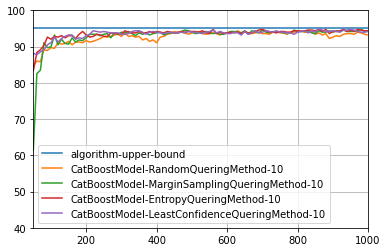

In [48]:
models = ['CatBoostModel']
quering_methods = ['RandomQueringMethod','MarginSamplingQueringMethod','EntropyQueringMethod','LeastConfidenceQueringMethod']
Ks = ['10'] 
repeats = 1

catboost_upper_bound = 95.

total_experiments = len(models) * len(quering_methods) * len(Ks) * repeats


plot_results(catboost_upper_bound, d, ['CatBoostModel'] , quering_methods, Ks, 1)

Prikaz obucavanja modela, pri selektovanju 25 novih elemenata za obuku

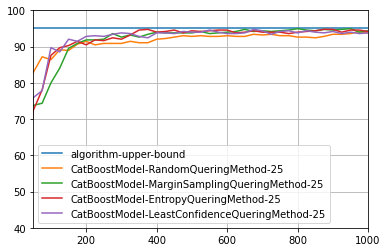

In [49]:
models = ['CatBoostModel']
quering_methods = ['RandomQueringMethod','MarginSamplingQueringMethod','EntropyQueringMethod','LeastConfidenceQueringMethod']
Ks = ['25'] 
repeats = 1

catboost_upper_bound = 95.

total_experiments = len(models) * len(quering_methods) * len(Ks) * repeats


plot_results(catboost_upper_bound, d, ['CatBoostModel'] , quering_methods, Ks, 1)

Prikaz obucavanja modela, pri selektovanju 50 novih elemenata za obuku

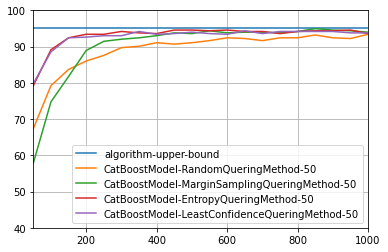

In [51]:
models = ['CatBoostModel']
quering_methods = ['RandomQueringMethod','MarginSamplingQueringMethod','EntropyQueringMethod','LeastConfidenceQueringMethod']
Ks = ['50'] 
repeats = 1

catboost_upper_bound = 95.

total_experiments = len(models) * len(quering_methods) * len(Ks) * repeats


plot_results(catboost_upper_bound, d, ['CatBoostModel'] , quering_methods, Ks, 1)

<h2>XGBoostModel experiments</h2>

In [52]:
max_queried = 1000

repeats = 1


models = [XGBoostModel] 


quering_methods = [RandomQueringMethod,MarginSamplingQueringMethod,EntropyQueringMethod, LeastConfidenceQueringMethod]


Ks = [10,25,50] 

d = {}
stopped_at = -1 


d = experiment(d, models, quering_methods, Ks, repeats, stopped_at+1)
print (d)
results = json.loads(json.dumps(d, indent=2, sort_keys=True))
print(results)

stopping at: 1000
Count = 1, using model = XGBoostModel, quering_method = RandomQueringMethod, k = 10, iteration = 0.
initial train set: (10, 18) (10,) unique(labels): [8 2] [0 1]
Train set: (10, 18) y: (10,)
Val   set: (2049, 18)
Test  set: (515, 18)
training xgboost...
[22:24:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  1

Accuracy for 74.563107 
updated train set: (20, 18) (20,) unique(labels): [17  3] [0 1]
Train set: (20, 18) y: (20,)
Val   set: (2039, 18)
Test  set: (515, 18)
training xgboost...
[22:24:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluatio

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


updated train set: (50, 18) (50,) unique(labels): [37 13] [0 1]
Train set: (50, 18) y: (50,)
Val   set: (2009, 18)
Test  set: (515, 18)
training xgboost...
[22:24:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  5

Accuracy for 86.796117 
updated train set: (60, 18) (60,) unique(labels): [44 16] [0 1]
Train set: (60, 18) y: (60,)
Val   set: (1999, 18)
Test  set: (515, 18)
training xgboost...
[22:24:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric

-----------------------------------
In iteration:  20

Accuracy for 89.708738 
updated train set: (210, 18) (210,) unique(labels): [153  57] [0 1]
Train set: (210, 18) y: (210,)
Val   set: (1849, 18)
Test  set: (515, 18)
training xgboost...
[22:24:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  21

Accuracy for 92.038835 
updated train set: (220, 18) (220,) unique(labels): [161  59] [0 1]
Train set: (220, 18) y: (220,)
Val   set: (1839, 18)
Test  set: (515, 18)
training xgboost...
[22:24:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

-----------------------------------
In iteration:  35

Accuracy for 93.398058 
updated train set: (360, 18) (360,) unique(labels): [264  96] [0 1]
Train set: (360, 18) y: (360,)
Val   set: (1699, 18)
Test  set: (515, 18)
training xgboost...
[22:24:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  36

Accuracy for 92.621359 
updated train set: (370, 18) (370,) unique(labels): [270 100] [0 1]
Train set: (370, 18) y: (370,)
Val   set: (1689, 18)
Test  set: (515, 18)
training xgboost...
[22:24:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

-----------------------------------
In iteration:  51

Accuracy for 92.427184 
updated train set: (520, 18) (520,) unique(labels): [384 136] [0 1]
Train set: (520, 18) y: (520,)
Val   set: (1539, 18)
Test  set: (515, 18)
training xgboost...
[22:24:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  52

Accuracy for 93.398058 
updated train set: (530, 18) (530,) unique(labels): [390 140] [0 1]
Train set: (530, 18) y: (530,)
Val   set: (1529, 18)
Test  set: (515, 18)
training xgboost...
[22:24:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

-----------------------------------
In iteration:  67

Accuracy for 92.038835 
updated train set: (680, 18) (680,) unique(labels): [502 178] [0 1]
Train set: (680, 18) y: (680,)
Val   set: (1379, 18)
Test  set: (515, 18)
training xgboost...
[22:24:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  68

Accuracy for 93.592233 
updated train set: (690, 18) (690,) unique(labels): [512 178] [0 1]
Train set: (690, 18) y: (690,)
Val   set: (1369, 18)
Test  set: (515, 18)
training xgboost...
[22:24:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

[22:24:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  83

Accuracy for 93.203883 
updated train set: (840, 18) (840,) unique(labels): [625 215] [0 1]
Train set: (840, 18) y: (840,)
Val   set: (1219, 18)
Test  set: (515, 18)
training xgboost...
[22:24:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  84

Accuracy for 93.009709 
updated train set: (850, 1

-----------------------------------
In iteration:  98

Accuracy for 93.398058 
updated train set: (990, 18) (990,) unique(labels): [735 255] [0 1]
Train set: (990, 18) y: (990,)
Val   set: (1069, 18)
Test  set: (515, 18)
training xgboost...
[22:24:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  99

Accuracy for 93.009709 
updated train set: (1000, 18) (1000,) unique(labels): [743 257] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training xgboost...
[22:24:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with t

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


-----------------------------------
In iteration:  3

Accuracy for 75.922330 
updated train set: (100, 18) (100,) unique(labels): [74 26] [0 1]
Train set: (100, 18) y: (100,)
Val   set: (1959, 18)
Test  set: (515, 18)
training xgboost...
[22:24:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  4

Accuracy for 84.466019 
updated train set: (125, 18) (125,) unique(labels): [89 36] [0 1]
Train set: (125, 18) y: (125,)
Val   set: (1934, 18)
Test  set: (515, 18)
training xgboost...
[22:24:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objecti

-----------------------------------
In iteration:  19

Accuracy for 91.262136 
updated train set: (500, 18) (500,) unique(labels): [363 137] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training xgboost...
[22:24:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  20

Accuracy for 91.067961 
updated train set: (525, 18) (525,) unique(labels): [379 146] [0 1]
Train set: (525, 18) y: (525,)
Val   set: (1534, 18)
Test  set: (515, 18)
training xgboost...
[22:24:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

-----------------------------------
In iteration:  35

Accuracy for 92.038835 
updated train set: (900, 18) (900,) unique(labels): [662 238] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training xgboost...
[22:24:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  36

Accuracy for 92.038835 
updated train set: (925, 18) (925,) unique(labels): [680 245] [0 1]
Train set: (925, 18) y: (925,)
Val   set: (1134, 18)
Test  set: (515, 18)
training xgboost...
[22:24:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


-----------------------------------
In iteration:  3

Accuracy for 87.378641 
updated train set: (200, 18) (200,) unique(labels): [143  57] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training xgboost...
[22:26:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  4

Accuracy for 88.932039 
updated train set: (250, 18) (250,) unique(labels): [183  67] [0 1]
Train set: (250, 18) y: (250,)
Val   set: (1809, 18)
Test  set: (515, 18)
training xgboost...
[22:26:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the obj

-----------------------------------
In iteration:  19

Accuracy for 93.203883 
updated train set: (1000, 18) (1000,) unique(labels): [756 244] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training xgboost...
[22:26:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  20

Accuracy for 93.592233 
final active learning accuracies [65.24271844660194, 80.3883495145631, 87.37864077669903, 88.93203883495146, 89.126213592233, 90.87378640776699, 91.06796116504854, 91.06796116504854, 92.23300970873787, 92.62135922330097, 93.00970873786409, 92.81553398058252, 91.84466019417475, 92.03883495145631, 91.84466019417475, 92.42718446601941, 91.84466019417

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


updated train set: (20, 18) (20,) unique(labels): [14  6] [0 1]
Train set: (20, 18) y: (20,)
Val   set: (2039, 18)
Test  set: (515, 18)
training xgboost...
[22:26:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  2

Accuracy for 70.873786 
updated train set: (30, 18) (30,) unique(labels): [23  7] [0 1]
Train set: (30, 18) y: (30,)
Val   set: (2029, 18)
Test  set: (515, 18)
training xgboost...
[22:26:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric

updated train set: (180, 18) (180,) unique(labels): [92 88] [0 1]
Train set: (180, 18) y: (180,)
Val   set: (1879, 18)
Test  set: (515, 18)
training xgboost...
[22:26:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  18

Accuracy for 89.902913 
updated train set: (190, 18) (190,) unique(labels): [100  90] [0 1]
Train set: (190, 18) y: (190,)
Val   set: (1869, 18)
Test  set: (515, 18)
training xgboost...
[22:26:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set 

-----------------------------------
In iteration:  33

Accuracy for 93.980583 
updated train set: (340, 18) (340,) unique(labels): [177 163] [0 1]
Train set: (340, 18) y: (340,)
Val   set: (1719, 18)
Test  set: (515, 18)
training xgboost...
[22:26:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  34

Accuracy for 93.592233 
updated train set: (350, 18) (350,) unique(labels): [181 169] [0 1]
Train set: (350, 18) y: (350,)
Val   set: (1709, 18)
Test  set: (515, 18)
training xgboost...
[22:26:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

-----------------------------------
In iteration:  49

Accuracy for 93.203883 
updated train set: (500, 18) (500,) unique(labels): [264 236] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training xgboost...
[22:26:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  50

Accuracy for 93.980583 
updated train set: (510, 18) (510,) unique(labels): [266 244] [0 1]
Train set: (510, 18) y: (510,)
Val   set: (1549, 18)
Test  set: (515, 18)
training xgboost...
[22:26:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

[22:26:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  65

Accuracy for 93.398058 
updated train set: (660, 18) (660,) unique(labels): [343 317] [0 1]
Train set: (660, 18) y: (660,)
Val   set: (1399, 18)
Test  set: (515, 18)
training xgboost...
[22:26:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  66

Accuracy for 93.592233 
updated train set: (670, 1

-----------------------------------
In iteration:  79

Accuracy for 93.786408 
updated train set: (800, 18) (800,) unique(labels): [425 375] [0 1]
Train set: (800, 18) y: (800,)
Val   set: (1259, 18)
Test  set: (515, 18)
training xgboost...
[22:26:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  80

Accuracy for 93.203883 
updated train set: (810, 18) (810,) unique(labels): [433 377] [0 1]
Train set: (810, 18) y: (810,)
Val   set: (1249, 18)
Test  set: (515, 18)
training xgboost...
[22:26:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

updated train set: (950, 18) (950,) unique(labels): [528 422] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training xgboost...
[22:26:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  95

Accuracy for 93.398058 
updated train set: (960, 18) (960,) unique(labels): [533 427] [0 1]
Train set: (960, 18) y: (960,)
Val   set: (1099, 18)
Test  set: (515, 18)
training xgboost...
[22:26:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly se

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


updated train set: (100, 18) (100,) unique(labels): [51 49] [0 1]
Train set: (100, 18) y: (100,)
Val   set: (1959, 18)
Test  set: (515, 18)
training xgboost...
[22:26:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  4

Accuracy for 80.194175 
updated train set: (125, 18) (125,) unique(labels): [55 70] [0 1]
Train set: (125, 18) y: (125,)
Val   set: (1934, 18)
Test  set: (515, 18)
training xgboost...
[22:26:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eva

-----------------------------------
In iteration:  19

Accuracy for 93.980583 
updated train set: (500, 18) (500,) unique(labels): [233 267] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training xgboost...
[22:26:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  20

Accuracy for 93.786408 
updated train set: (525, 18) (525,) unique(labels): [241 284] [0 1]
Train set: (525, 18) y: (525,)
Val   set: (1534, 18)
Test  set: (515, 18)
training xgboost...
[22:26:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

-----------------------------------
In iteration:  34

Accuracy for 93.980583 
updated train set: (875, 18) (875,) unique(labels): [478 397] [0 1]
Train set: (875, 18) y: (875,)
Val   set: (1184, 18)
Test  set: (515, 18)
training xgboost...
[22:26:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  35

Accuracy for 93.786408 
updated train set: (900, 18) (900,) unique(labels): [495 405] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training xgboost...
[22:26:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

initial train set: (50, 18) (50,) unique(labels): [40 10] [0 1]
Train set: (50, 18) y: (50,)
Val   set: (2009, 18)
Test  set: (515, 18)
training xgboost...
[22:27:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  1

Accuracy for 69.320388 
updated train set: (100, 18) (100,) unique(labels): [76 24] [0 1]
Train set: (100, 18) y: (100,)
Val   set: (1959, 18)
Test  set: (515, 18)
training xgboost...
[22:27:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_me

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


-----------------------------------
In iteration:  3

Accuracy for 83.300971 
updated train set: (200, 18) (200,) unique(labels): [113  87] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training xgboost...
[22:27:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  4

Accuracy for 89.902913 
updated train set: (250, 18) (250,) unique(labels): [134 116] [0 1]
Train set: (250, 18) y: (250,)
Val   set: (1809, 18)
Test  set: (515, 18)
training xgboost...
[22:27:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the obj

updated train set: (950, 18) (950,) unique(labels): [569 381] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training xgboost...
[22:27:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  19

Accuracy for 92.427184 
updated train set: (1000, 18) (1000,) unique(labels): [606 394] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training xgboost...
[22:27:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitl

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:27:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  3

Accuracy for 82.912621 
verovatnoce: 
[[0.88464135 0.11535865]
 [0.8479273  0.15207271]
 [0.9552799  0.04472011]
 ...
 [0.9476515  0.0523485 ]
 [0.8479273  0.15207271]
 [0.8479273  0.15207271]]
izracunato: 
[0.51587063 0.6150031  0.2635301  ... 0.29629067 0.6150031  0.6150031 ]
sta je selektovano:
[2004 1281   78 1457 1793  703 1211  490 1372 1353]
updated train set: (40, 18) (40,) unique(labels): [17 23] [0 1]
Train set: (40, 18) y: (40,)
Val   set: (2019, 18)
Test  set: (515, 18)
training xgboost...
[22:27:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc

verovatnoce: 
[[0.9965779  0.00342206]
 [0.9947312  0.00526884]
 [0.998914   0.00108601]
 ...
 [0.7569956  0.2430044 ]
 [0.97430295 0.02569706]
 [0.9982182  0.00178182]]
izracunato: 
[0.0329584  0.04745739 0.01225954 ... 0.8000009  0.17233092 0.01884067]
sta je selektovano:
[ 569  892  476    6 1026  766  590  313  582 1207]
updated train set: (130, 18) (130,) unique(labels): [60 70] [0 1]
Train set: (130, 18) y: (130,)
Val   set: (1929, 18)
Test  set: (515, 18)
training xgboost...
[22:27:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  13

Accuracy for 90.873786 
verovatnoce: 
[[9.8747027e-01 1.2529713e-02]
 [9.9597412e-01 4.0258914e-03]
 [9.9914682e-01 8.5315382e-04]


-----------------------------------
In iteration:  22

Accuracy for 92.233010 
verovatnoce: 
[[9.9680132e-01 3.1986695e-03]
 [9.9902076e-01 9.7923225e-04]
 [9.9958247e-01 4.1754972e-04]
 ...
 [9.6921861e-01 3.0781403e-02]
 [9.9342048e-01 6.5795253e-03]
 [9.9932212e-01 6.7789742e-04]]
izracunato: 
[0.03111891 0.01120052 0.00528956 ... 0.19829553 0.05714803 0.00811363]
sta je selektovano:
[ 188  552   76 1644 1762 1596 1649  124  500 1268]
updated train set: (230, 18) (230,) unique(labels): [113 117] [0 1]
Train set: (230, 18) y: (230,)
Val   set: (1829, 18)
Test  set: (515, 18)
training xgboost...
[22:27:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  23

Accuracy for 9

-----------------------------------
In iteration:  32

Accuracy for 93.009709 
verovatnoce: 
[[9.9631250e-01 3.6875010e-03]
 [9.9947792e-01 5.2210386e-04]
 [9.9954438e-01 4.5562480e-04]
 ...
 [1.8036962e-03 9.9819630e-01]
 [9.6901226e-01 3.0987732e-02]
 [9.9935442e-01 6.4554927e-04]]
izracunato: 
[0.03511671 0.0064457  0.00571454 ... 0.01904022 0.19932136 0.00777208]
sta je selektovano:
[1404 1718 1101  525  436  240 1426 1623  662  223]
updated train set: (330, 18) (330,) unique(labels): [162 168] [0 1]
Train set: (330, 18) y: (330,)
Val   set: (1729, 18)
Test  set: (515, 18)
training xgboost...
[22:27:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  33

Accuracy for 9

-----------------------------------
In iteration:  42

Accuracy for 93.980583 
verovatnoce: 
[[9.99273598e-01 7.26378814e-04]
 [9.99807775e-01 1.92225853e-04]
 [9.99549687e-01 4.50296677e-04]
 ...
 [3.35097313e-04 9.99664903e-01]
 [9.88444388e-01 1.15556335e-02]
 [9.99902546e-01 9.74598661e-05]]
izracunato: 
[0.00862154 0.00265031 0.00565539 ... 0.00435144 0.09093803 0.00143923]
sta je selektovano:
[ 150  446   13 1630  312  146  763 1084  914 1167]
updated train set: (430, 18) (430,) unique(labels): [221 209] [0 1]
Train set: (430, 18) y: (430,)
Val   set: (1629, 18)
Test  set: (515, 18)
training xgboost...
[22:27:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  43

Ac

-----------------------------------
In iteration:  52

Accuracy for 94.174757 
verovatnoce: 
[[9.9966216e-01 3.3784445e-04]
 [9.9991643e-01 8.3593870e-05]
 [9.9996936e-01 3.0628733e-05]
 ...
 [1.4190674e-03 9.9858093e-01]
 [9.9933434e-01 6.6564302e-04]
 [9.9996400e-01 3.5984041e-05]]
izracunato: 
[0.00438312 0.00125294 0.00050347 ... 0.0154714  0.00798454 0.00058314]
sta je selektovano:
[ 565 1517 1172   70  147 1009   40 1079  741  573]
updated train set: (530, 18) (530,) unique(labels): [278 252] [0 1]
Train set: (530, 18) y: (530,)
Val   set: (1529, 18)
Test  set: (515, 18)
training xgboost...
[22:27:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  53

Accuracy for 9

-----------------------------------
In iteration:  62

Accuracy for 93.203883 
verovatnoce: 
[[9.9941087e-01 5.8910355e-04]
 [9.9991727e-01 8.2726168e-05]
 [9.9997497e-01 2.5055675e-05]
 ...
 [1.1090636e-03 9.9889094e-01]
 [9.9888158e-01 1.1183944e-03]
 [9.9992383e-01 7.6149736e-05]]
izracunato: 
[0.00717029 0.00124123 0.00041908 ... 0.01248621 0.01257778 0.00115168]
sta je selektovano:
[ 762  214  981  888 1018 1391  281  989  577 1239]
updated train set: (630, 18) (630,) unique(labels): [332 298] [0 1]
Train set: (630, 18) y: (630,)
Val   set: (1429, 18)
Test  set: (515, 18)
training xgboost...
[22:27:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  63

Accuracy for 9

[22:27:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  72

Accuracy for 93.786408 
verovatnoce: 
[[9.9972504e-01 2.7493786e-04]
 [9.9996966e-01 3.0313045e-05]
 [9.9998122e-01 1.8756540e-05]
 ...
 [2.9000044e-03 9.9710000e-01]
 [9.9933040e-01 6.6959835e-04]
 [9.9996954e-01 3.0456684e-05]]
izracunato: 
[0.00364876 0.00049876 0.00032161 ... 0.028624   0.00802623 0.00050088]
sta je selektovano:
[  16  350 1295  176  789  346  889 1202  130  792]
updated train set: (730, 18) (730,) unique(labels): [379 351] [0 1]
Train set: (730, 18) y: (730,)
Val   set: (1329, 18)
Test  set: (515, 18)
training xgboost...
[22:27:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgbo

Train set: (810, 18) y: (810,)
Val   set: (1249, 18)
Test  set: (515, 18)
training xgboost...
[22:27:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  81

Accuracy for 94.368932 
verovatnoce: 
[[9.9984980e-01 1.5019617e-04]
 [9.9997121e-01 2.8764856e-05]
 [9.9990422e-01 9.5762749e-05]
 ...
 [9.9997109e-01 2.8891263e-05]
 [9.9915016e-01 8.4986730e-04]
 [9.9997383e-01 2.6179256e-05]]
izracunato: 
[0.0021243  0.00047546 0.00141663 ... 0.00047736 0.00989459 0.00043623]
sta je selektovano:
[ 150  242  460 1061  282  823  128  123  670  483]
updated train set: (820, 18) (820,) unique(labels): [441 379] [0 1]
Train set: (820, 18) y: (820,)
Val   set: (1239, 18)
Test  set: (515,

verovatnoce: 
[[9.9944580e-01 5.5419485e-04]
 [9.9982315e-01 1.7682368e-04]
 [9.9990201e-01 9.8003104e-05]
 ...
 [9.9996084e-01 3.9152004e-05]
 [9.9846852e-01 1.5314711e-03]
 [9.9993742e-01 6.2572683e-05]]
izracunato: 
[0.00679423 0.00245929 0.00144645 ... 0.0006297  0.01652835 0.00096406]
sta je selektovano:
[ 785  598   18  335  565  777  167 1115   24  701]
updated train set: (910, 18) (910,) unique(labels): [515 395] [0 1]
Train set: (910, 18) y: (910,)
Val   set: (1149, 18)
Test  set: (515, 18)
training xgboost...
[22:27:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  91

Accuracy for 93.398058 
verovatnoce: 
[[9.9977279e-01 2.2723894e-04]
 [9.9992210e-01 7.788313

verovatnoce: 
[[9.9974835e-01 2.5167438e-04]
 [9.9986428e-01 1.3569160e-04]
 [9.9994373e-01 5.6295448e-05]
 ...
 [9.9996769e-01 3.2286014e-05]
 [9.9802947e-01 1.9705156e-03]
 [9.9995929e-01 4.0715036e-05]]
izracunato: 
[0.00337207 0.00193907 0.00087588 ... 0.00052827 0.02054951 0.00065252]
sta je selektovano:
[  52   38 1067  912  106  714 1038  574  375  580]
updated train set: (1000, 18) (1000,) unique(labels): [583 417] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training xgboost...
[22:27:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  100

Accuracy for 93.786408 
final active learning accuracies [74.5631067961165, 81.747572815

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


-----------------------------------
In iteration:  2

Accuracy for 77.087379 
verovatnoce: 
[[0.61800826 0.38199177]
 [0.86127186 0.13872816]
 [0.9762686  0.02373143]
 ...
 [0.9848955  0.01510445]
 [0.94524634 0.05475367]
 [0.5387598  0.46124017]]
izracunato: 
[0.95943654 0.5808982  0.16190755 ... 0.11299077 0.30625686 0.9956609 ]
sta je selektovano:
[ 456  357 1004  209 1045 1814  983 1774  206  310 1895 1804  423  602
 1937 1752 1573  991 1252 1272  663 1608  912  885  210]
updated train set: (75, 18) (75,) unique(labels): [51 24] [0 1]
Train set: (75, 18) y: (75,)
Val   set: (1984, 18)
Test  set: (515, 18)
training xgboost...
[22:27:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------


-----------------------------------
In iteration:  12

Accuracy for 93.009709 
verovatnoce: 
[[0.97738445 0.02261554]
 [0.9898884  0.01011156]
 [0.98701614 0.01298385]
 ...
 [0.9625429  0.0374571 ]
 [0.9962712  0.00372883]
 [0.9731686  0.02683141]]
izracunato: 
[0.15588437 0.08153182 0.0999812  ... 0.23050907 0.03545016 0.17824368]
sta je selektovano:
[ 269  765  578 1009 1747 1186 1611 1736 1573 1489 1430 1412  104  242
  210 1475  944 1305 1578 1246  907 1498 1316  438 1627]
updated train set: (325, 18) (325,) unique(labels): [173 152] [0 1]
Train set: (325, 18) y: (325,)
Val   set: (1734, 18)
Test  set: (515, 18)
training xgboost...
[22:27:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------

-----------------------------------
In iteration:  22

Accuracy for 93.009709 
verovatnoce: 
[[0.9970711  0.00292891]
 [0.9959531  0.00404694]
 [0.9885627  0.01143728]
 ...
 [0.96798885 0.03201113]
 [0.99547654 0.00452344]
 [0.9759846  0.02401545]]
izracunato: 
[0.02886733 0.0379956  0.09017754 ... 0.20437944 0.04174139 0.1634281 ]
sta je selektovano:
[1447  598  942  814  828 1044  310 1348  259  921   34 1079  563  503
   76  873 1414 1247  555 1453 1078  689  794 1065 1226]
updated train set: (575, 18) (575,) unique(labels): [338 237] [0 1]
Train set: (575, 18) y: (575,)
Val   set: (1484, 18)
Test  set: (515, 18)
training xgboost...
[22:27:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------

-----------------------------------
In iteration:  32

Accuracy for 93.203883 
verovatnoce: 
[[9.9653572e-01 3.4642678e-03]
 [9.9820101e-01 1.7990025e-03]
 [9.9928939e-01 7.1062427e-04]
 ...
 [1.4019012e-04 9.9985981e-01]
 [9.9888384e-01 1.1161637e-03]
 [9.9698949e-01 3.0104925e-03]]
izracunato: 
[0.03330351 0.01899742 0.00845698 ... 0.00199672 0.01255586 0.02955194]
sta je selektovano:
[ 868  462  474  420  816   80  105  520  128  767  222  638  882  253
  950  476  120 1179 1248  785  586  548  562  177  772]
updated train set: (825, 18) (825,) unique(labels): [527 298] [0 1]
Train set: (825, 18) y: (825,)
Val   set: (1234, 18)
Test  set: (515, 18)
training xgboost...
[22:27:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old beh

saved Active-learning-experiment-8.pkl C:\Users\Mihajlo\Desktop\Mihajlo\faks\4 godina\diplomski ['.ipynb_checkpoints', 'Active-learning-experiment-1.pkl', 'Active-learning-experiment-10.pkl', 'Active-learning-experiment-11.pkl', 'Active-learning-experiment-12.pkl', 'Active-learning-experiment-2.pkl', 'Active-learning-experiment-3.pkl', 'Active-learning-experiment-4.pkl', 'Active-learning-experiment-5.pkl', 'Active-learning-experiment-6.pkl', 'Active-learning-experiment-7.pkl', 'Active-learning-experiment-8.pkl', 'Active-learning-experiment-9.pkl', 'catboost_info', 'Dataset', 'God class - active learning.ipynb', 'God class.ipynb', 'Long methode - active learning.ipynb', 'Long methode.ipynb', 'na gitu', 'slike']

---------------------------- FINISHED ---------------------------

Count = 9, using model = XGBoostModel, quering_method = EntropyQueringMethod, k = 50, iteration = 0.
initial train set: (50, 18) (50,) unique(labels): [37 13] [0 1]
Train set: (50, 18) y: (50,)
Val   set: (2009, 

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


-----------------------------------
In iteration:  3

Accuracy for 90.485437 
verovatnoce: 
[[0.9759491  0.0240509 ]
 [0.99657613 0.00342389]
 [0.94735    0.05264995]
 ...
 [0.9363563  0.0636437 ]
 [0.9859398  0.01406018]
 [0.96864647 0.03135351]]
izracunato: 
[0.16361754 0.0329733  0.29754886 ... 0.34174234 0.1066429  0.2011349 ]
sta je selektovano:
[1220  919 1062  590  376  421 1659 1567 1241 1806 1290  103 1413  121
  638 1854 1221 1609  834 1280  472 1157  970 1004 1550   80  270 1808
  909 1471 1427  566 1850  391 1555 1584  968  785 1877  765 1263 1467
  221  263 1665  546  536 1785 1264 1759]
updated train set: (200, 18) (200,) unique(labels): [112  88] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training xgboost...
[22:29:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed 

-----------------------------------
In iteration:  11

Accuracy for 93.786408 
verovatnoce: 
[[0.98918605 0.01081392]
 [0.99684083 0.00315916]
 [0.9980967  0.00190328]
 ...
 [0.9827826  0.01721738]
 [0.9719631  0.02803687]
 [0.9936118  0.00638816]]
izracunato: 
[0.08614194 0.03079124 0.01994373 ... 0.12551808 0.18444927 0.05575887]
sta je selektovano:
[1011  131  455 1145  612  493  177 1006  949 1122  899 1372 1005 1430
  940 1198  279 1078 1251  218 1489  544  816 1364  533  954  895  437
  276  765  489 1436  113 1239  207  995 1000   37 1156 1405  425  196
  132  882 1225  627 1323 1438  567  345]
updated train set: (600, 18) (600,) unique(labels): [356 244] [0 1]
Train set: (600, 18) y: (600,)
Val   set: (1459, 18)
Test  set: (515, 18)
training xgboost...
[22:29:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed

-----------------------------------
In iteration:  19

Accuracy for 92.815534 
verovatnoce: 
[[9.9835175e-01 1.6482531e-03]
 [9.9979371e-01 2.0628396e-04]
 [9.9948418e-01 5.1581830e-04]
 ...
 [4.0155649e-04 9.9959844e-01]
 [9.9818772e-01 1.8123026e-03]
 [9.9539447e-01 4.6055154e-03]]
izracunato: 
[0.0176138  0.00282314 0.00637715 ... 0.00510961 0.01911858 0.04237901]
sta je selektovano:
[ 627  471  523 1054  159  603  302  677  732  378  754  362  999  669
   15  103  260  654  584  717  671  313  330  173  411  893  620 1023
  367  517  613  646 1108  720  465   17  855  860  301 1033  756  237
  651  731 1069 1061  862  976  955  771]
updated train set: (1000, 18) (1000,) unique(labels): [648 352] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training xgboost...
[22:29:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:29:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  3

Accuracy for 80.582524 
updated train set: (40, 18) (40,) unique(labels): [24 16] [0 1]
Train set: (40, 18) y: (40,)
Val   set: (2019, 18)
Test  set: (515, 18)
training xgboost...
[22:29:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  4

Accuracy for 81.165049 
updated train set: (50, 18) (50,) 

-----------------------------------
In iteration:  18

Accuracy for 90.291262 
updated train set: (190, 18) (190,) unique(labels): [106  84] [0 1]
Train set: (190, 18) y: (190,)
Val   set: (1869, 18)
Test  set: (515, 18)
training xgboost...
[22:29:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  19

Accuracy for 89.708738 
updated train set: (200, 18) (200,) unique(labels): [109  91] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training xgboost...
[22:29:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

-----------------------------------
In iteration:  34

Accuracy for 93.786408 
updated train set: (350, 18) (350,) unique(labels): [175 175] [0 1]
Train set: (350, 18) y: (350,)
Val   set: (1709, 18)
Test  set: (515, 18)
training xgboost...
[22:29:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  35

Accuracy for 93.592233 
updated train set: (360, 18) (360,) unique(labels): [180 180] [0 1]
Train set: (360, 18) y: (360,)
Val   set: (1699, 18)
Test  set: (515, 18)
training xgboost...
[22:29:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

updated train set: (500, 18) (500,) unique(labels): [268 232] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training xgboost...
[22:29:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  50

Accuracy for 94.174757 
updated train set: (510, 18) (510,) unique(labels): [272 238] [0 1]
Train set: (510, 18) y: (510,)
Val   set: (1549, 18)
Test  set: (515, 18)
training xgboost...
[22:29:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly se

-----------------------------------
In iteration:  64

Accuracy for 93.786408 
updated train set: (650, 18) (650,) unique(labels): [357 293] [0 1]
Train set: (650, 18) y: (650,)
Val   set: (1409, 18)
Test  set: (515, 18)
training xgboost...
[22:29:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  65

Accuracy for 93.592233 
updated train set: (660, 18) (660,) unique(labels): [362 298] [0 1]
Train set: (660, 18) y: (660,)
Val   set: (1399, 18)
Test  set: (515, 18)
training xgboost...
[22:29:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

-----------------------------------
In iteration:  80

Accuracy for 93.203883 
updated train set: (810, 18) (810,) unique(labels): [470 340] [0 1]
Train set: (810, 18) y: (810,)
Val   set: (1249, 18)
Test  set: (515, 18)
training xgboost...
[22:29:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  81

Accuracy for 93.203883 
updated train set: (820, 18) (820,) unique(labels): [476 344] [0 1]
Train set: (820, 18) y: (820,)
Val   set: (1239, 18)
Test  set: (515, 18)
training xgboost...
[22:29:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

Train set: (960, 18) y: (960,)
Val   set: (1099, 18)
Test  set: (515, 18)
training xgboost...
[22:29:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  96

Accuracy for 93.592233 
updated train set: (970, 18) (970,) unique(labels): [573 397] [0 1]
Train set: (970, 18) y: (970,)
Val   set: (1089, 18)
Test  set: (515, 18)
training xgboost...
[22:29:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------

}

---------------------------- FINISHED ---------------------------

Count = 11, using model = XGBoostModel, quering_method = LeastConfidenceQueringMethod, k = 25, iteration = 0.
initial train set: (25, 18) (25,) unique(labels): [18  7] [0 1]
Train set: (25, 18) y: (25,)
Val   set: (2034, 18)
Test  set: (515, 18)
training xgboost...
[22:29:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  1

Accuracy for 46.213592 
updated train set: (50, 18) (50,) unique(labels): [42  8] [0 1]
Train set: (50, 18) y: (50,)
Val   set: (2009, 18)
Test  set: (515, 18)
training xgboost...
[22:29:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\l

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


-----------------------------------
In iteration:  3

Accuracy for 75.533981 
updated train set: (100, 18) (100,) unique(labels): [76 24] [0 1]
Train set: (100, 18) y: (100,)
Val   set: (1959, 18)
Test  set: (515, 18)
training xgboost...
[22:29:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  4

Accuracy for 79.223301 
updated train set: (125, 18) (125,) unique(labels): [91 34] [0 1]
Train set: (125, 18) y: (125,)
Val   set: (1934, 18)
Test  set: (515, 18)
training xgboost...
[22:29:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objecti

-----------------------------------
In iteration:  19

Accuracy for 93.009709 
updated train set: (500, 18) (500,) unique(labels): [287 213] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training xgboost...
[22:29:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  20

Accuracy for 93.009709 
updated train set: (525, 18) (525,) unique(labels): [299 226] [0 1]
Train set: (525, 18) y: (525,)
Val   set: (1534, 18)
Test  set: (515, 18)
training xgboost...
[22:29:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

[22:29:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  34

Accuracy for 94.174757 
updated train set: (875, 18) (875,) unique(labels): [543 332] [0 1]
Train set: (875, 18) y: (875,)
Val   set: (1184, 18)
Test  set: (515, 18)
training xgboost...
[22:29:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  35

Accuracy for 93.203883 
updated train set: (900, 1

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


updated train set: (150, 18) (150,) unique(labels): [104  46] [0 1]
Train set: (150, 18) y: (150,)
Val   set: (1909, 18)
Test  set: (515, 18)
training xgboost...
[22:29:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  3

Accuracy for 81.941748 
updated train set: (200, 18) (200,) unique(labels): [132  68] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training xgboost...
[22:29:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set

Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training xgboost...
[22:29:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------------------------------
In iteration:  18

Accuracy for 93.398058 
updated train set: (950, 18) (950,) unique(labels): [620 330] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training xgboost...
[22:29:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-----------

Prikaz obucavanja modela, pri selektovanju 10 novih elemenata za obuku

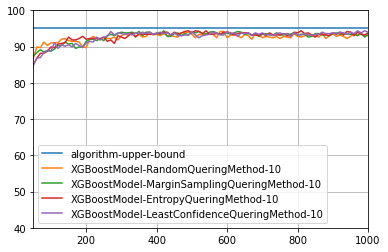

In [56]:
models = ['XGBoostModel']
quering_methods = ['RandomQueringMethod','MarginSamplingQueringMethod','EntropyQueringMethod','LeastConfidenceQueringMethod']
Ks = ['10'] 
repeats = 1
upper_bound = 95.

total_experiments = len(models) * len(quering_methods) * len(Ks) * repeats


plot_results(upper_bound, d, ['XGBoostModel'] , quering_methods  , Ks, 1)

Prikaz obucavanja modela, pri selektovanju 50 novih elemenata za obuku

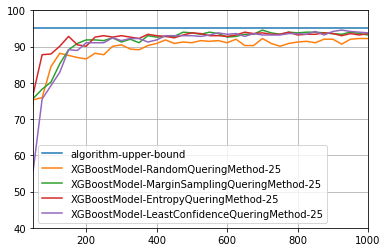

In [57]:
models = ['XGBoostModel']
quering_methods = ['RandomQueringMethod','MarginSamplingQueringMethod','EntropyQueringMethod','LeastConfidenceQueringMethod']
Ks = ['25'] 
repeats = 1
upper_bound = 95.

total_experiments = len(models) * len(quering_methods) * len(Ks) * repeats


plot_results(upper_bound, d, ['XGBoostModel'] , quering_methods  , Ks, 1)

Prikaz obucavanja modela, pri selektovanju 50 novih elemenata za obuku

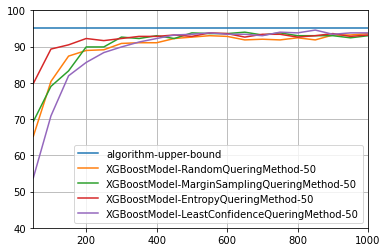

In [58]:
models = ['XGBoostModel']
quering_methods = ['RandomQueringMethod','MarginSamplingQueringMethod','EntropyQueringMethod','LeastConfidenceQueringMethod']
Ks = ['50'] 
repeats = 1
upper_bound = 95.

total_experiments = len(models) * len(quering_methods) * len(Ks) * repeats


plot_results(upper_bound, d, ['XGBoostModel'] , quering_methods  , Ks, 1)

<h2>BaggingModel experiments</h2>

In [59]:
max_queried = 1000

repeats = 1


models = [BaggingModel] 


quering_methods = [RandomQueringMethod,MarginSamplingQueringMethod,EntropyQueringMethod, LeastConfidenceQueringMethod]


Ks = [10,25,50] 

d = {}
stopped_at = -1 

d = experiment(d, models, quering_methods, Ks, repeats, stopped_at+1)
print (d)
results = json.loads(json.dumps(d, indent=2, sort_keys=True))
print(results)

stopping at: 1000
Count = 1, using model = BaggingModel, quering_method = RandomQueringMethod, k = 10, iteration = 0.
initial train set: (10, 18) (10,) unique(labels): [8 2] [0 1]
Train set: (10, 18) y: (10,)
Val   set: (2049, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  1

Accuracy for 64.660194 
updated train set: (20, 18) (20,) unique(labels): [15  5] [0 1]
Train set: (20, 18) y: (20,)
Val   set: (2039, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  2

Accuracy for 78.640777 
updated train set: (30, 18) (30,) unique(labels): [22  8] [0 1]
Train set: (30, 18) y: (30,)
Val   set: (2029, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  3

Accuracy for 83.689320 
updated train set: (40, 18) (40,) unique(labels): [30 10] [0 1]
Train set: (40, 18) y: (40,)
Val   set: (2019, 18)
Test  set: (515, 18)
training bagging model...
--

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  23

Accuracy for 89.514563 
updated train set: (240, 18) (240,) unique(labels): [168  72] [0 1]
Train set: (240, 18) y: (240,)
Val   set: (1819, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  24

Accuracy for 89.708738 
updated train set: (250, 18) (250,) unique(labels): [177  73] [0 1]
Train set: (250, 18) y: (250,)
Val   set: (1809, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  25

Accuracy for 89.708738 
updated train set: (260, 18) (260,) unique(labels): [185  75] [0 1]
Train set: (260, 18) y: (260,)
Val   set: (1799, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  26

Accuracy for 89.514563 
updated train set: (270, 18) (270,) unique(labels): [192  78] [0 1]
Train set: (270, 18) y: (270,)
Val   set: (1789, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  27

Accuracy for 89.902913 
updated train set: (280, 18) (280,) unique(labels): [200  80] [0 1]
Train set: (280, 18) y: (280,)
Val   set: (1779, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  28

Accuracy for 89.902913 
updated train set: (290, 18) (290,) unique(labels): [208  82] [0 1]
Train set: (290, 18) y: (290,)
Val   set: (1769, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  29

Accuracy for 89.708738 
updated train set: (300, 18) (300,) unique(labels): [215  85] [0 1]
Train set: (300, 18) y: (300,)
Val   set: (1759, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  30

Accuracy for 90.097087 
updated train set: (310, 18) (310,) unique(labels): [222  88] [0 1]
Train set: (310, 18) y: (310,)
Val   set: (1749, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  31

Accuracy for 89.902913 
updated train set: (320, 18) (320,) unique(labels): [225  95] [0 1]
Train set: (320, 18) y: (320,)
Val   set: (1739, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  32

Accuracy for 90.485437 
updated train set: (330, 18) (330,) unique(labels): [234  96] [0 1]
Train set: (330, 18) y: (330,)
Val   set: (1729, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  33

Accuracy for 90.485437 
updated train set: (340, 18) (340,) unique(labels): [241  99] [0 1]
Train set: (340, 18) y: (340,)
Val   set: (1719, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  34

Accuracy for 90.291262 
updated train set: (350, 18) (350,) unique(labels): [251  99] [0 1]
Train set: (350, 18) y: (350,)
Val   set: (1709, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  35

Accuracy for 90.679612 
updated train set: (360, 18) (360,) unique(labels): [259 101] [0 1]
Train set: (360, 18) y: (360,)
Val   set: (1699, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  36

Accuracy for 90.485437 
updated train set: (370, 18) (370,) unique(labels): [266 104] [0 1]
Train set: (370, 18) y: (370,)
Val   set: (1689, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  37

Accuracy for 90.679612 
updated train set: (380, 18) (380,) unique(labels): [276 104] [0 1]
Train set: (380, 18) y: (380,)
Val   set: (1679, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  38

Accuracy for 90.291262 
updated train set: (390, 18) (390,) unique(labels): [283 107] [0 1]
Train set: (390, 18) y: (390,)
Val   set: (1669, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  39

Accuracy for 90.485437 
updated train set: (400, 18) (400,) unique(labels): [291 109] [0 1]
Train set: (400, 18) y: (400,)
Val   set: (1659, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  40

Accuracy for 90.291262 
updated train set: (410, 18) (410,) unique(labels): [297 113] [0 1]
Train set: (410, 18) y: (410,)
Val   set: (1649, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  41

Accuracy for 90.097087 
updated train set: (420, 18) (420,) unique(labels): [304 116] [0 1]
Train set: (420, 18) y: (420,)
Val   set: (1639, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  42

Accuracy for 89.708738 
updated train set: (430, 18) (430,) unique(labels): [310 120] [0 1]
Train set: (430, 18) y: (430,)
Val   set: (1629, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  43

Accuracy for 89.902913 
updated train set: (440, 18) (440,) unique(labels): [316 124] [0 1]
Train set: (440, 18) y: (440,)
Val   set: (1619, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  44

Accuracy for 89.514563 
updated train set: (450, 18) (450,) unique(labels): [322 128] [0 1]
Train set: (450, 18) y: (450,)
Val   set: (1609, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  45

Accuracy for 89.320388 
updated train set: (460, 18) (460,) unique(labels): [327 133] [0 1]
Train set: (460, 18) y: (460,)
Val   set: (1599, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  46

Accuracy for 89.320388 
updated train set: (470, 18) (470,) unique(labels): [332 138] [0 1]
Train set: (470, 18) y: (470,)
Val   set: (1589, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  47

Accuracy for 89.514563 
updated train set: (480, 18) (480,) unique(labels): [340 140] [0 1]
Train set: (480, 18) y: (480,)
Val   set: (1579, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  48

Accuracy for 89.902913 
updated train set: (490, 18) (490,) unique(labels): [347 143] [0 1]
Train set: (490, 18) y: (490,)
Val   set: (1569, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  49

Accuracy for 89.902913 
updated train set: (500, 18) (500,) unique(labels): [355 145] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  50

Accuracy for 89.902913 
updated train set: (510, 18) (510,) unique(labels): [363 147] [0 1]
Train set: (510, 18) y: (510,)
Val   set: (1549, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  51

Accuracy for 89.902913 
updated train set: (520, 18) (520,) unique(labels): [369 151] [0 1]
Train set: (520, 18) y: (520,)
Val   set: (1539, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  52

Accuracy for 90.097087 
updated train set: (530, 18) (530,) unique(labels): [377 153] [0 1]
Train set: (530, 18) y: (530,)
Val   set: (1529, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  53

Accuracy for 89.708738 
updated train set: (540, 18) (540,) unique(labels): [385 155] [0 1]
Train set: (540, 18) y: (540,)
Val   set: (1519, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  54

Accuracy for 89.708738 
updated train set: (550, 18) (550,) unique(labels): [394 156] [0 1]
Train set: (550, 18) y: (550,)
Val   set: (1509, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  55

Accuracy for 89.708738 
updated train set: (560, 18) (560,) unique(labels): [404 156] [0 1]
Train set: (560, 18) y: (560,)
Val   set: (1499, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  56

Accuracy for 89.708738 
updated train set: (570, 18) (570,) unique(labels): [412 158] [0 1]
Train set: (570, 18) y: (570,)
Val   set: (1489, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  57

Accuracy for 89.708738 
updated train set: (580, 18) (580,) unique(labels): [418 162] [0 1]
Train set: (580, 18) y: (580,)
Val   set: (1479, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  58

Accuracy for 90.485437 
updated train set: (590, 18) (590,) unique(labels): [424 166] [0 1]
Train set: (590, 18) y: (590,)
Val   set: (1469, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  59

Accuracy for 90.679612 
updated train set: (600, 18) (600,) unique(labels): [430 170] [0 1]
Train set: (600, 18) y: (600,)
Val   set: (1459, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  60

Accuracy for 90.485437 
updated train set: (610, 18) (610,) unique(labels): [437 173] [0 1]
Train set: (610, 18) y: (610,)
Val   set: (1449, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  61

Accuracy for 90.097087 
updated train set: (620, 18) (620,) unique(labels): [446 174] [0 1]
Train set: (620, 18) y: (620,)
Val   set: (1439, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  62

Accuracy for 90.485437 
updated train set: (630, 18) (630,) unique(labels): [453 177] [0 1]
Train set: (630, 18) y: (630,)
Val   set: (1429, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  63

Accuracy for 90.679612 
updated train set: (640, 18) (640,) unique(labels): [463 177] [0 1]
Train set: (640, 18) y: (640,)
Val   set: (1419, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  64

Accuracy for 90.873786 
updated train set: (650, 18) (650,) unique(labels): [470 180] [0 1]
Train set: (650, 18) y: (650,)
Val   set: (1409, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  65

Accuracy for 90.679612 
updated train set: (660, 18) (660,) unique(labels): [476 184] [0 1]
Train set: (660, 18) y: (660,)
Val   set: (1399, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  66

Accuracy for 90.485437 
updated train set: (670, 18) (670,) unique(labels): [484 186] [0 1]
Train set: (670, 18) y: (670,)
Val   set: (1389, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  67

Accuracy for 90.679612 
updated train set: (680, 18) (680,) unique(labels): [494 186] [0 1]
Train set: (680, 18) y: (680,)
Val   set: (1379, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  68

Accuracy for 90.679612 
updated train set: (690, 18) (690,) unique(labels): [502 188] [0 1]
Train set: (690, 18) y: (690,)
Val   set: (1369, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  69

Accuracy for 91.067961 
updated train set: (700, 18) (700,) unique(labels): [508 192] [0 1]
Train set: (700, 18) y: (700,)
Val   set: (1359, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  70

Accuracy for 90.873786 
updated train set: (710, 18) (710,) unique(labels): [515 195] [0 1]
Train set: (710, 18) y: (710,)
Val   set: (1349, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  71

Accuracy for 91.262136 
updated train set: (720, 18) (720,) unique(labels): [521 199] [0 1]
Train set: (720, 18) y: (720,)
Val   set: (1339, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  72

Accuracy for 91.456311 
updated train set: (730, 18) (730,) unique(labels): [530 200] [0 1]
Train set: (730, 18) y: (730,)
Val   set: (1329, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  73

Accuracy for 91.650485 
updated train set: (740, 18) (740,) unique(labels): [538 202] [0 1]
Train set: (740, 18) y: (740,)
Val   set: (1319, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  74

Accuracy for 92.038835 
updated train set: (750, 18) (750,) unique(labels): [545 205] [0 1]
Train set: (750, 18) y: (750,)
Val   set: (1309, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  75

Accuracy for 92.038835 
updated train set: (760, 18) (760,) unique(labels): [554 206] [0 1]
Train set: (760, 18) y: (760,)
Val   set: (1299, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  76

Accuracy for 92.038835 
updated train set: (770, 18) (770,) unique(labels): [563 207] [0 1]
Train set: (770, 18) y: (770,)
Val   set: (1289, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  77

Accuracy for 92.233010 
updated train set: (780, 18) (780,) unique(labels): [572 208] [0 1]
Train set: (780, 18) y: (780,)
Val   set: (1279, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  78

Accuracy for 92.038835 
updated train set: (790, 18) (790,) unique(labels): [580 210] [0 1]
Train set: (790, 18) y: (790,)
Val   set: (1269, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  79

Accuracy for 92.233010 
updated train set: (800, 18) (800,) unique(labels): [588 212] [0 1]
Train set: (800, 18) y: (800,)
Val   set: (1259, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  80

Accuracy for 92.038835 
updated train set: (810, 18) (810,) unique(labels): [596 214] [0 1]
Train set: (810, 18) y: (810,)
Val   set: (1249, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  81

Accuracy for 92.038835 
updated train set: (820, 18) (820,) unique(labels): [600 220] [0 1]
Train set: (820, 18) y: (820,)
Val   set: (1239, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  82

Accuracy for 92.233010 
updated train set: (830, 18) (830,) unique(labels): [608 222] [0 1]
Train set: (830, 18) y: (830,)
Val   set: (1229, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  83

Accuracy for 92.233010 
updated train set: (840, 18) (840,) unique(labels): [616 224] [0 1]
Train set: (840, 18) y: (840,)
Val   set: (1219, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  84

Accuracy for 92.038835 
updated train set: (850, 18) (850,) unique(labels): [625 225] [0 1]
Train set: (850, 18) y: (850,)
Val   set: (1209, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  85

Accuracy for 91.844660 
updated train set: (860, 18) (860,) unique(labels): [632 228] [0 1]
Train set: (860, 18) y: (860,)
Val   set: (1199, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  86

Accuracy for 91.844660 
updated train set: (870, 18) (870,) unique(labels): [640 230] [0 1]
Train set: (870, 18) y: (870,)
Val   set: (1189, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  87

Accuracy for 91.844660 
updated train set: (880, 18) (880,) unique(labels): [647 233] [0 1]
Train set: (880, 18) y: (880,)
Val   set: (1179, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  88

Accuracy for 91.844660 
updated train set: (890, 18) (890,) unique(labels): [654 236] [0 1]
Train set: (890, 18) y: (890,)
Val   set: (1169, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  89

Accuracy for 91.650485 
updated train set: (900, 18) (900,) unique(labels): [662 238] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  90

Accuracy for 91.456311 
updated train set: (910, 18) (910,) unique(labels): [667 243] [0 1]
Train set: (910, 18) y: (910,)
Val   set: (1149, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  91

Accuracy for 91.650485 
updated train set: (920, 18) (920,) unique(labels): [673 247] [0 1]
Train set: (920, 18) y: (920,)
Val   set: (1139, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  92

Accuracy for 91.650485 
updated train set: (930, 18) (930,) unique(labels): [681 249] [0 1]
Train set: (930, 18) y: (930,)
Val   set: (1129, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  93

Accuracy for 91.650485 
updated train set: (940, 18) (940,) unique(labels): [687 253] [0 1]
Train set: (940, 18) y: (940,)
Val   set: (1119, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  94

Accuracy for 92.038835 
updated train set: (950, 18) (950,) unique(labels): [694 256] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  95

Accuracy for 91.844660 
updated train set: (960, 18) (960,) unique(labels): [700 260] [0 1]
Train set: (960, 18) y: (960,)
Val   set: (1099, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  96

Accuracy for 91.844660 
updated train set: (970, 18) (970,) unique(labels): [707 263] [0 1]
Train set: (970, 18) y: (970,)
Val   set: (1089, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  97

Accuracy for 92.038835 
updated train set: (980, 18) (980,) unique(labels): [714 266] [0 1]
Train set: (980, 18) y: (980,)
Val   set: (1079, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  98

Accuracy for 92.038835 
updated train set: (990, 18) (990,) unique(labels): [721 269] [0 1]
Train set: (990, 18) y: (990,)
Val   set: (1069, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  99

Accuracy for 91.650485 
updated train set: (1000, 18) (1000,) unique(labels): [729 271] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  100

Accuracy for 91.650485 
final active learning accuracies [64.66019417475728, 78.64077669902912, 83.68932038834951, 85.63106796116506, 86.01941747572816, 86.79611650485437, 87.57281553398059, 88.54368932038835, 90.29126213592234, 90.67961165048544, 90.09708737864077, 89.51456310679612, 90.48543689320388, 89.51456310679612, 90.09708737864077, 90.48543689320388, 90.67961165048544, 90.09708737864077, 90.09708737864077, 89.70873786407768, 89.126213592233, 89.126213592233, 89.51456310679612, 89.70873786407768, 89.70873786407768, 89.51456310679612, 89.90291262135922, 89.90291262135922, 89.70873786407768, 90.09708737864077, 89.90291262135922, 90.48543689320388, 90.48543689320388, 90.29126213592234, 90.67961165048544, 90.48543689320388, 90.67961165048544, 90.29126213592234, 90.48543689320388, 90.29126213592234, 90.09708737864077, 89.70873786407768, 89.90291262135922, 89.51456310679612, 89.32038834951457, 89.32038834951457, 89.5145631067961

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  5

Accuracy for 87.766990 
updated train set: (150, 18) (150,) unique(labels): [113  37] [0 1]
Train set: (150, 18) y: (150,)
Val   set: (1909, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  6

Accuracy for 87.961165 
updated train set: (175, 18) (175,) unique(labels): [135  40] [0 1]
Train set: (175, 18) y: (175,)
Val   set: (1884, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  7

Accuracy for 88.155340 
updated train set: (200, 18) (200,) unique(labels): [156  44] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  8

Accuracy for 88.543689 
updated train set: (225, 18) (225,) unique(labels): [175  50] [0 1]
Train set: (225, 18) y: (225,)
Val   set: (1834, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  9

Accuracy for 88.543689 
updated train set: (250, 18) (250,) unique(labels): [191  59] [0 1]
Train set: (250, 18) y: (250,)
Val   set: (1809, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  10

Accuracy for 88.543689 
updated train set: (275, 18) (275,) unique(labels): [213  62] [0 1]
Train set: (275, 18) y: (275,)
Val   set: (1784, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  11

Accuracy for 88.349515 
updated train set: (300, 18) (300,) unique(labels): [234  66] [0 1]
Train set: (300, 18) y: (300,)
Val   set: (1759, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  12

Accuracy for 88.543689 
updated train set: (325, 18) (325,) unique(labels): [250  75] [0 1]
Train set: (325, 18) y: (325,)
Val   set: (1734, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  13

Accuracy for 89.320388 
updated train set: (350, 18) (350,) unique(labels): [266  84] [0 1]
Train set: (350, 18) y: (350,)
Val   set: (1709, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  14

Accuracy for 89.126214 
updated train set: (375, 18) (375,) unique(labels): [286  89] [0 1]
Train set: (375, 18) y: (375,)
Val   set: (1684, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  15

Accuracy for 89.902913 
updated train set: (400, 18) (400,) unique(labels): [307  93] [0 1]
Train set: (400, 18) y: (400,)
Val   set: (1659, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  16

Accuracy for 90.291262 
updated train set: (425, 18) (425,) unique(labels): [327  98] [0 1]
Train set: (425, 18) y: (425,)
Val   set: (1634, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  17

Accuracy for 89.902913 
updated train set: (450, 18) (450,) unique(labels): [344 106] [0 1]
Train set: (450, 18) y: (450,)
Val   set: (1609, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  18

Accuracy for 90.291262 
updated train set: (475, 18) (475,) unique(labels): [364 111] [0 1]
Train set: (475, 18) y: (475,)
Val   set: (1584, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  19

Accuracy for 89.902913 
updated train set: (500, 18) (500,) unique(labels): [383 117] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  20

Accuracy for 90.097087 
updated train set: (525, 18) (525,) unique(labels): [401 124] [0 1]
Train set: (525, 18) y: (525,)
Val   set: (1534, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  21

Accuracy for 89.902913 
updated train set: (550, 18) (550,) unique(labels): [419 131] [0 1]
Train set: (550, 18) y: (550,)
Val   set: (1509, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  22

Accuracy for 90.097087 
updated train set: (575, 18) (575,) unique(labels): [441 134] [0 1]
Train set: (575, 18) y: (575,)
Val   set: (1484, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  23

Accuracy for 89.902913 
updated train set: (600, 18) (600,) unique(labels): [461 139] [0 1]
Train set: (600, 18) y: (600,)
Val   set: (1459, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  24

Accuracy for 90.679612 
updated train set: (625, 18) (625,) unique(labels): [483 142] [0 1]
Train set: (625, 18) y: (625,)
Val   set: (1434, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  25

Accuracy for 90.485437 
updated train set: (650, 18) (650,) unique(labels): [501 149] [0 1]
Train set: (650, 18) y: (650,)
Val   set: (1409, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  26

Accuracy for 90.679612 
updated train set: (675, 18) (675,) unique(labels): [516 159] [0 1]
Train set: (675, 18) y: (675,)
Val   set: (1384, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  27

Accuracy for 90.873786 
updated train set: (700, 18) (700,) unique(labels): [533 167] [0 1]
Train set: (700, 18) y: (700,)
Val   set: (1359, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  28

Accuracy for 90.679612 
updated train set: (725, 18) (725,) unique(labels): [551 174] [0 1]
Train set: (725, 18) y: (725,)
Val   set: (1334, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  29

Accuracy for 90.485437 
updated train set: (750, 18) (750,) unique(labels): [569 181] [0 1]
Train set: (750, 18) y: (750,)
Val   set: (1309, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  30

Accuracy for 90.679612 
updated train set: (775, 18) (775,) unique(labels): [589 186] [0 1]
Train set: (775, 18) y: (775,)
Val   set: (1284, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  31

Accuracy for 90.873786 
updated train set: (800, 18) (800,) unique(labels): [611 189] [0 1]
Train set: (800, 18) y: (800,)
Val   set: (1259, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  32

Accuracy for 90.873786 
updated train set: (825, 18) (825,) unique(labels): [630 195] [0 1]
Train set: (825, 18) y: (825,)
Val   set: (1234, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  33

Accuracy for 90.873786 
updated train set: (850, 18) (850,) unique(labels): [651 199] [0 1]
Train set: (850, 18) y: (850,)
Val   set: (1209, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  34

Accuracy for 91.067961 
updated train set: (875, 18) (875,) unique(labels): [672 203] [0 1]
Train set: (875, 18) y: (875,)
Val   set: (1184, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  35

Accuracy for 91.067961 
updated train set: (900, 18) (900,) unique(labels): [691 209] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  36

Accuracy for 91.262136 
updated train set: (925, 18) (925,) unique(labels): [710 215] [0 1]
Train set: (925, 18) y: (925,)
Val   set: (1134, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  37

Accuracy for 91.456311 
updated train set: (950, 18) (950,) unique(labels): [731 219] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  38

Accuracy for 91.456311 
updated train set: (975, 18) (975,) unique(labels): [750 225] [0 1]
Train set: (975, 18) y: (975,)
Val   set: (1084, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  39

Accuracy for 91.456311 
updated train set: (1000, 18) (1000,) unique(labels): [769 231] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  40

Accuracy for 90.873786 
final active learning accuracies [70.48543689320388, 82.13592233009709, 85.04854368932038, 86.99029126213593, 87.76699029126213, 87.96116504854369, 88.15533980582524, 88.54368932038835, 88.54368932038835, 88.54368932038835, 88.3495145631068, 88.54368932038835, 89.32038834951457, 89.126213592233, 89.90291262135922, 90.29126213592234, 89.90291262135922, 90.29126213592234, 89.90291262135922, 90.09708737864077, 89.90291262135922, 90.09708737864077, 89.90291262135922, 90.67961165048544, 90.48543689320388, 90.67961165048544, 90.87378640776699, 90.67961165048544, 90.48543689320388, 90.67961165048544, 90.87378640776699, 90.87378640776699, 90.87378640776699, 91.06796116504854, 91.06796116504854, 91.2621359223301, 91.45631067961165, 91.45631067961165, 91.45631067961165, 90.87378640776699]
saved Active-learning-experiment-2.pkl C:\Users\Mihajlo\Desktop\Mihajlo\faks\4 godina\diplomski ['.ipynb_checkpoints', 'Active-lear

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  2

Accuracy for 79.417476 
updated train set: (150, 18) (150,) unique(labels): [109  41] [0 1]
Train set: (150, 18) y: (150,)
Val   set: (1909, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  3

Accuracy for 82.524272 
updated train set: (200, 18) (200,) unique(labels): [142  58] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  4

Accuracy for 85.631068 
updated train set: (250, 18) (250,) unique(labels): [182  68] [0 1]
Train set: (250, 18) y: (250,)
Val   set: (1809, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  5

Accuracy for 86.796117 
updated train set: (300, 18) (300,) unique(labels): [221  79] [0 1]
Train set: (300, 18) y: (300,)
Val   set: (1759, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  6

Accuracy for 87.184466 
updated train set: (350, 18) (350,) unique(labels): [256  94] [0 1]
Train set: (350, 18) y: (350,)
Val   set: (1709, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  7

Accuracy for 87.766990 
updated train set: (400, 18) (400,) unique(labels): [294 106] [0 1]
Train set: (400, 18) y: (400,)
Val   set: (1659, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  8

Accuracy for 88.155340 
updated train set: (450, 18) (450,) unique(labels): [338 112] [0 1]
Train set: (450, 18) y: (450,)
Val   set: (1609, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  9

Accuracy for 87.766990 
updated train set: (500, 18) (500,) unique(labels): [375 125] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  10

Accuracy for 88.349515 
updated train set: (550, 18) (550,) unique(labels): [413 137] [0 1]
Train set: (550, 18) y: (550,)
Val   set: (1509, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  11

Accuracy for 89.126214 
updated train set: (600, 18) (600,) unique(labels): [451 149] [0 1]
Train set: (600, 18) y: (600,)
Val   set: (1459, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  12

Accuracy for 88.932039 
updated train set: (650, 18) (650,) unique(labels): [494 156] [0 1]
Train set: (650, 18) y: (650,)
Val   set: (1409, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  13

Accuracy for 88.543689 
updated train set: (700, 18) (700,) unique(labels): [535 165] [0 1]
Train set: (700, 18) y: (700,)
Val   set: (1359, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  14

Accuracy for 88.543689 
updated train set: (750, 18) (750,) unique(labels): [575 175] [0 1]
Train set: (750, 18) y: (750,)
Val   set: (1309, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  15

Accuracy for 88.543689 
updated train set: (800, 18) (800,) unique(labels): [618 182] [0 1]
Train set: (800, 18) y: (800,)
Val   set: (1259, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  16

Accuracy for 88.349515 
updated train set: (850, 18) (850,) unique(labels): [659 191] [0 1]
Train set: (850, 18) y: (850,)
Val   set: (1209, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  17

Accuracy for 88.543689 
updated train set: (900, 18) (900,) unique(labels): [699 201] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  18

Accuracy for 88.737864 
updated train set: (950, 18) (950,) unique(labels): [735 215] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  19

Accuracy for 87.961165 
updated train set: (1000, 18) (1000,) unique(labels): [772 228] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  20

Accuracy for 88.737864 
final active learning accuracies [69.51456310679612, 79.41747572815534, 82.52427184466019, 85.63106796116506, 86.79611650485437, 87.18446601941747, 87.76699029126213, 88.15533980582524, 87.76699029126213, 88.3495145631068, 89.126213592233, 88.93203883495146, 88.54368932038835, 88.54368932038835, 88.54368932038835, 88.3495145631068, 88.54368932038835, 88.7378640776699, 87.96116504854369, 88.7378640776699]
saved Active-learning-experiment-3.pkl C:\Users\Mihajlo\Desktop\Mihajlo\faks\4 godina\diplomski ['.ipynb_checkpoints', 'Active-learning-experiment-1.pkl', 'Active-learning-experiment-10.pkl', 'Active-learning-experiment-11.pkl', 'Active-learning-experiment-12.pkl', 'Active-learning-experiment-2.pkl', 'Active-learning-experiment-3.pkl', 'Active-learning-experiment-4.pkl', 'Active-learning-experiment-5.pkl', 'Active-learning-experiment-6.pkl', 'Active-learning-experiment-7.pkl', 'Active-learning-experiment-8.p

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  5

Accuracy for 83.495146 
updated train set: (60, 18) (60,) unique(labels): [37 23] [0 1]
Train set: (60, 18) y: (60,)
Val   set: (1999, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  6

Accuracy for 85.825243 
updated train set: (70, 18) (70,) unique(labels): [40 30] [0 1]
Train set: (70, 18) y: (70,)
Val   set: (1989, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  7

Accuracy for 85.242718 
updated train set: (80, 18) (80,) unique(labels): [44 36] [0 1]
Train set: (80, 18) y: (80,)
Val   set: (1979, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  8

Accuracy for 86.213592 
updated train set: (90, 18) (90,) unique(labels): [47 43] [0 1]
Train set: (90, 18) y: (90,)
Val   set: (1969, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  9

Accuracy for 86.213592 
updated train set: (100, 18) (100,) unique(labels): [48 52] [0 1]
Train set: (100, 18) y: (100,)
Val   set: (1959, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  10

Accuracy for 87.766990 
updated train set: (110, 18) (110,) unique(labels): [51 59] [0 1]
Train set: (110, 18) y: (110,)
Val   set: (1949, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  11

Accuracy for 88.737864 
updated train set: (120, 18) (120,) unique(labels): [55 65] [0 1]
Train set: (120, 18) y: (120,)
Val   set: (1939, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  12

Accuracy for 89.126214 
updated train set: (130, 18) (130,) unique(labels): [62 68] [0 1]
Train set: (130, 18) y: (130,)
Val   set: (1929, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  13

Accuracy for 90.485437 
updated train set: (140, 18) (140,) unique(labels): [69 71] [0 1]
Train set: (140, 18) y: (140,)
Val   set: (1919, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  14

Accuracy for 91.067961 
updated train set: (150, 18) (150,) unique(labels): [71 79] [0 1]
Train set: (150, 18) y: (150,)
Val   set: (1909, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  15

Accuracy for 90.291262 
updated train set: (160, 18) (160,) unique(labels): [77 83] [0 1]
Train set: (160, 18) y: (160,)
Val   set: (1899, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  16

Accuracy for 91.067961 
updated train set: (170, 18) (170,) unique(labels): [86 84] [0 1]
Train set: (170, 18) y: (170,)
Val   set: (1889, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  17

Accuracy for 91.067961 
updated train set: (180, 18) (180,) unique(labels): [90 90] [0 1]
Train set: (180, 18) y: (180,)
Val   set: (1879, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  18

Accuracy for 91.067961 
updated train set: (190, 18) (190,) unique(labels): [95 95] [0 1]
Train set: (190, 18) y: (190,)
Val   set: (1869, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  19

Accuracy for 91.456311 
updated train set: (200, 18) (200,) unique(labels): [100 100] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  20

Accuracy for 92.038835 
updated train set: (210, 18) (210,) unique(labels): [103 107] [0 1]
Train set: (210, 18) y: (210,)
Val   set: (1849, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  21

Accuracy for 92.621359 
updated train set: (220, 18) (220,) unique(labels): [107 113] [0 1]
Train set: (220, 18) y: (220,)
Val   set: (1839, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  22

Accuracy for 92.038835 
updated train set: (230, 18) (230,) unique(labels): [113 117] [0 1]
Train set: (230, 18) y: (230,)
Val   set: (1829, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  23

Accuracy for 92.427184 
updated train set: (240, 18) (240,) unique(labels): [118 122] [0 1]
Train set: (240, 18) y: (240,)
Val   set: (1819, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  24

Accuracy for 92.427184 
updated train set: (250, 18) (250,) unique(labels): [122 128] [0 1]
Train set: (250, 18) y: (250,)
Val   set: (1809, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  25

Accuracy for 92.621359 
updated train set: (260, 18) (260,) unique(labels): [126 134] [0 1]
Train set: (260, 18) y: (260,)
Val   set: (1799, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  26

Accuracy for 92.427184 
updated train set: (270, 18) (270,) unique(labels): [132 138] [0 1]
Train set: (270, 18) y: (270,)
Val   set: (1789, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  27

Accuracy for 93.009709 
updated train set: (280, 18) (280,) unique(labels): [135 145] [0 1]
Train set: (280, 18) y: (280,)
Val   set: (1779, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  28

Accuracy for 93.203883 
updated train set: (290, 18) (290,) unique(labels): [140 150] [0 1]
Train set: (290, 18) y: (290,)
Val   set: (1769, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  29

Accuracy for 92.815534 
updated train set: (300, 18) (300,) unique(labels): [145 155] [0 1]
Train set: (300, 18) y: (300,)
Val   set: (1759, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  30

Accuracy for 92.233010 
updated train set: (310, 18) (310,) unique(labels): [150 160] [0 1]
Train set: (310, 18) y: (310,)
Val   set: (1749, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  31

Accuracy for 92.815534 
updated train set: (320, 18) (320,) unique(labels): [155 165] [0 1]
Train set: (320, 18) y: (320,)
Val   set: (1739, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  32

Accuracy for 93.009709 
updated train set: (330, 18) (330,) unique(labels): [156 174] [0 1]
Train set: (330, 18) y: (330,)
Val   set: (1729, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  33

Accuracy for 93.009709 
updated train set: (340, 18) (340,) unique(labels): [162 178] [0 1]
Train set: (340, 18) y: (340,)
Val   set: (1719, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  34

Accuracy for 92.815534 
updated train set: (350, 18) (350,) unique(labels): [165 185] [0 1]
Train set: (350, 18) y: (350,)
Val   set: (1709, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  35

Accuracy for 93.009709 
updated train set: (360, 18) (360,) unique(labels): [170 190] [0 1]
Train set: (360, 18) y: (360,)
Val   set: (1699, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  36

Accuracy for 92.621359 
updated train set: (370, 18) (370,) unique(labels): [177 193] [0 1]
Train set: (370, 18) y: (370,)
Val   set: (1689, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  37

Accuracy for 92.427184 
updated train set: (380, 18) (380,) unique(labels): [183 197] [0 1]
Train set: (380, 18) y: (380,)
Val   set: (1679, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  38

Accuracy for 92.815534 
updated train set: (390, 18) (390,) unique(labels): [188 202] [0 1]
Train set: (390, 18) y: (390,)
Val   set: (1669, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  39

Accuracy for 92.233010 
updated train set: (400, 18) (400,) unique(labels): [195 205] [0 1]
Train set: (400, 18) y: (400,)
Val   set: (1659, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  40

Accuracy for 92.621359 
updated train set: (410, 18) (410,) unique(labels): [198 212] [0 1]
Train set: (410, 18) y: (410,)
Val   set: (1649, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  41

Accuracy for 92.427184 
updated train set: (420, 18) (420,) unique(labels): [202 218] [0 1]
Train set: (420, 18) y: (420,)
Val   set: (1639, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  42

Accuracy for 92.815534 
updated train set: (430, 18) (430,) unique(labels): [209 221] [0 1]
Train set: (430, 18) y: (430,)
Val   set: (1629, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  43

Accuracy for 92.427184 
updated train set: (440, 18) (440,) unique(labels): [214 226] [0 1]
Train set: (440, 18) y: (440,)
Val   set: (1619, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  44

Accuracy for 92.621359 
updated train set: (450, 18) (450,) unique(labels): [220 230] [0 1]
Train set: (450, 18) y: (450,)
Val   set: (1609, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  45

Accuracy for 92.815534 
updated train set: (460, 18) (460,) unique(labels): [224 236] [0 1]
Train set: (460, 18) y: (460,)
Val   set: (1599, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  46

Accuracy for 92.621359 
updated train set: (470, 18) (470,) unique(labels): [229 241] [0 1]
Train set: (470, 18) y: (470,)
Val   set: (1589, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  47

Accuracy for 92.815534 
updated train set: (480, 18) (480,) unique(labels): [235 245] [0 1]
Train set: (480, 18) y: (480,)
Val   set: (1579, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  48

Accuracy for 92.815534 
updated train set: (490, 18) (490,) unique(labels): [238 252] [0 1]
Train set: (490, 18) y: (490,)
Val   set: (1569, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  49

Accuracy for 92.815534 
updated train set: (500, 18) (500,) unique(labels): [248 252] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  50

Accuracy for 92.621359 
updated train set: (510, 18) (510,) unique(labels): [254 256] [0 1]
Train set: (510, 18) y: (510,)
Val   set: (1549, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  51

Accuracy for 92.427184 
updated train set: (520, 18) (520,) unique(labels): [262 258] [0 1]
Train set: (520, 18) y: (520,)
Val   set: (1539, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  52

Accuracy for 92.621359 
updated train set: (530, 18) (530,) unique(labels): [268 262] [0 1]
Train set: (530, 18) y: (530,)
Val   set: (1529, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  53

Accuracy for 92.233010 
updated train set: (540, 18) (540,) unique(labels): [273 267] [0 1]
Train set: (540, 18) y: (540,)
Val   set: (1519, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  54

Accuracy for 92.815534 
updated train set: (550, 18) (550,) unique(labels): [282 268] [0 1]
Train set: (550, 18) y: (550,)
Val   set: (1509, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  55

Accuracy for 92.427184 
updated train set: (560, 18) (560,) unique(labels): [291 269] [0 1]
Train set: (560, 18) y: (560,)
Val   set: (1499, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  56

Accuracy for 92.427184 
updated train set: (570, 18) (570,) unique(labels): [301 269] [0 1]
Train set: (570, 18) y: (570,)
Val   set: (1489, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  57

Accuracy for 92.233010 
updated train set: (580, 18) (580,) unique(labels): [308 272] [0 1]
Train set: (580, 18) y: (580,)
Val   set: (1479, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  58

Accuracy for 92.233010 
updated train set: (590, 18) (590,) unique(labels): [316 274] [0 1]
Train set: (590, 18) y: (590,)
Val   set: (1469, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  59

Accuracy for 92.233010 
updated train set: (600, 18) (600,) unique(labels): [324 276] [0 1]
Train set: (600, 18) y: (600,)
Val   set: (1459, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  60

Accuracy for 92.233010 
updated train set: (610, 18) (610,) unique(labels): [333 277] [0 1]
Train set: (610, 18) y: (610,)
Val   set: (1449, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  61

Accuracy for 92.233010 
updated train set: (620, 18) (620,) unique(labels): [339 281] [0 1]
Train set: (620, 18) y: (620,)
Val   set: (1439, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  62

Accuracy for 92.233010 
updated train set: (630, 18) (630,) unique(labels): [348 282] [0 1]
Train set: (630, 18) y: (630,)
Val   set: (1429, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  63

Accuracy for 92.038835 
updated train set: (640, 18) (640,) unique(labels): [356 284] [0 1]
Train set: (640, 18) y: (640,)
Val   set: (1419, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  64

Accuracy for 92.233010 
updated train set: (650, 18) (650,) unique(labels): [364 286] [0 1]
Train set: (650, 18) y: (650,)
Val   set: (1409, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  65

Accuracy for 92.038835 
updated train set: (660, 18) (660,) unique(labels): [372 288] [0 1]
Train set: (660, 18) y: (660,)
Val   set: (1399, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  66

Accuracy for 92.233010 
updated train set: (670, 18) (670,) unique(labels): [378 292] [0 1]
Train set: (670, 18) y: (670,)
Val   set: (1389, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  67

Accuracy for 92.233010 
updated train set: (680, 18) (680,) unique(labels): [386 294] [0 1]
Train set: (680, 18) y: (680,)
Val   set: (1379, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  68

Accuracy for 92.038835 
updated train set: (690, 18) (690,) unique(labels): [395 295] [0 1]
Train set: (690, 18) y: (690,)
Val   set: (1369, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  69

Accuracy for 92.427184 
updated train set: (700, 18) (700,) unique(labels): [404 296] [0 1]
Train set: (700, 18) y: (700,)
Val   set: (1359, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  70

Accuracy for 92.233010 
updated train set: (710, 18) (710,) unique(labels): [413 297] [0 1]
Train set: (710, 18) y: (710,)
Val   set: (1349, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  71

Accuracy for 92.233010 
updated train set: (720, 18) (720,) unique(labels): [421 299] [0 1]
Train set: (720, 18) y: (720,)
Val   set: (1339, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  72

Accuracy for 92.621359 
updated train set: (730, 18) (730,) unique(labels): [428 302] [0 1]
Train set: (730, 18) y: (730,)
Val   set: (1329, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  73

Accuracy for 92.233010 
updated train set: (740, 18) (740,) unique(labels): [434 306] [0 1]
Train set: (740, 18) y: (740,)
Val   set: (1319, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  74

Accuracy for 92.233010 
updated train set: (750, 18) (750,) unique(labels): [442 308] [0 1]
Train set: (750, 18) y: (750,)
Val   set: (1309, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  75

Accuracy for 92.233010 
updated train set: (760, 18) (760,) unique(labels): [450 310] [0 1]
Train set: (760, 18) y: (760,)
Val   set: (1299, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  76

Accuracy for 92.233010 
updated train set: (770, 18) (770,) unique(labels): [456 314] [0 1]
Train set: (770, 18) y: (770,)
Val   set: (1289, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  77

Accuracy for 92.427184 
updated train set: (780, 18) (780,) unique(labels): [464 316] [0 1]
Train set: (780, 18) y: (780,)
Val   set: (1279, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  78

Accuracy for 92.427184 
updated train set: (790, 18) (790,) unique(labels): [471 319] [0 1]
Train set: (790, 18) y: (790,)
Val   set: (1269, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  79

Accuracy for 92.233010 
updated train set: (800, 18) (800,) unique(labels): [478 322] [0 1]
Train set: (800, 18) y: (800,)
Val   set: (1259, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  80

Accuracy for 92.427184 
updated train set: (810, 18) (810,) unique(labels): [487 323] [0 1]
Train set: (810, 18) y: (810,)
Val   set: (1249, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  81

Accuracy for 92.233010 
updated train set: (820, 18) (820,) unique(labels): [496 324] [0 1]
Train set: (820, 18) y: (820,)
Val   set: (1239, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  82

Accuracy for 92.233010 
updated train set: (830, 18) (830,) unique(labels): [502 328] [0 1]
Train set: (830, 18) y: (830,)
Val   set: (1229, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  83

Accuracy for 92.621359 
updated train set: (840, 18) (840,) unique(labels): [510 330] [0 1]
Train set: (840, 18) y: (840,)
Val   set: (1219, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  84

Accuracy for 92.427184 
updated train set: (850, 18) (850,) unique(labels): [519 331] [0 1]
Train set: (850, 18) y: (850,)
Val   set: (1209, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  85

Accuracy for 92.427184 
updated train set: (860, 18) (860,) unique(labels): [529 331] [0 1]
Train set: (860, 18) y: (860,)
Val   set: (1199, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  86

Accuracy for 92.233010 
updated train set: (870, 18) (870,) unique(labels): [539 331] [0 1]
Train set: (870, 18) y: (870,)
Val   set: (1189, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  87

Accuracy for 92.427184 
updated train set: (880, 18) (880,) unique(labels): [549 331] [0 1]
Train set: (880, 18) y: (880,)
Val   set: (1179, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  88

Accuracy for 92.233010 
updated train set: (890, 18) (890,) unique(labels): [557 333] [0 1]
Train set: (890, 18) y: (890,)
Val   set: (1169, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  89

Accuracy for 92.233010 
updated train set: (900, 18) (900,) unique(labels): [567 333] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  90

Accuracy for 92.233010 
updated train set: (910, 18) (910,) unique(labels): [577 333] [0 1]
Train set: (910, 18) y: (910,)
Val   set: (1149, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  91

Accuracy for 92.233010 
updated train set: (920, 18) (920,) unique(labels): [585 335] [0 1]
Train set: (920, 18) y: (920,)
Val   set: (1139, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  92

Accuracy for 92.233010 
updated train set: (930, 18) (930,) unique(labels): [593 337] [0 1]
Train set: (930, 18) y: (930,)
Val   set: (1129, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  93

Accuracy for 92.233010 
updated train set: (940, 18) (940,) unique(labels): [601 339] [0 1]
Train set: (940, 18) y: (940,)
Val   set: (1119, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  94

Accuracy for 92.427184 
updated train set: (950, 18) (950,) unique(labels): [609 341] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  95

Accuracy for 92.233010 
updated train set: (960, 18) (960,) unique(labels): [619 341] [0 1]
Train set: (960, 18) y: (960,)
Val   set: (1099, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  96

Accuracy for 92.427184 
updated train set: (970, 18) (970,) unique(labels): [627 343] [0 1]
Train set: (970, 18) y: (970,)
Val   set: (1089, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  97

Accuracy for 92.038835 
updated train set: (980, 18) (980,) unique(labels): [634 346] [0 1]
Train set: (980, 18) y: (980,)
Val   set: (1079, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  98

Accuracy for 92.038835 
updated train set: (990, 18) (990,) unique(labels): [643 347] [0 1]
Train set: (990, 18) y: (990,)
Val   set: (1069, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  99

Accuracy for 92.038835 
updated train set: (1000, 18) (1000,) unique(labels): [653 347] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  100

Accuracy for 92.233010 
final active learning accuracies [63.30097087378641, 73.59223300970874, 80.58252427184466, 82.13592233009709, 83.49514563106796, 85.8252427184466, 85.24271844660194, 86.2135922330097, 86.2135922330097, 87.76699029126213, 88.7378640776699, 89.126213592233, 90.48543689320388, 91.06796116504854, 90.29126213592234, 91.06796116504854, 91.06796116504854, 91.06796116504854, 91.45631067961165, 92.03883495145631, 92.62135922330097, 92.03883495145631, 92.42718446601941, 92.42718446601941, 92.62135922330097, 92.42718446601941, 93.00970873786409, 93.20388349514563, 92.81553398058252, 92.23300970873787, 92.81553398058252, 93.00970873786409, 93.00970873786409, 92.81553398058252, 93.00970873786409, 92.62135922330097, 92.42718446601941, 92.81553398058252, 92.23300970873787, 92.62135922330097, 92.42718446601941, 92.81553398058252, 92.42718446601941, 92.62135922330097, 92.81553398058252, 92.62135922330097, 92.81553398058252,

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  4

Accuracy for 85.436893 
updated train set: (125, 18) (125,) unique(labels): [66 59] [0 1]
Train set: (125, 18) y: (125,)
Val   set: (1934, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  5

Accuracy for 87.378641 
updated train set: (150, 18) (150,) unique(labels): [77 73] [0 1]
Train set: (150, 18) y: (150,)
Val   set: (1909, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  6

Accuracy for 87.766990 
updated train set: (175, 18) (175,) unique(labels): [90 85] [0 1]
Train set: (175, 18) y: (175,)
Val   set: (1884, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  7

Accuracy for 88.155340 
updated train set: (200, 18) (200,) unique(labels): [105  95] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  8

Accuracy for 89.708738 
updated train set: (225, 18) (225,) unique(labels): [117 108] [0 1]
Train set: (225, 18) y: (225,)
Val   set: (1834, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  9

Accuracy for 90.097087 
updated train set: (250, 18) (250,) unique(labels): [126 124] [0 1]
Train set: (250, 18) y: (250,)
Val   set: (1809, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  10

Accuracy for 90.485437 
updated train set: (275, 18) (275,) unique(labels): [133 142] [0 1]
Train set: (275, 18) y: (275,)
Val   set: (1784, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  11

Accuracy for 90.873786 
updated train set: (300, 18) (300,) unique(labels): [144 156] [0 1]
Train set: (300, 18) y: (300,)
Val   set: (1759, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  12

Accuracy for 92.233010 
updated train set: (325, 18) (325,) unique(labels): [158 167] [0 1]
Train set: (325, 18) y: (325,)
Val   set: (1734, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  13

Accuracy for 92.815534 
updated train set: (350, 18) (350,) unique(labels): [171 179] [0 1]
Train set: (350, 18) y: (350,)
Val   set: (1709, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  14

Accuracy for 93.398058 
updated train set: (375, 18) (375,) unique(labels): [178 197] [0 1]
Train set: (375, 18) y: (375,)
Val   set: (1684, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  15

Accuracy for 93.009709 
updated train set: (400, 18) (400,) unique(labels): [189 211] [0 1]
Train set: (400, 18) y: (400,)
Val   set: (1659, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  16

Accuracy for 92.621359 
updated train set: (425, 18) (425,) unique(labels): [206 219] [0 1]
Train set: (425, 18) y: (425,)
Val   set: (1634, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  17

Accuracy for 92.621359 
updated train set: (450, 18) (450,) unique(labels): [216 234] [0 1]
Train set: (450, 18) y: (450,)
Val   set: (1609, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  18

Accuracy for 92.621359 
updated train set: (475, 18) (475,) unique(labels): [231 244] [0 1]
Train set: (475, 18) y: (475,)
Val   set: (1584, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  19

Accuracy for 92.621359 
updated train set: (500, 18) (500,) unique(labels): [240 260] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  20

Accuracy for 92.427184 
updated train set: (525, 18) (525,) unique(labels): [251 274] [0 1]
Train set: (525, 18) y: (525,)
Val   set: (1534, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  21

Accuracy for 93.009709 
updated train set: (550, 18) (550,) unique(labels): [268 282] [0 1]
Train set: (550, 18) y: (550,)
Val   set: (1509, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  22

Accuracy for 92.815534 
updated train set: (575, 18) (575,) unique(labels): [291 284] [0 1]
Train set: (575, 18) y: (575,)
Val   set: (1484, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  23

Accuracy for 92.815534 
updated train set: (600, 18) (600,) unique(labels): [312 288] [0 1]
Train set: (600, 18) y: (600,)
Val   set: (1459, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  24

Accuracy for 92.621359 
updated train set: (625, 18) (625,) unique(labels): [332 293] [0 1]
Train set: (625, 18) y: (625,)
Val   set: (1434, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  25

Accuracy for 92.815534 
updated train set: (650, 18) (650,) unique(labels): [350 300] [0 1]
Train set: (650, 18) y: (650,)
Val   set: (1409, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  26

Accuracy for 92.621359 
updated train set: (675, 18) (675,) unique(labels): [370 305] [0 1]
Train set: (675, 18) y: (675,)
Val   set: (1384, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  27

Accuracy for 92.621359 
updated train set: (700, 18) (700,) unique(labels): [391 309] [0 1]
Train set: (700, 18) y: (700,)
Val   set: (1359, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  28

Accuracy for 92.621359 
updated train set: (725, 18) (725,) unique(labels): [411 314] [0 1]
Train set: (725, 18) y: (725,)
Val   set: (1334, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  29

Accuracy for 93.009709 
updated train set: (750, 18) (750,) unique(labels): [428 322] [0 1]
Train set: (750, 18) y: (750,)
Val   set: (1309, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  30

Accuracy for 93.009709 
updated train set: (775, 18) (775,) unique(labels): [448 327] [0 1]
Train set: (775, 18) y: (775,)
Val   set: (1284, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  31

Accuracy for 93.009709 
updated train set: (800, 18) (800,) unique(labels): [467 333] [0 1]
Train set: (800, 18) y: (800,)
Val   set: (1259, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  32

Accuracy for 93.009709 
updated train set: (825, 18) (825,) unique(labels): [488 337] [0 1]
Train set: (825, 18) y: (825,)
Val   set: (1234, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  33

Accuracy for 93.009709 
updated train set: (850, 18) (850,) unique(labels): [509 341] [0 1]
Train set: (850, 18) y: (850,)
Val   set: (1209, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  34

Accuracy for 93.009709 
updated train set: (875, 18) (875,) unique(labels): [533 342] [0 1]
Train set: (875, 18) y: (875,)
Val   set: (1184, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  35

Accuracy for 93.009709 
updated train set: (900, 18) (900,) unique(labels): [558 342] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  36

Accuracy for 93.009709 
updated train set: (925, 18) (925,) unique(labels): [576 349] [0 1]
Train set: (925, 18) y: (925,)
Val   set: (1134, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  37

Accuracy for 93.009709 
updated train set: (950, 18) (950,) unique(labels): [599 351] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  38

Accuracy for 93.009709 
updated train set: (975, 18) (975,) unique(labels): [620 355] [0 1]
Train set: (975, 18) y: (975,)
Val   set: (1084, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  39

Accuracy for 93.009709 
updated train set: (1000, 18) (1000,) unique(labels): [644 356] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  40

Accuracy for 93.009709 
final active learning accuracies [57.0873786407767, 73.7864077669903, 79.41747572815534, 85.43689320388349, 87.37864077669903, 87.76699029126213, 88.15533980582524, 89.70873786407768, 90.09708737864077, 90.48543689320388, 90.87378640776699, 92.23300970873787, 92.81553398058252, 93.39805825242719, 93.00970873786409, 92.62135922330097, 92.62135922330097, 92.62135922330097, 92.62135922330097, 92.42718446601941, 93.00970873786409, 92.81553398058252, 92.81553398058252, 92.62135922330097, 92.81553398058252, 92.62135922330097, 92.62135922330097, 92.62135922330097, 93.00970873786409, 93.00970873786409, 93.00970873786409, 93.00970873786409, 93.00970873786409, 93.00970873786409, 93.00970873786409, 93.00970873786409, 93.00970873786409, 93.00970873786409, 93.00970873786409, 93.00970873786409]
saved Active-learning-experiment-5.pkl C:\Users\Mihajlo\Desktop\Mihajlo\faks\4 godina\diplomski ['.ipynb_checkpoints', 'Active-le

initial train set: (50, 18) (50,) unique(labels): [34 16] [0 1]
Train set: (50, 18) y: (50,)
Val   set: (2009, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  1

Accuracy for 69.320388 
updated train set: (100, 18) (100,) unique(labels): [74 26] [0 1]
Train set: (100, 18) y: (100,)
Val   set: (1959, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  2

Accuracy for 77.087379 
updated train set: (150, 18) (150,) unique(labels): [100  50] [0 1]
Train set: (150, 18) y: (150,)
Val   set: (1909, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  3

Accuracy for 80.582524 
updated train set: (200, 18) (200,) unique(labels): [114  86] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  4

Accuracy for 85.048544 
updated train set: (250, 18) (250,) unique(labels): [141 109] [0 1]
Train set: (250, 18) y: (250,)
Val   set: (1809, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  5

Accuracy for 88.737864 
updated train set: (300, 18) (300,) unique(labels): [158 142] [0 1]
Train set: (300, 18) y: (300,)
Val   set: (1759, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  6

Accuracy for 89.514563 
updated train set: (350, 18) (350,) unique(labels): [170 180] [0 1]
Train set: (350, 18) y: (350,)
Val   set: (1709, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  7

Accuracy for 91.067961 
updated train set: (400, 18) (400,) unique(labels): [184 216] [0 1]
Train set: (400, 18) y: (400,)
Val   set: (1659, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  8

Accuracy for 91.456311 
updated train set: (450, 18) (450,) unique(labels): [217 233] [0 1]
Train set: (450, 18) y: (450,)
Val   set: (1609, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  9

Accuracy for 92.427184 
updated train set: (500, 18) (500,) unique(labels): [239 261] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  10

Accuracy for 92.427184 
updated train set: (550, 18) (550,) unique(labels): [264 286] [0 1]
Train set: (550, 18) y: (550,)
Val   set: (1509, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  11

Accuracy for 92.621359 
updated train set: (600, 18) (600,) unique(labels): [297 303] [0 1]
Train set: (600, 18) y: (600,)
Val   set: (1459, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  12

Accuracy for 92.233010 
updated train set: (650, 18) (650,) unique(labels): [321 329] [0 1]
Train set: (650, 18) y: (650,)
Val   set: (1409, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  13

Accuracy for 92.427184 
updated train set: (700, 18) (700,) unique(labels): [359 341] [0 1]
Train set: (700, 18) y: (700,)
Val   set: (1359, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  14

Accuracy for 92.427184 
updated train set: (750, 18) (750,) unique(labels): [404 346] [0 1]
Train set: (750, 18) y: (750,)
Val   set: (1309, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  15

Accuracy for 92.621359 
updated train set: (800, 18) (800,) unique(labels): [443 357] [0 1]
Train set: (800, 18) y: (800,)
Val   set: (1259, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  16

Accuracy for 92.233010 
updated train set: (850, 18) (850,) unique(labels): [486 364] [0 1]
Train set: (850, 18) y: (850,)
Val   set: (1209, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  17

Accuracy for 92.427184 
updated train set: (900, 18) (900,) unique(labels): [531 369] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  18

Accuracy for 92.427184 
updated train set: (950, 18) (950,) unique(labels): [573 377] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  19

Accuracy for 92.233010 
updated train set: (1000, 18) (1000,) unique(labels): [619 381] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  20

Accuracy for 92.427184 
final active learning accuracies [69.32038834951456, 77.08737864077669, 80.58252427184466, 85.04854368932038, 88.7378640776699, 89.51456310679612, 91.06796116504854, 91.45631067961165, 92.42718446601941, 92.42718446601941, 92.62135922330097, 92.23300970873787, 92.42718446601941, 92.42718446601941, 92.62135922330097, 92.23300970873787, 92.42718446601941, 92.42718446601941, 92.23300970873787, 92.42718446601941]
saved Active-learning-experiment-6.pkl C:\Users\Mihajlo\Desktop\Mihajlo\faks\4 godina\diplomski ['.ipynb_checkpoints', 'Active-learning-experiment-1.pkl', 'Active-learning-experiment-10.pkl', 'Active-learning-experiment-11.pkl', 'Active-learning-experiment-12.pkl', 'Active-learning-experiment-2.pkl', 'Active-learning-experiment-3.pkl', 'Active-learning-experiment-4.pkl', 'Active-learning-experiment-5.pkl', 'Active-learning-experiment-6.pkl', 'Active-learning-experiment-7.pkl', 'Active-learning-experimen

C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  2

Accuracy for 67.572816 
verovatnoce: 
[[0.74 0.26]
 [0.72 0.28]
 [0.71 0.29]
 ...
 [0.55 0.45]
 [0.46 0.54]
 [0.74 0.26]]
izracunato: 
[0.82674637 0.85545081 0.86872125 ... 0.99277445 0.99537844 0.82674637]
sta je selektovano:
[1098  408 1541  395 1768  831 1899 1856  920 1805]
updated train set: (30, 18) (30,) unique(labels): [27  3] [0 1]
Train set: (30, 18) y: (30,)
Val   set: (2029, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  3

Accuracy for 76.893204 
verovatnoce: 
[[0.96 0.04]
 [0.97 0.03]
 [0.97 0.03]
 ...
 [0.73 0.27]
 [0.95 0.05]
 [0.97 0.03]]
izracunato: 
[0.24229219 0.19439186 0.19439186 ... 0.84146464 0.28639696 0.19439186]
sta je selektovano:
[ 787 1544 1254 1389  470 1157 1293 1723  889 1756]
updated train set: (40, 18) (40,) unique(labels): [30 10] [0 1]
Train set: (40, 18) y: (40,)
Val   set: (2019, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  4

Accuracy for 83.106796 
verovatnoce: 
[[0.98 0.02]
 [1.   0.  ]
 [0.99 0.01]
 ...
 [0.91 0.09]
 [0.99 0.01]
 [1.   0.  ]]
izracunato: 
[0.14144054        nan 0.08079314 ... 0.43646982 0.08079314        nan]
sta je selektovano:
[2018  323  311  313  315 1286 1285  320 1282 1278]
updated train set: (50, 18) (50,) unique(labels): [40 10] [0 1]
Train set: (50, 18) y: (50,)
Val   set: (2009, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  5

Accuracy for 83.300971 
verovatnoce: 
[[1.   0.  ]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.99 0.01]
 [0.95 0.05]
 [1.   0.  ]]
izracunato: 
[       nan        nan        nan ... 0.08079314 0.28639696        nan]
sta je selektovano:
[2008  888  876  877  879  881  882  883  887  894]
updated train set: (60, 18) (60,) unique(labels): [47 13] [0 1]
Train set: (60, 18) y: (60,)
Val   set: (1999, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  6

Accuracy for 83.300971 
verovatnoce: 
[[1.   0.  ]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.39 0.61]
 [0.91 0.09]
 [0.88 0.12]]
izracunato: 
[       nan        nan        nan ... 0.96479955 0.43646982 0.52936087]
sta je selektovano:
[ 999 1356  861  862  870  872  873  874  880  888]
updated train set: (70, 18) (70,) unique(labels): [57 13] [0 1]
Train set: (70, 18) y: (70,)
Val   set: (1989, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  7

Accuracy for 85.048544 
verovatnoce: 
[[1.   0.  ]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.36 0.64]
 [0.92 0.08]
 [0.81 0.19]]
izracunato: 
[       nan        nan        nan ... 0.94268319 0.40217919 0.70147146]
sta je selektovano:
[   0  398  407 1147 1148 1149 1150 1151 1152  405]
updated train set: (80, 18) (80,) unique(labels): [67 13] [0 1]
Train set: (80, 18) y: (80,)
Val   set: (1979, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  8

Accuracy for 84.466019 
verovatnoce: 
[[1.   0.  ]
 [1.   0.  ]
 [0.99 0.01]
 ...
 [0.34 0.66]
 [0.93 0.07]
 [0.83 0.17]]
izracunato: 
[       nan        nan 0.08079314 ... 0.9248187  0.36592365 0.65770478]
sta je selektovano:
[   0 1079 1071  340  338 1074 1075 1076 1078 1080]
updated train set: (90, 18) (90,) unique(labels): [76 14] [0 1]
Train set: (90, 18) y: (90,)
Val   set: (1969, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  9

Accuracy for 83.883495 
verovatnoce: 
[[1.   0.  ]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.4  0.6 ]
 [0.91 0.09]
 [0.83 0.17]]
izracunato: 
[       nan        nan        nan ... 0.97095059 0.43646982 0.65770478]
sta je selektovano:
[984 837 806 807 808 809 812 813 814 815]
updated train set: (100, 18) (100,) unique(labels): [86 14] [0 1]
Train set: (100, 18) y: (100,)
Val   set: (1959, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  10

Accuracy for 83.495146 
verovatnoce: 
[[1.   0.  ]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.39 0.61]
 [0.99 0.01]
 [0.8  0.2 ]]
izracunato: 
[       nan        nan        nan ... 0.96479955 0.08079314 0.72192809]
sta je selektovano:
[979 787 790 791 798 800 802 803 805 806]
updated train set: (110, 18) (110,) unique(labels): [95 15] [0 1]
Train set: (110, 18) y: (110,)
Val   set: (1949, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  11

Accuracy for 86.019417 
verovatnoce: 
[[1.   0.  ]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.27 0.73]
 [1.   0.  ]
 [0.8  0.2 ]]
izracunato: 
[       nan        nan        nan ... 0.84146464        nan 0.72192809]
sta je selektovano:
[   0 1048 1024 1025 1027 1030 1031  296  295 1034]
updated train set: (120, 18) (120,) unique(labels): [104  16] [0 1]
Train set: (120, 18) y: (120,)
Val   set: (1939, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  12

Accuracy for 86.407767 
verovatnoce: 
[[0.98 0.02]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.3  0.7 ]
 [0.98 0.02]
 [0.73 0.27]]
izracunato: 
[0.14144054        nan        nan ... 0.8812909  0.14144054 0.84146464]
sta je selektovano:
[ 969 1085 1087 1089  373 1092 1093 1094 1095  372]
updated train set: (130, 18) (130,) unique(labels): [114  16] [0 1]
Train set: (130, 18) y: (130,)
Val   set: (1929, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  13

Accuracy for 86.990291 
verovatnoce: 
[[0.96 0.04]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.27 0.73]
 [0.96 0.04]
 [0.75 0.25]]
izracunato: 
[0.24229219        nan        nan ... 0.84146464 0.24229219 0.81127812]
sta je selektovano:
[ 964 1080 1082  359  358  356 1087 1088 1089 1091]
updated train set: (140, 18) (140,) unique(labels): [124  16] [0 1]
Train set: (140, 18) y: (140,)
Val   set: (1919, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  14

Accuracy for 87.378641 
verovatnoce: 
[[0.97 0.03]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.3  0.7 ]
 [0.96 0.04]
 [0.74 0.26]]
izracunato: 
[0.19439186        nan        nan ... 0.8812909  0.24229219 0.82674637]
sta je selektovano:
[ 959  345 1069 1070 1071 1072 1073 1074 1075  344]
updated train set: (150, 18) (150,) unique(labels): [133  17] [0 1]
Train set: (150, 18) y: (150,)
Val   set: (1909, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  15

Accuracy for 86.601942 
verovatnoce: 
[[0.97 0.03]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.28 0.72]
 [0.95 0.05]
 [0.77 0.23]]
izracunato: 
[0.19439186        nan        nan ... 0.85545081 0.28639696 0.7780113 ]
sta je selektovano:
[ 954  314  319  316  315 1041 1042 1043 1044 1046]
updated train set: (160, 18) (160,) unique(labels): [143  17] [0 1]
Train set: (160, 18) y: (160,)
Val   set: (1899, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  16

Accuracy for 86.796117 
verovatnoce: 
[[0.97 0.03]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.28 0.72]
 [0.97 0.03]
 [0.73 0.27]]
izracunato: 
[0.19439186        nan        nan ... 0.85545081 0.19439186 0.84146464]
sta je selektovano:
[ 245  341 1050 1051  352  351 1055  350  342  339]
updated train set: (170, 18) (170,) unique(labels): [152  18] [0 1]
Train set: (170, 18) y: (170,)
Val   set: (1889, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  17

Accuracy for 86.796117 
verovatnoce: 
[[0.97 0.03]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.3  0.7 ]
 [0.96 0.04]
 [0.75 0.25]]
izracunato: 
[0.19439186        nan        nan ... 0.8812909  0.24229219 0.81127812]
sta je selektovano:
[ 944 1034  331  330  326  325 1031 1032 1033  323]
updated train set: (180, 18) (180,) unique(labels): [158  22] [0 1]
Train set: (180, 18) y: (180,)
Val   set: (1879, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  18

Accuracy for 87.961165 
verovatnoce: 
[[0.92 0.08]
 [1.   0.  ]
 [0.95 0.05]
 ...
 [0.13 0.87]
 [0.99 0.01]
 [0.84 0.16]]
izracunato: 
[0.40217919        nan 0.28639696 ... 0.55743819 0.08079314 0.63430955]
sta je selektovano:
[ 939  999 1001  277 1003 1005 1006 1007 1008 1009]
updated train set: (190, 18) (190,) unique(labels): [168  22] [0 1]
Train set: (190, 18) y: (190,)
Val   set: (1869, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  19

Accuracy for 88.349515 
verovatnoce: 
[[0.92 0.08]
 [1.   0.  ]
 [0.96 0.04]
 ...
 [0.15 0.85]
 [0.99 0.01]
 [0.85 0.15]]
izracunato: 
[0.40217919        nan 0.24229219 ... 0.6098403  0.08079314 0.6098403 ]
sta je selektovano:
[934 268 978 979 272 271 982 269 984 988]
updated train set: (200, 18) (200,) unique(labels): [178  22] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  20

Accuracy for 88.543689 
verovatnoce: 
[[0.92 0.08]
 [1.   0.  ]
 [0.97 0.03]
 ...
 [0.13 0.87]
 [1.   0.  ]
 [0.85 0.15]]
izracunato: 
[0.40217919        nan 0.19439186 ... 0.55743819        nan 0.6098403 ]
sta je selektovano:
[1082  903  895  897  898  899  900  901  180  904]
updated train set: (210, 18) (210,) unique(labels): [188  22] [0 1]
Train set: (210, 18) y: (210,)
Val   set: (1849, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  21

Accuracy for 88.737864 
verovatnoce: 
[[0.92 0.08]
 [1.   0.  ]
 [0.96 0.04]
 ...
 [0.14 0.86]
 [1.   0.  ]
 [0.84 0.16]]
izracunato: 
[0.40217919        nan 0.24229219 ... 0.58423881        nan 0.63430955]
sta je selektovano:
[924 276 274 975 978 979 273 271 270 984]
updated train set: (220, 18) (220,) unique(labels): [198  22] [0 1]
Train set: (220, 18) y: (220,)
Val   set: (1839, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  22

Accuracy for 88.932039 
verovatnoce: 
[[0.92 0.08]
 [1.   0.  ]
 [0.97 0.03]
 ...
 [0.19 0.81]
 [1.   0.  ]
 [0.85 0.15]]
izracunato: 
[0.40217919        nan 0.19439186 ... 0.70147146        nan 0.6098403 ]
sta je selektovano:
[919 952 955 956 254 250 249 248 965 247]
updated train set: (230, 18) (230,) unique(labels): [208  22] [0 1]
Train set: (230, 18) y: (230,)
Val   set: (1829, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  23

Accuracy for 89.126214 
verovatnoce: 
[[0.92 0.08]
 [1.   0.  ]
 [0.97 0.03]
 ...
 [0.17 0.83]
 [1.   0.  ]
 [0.85 0.15]]
izracunato: 
[0.40217919        nan 0.19439186 ... 0.65770478        nan 0.6098403 ]
sta je selektovano:
[ 190 1079  573  572 1075 1076  571 1078 1080 1089]
updated train set: (240, 18) (240,) unique(labels): [218  22] [0 1]
Train set: (240, 18) y: (240,)
Val   set: (1819, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  24

Accuracy for 89.126214 
verovatnoce: 
[[0.92 0.08]
 [1.   0.  ]
 [0.97 0.03]
 ...
 [0.2  0.8 ]
 [1.   0.  ]
 [0.86 0.14]]
izracunato: 
[0.40217919        nan 0.19439186 ... 0.72192809        nan 0.58423881]
sta je selektovano:
[1053 1015  373  995  996  145  372  144 1000  471]
updated train set: (250, 18) (250,) unique(labels): [228  22] [0 1]
Train set: (250, 18) y: (250,)
Val   set: (1809, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  25

Accuracy for 89.126214 
verovatnoce: 
[[0.93 0.07]
 [1.   0.  ]
 [0.98 0.02]
 ...
 [0.19 0.81]
 [1.   0.  ]
 [0.85 0.15]]
izracunato: 
[0.36592365        nan 0.14144054 ... 0.70147146        nan 0.6098403 ]
sta je selektovano:
[276 957 390 389 147 965 388 387 968 969]
updated train set: (260, 18) (260,) unique(labels): [238  22] [0 1]
Train set: (260, 18) y: (260,)
Val   set: (1799, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  26

Accuracy for 88.737864 
verovatnoce: 
[[0.93 0.07]
 [1.   0.  ]
 [0.92 0.08]
 ...
 [0.16 0.84]
 [1.   0.  ]
 [0.87 0.13]]
izracunato: 
[0.36592365        nan 0.40217919 ... 0.63430955        nan 0.55743819]
sta je selektovano:
[1074  900  891  224  893  223  896  221 1797  901]
updated train set: (270, 18) (270,) unique(labels): [247  23] [0 1]
Train set: (270, 18) y: (270,)
Val   set: (1789, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  27

Accuracy for 88.932039 
verovatnoce: 
[[0.93 0.07]
 [1.   0.  ]
 [0.94 0.06]
 ...
 [0.38 0.62]
 [0.19 0.81]
 [0.84 0.16]]
izracunato: 
[0.36592365        nan 0.32744492 ... 0.95804202 0.70147146 0.63430955]
sta je selektovano:
[1019 1057  206 1070 1069 1068 1067  205 1065 1064]
updated train set: (280, 18) (280,) unique(labels): [255  25] [0 1]
Train set: (280, 18) y: (280,)
Val   set: (1779, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  28

Accuracy for 88.737864 
verovatnoce: 
[[0.94 0.06]
 [1.   0.  ]
 [0.93 0.07]
 ...
 [0.4  0.6 ]
 [0.19 0.81]
 [0.84 0.16]]
izracunato: 
[0.32744492        nan 0.36592365 ... 0.97095059 0.70147146 0.63430955]
sta je selektovano:
[1078  896  899  902  241  904  906  907  909  911]
updated train set: (290, 18) (290,) unique(labels): [265  25] [0 1]
Train set: (290, 18) y: (290,)
Val   set: (1769, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  29

Accuracy for 89.126214 
verovatnoce: 
[[0.94 0.06]
 [1.   0.  ]
 [0.93 0.07]
 ...
 [0.4  0.6 ]
 [0.17 0.83]
 [0.87 0.13]]
izracunato: 
[0.32744492        nan 0.36592365 ... 0.97095059 0.65770478 0.55743819]
sta je selektovano:
[ 543  169  172 1009  171 1011  319  170  569 1023]
updated train set: (300, 18) (300,) unique(labels): [274  26] [0 1]
Train set: (300, 18) y: (300,)
Val   set: (1759, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  30

Accuracy for 89.126214 
verovatnoce: 
[[0.94 0.06]
 [1.   0.  ]
 [0.92 0.08]
 ...
 [0.39 0.61]
 [0.18 0.82]
 [0.87 0.13]]
izracunato: 
[0.32744492        nan 0.40217919 ... 0.96479955 0.68007705 0.55743819]
sta je selektovano:
[164 868 870 871 873 874 876 220 218 217]
updated train set: (310, 18) (310,) unique(labels): [284  26] [0 1]
Train set: (310, 18) y: (310,)
Val   set: (1749, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  31

Accuracy for 88.932039 
verovatnoce: 
[[0.94 0.06]
 [1.   0.  ]
 [0.93 0.07]
 ...
 [0.4  0.6 ]
 [0.2  0.8 ]
 [0.86 0.14]]
izracunato: 
[0.32744492        nan 0.36592365 ... 0.97095059 0.72192809 0.58423881]
sta je selektovano:
[978 790 782 127 784 785 787 788 789 791]
updated train set: (320, 18) (320,) unique(labels): [293  27] [0 1]
Train set: (320, 18) y: (320,)
Val   set: (1739, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  32

Accuracy for 88.543689 
verovatnoce: 
[[0.94 0.06]
 [1.   0.  ]
 [0.92 0.08]
 ...
 [0.41 0.59]
 [0.19 0.81]
 [0.86 0.14]]
izracunato: 
[0.32744492        nan 0.40217919 ... 0.97650047 0.70147146 0.58423881]
sta je selektovano:
[1043  206  222  221  220  877  879  219  218  884]
updated train set: (330, 18) (330,) unique(labels): [302  28] [0 1]
Train set: (330, 18) y: (330,)
Val   set: (1729, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  33

Accuracy for 88.543689 
verovatnoce: 
[[0.96 0.04]
 [1.   0.  ]
 [0.97 0.03]
 ...
 [0.47 0.53]
 [0.09 0.91]
 [0.9  0.1 ]]
izracunato: 
[0.24229219        nan 0.19439186 ... 0.99740159 0.43646982 0.46899559]
sta je selektovano:
[301 154 394 156 934 155 936 393 940 950]
updated train set: (340, 18) (340,) unique(labels): [312  28] [0 1]
Train set: (340, 18) y: (340,)
Val   set: (1719, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  34

Accuracy for 88.932039 
verovatnoce: 
[[0.96 0.04]
 [1.   0.  ]
 [0.97 0.03]
 ...
 [0.46 0.54]
 [0.07 0.93]
 [0.9  0.1 ]]
izracunato: 
[0.24229219        nan 0.19439186 ... 0.99537844 0.36592365 0.46899559]
sta je selektovano:
[147 843 822 824 825 826 827 188 829 187]
updated train set: (350, 18) (350,) unique(labels): [320  30] [0 1]
Train set: (350, 18) y: (350,)
Val   set: (1709, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  35

Accuracy for 88.737864 
verovatnoce: 
[[0.95 0.05]
 [1.   0.  ]
 [0.97 0.03]
 ...
 [0.47 0.53]
 [0.06 0.94]
 [0.9  0.1 ]]
izracunato: 
[0.28639696        nan 0.19439186 ... 0.99740159 0.32744492 0.46899559]
sta je selektovano:
[1004  927  199  818  194  824  826  827  828  829]
updated train set: (360, 18) (360,) unique(labels): [330  30] [0 1]
Train set: (360, 18) y: (360,)
Val   set: (1699, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  36

Accuracy for 89.126214 
verovatnoce: 
[[0.95 0.05]
 [1.   0.  ]
 [0.97 0.03]
 ...
 [0.49 0.51]
 [0.05 0.95]
 [0.9  0.1 ]]
izracunato: 
[0.28639696        nan 0.19439186 ... 0.99971144 0.28639696 0.46899559]
sta je selektovano:
[996 921 806 807 808 809 810 193 192 191]
updated train set: (370, 18) (370,) unique(labels): [339  31] [0 1]
Train set: (370, 18) y: (370,)
Val   set: (1689, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  37

Accuracy for 88.155340 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [0.95 0.05]
 ...
 [0.54 0.46]
 [0.09 0.91]
 [0.9  0.1 ]]
izracunato: 
[0.08079314        nan 0.28639696 ... 0.99537844 0.43646982 0.46899559]
sta je selektovano:
[844 179 807 182 181 814 815 816 178 802]
updated train set: (380, 18) (380,) unique(labels): [349  31] [0 1]
Train set: (380, 18) y: (380,)
Val   set: (1679, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  38

Accuracy for 87.766990 
verovatnoce: 
[[1.   0.  ]
 [1.   0.  ]
 [0.94 0.06]
 ...
 [0.57 0.43]
 [0.1  0.9 ]
 [0.9  0.1 ]]
izracunato: 
[       nan        nan 0.32744492 ... 0.98581504 0.46899559 0.46899559]
sta je selektovano:
[  0 175 802 186 184 181 177 176 174 797]
updated train set: (390, 18) (390,) unique(labels): [355  35] [0 1]
Train set: (390, 18) y: (390,)
Val   set: (1669, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  39

Accuracy for 88.932039 
verovatnoce: 
[[1.   0.  ]
 [0.95 0.05]
 [0.94 0.06]
 ...
 [0.47 0.53]
 [0.04 0.96]
 [0.93 0.07]]
izracunato: 
[       nan 0.28639696 0.32744492 ... 0.99740159 0.24229219 0.36592365]
sta je selektovano:
[  0 158 786 787 788 161 160 159 157 151]
updated train set: (400, 18) (400,) unique(labels): [365  35] [0 1]
Train set: (400, 18) y: (400,)
Val   set: (1659, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  40

Accuracy for 88.349515 
verovatnoce: 
[[0.95 0.05]
 [0.94 0.06]
 [1.   0.  ]
 ...
 [0.47 0.53]
 [0.04 0.96]
 [0.93 0.07]]
izracunato: 
[0.28639696 0.32744492        nan ... 0.99740159 0.24229219 0.36592365]
sta je selektovano:
[954 156 164 163 161 159 798 157 811 148]
updated train set: (410, 18) (410,) unique(labels): [372  38] [0 1]
Train set: (410, 18) y: (410,)
Val   set: (1649, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  41

Accuracy for 89.320388 
verovatnoce: 
[[0.97 0.03]
 [0.98 0.02]
 [1.   0.  ]
 ...
 [0.4  0.6 ]
 [0.01 0.99]
 [0.92 0.08]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


izracunato: 
[0.19439186 0.14144054        nan ... 0.97095059 0.08079314 0.40217919]
sta je selektovano:
[ 294  912 1007 1006 1005 1004 1003 1002  130 1000]
updated train set: (420, 18) (420,) unique(labels): [380  40] [0 1]
Train set: (420, 18) y: (420,)
Val   set: (1639, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  42

Accuracy for 89.320388 
verovatnoce: 
[[0.97 0.03]
 [0.96 0.04]
 [1.   0.  ]
 ...
 [0.42 0.58]
 [0.01 0.99]
 [0.92 0.08]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


izracunato: 
[0.19439186 0.24229219        nan ... 0.9814539  0.08079314 0.40217919]
sta je selektovano:
[964 172 846 845 162 840 837 836 835 830]
updated train set: (430, 18) (430,) unique(labels): [385  45] [0 1]
Train set: (430, 18) y: (430,)
Val   set: (1629, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  43

Accuracy for 89.126214 
verovatnoce: 
[[0.97 0.03]
 [0.97 0.03]
 [1.   0.  ]
 ...
 [0.43 0.57]
 [0.01 0.99]
 [0.91 0.09]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


izracunato: 
[0.19439186 0.19439186        nan ... 0.98581504 0.08079314 0.43646982]
sta je selektovano:
[ 305  993  491 1004  128  129 1001  265  130  493]
updated train set: (440, 18) (440,) unique(labels): [394  46] [0 1]
Train set: (440, 18) y: (440,)
Val   set: (1619, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  44

Accuracy for 89.708738 
verovatnoce: 
[[0.97 0.03]
 [0.97 0.03]
 [1.   0.  ]
 ...
 [0.41 0.59]
 [0.01 0.99]
 [0.92 0.08]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


izracunato: 
[0.19439186 0.19439186        nan ... 0.97650047 0.08079314 0.40217919]
sta je selektovano:
[953 849 154 839 835 834 832 164 815 814]
updated train set: (450, 18) (450,) unique(labels): [403  47] [0 1]
Train set: (450, 18) y: (450,)
Val   set: (1609, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  45

Accuracy for 89.514563 
verovatnoce: 
[[0.96 0.04]
 [0.97 0.03]
 [1.   0.  ]
 ...
 [0.43 0.57]
 [0.01 0.99]
 [0.91 0.09]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


izracunato: 
[0.24229219 0.19439186        nan ... 0.98581504 0.08079314 0.43646982]
sta je selektovano:
[308 134 987 271 472 130 473 475 476 979]
updated train set: (460, 18) (460,) unique(labels): [411  49] [0 1]
Train set: (460, 18) y: (460,)
Val   set: (1599, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  46

Accuracy for 89.126214 
verovatnoce: 
[[0.97 0.03]
 [0.97 0.03]
 [1.   0.  ]
 ...
 [0.41 0.59]
 [0.01 0.99]
 [0.91 0.09]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


izracunato: 
[0.19439186 0.19439186        nan ... 0.97650047 0.08079314 0.43646982]
sta je selektovano:
[958 414 141 142 940 939 937 936 935 143]
updated train set: (470, 18) (470,) unique(labels): [420  50] [0 1]
Train set: (470, 18) y: (470,)
Val   set: (1589, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  47

Accuracy for 89.126214 
verovatnoce: 
[[0.97 0.03]
 [0.98 0.02]
 [1.   0.  ]
 ...
 [0.39 0.61]
 [0.01 0.99]
 [0.94 0.06]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


izracunato: 
[0.19439186 0.14144054        nan ... 0.96479955 0.08079314 0.32744492]
sta je selektovano:
[909 135 137 138 782 139 141 143 144 756]
updated train set: (480, 18) (480,) unique(labels): [428  52] [0 1]
Train set: (480, 18) y: (480,)
Val   set: (1579, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  48

Accuracy for 89.320388 
verovatnoce: 
[[0.96 0.04]
 [0.97 0.03]
 [1.   0.  ]
 ...
 [0.4  0.6 ]
 [0.01 0.99]
 [0.93 0.07]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


izracunato: 
[0.24229219 0.19439186        nan ... 0.97095059 0.08079314 0.36592365]
sta je selektovano:
[902 223 331 898 897 104 332 894 335 105]
updated train set: (490, 18) (490,) unique(labels): [437  53] [0 1]
Train set: (490, 18) y: (490,)
Val   set: (1569, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  49

Accuracy for 89.320388 
verovatnoce: 
[[0.97 0.03]
 [0.98 0.02]
 [1.   0.  ]
 ...
 [0.4  0.6 ]
 [0.01 0.99]
 [0.92 0.08]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


izracunato: 
[0.19439186 0.14144054        nan ... 0.97095059 0.08079314 0.40217919]
sta je selektovano:
[919 169 793 153 154 158 782 776 159 160]
updated train set: (500, 18) (500,) unique(labels): [446  54] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  50

Accuracy for 89.320388 
verovatnoce: 
[[0.97 0.03]
 [0.98 0.02]
 [1.   0.  ]
 ...
 [0.43 0.57]
 [0.01 0.99]
 [0.91 0.09]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


izracunato: 
[0.19439186 0.14144054        nan ... 0.98581504 0.08079314 0.43646982]
sta je selektovano:
[866 812 826 825  84 823 822 821 820 819]
updated train set: (510, 18) (510,) unique(labels): [454  56] [0 1]
Train set: (510, 18) y: (510,)
Val   set: (1549, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  51

Accuracy for 89.126214 
verovatnoce: 
[[0.97 0.03]
 [0.98 0.02]
 [1.   0.  ]
 ...
 [0.4  0.6 ]
 [0.01 0.99]
 [0.9  0.1 ]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


izracunato: 
[0.19439186 0.14144054        nan ... 0.97095059 0.08079314 0.46899559]
sta je selektovano:
[900 717 133 795 149 150 155 156 727 725]
updated train set: (520, 18) (520,) unique(labels): [461  59] [0 1]
Train set: (520, 18) y: (520,)
Val   set: (1539, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  52

Accuracy for 89.708738 
verovatnoce: 
[[0.99 0.01]
 [0.97 0.03]
 [1.   0.  ]
 ...
 [0.39 0.61]
 [0.01 0.99]
 [0.95 0.05]]
izracunato: 
[0.08079314 0.19439186        nan ... 0.96479955 0.08079314 0.28639696]
sta je selektovano:
[195 455  69 946 945 944 943  70 387 940]
updated train set: (530, 18) (530,) unique(labels): [470  60] [0 1]
Train set: (530, 18) y: (530,)
Val   set: (1529, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  53

Accuracy for 89.902913 
verovatnoce: 
[[0.99 0.01]
 [0.97 0.03]
 [1.   0.  ]
 ...
 [0.38 0.62]
 [0.01 0.99]
 [0.96 0.04]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


izracunato: 
[0.08079314 0.19439186        nan ... 0.95804202 0.08079314 0.24229219]
sta je selektovano:
[1036  343  915  346  347  912  348  349  350   66]
updated train set: (540, 18) (540,) unique(labels): [479  61] [0 1]
Train set: (540, 18) y: (540,)
Val   set: (1519, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  54

Accuracy for 89.708738 
verovatnoce: 
[[0.99 0.01]
 [0.99 0.01]
 [1.   0.  ]
 ...
 [0.41 0.59]
 [0.01 0.99]
 [0.95 0.05]]
izracunato: 
[0.08079314 0.08079314        nan ... 0.97650047 0.08079314 0.28639696]
sta je selektovano:
[857 721 110 111 706 705 112 113 702 701]
updated train set: (550, 18) (550,) unique(labels): [487  63] [0 1]
Train set: (550, 18) y: (550,)
Val   set: (1509, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  55

Accuracy for 89.902913 
verovatnoce: 
[[0.99 0.01]
 [0.99 0.01]
 [1.   0.  ]
 ...
 [0.41 0.59]
 [0.01 0.99]
 [0.95 0.05]]
izracunato: 
[0.08079314 0.08079314        nan ... 0.97650047 0.08079314 0.28639696]
sta je selektovano:
[849  97  99 100 713 102 103 107 695 694]
updated train set: (560, 18) (560,) unique(labels): [494  66] [0 1]
Train set: (560, 18) y: (560,)
Val   set: (1499, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  56

Accuracy for 89.708738 
verovatnoce: 
[[0.99 0.01]
 [0.99 0.01]
 [1.   0.  ]
 ...
 [0.4  0.6 ]
 [0.01 0.99]
 [0.95 0.05]]
izracunato: 
[0.08079314 0.08079314        nan ... 0.97095059 0.08079314 0.28639696]
sta je selektovano:
[845 364 920 359 918 917 916 915 914 360]
updated train set: (570, 18) (570,) unique(labels): [504  66] [0 1]
Train set: (570, 18) y: (570,)
Val   set: (1489, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


-----------------------------------
In iteration:  57

Accuracy for 90.291262 
verovatnoce: 
[[0.99 0.01]
 [0.99 0.01]
 [1.   0.  ]
 ...
 [0.28 0.72]
 [0.   1.  ]
 [0.95 0.05]]
izracunato: 
[0.08079314 0.08079314        nan ... 0.85545081        nan 0.28639696]
sta je selektovano:
[838 927 925 924 923 922 921 920 919 918]
updated train set: (580, 18) (580,) unique(labels): [510  70] [0 1]
Train set: (580, 18) y: (580,)
Val   set: (1479, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  58

Accuracy for 90.873786 
verovatnoce: 
[[0.99 0.01]
 [0.99 0.01]
 [1.   0.  ]
 ...
 [0.2  0.8 ]
 [0.   1.  ]
 [0.96 0.04]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


izracunato: 
[0.08079314 0.08079314        nan ... 0.72192809        nan 0.24229219]
sta je selektovano:
[165 340 890 889 331 334 886 336 337  64]
updated train set: (590, 18) (590,) unique(labels): [518  72] [0 1]
Train set: (590, 18) y: (590,)
Val   set: (1469, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  59

Accuracy for 89.902913 
verovatnoce: 
[[1.   0.  ]
 [0.99 0.01]
 [1.   0.  ]
 ...
 [0.22 0.78]
 [0.   1.  ]
 [0.94 0.06]]
izracunato: 
[       nan 0.08079314        nan ... 0.7601675         nan 0.32744492]
sta je selektovano:
[   0  668  751  746  742 1467  716  683  678  677]
updated train set: (600, 18) (600,) unique(labels): [524  76] [0 1]
Train set: (600, 18) y: (600,)
Val   set: (1459, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  60

Accuracy for 89.514563 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.2  0.8 ]
 [0.21 0.79]
 [0.94 0.06]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


izracunato: 
[0.08079314        nan        nan ... 0.72192809 0.74148274 0.32744492]
sta je selektovano:
[823  72 873 872 332 335 336 866 337 338]
updated train set: (610, 18) (610,) unique(labels): [531  79] [0 1]
Train set: (610, 18) y: (610,)
Val   set: (1449, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  61

Accuracy for 89.708738 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.12 0.88]
 [0.23 0.77]
 [0.96 0.04]]
izracunato: 
[0.08079314        nan        nan ... 0.52936087 0.7780113  0.24229219]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


sta je selektovano:
[801 633 653 651 650 648  80 646  81  83]
updated train set: (620, 18) (620,) unique(labels): [537  83] [0 1]
Train set: (620, 18) y: (620,)
Val   set: (1439, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  62

Accuracy for 89.708738 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [0.99 0.01]
 ...
 [0.17 0.83]
 [0.29 0.71]
 [0.96 0.04]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


izracunato: 
[0.08079314        nan 0.08079314 ... 0.65770478 0.86872125 0.24229219]
sta je selektovano:
[156 863 860  54 858 857 856 855 315 316]
updated train set: (630, 18) (630,) unique(labels): [545  85] [0 1]
Train set: (630, 18) y: (630,)
Val   set: (1429, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  63

Accuracy for 89.902913 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.19 0.81]
 [0.42 0.58]
 [0.97 0.03]]
izracunato: 
[0.08079314        nan        nan ... 0.70147146 0.9814539  0.19439186]
sta je selektovano:
[779 824  55 836 835 834 306 307 829 828]
updated train set: (640, 18) (640,) unique(labels): [555  85] [0 1]
Train set: (640, 18) y: (640,)
Val   set: (1419, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  64

Accuracy for 89.708738 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.17 0.83]
 [0.5  0.5 ]
 [0.98 0.02]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


izracunato: 
[0.08079314        nan        nan ... 0.65770478 1.         0.14144054]
sta je selektovano:
[757 348 873 346 347 870  31 868 867 866]
updated train set: (650, 18) (650,) unique(labels): [564  86] [0 1]
Train set: (650, 18) y: (650,)
Val   set: (1409, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  65

Accuracy for 89.708738 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.18 0.82]
 [0.5  0.5 ]
 [0.99 0.01]]
izracunato: 
[0.08079314        nan        nan ... 0.68007705 1.         0.08079314]
sta je selektovano:
[ 55 881 851 298 849 299 300 846 843 841]
updated train set: (660, 18) (660,) unique(labels): [574  86] [0 1]
Train set: (660, 18) y: (660,)
Val   set: (1399, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  66

Accuracy for 89.708738 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.17 0.83]
 [0.49 0.51]
 [0.99 0.01]]
izracunato: 
[0.08079314        nan        nan ... 0.65770478 0.99971144 0.08079314]
sta je selektovano:
[ 56 846 856 855 314 315 316 851 850 317]
updated train set: (670, 18) (670,) unique(labels): [584  86] [0 1]
Train set: (670, 18) y: (670,)
Val   set: (1389, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  67

Accuracy for 89.320388 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.19 0.81]
 [0.52 0.48]
 [0.99 0.01]]
izracunato: 
[0.08079314        nan        nan ... 0.70147146 0.99884554 0.08079314]
sta je selektovano:
[719 553 577 576 574 573 572 571 569 568]
updated train set: (680, 18) (680,) unique(labels): [591  89] [0 1]
Train set: (680, 18) y: (680,)
Val   set: (1379, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  68

Accuracy for 89.320388 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.19 0.81]
 [0.49 0.51]
 [0.99 0.01]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)


izracunato: 
[0.08079314        nan        nan ... 0.70147146 0.99971144 0.08079314]
sta je selektovano:
[715 241 261 262 264  23 266 268 269 270]
updated train set: (690, 18) (690,) unique(labels): [599  91] [0 1]
Train set: (690, 18) y: (690,)
Val   set: (1369, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  69

Accuracy for 89.514563 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.18 0.82]
 [0.49 0.51]
 [0.99 0.01]]
izracunato: 
[0.08079314        nan        nan ... 0.68007705 0.99971144 0.08079314]
sta je selektovano:
[904 767 243 244 245 246 248 249  22 252]
updated train set: (700, 18) (700,) unique(labels): [609  91] [0 1]
Train set: (700, 18) y: (700,)
Val   set: (1359, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  70

Accuracy for 89.708738 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.18 0.82]
 [0.49 0.51]
 [1.   0.  ]]
izracunato: 
[0.08079314        nan        nan ... 0.68007705 0.99971144        nan]
sta je selektovano:
[1358  185  188  743  741  189  737  736  735  734]
updated train set: (710, 18) (710,) unique(labels): [617  93] [0 1]
Train set: (710, 18) y: (710,)
Val   set: (1349, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  71

Accuracy for 88.349515 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.22 0.78]
 [0.52 0.48]]
izracunato: 
[0.08079314        nan        nan ...        nan 0.7601675  0.99884554]
sta je selektovano:
[852 863 452 836 835 330 833 832 150 830]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


updated train set: (720, 18) (720,) unique(labels): [625  95] [0 1]
Train set: (720, 18) y: (720,)
Val   set: (1339, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  72

Accuracy for 88.349515 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.2  0.8 ]
 [0.55 0.45]]
izracunato: 
[0.08079314        nan        nan ...        nan 0.72192809 0.99277445]
sta je selektovano:
[850 263 196 197 198 200 749 747 746 745]
updated train set: (730, 18) (730,) unique(labels): [635  95] [0 1]
Train set: (730, 18) y: (730,)
Val   set: (1329, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  73

Accuracy for 88.349515 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.2  0.8 ]
 [0.52 0.48]]
izracunato: 
[0.08079314        nan        nan ...        nan 0.72192809 0.99884554]
sta je selektovano:
[855 815 824 823 161 821 457 162 163 458]
updated train set: (740, 18) (740,) unique(labels): [643  97] [0 1]
Train set: (740, 18) y: (740,)
Val   set: (1319, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  74

Accuracy for 89.320388 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.19 0.81]
 [0.57 0.43]]
izracunato: 
[0.08079314        nan        nan ...        nan 0.70147146 0.98581504]
sta je selektovano:
[825 156 188 189 717 716 715 714 190 712]
updated train set: (750, 18) (750,) unique(labels): [649 101] [0 1]
Train set: (750, 18) y: (750,)
Val   set: (1309, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  75

Accuracy for 89.514563 
verovatnoce: 
[[1.   0.  ]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.2  0.8 ]
 [0.58 0.42]]
izracunato: 
[       nan        nan        nan ...        nan 0.72192809 0.9814539 ]
sta je selektovano:
[  0 791 789 786 785 784 783 240 243 244]
updated train set: (760, 18) (760,) unique(labels): [655 105] [0 1]
Train set: (760, 18) y: (760,)
Val   set: (1299, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  76

Accuracy for 89.320388 
verovatnoce: 
[[1.   0.  ]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.19 0.81]
 [0.58 0.42]]
izracunato: 
[       nan        nan        nan ...        nan 0.70147146 0.9814539 ]
sta je selektovano:
[  0 267 234 783 782 243 244 247 248 249]
updated train set: (770, 18) (770,) unique(labels): [664 106] [0 1]
Train set: (770, 18) y: (770,)
Val   set: (1289, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  77

Accuracy for 89.514563 
verovatnoce: 
[[1.   0.  ]
 [1.   0.  ]
 [0.59 0.41]
 ...
 [1.   0.  ]
 [0.18 0.82]
 [0.58 0.42]]
izracunato: 
[       nan        nan 0.97650047 ...        nan 0.68007705 0.9814539 ]
sta je selektovano:
[  0 901 777 230 231 243 245 248 249 250]
updated train set: (780, 18) (780,) unique(labels): [671 109] [0 1]
Train set: (780, 18) y: (780,)
Val   set: (1279, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  78

Accuracy for 89.514563 
verovatnoce: 
[[1.   0.  ]
 [0.65 0.35]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.19 0.81]
 [0.6  0.4 ]]
izracunato: 
[       nan 0.93406806        nan ...        nan 0.70147146 0.97095059]
sta je selektovano:
[  0 894 219 220 221 222 223 227 228 758]
updated train set: (790, 18) (790,) unique(labels): [680 110] [0 1]
Train set: (790, 18) y: (790,)
Val   set: (1269, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  79

Accuracy for 89.514563 
verovatnoce: 
[[0.68 0.32]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.19 0.81]
 [0.6  0.4 ]]
izracunato: 
[0.90438146        nan        nan ...        nan 0.70147146 0.97095059]
sta je selektovano:
[835 713 197 200 736 735 201 202 204 205]
updated train set: (800, 18) (800,) unique(labels): [688 112] [0 1]
Train set: (800, 18) y: (800,)
Val   set: (1259, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  80

Accuracy for 88.543689 
verovatnoce: 
[[0.6  0.4 ]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.21 0.79]
 [0.55 0.45]]
izracunato: 
[0.97095059        nan        nan ...        nan 0.74148274 0.99277445]
sta je selektovano:
[853 738 211 223 227 229 232 233 234 740]
updated train set: (810, 18) (810,) unique(labels): [694 116] [0 1]
Train set: (810, 18) y: (810,)
Val   set: (1249, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  81

Accuracy for 89.514563 
verovatnoce: 
[[0.64 0.36]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.18 0.82]
 [0.49 0.51]]
izracunato: 
[0.94268319        nan        nan ...        nan 0.68007705 0.99971144]
sta je selektovano:
[846 228 206 750 208 209 210 745 744 743]
updated train set: (820, 18) (820,) unique(labels): [704 116] [0 1]
Train set: (820, 18) y: (820,)
Val   set: (1239, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  82

Accuracy for 89.514563 
verovatnoce: 
[[0.69 0.31]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.16 0.84]
 [0.52 0.48]]
izracunato: 
[0.89317346        nan        nan ...        nan 0.63430955 0.99884554]
sta je selektovano:
[822 228 193 195 196 200 201 204 205 225]
updated train set: (830, 18) (830,) unique(labels): [713 117] [0 1]
Train set: (830, 18) y: (830,)
Val   set: (1229, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  83

Accuracy for 89.514563 
verovatnoce: 
[[0.7  0.3 ]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.17 0.83]
 [0.52 0.48]]
izracunato: 
[0.8812909         nan        nan ...        nan 0.65770478 0.99884554]
sta je selektovano:
[185 749 747 746 745 744 743 742 741 740]
updated train set: (840, 18) (840,) unique(labels): [721 119] [0 1]
Train set: (840, 18) y: (840,)
Val   set: (1219, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  84

Accuracy for 89.514563 
verovatnoce: 
[[0.65 0.35]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.15 0.85]
 [0.52 0.48]]
izracunato: 
[0.93406806        nan        nan ...        nan 0.6098403  0.99884554]
sta je selektovano:
[819 188 191 727 218 225 226 228 229 231]
updated train set: (850, 18) (850,) unique(labels): [729 121] [0 1]
Train set: (850, 18) y: (850,)
Val   set: (1209, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  85

Accuracy for 89.514563 
verovatnoce: 
[[0.63 0.37]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.16 0.84]
 [0.54 0.46]]
izracunato: 
[0.95067209        nan        nan ...        nan 0.63430955 0.99537844]
sta je selektovano:
[820 731 187 728 188 726 725 724 224 225]
updated train set: (860, 18) (860,) unique(labels): [737 123] [0 1]
Train set: (860, 18) y: (860,)
Val   set: (1199, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  86

Accuracy for 89.514563 
verovatnoce: 
[[0.7  0.3 ]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.17 0.83]
 [0.52 0.48]]
izracunato: 
[0.8812909         nan        nan ...        nan 0.65770478 0.99884554]
sta je selektovano:
[790 733 741 740 739 738 372 736 735 734]
updated train set: (870, 18) (870,) unique(labels): [746 124] [0 1]
Train set: (870, 18) y: (870,)
Val   set: (1189, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  87

Accuracy for 89.514563 
verovatnoce: 
[[0.68 0.32]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.16 0.84]
 [0.52 0.48]]
izracunato: 
[0.90438146        nan        nan ...        nan 0.63430955 0.99884554]
sta je selektovano:
[144 672 187 221 223 691 225 227 228 687]
updated train set: (880, 18) (880,) unique(labels): [752 128] [0 1]
Train set: (880, 18) y: (880,)
Val   set: (1179, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  88

Accuracy for 89.320388 
verovatnoce: 
[[0.77 0.23]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.16 0.84]
 [0.59 0.41]]
izracunato: 
[0.7780113         nan        nan ...        nan 0.63430955 0.97650047]
sta je selektovano:
[770 174 178 180 181 677 182 183 185 672]
updated train set: (890, 18) (890,) unique(labels): [758 132] [0 1]
Train set: (890, 18) y: (890,)
Val   set: (1169, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  89

Accuracy for 89.708738 
verovatnoce: 
[[0.77 0.23]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.16 0.84]
 [0.6  0.4 ]]
izracunato: 
[0.7780113         nan        nan ...        nan 0.63430955 0.97095059]
sta je selektovano:
[330 703 711 710 132 708 707 133 373 704]
updated train set: (900, 18) (900,) unique(labels): [767 133] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  90

Accuracy for 89.708738 
verovatnoce: 
[[0.74 0.26]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.18 0.82]
 [0.6  0.4 ]]
izracunato: 
[0.82674637        nan        nan ...        nan 0.68007705 0.97095059]
sta je selektovano:
[753 650 168 169 668 172 655 653 213 215]
updated train set: (910, 18) (910,) unique(labels): [774 136] [0 1]
Train set: (910, 18) y: (910,)
Val   set: (1149, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  91

Accuracy for 89.514563 
verovatnoce: 
[[0.73 0.27]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.18 0.82]
 [0.6  0.4 ]]
izracunato: 
[0.84146464        nan        nan ...        nan 0.68007705 0.97095059]
sta je selektovano:
[751 215 161 163 164 166 167 211 212 213]
updated train set: (920, 18) (920,) unique(labels): [781 139] [0 1]
Train set: (920, 18) y: (920,)
Val   set: (1139, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  92

Accuracy for 90.485437 
verovatnoce: 
[[0.7  0.3 ]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.18 0.82]
 [0.54 0.46]]
izracunato: 
[0.8812909         nan        nan ...        nan 0.68007705 0.99537844]
sta je selektovano:
[755 210 157 158 664 200 661 207 208 209]
updated train set: (930, 18) (930,) unique(labels): [788 142] [0 1]
Train set: (930, 18) y: (930,)
Val   set: (1129, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  93

Accuracy for 90.485437 
verovatnoce: 
[[0.75 0.25]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.18 0.82]
 [0.52 0.48]]
izracunato: 
[0.81127812        nan        nan ...        nan 0.68007705 0.99884554]
sta je selektovano:
[564 807 703 702 701 700 259 698 697 696]
updated train set: (940, 18) (940,) unique(labels): [796 144] [0 1]
Train set: (940, 18) y: (940,)
Val   set: (1119, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  94

Accuracy for 90.485437 
verovatnoce: 
[[0.75 0.25]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.15 0.85]
 [0.51 0.49]]
izracunato: 
[0.81127812        nan        nan ...        nan 0.6098403  0.99971144]
sta je selektovano:
[559 691 256 697 257 695 259 260 692 690]
updated train set: (950, 18) (950,) unique(labels): [804 146] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  95

Accuracy for 90.679612 
verovatnoce: 
[[0.72 0.28]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.16 0.84]
 [0.51 0.49]]
izracunato: 
[0.85545081        nan        nan ...        nan 0.63430955 0.99971144]
sta je selektovano:
[728 689 696 695 694 331 692 691 690 401]
updated train set: (960, 18) (960,) unique(labels): [814 146] [0 1]
Train set: (960, 18) y: (960,)
Val   set: (1099, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  96

Accuracy for 90.291262 
verovatnoce: 
[[0.71 0.29]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.17 0.83]
 [0.5  0.5 ]]
izracunato: 
[0.86872125        nan        nan ...        nan 0.65770478 1.        ]
sta je selektovano:
[728 257 194 204 206 207 212 213 214 215]
updated train set: (970, 18) (970,) unique(labels): [823 147] [0 1]
Train set: (970, 18) y: (970,)
Val   set: (1089, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  97

Accuracy for 90.485437 
verovatnoce: 
[[0.76 0.24]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.17 0.83]
 [0.49 0.51]]
izracunato: 
[0.79504028        nan        nan ...        nan 0.65770478 0.99971144]
sta je selektovano:
[747 432 684 683 682 681 680 679 431 393]
updated train set: (980, 18) (980,) unique(labels): [832 148] [0 1]
Train set: (980, 18) y: (980,)
Val   set: (1079, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  98

Accuracy for 90.291262 
verovatnoce: 
[[0.73 0.27]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.16 0.84]
 [0.49 0.51]]
izracunato: 
[0.84146464        nan        nan ...        nan 0.63430955 0.99971144]
sta je selektovano:
[539 680 678 677 676 249 250 251 252 255]
updated train set: (990, 18) (990,) unique(labels): [841 149] [0 1]
Train set: (990, 18) y: (990,)
Val   set: (1069, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  99

Accuracy for 90.291262 
verovatnoce: 
[[0.75 0.25]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [1.   0.  ]
 [0.16 0.84]
 [0.49 0.51]]
izracunato: 
[0.81127812        nan        nan ...        nan 0.63430955 0.99971144]
sta je selektovano:
[695 159 148 149 150 152 154 155 156 174]
updated train set: (1000, 18) (1000,) unique(labels): [847 153] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  100

Accuracy for 90.679612 
final active learning accuracies [38.44660194174757, 67.57281553398057, 76.89320388349515, 83.10679611650485, 83.30097087378641, 83.30097087378641, 85.04854368932038, 84.46601941747572, 83.88349514563107, 83.49514563106796, 86.01941747572816, 86.40776699029125, 86.99029126213593, 87.37864077669903, 86.60194174757282, 86.79611650485437, 86.79611650485437, 87.96116504854369, 88.3495145631068, 88.54368932038835, 88.7378640776699, 88.93203883495146, 89.126213592233, 89.126213592233, 89.126213592233, 88.7378640776699, 88.93203883495146, 88.7378640776699, 89.126213592233, 89.126213592233, 88.93203883495146, 88.54368932038835, 88.54368932038835, 88.93203883495146, 88.7378640776699, 89.126213592233, 88.15533980582524, 87.76699029126213, 88.93203883495146, 88.3495145631068, 89.32038834951457, 89.32038834951457, 89.126213592233, 89.70873786407768, 89.51456310679612, 89.126213592233, 89.126213592233, 89.32038834951457

C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  2

Accuracy for 74.368932 
verovatnoce: 
[[0.78 0.22]
 [1.   0.  ]
 [0.9  0.1 ]
 ...
 [0.97 0.03]
 [0.99 0.01]
 [1.   0.  ]]
izracunato: 
[0.7601675         nan 0.46899559 ... 0.19439186 0.08079314        nan]
sta je selektovano:
[2008 1471 1479  425  421  988 1503 1505 1509 1511 1512 1514 1516 1517
  399 1527 1530  395 1532 1535 1537  393 1540 1543 1545]
updated train set: (75, 18) (75,) unique(labels): [58 17] [0 1]
Train set: (75, 18) y: (75,)
Val   set: (1984, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  3

Accuracy for 74.951456 
verovatnoce: 
[[0.8  0.2 ]
 [0.99 0.01]
 [0.97 0.03]
 ...
 [0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]]
izracunato: 
[0.72192809 0.08079314 0.19439186 ... 0.08079314        nan        nan]
sta je selektovano:
[1983  563  551  552 1651 1194  555 1190  559  210  208 1661 1187 1183
 1666  218  565  566 1669 1670  570  579 1170  200  585]
updated train set: (100, 18) (100,) unique(labels): [83 17] [0 1]
Train set: (100, 18) y: (100,)
Val   set: (1959, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  4

Accuracy for 76.116505 
verovatnoce: 
[[0.83 0.17]
 [1.   0.  ]
 [0.99 0.01]
 ...
 [0.43 0.57]
 [0.99 0.01]
 [1.   0.  ]]
izracunato: 
[0.65770478        nan 0.08079314 ... 0.98581504 0.08079314        nan]
sta je selektovano:
[1958  717  696  705  711 1493  713  714  715  723  690  724  726  727
  732  733  740  742 1504  688  424 1516  660  663  667]
updated train set: (125, 18) (125,) unique(labels): [103  22] [0 1]
Train set: (125, 18) y: (125,)
Val   set: (1934, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  5

Accuracy for 79.417476 
verovatnoce: 
[[0.9  0.1 ]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.27 0.73]
 [0.45 0.55]
 [0.99 0.01]]
izracunato: 
[0.46899559        nan        nan ... 0.84146464 0.99277445 0.08079314]
sta je selektovano:
[1404 1321  382 1330  380  722  184  185 1324 1323 1322 1319  711 1318
  376 1316  724 1313  191  192 1308  375 1344 1347 1198]
updated train set: (150, 18) (150,) unique(labels): [126  24] [0 1]
Train set: (150, 18) y: (150,)
Val   set: (1909, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  6

Accuracy for 83.883495 
verovatnoce: 
[[0.82 0.18]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.36 0.64]
 [0.22 0.78]
 [0.99 0.01]]
izracunato: 
[0.68007705        nan        nan ... 0.94268319 0.7601675  0.08079314]
sta je selektovano:
[ 954 1191 1211 1208  347  348 1202  357 1199 1197 1194  358 1190 1214
 1188 1187 1185 1184 1183  360 1181 1180  361  364 1212]
updated train set: (175, 18) (175,) unique(labels): [148  27] [0 1]
Train set: (175, 18) y: (175,)
Val   set: (1884, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  7

Accuracy for 83.689320 
verovatnoce: 
[[0.83 0.17]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.38 0.62]
 [0.24 0.76]
 [1.   0.  ]]
izracunato: 
[0.65770478        nan        nan ... 0.95804202 0.79504028        nan]
sta je selektovano:
[1883  890  916  915  914  908  907  906  905  903  899  896  893  892
  886  920  885  884  880  879  876  875  873  870  865]
updated train set: (200, 18) (200,) unique(labels): [173  27] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  8

Accuracy for 83.106796 
verovatnoce: 
[[0.79 0.21]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.02 0.98]
 [0.4  0.6 ]
 [0.25 0.75]]
izracunato: 
[0.74148274        nan        nan ... 0.14144054 0.97095059 0.81127812]
sta je selektovano:
[1304 1215 1213 1212 1211 1210 1208  415  416  418 1200 1199  419  420
 1195 1194 1192 1190  423 1188  424 1183  429 1178  433]
updated train set: (225, 18) (225,) unique(labels): [196  29] [0 1]
Train set: (225, 18) y: (225,)
Val   set: (1834, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  9

Accuracy for 84.466019 
verovatnoce: 
[[0.91 0.09]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.03 0.97]
 [0.39 0.61]
 [0.16 0.84]]
izracunato: 
[0.43646982        nan        nan ... 0.19439186 0.96479955 0.63430955]
sta je selektovano:
[ 916  282 1068 1066 1064 1062  278 1060 1059 1058 1056 1055  280 1053
  283 1026 1046 1044 1043 1039  286 1037  288  289  290]
updated train set: (250, 18) (250,) unique(labels): [218  32] [0 1]
Train set: (250, 18) y: (250,)
Val   set: (1809, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  10

Accuracy for 85.436893 
verovatnoce: 
[[0.94 0.06]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.02 0.98]
 [0.28 0.72]
 [0.14 0.86]]
izracunato: 
[0.32744492        nan        nan ... 0.14144054 0.85545081 0.58423881]
sta je selektovano:
[1047  177  171  959  956  955  172  953  952  951  949  948  173  174
  943  942  941  939  937  936  175  931  929  928  925]
updated train set: (275, 18) (275,) unique(labels): [242  33] [0 1]
Train set: (275, 18) y: (275,)
Val   set: (1784, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  11

Accuracy for 86.019417 
verovatnoce: 
[[0.86 0.14]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.03 0.97]
 [0.33 0.67]
 [0.22 0.78]]
izracunato: 
[0.58423881        nan        nan ... 0.19439186 0.91492637 0.7601675 ]
sta je selektovano:
[ 295 1141  361  363  364  365  369  370 1126  375  378  379  381  382
 1117  385 1113 1112 1111 1110  390 1108 1101 1099  399]
updated train set: (300, 18) (300,) unique(labels): [265  35] [0 1]
Train set: (300, 18) y: (300,)
Val   set: (1759, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  12

Accuracy for 86.019417 
verovatnoce: 
[[0.9  0.1 ]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.03 0.97]
 [0.36 0.64]
 [0.2  0.8 ]]
izracunato: 
[0.46899559        nan        nan ... 0.19439186 0.94268319 0.72192809]
sta je selektovano:
[ 879 1373 1245  738 1243  742 1240  243 1238 1237  244 1235 1234  743
 1232 1231 1230 1229  543  246 1226 1225  746  736  450]
updated train set: (325, 18) (325,) unique(labels): [289  36] [0 1]
Train set: (325, 18) y: (325,)
Val   set: (1734, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  13

Accuracy for 85.825243 
verovatnoce: 
[[0.88 0.12]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.03 0.97]
 [0.43 0.57]
 [0.19 0.81]]
izracunato: 
[0.52936087        nan        nan ... 0.19439186 0.98581504 0.70147146]
sta je selektovano:
[ 260 1035 1052  333  336 1047 1046  341  344  345 1041 1039 1036 1034
 1055  346 1032  347 1030 1029  348 1022  351 1019 1017]
updated train set: (350, 18) (350,) unique(labels): [312  38] [0 1]
Train set: (350, 18) y: (350,)
Val   set: (1709, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  14

Accuracy for 86.407767 
verovatnoce: 
[[0.97 0.03]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.18 0.82]
 [0.48 0.52]
 [0.14 0.86]]
izracunato: 
[0.19439186        nan        nan ... 0.68007705 0.99884554 0.58423881]
sta je selektovano:
[854 273 983 980 258 259 262 976 264 972 962 960 959 955 986 954 953 952
 274 946 945 944 943 941 939]
updated train set: (375, 18) (375,) unique(labels): [337  38] [0 1]
Train set: (375, 18) y: (375,)
Val   set: (1684, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  15

Accuracy for 86.019417 
verovatnoce: 
[[0.97 0.03]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.16 0.84]
 [0.54 0.46]
 [0.15 0.85]]
izracunato: 
[0.19439186        nan        nan ... 0.63430955 0.99537844 0.6098403 ]
sta je selektovano:
[841 276 969 968 967 965 964 962 960 269 270 274 275 277 972 281 931 930
 928 926 284 924 923 922 921]
updated train set: (400, 18) (400,) unique(labels): [360  40] [0 1]
Train set: (400, 18) y: (400,)
Val   set: (1659, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  16

Accuracy for 86.407767 
verovatnoce: 
[[0.98 0.02]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.25 0.75]
 [0.41 0.59]
 [0.1  0.9 ]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

izracunato: 
[0.14144054        nan        nan ... 0.81127812 0.97650047 0.46899559]
sta je selektovano:
[ 829   94  660 1185  102 1183  104  663 1180 1179  105  670 1175  106
  671  672 1171 1170  673 1168 1167  101  100  659 1200]
updated train set: (425, 18) (425,) unique(labels): [384  41] [0 1]
Train set: (425, 18) y: (425,)
Val   set: (1634, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  17

Accuracy for 87.184466 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.22 0.78]
 [0.39 0.61]
 [0.09 0.91]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

izracunato: 
[0.08079314        nan        nan ... 0.7601675  0.96479955 0.43646982]
sta je selektovano:
[ 874 1105  485  486  487  490 1112   87 1108  497   86  503 1091 1102
  504 1100  505  506 1096 1095  509   85 1117  484 1119]
updated train set: (450, 18) (450,) unique(labels): [409  41] [0 1]
Train set: (450, 18) y: (450,)
Val   set: (1609, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  18

Accuracy for 86.990291 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.2  0.8 ]
 [0.36 0.64]
 [0.09 0.91]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

izracunato: 
[0.08079314        nan        nan ... 0.72192809 0.94268319 0.43646982]
sta je selektovano:
[ 157 1146  656  658  660   93 1150 1149  274 1147  663  667  664 1143
 1142 1141  665 1139  100  666 1155  655  649  648   86]
updated train set: (475, 18) (475,) unique(labels): [434  41] [0 1]
Train set: (475, 18) y: (475,)
Val   set: (1584, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  19

Accuracy for 87.184466 
verovatnoce: 
[[0.98 0.02]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.17 0.83]
 [0.38 0.62]
 [0.09 0.91]]
izracunato: 
[0.14144054        nan        nan ... 0.65770478 0.95804202 0.43646982]
sta je selektovano:
[791 846 862 861 859 858 856 202 853 852 849 847 845 865 840 839 203 204
 834 827 206 210 817 211 863]
updated train set: (500, 18) (500,) unique(labels): [459  41] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  20

Accuracy for 86.796117 
verovatnoce: 
[[0.98 0.02]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.18 0.82]
 [0.4  0.6 ]
 [0.09 0.91]]
izracunato: 
[0.14144054        nan        nan ... 0.68007705 0.97095059 0.43646982]
sta je selektovano:
[779 207 879 876 183 186 191 854 192 194 195 198 208 889 210 211 212 806
 215 803 216 217 218 798 880]
updated train set: (525, 18) (525,) unique(labels): [481  44] [0 1]
Train set: (525, 18) y: (525,)
Val   set: (1534, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  21

Accuracy for 87.378641 
verovatnoce: 
[[0.98 0.02]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.23 0.77]
 [0.46 0.54]
 [0.06 0.94]]
izracunato: 
[0.14144054        nan        nan ... 0.7780113  0.99537844 0.32744492]
sta je selektovano:
[ 69 877 926  58 281 132 285 916 915 911 293 294 904  60  61  62  63 891
 887 885 299 883 881  57 279]
updated train set: (550, 18) (550,) unique(labels): [503  47] [0 1]
Train set: (550, 18) y: (550,)
Val   set: (1509, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  22

Accuracy for 88.543689 
verovatnoce: 
[[0.97 0.03]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.22 0.78]
 [0.53 0.47]
 [0.04 0.96]]
izracunato: 
[0.19439186        nan        nan ... 0.7601675  0.99740159 0.24229219]
sta je selektovano:
[754 727 748 746 745 743 125 740 738 128 729 724 756 130 719 717 713 712
 711 709 708 707 753 761 132]
updated train set: (575, 18) (575,) unique(labels): [526  49] [0 1]
Train set: (575, 18) y: (575,)
Val   set: (1484, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  23

Accuracy for 87.766990 
verovatnoce: 
[[0.96 0.04]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.23 0.77]
 [0.6  0.4 ]
 [0.04 0.96]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

izracunato: 
[0.24229219        nan        nan ... 0.7780113  0.97095059 0.24229219]
sta je selektovano:
[741 702 752 744 113 739 114 116 117 722 716 129 108 699 130 696 695 131
 692 691 689 688 109 764 890]
updated train set: (600, 18) (600,) unique(labels): [547  53] [0 1]
Train set: (600, 18) y: (600,)
Val   set: (1459, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  24

Accuracy for 87.184466 
verovatnoce: 
[[0.96 0.04]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.18 0.82]
 [0.67 0.33]
 [0.04 0.96]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

izracunato: 
[0.24229219        nan        nan ... 0.68007705 0.91492637 0.24229219]
sta je selektovano:
[973 105 926 923 919 339 915 340 913 911 341 908 907 342 343 899 898 344
  87 187 892 927 336 333 326]
updated train set: (625, 18) (625,) unique(labels): [569  56] [0 1]
Train set: (625, 18) y: (625,)
Val   set: (1434, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  25

Accuracy for 86.990291 
verovatnoce: 
[[0.94 0.06]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.18 0.82]
 [0.65 0.35]
 [0.04 0.96]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

izracunato: 
[0.32744492        nan        nan ... 0.68007705 0.93406806 0.24229219]
sta je selektovano:
[963 105 910  99 908 907 906 100 354 104 355 351 356 357 358 879 878 877
 875 873 911 346 955 938  85]
updated train set: (650, 18) (650,) unique(labels): [592  58] [0 1]
Train set: (650, 18) y: (650,)
Val   set: (1409, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  26

Accuracy for 87.572816 
verovatnoce: 
[[0.95 0.05]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.25 0.75]
 [0.32 0.68]
 [0.02 0.98]]
izracunato: 
[0.28639696        nan        nan ... 0.81127812 0.90438146 0.14144054]
sta je selektovano:
[  93  681  731  120  125  126  129  130  132  133  134  746  136  137
  140  658  141  142  652  649  118  117 1061   91  845]
updated train set: (675, 18) (675,) unique(labels): [614  61] [0 1]
Train set: (675, 18) y: (675,)
Val   set: (1384, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  27

Accuracy for 88.349515 
verovatnoce: 
[[0.96 0.04]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.25 0.75]
 [0.33 0.67]
 [0.03 0.97]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

izracunato: 
[0.24229219        nan        nan ... 0.81127812 0.91492637 0.19439186]
sta je selektovano:
[ 192 1016 1022  476  479 1019 1018  481  482  973 1014  483 1012 1011
 1010 1009 1023 1024 1025  475 1027   37   36 1030  474]
updated train set: (700, 18) (700,) unique(labels): [635  65] [0 1]
Train set: (700, 18) y: (700,)
Val   set: (1359, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  28

Accuracy for 89.320388 
verovatnoce: 
[[0.98 0.02]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.31 0.69]
 [0.27 0.73]
 [0.02 0.98]]
izracunato: 
[0.14144054        nan        nan ... 0.89317346 0.84146464 0.14144054]
sta je selektovano:
[1078  445   37  464  990  991  462  457  455   34  453  452  450  449
  448  447  443   32  442 1008 1009  441 1011  440  438]
updated train set: (725, 18) (725,) unique(labels): [657  68] [0 1]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Train set: (725, 18) y: (725,)
Val   set: (1334, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  29

Accuracy for 88.543689 
verovatnoce: 
[[0.98 0.02]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.32 0.68]
 [0.26 0.74]
 [0.02 0.98]]
izracunato: 
[0.14144054        nan        nan ... 0.90438146 0.82674637 0.14144054]
sta je selektovano:
[903  38 412  37  36 259 415 602 601 254 252 417 249 598 597 419 420 594
 592 421 589 994 422 996 997]
updated train set: (750, 18) (750,) unique(labels): [679  71] [0 1]
Train set: (750, 18) y: (750,)
Val   set: (1309, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  30

Accuracy for 89.126214 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.3  0.7 ]
 [0.26 0.74]
 [0.02 0.98]]
izracunato: 
[0.08079314        nan        nan ... 0.8812909  0.82674637 0.14144054]
sta je selektovano:
[977 945 480 978 760 980 981 318 983 482 484 486 987 988 308 306 305 992
 753 487 488 996 997 304 999]
updated train set: (775, 18) (775,) unique(labels): [704  71] [0 1]
Train set: (775, 18) y: (775,)
Val   set: (1284, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  31

Accuracy for 89.514563 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.28 0.72]
 [0.26 0.74]
 [0.02 0.98]]
izracunato: 
[0.08079314        nan        nan ... 0.85545081 0.82674637 0.14144054]
sta je selektovano:
[155 976 464 462 460 459 456 455 452 450 449 120 446 975 977 520 444 439
 437 981 436 983 984 432 986]
updated train set: (800, 18) (800,) unique(labels): [726  74] [0 1]
Train set: (800, 18) y: (800,)
Val   set: (1259, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  32

Accuracy for 88.932039 
verovatnoce: 
[[0.98 0.02]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.27 0.73]
 [0.37 0.63]
 [0.01 0.99]]
izracunato: 
[0.14144054        nan        nan ... 0.84146464 0.95067209 0.08079314]
sta je selektovano:
[808 520 530 201 529 528 930 527 526 525 523 522 198 521 941 500 519 197
 518 515 513 512 325 196 194]
updated train set: (825, 18) (825,) unique(labels): [749  76] [0 1]
Train set: (825, 18) y: (825,)
Val   set: (1234, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  33

Accuracy for 89.320388 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.3  0.7 ]
 [0.33 0.67]
 [0.01 0.99]]
izracunato: 
[0.08079314        nan        nan ... 0.8812909  0.91492637 0.08079314]
sta je selektovano:
[946  47 517 184 516 515 512 368 712 282 709  83 283 500 918 938  21 940
  20 942 943 944 945 285  48]
updated train set: (850, 18) (850,) unique(labels): [772  78] [0 1]
Train set: (850, 18) y: (850,)
Val   set: (1209, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  34

Accuracy for 89.320388 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.27 0.73]
 [0.34 0.66]
 [0.01 0.99]]
izracunato: 
[0.08079314        nan        nan ... 0.84146464 0.9248187  0.08079314]
sta je selektovano:
[111 981 275 274 271  24 881 268 267 266 265 264 445 889 263 446 260 259
 258 448  21 449 450 257 255]
updated train set: (875, 18) (875,) unique(labels): [795  80] [0 1]
Train set: (875, 18) y: (875,)
Val   set: (1184, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  35

Accuracy for 89.320388 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.24 0.76]
 [0.34 0.66]
 [0.01 0.99]]
izracunato: 
[0.08079314        nan        nan ... 0.79504028 0.9248187  0.08079314]
sta je selektovano:
[111 360 458 457 923  19 925 456 927 928 455 434 433 432 933 934 431 936
 937 430 939 940 424 459 919]
updated train set: (900, 18) (900,) unique(labels): [817  83] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  36

Accuracy for 88.737864 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.24 0.76]
 [0.38 0.62]
 [0.01 0.99]]
izracunato: 
[0.08079314        nan        nan ... 0.79504028 0.95804202 0.08079314]
sta je selektovano:
[202 950 352 351 617 350  24  23 348 346 199 339 614 335 525 331 201 328
 869 327 326  64 325  22  20]
updated train set: (925, 18) (925,) unique(labels): [836  89] [0 1]
Train set: (925, 18) y: (925,)
Val   set: (1134, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  37

Accuracy for 88.155340 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.22 0.78]
 [0.39 0.61]
 [0.01 0.99]]
izracunato: 
[0.08079314        nan        nan ... 0.7601675  0.96479955 0.08079314]
sta je selektovano:
[566 399 870 871 872 873 874 875 876 419 878 880 949 398 396 393 392 373
 372 371 893 362 869 868 867]
updated train set: (950, 18) (950,) unique(labels): [860  90] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  38

Accuracy for 88.155340 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.18 0.82]
 [0.4  0.6 ]
 [0.01 0.99]]
izracunato: 
[0.08079314        nan        nan ... 0.68007705 0.97095059 0.08079314]
sta je selektovano:
[772 783 771 774 775 776 777 778 779 780 781 782 784 906 785 787 788 789
 790 791 792  31 796 234 769]
updated train set: (975, 18) (975,) unique(labels): [883  92] [0 1]
Train set: (975, 18) y: (975,)
Val   set: (1084, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  39

Accuracy for 88.349515 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.17 0.83]
 [0.38 0.62]
 [0.01 0.99]]
izracunato: 
[0.08079314        nan        nan ... 0.65770478 0.95804202 0.08079314]
sta je selektovano:
[144 853  63 229 607 147 847 848 851 852 854 914 633 857 858 632 631 630
 862 863 269 636 600 190 187]
updated train set: (1000, 18) (1000,) unique(labels): [906  94] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  40

Accuracy for 88.155340 
final active learning accuracies [50.09708737864078, 74.36893203883496, 74.9514563106796, 76.11650485436893, 79.41747572815534, 83.88349514563107, 83.68932038834951, 83.10679611650485, 84.46601941747572, 85.43689320388349, 86.01941747572816, 86.01941747572816, 85.8252427184466, 86.40776699029125, 86.01941747572816, 86.40776699029125, 87.18446601941747, 86.99029126213593, 87.18446601941747, 86.79611650485437, 87.37864077669903, 88.54368932038835, 87.76699029126213, 87.18446601941747, 86.99029126213593, 87.57281553398059, 88.3495145631068, 89.32038834951457, 88.54368932038835, 89.126213592233, 89.51456310679612, 88.93203883495146, 89.32038834951457, 89.32038834951457, 89.32038834951457, 88.7378640776699, 88.15533980582524, 88.15533980582524, 88.3495145631068, 88.15533980582524]
saved Active-learning-experiment-8.pkl C:\Users\Mihajlo\Desktop\Mihajlo\faks\4 godina\diplomski ['.ipynb_checkpoints', 'Active-learnin

C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  2

Accuracy for 88.932039 
verovatnoce: 
[[0.91 0.09]
 [1.   0.  ]
 [0.14 0.86]
 ...
 [0.79 0.21]
 [1.   0.  ]
 [0.79 0.21]]
izracunato: 
[0.43646982        nan 0.58423881 ... 0.74148274        nan 0.74148274]
sta je selektovano:
[ 409 1509 1521  307 1517 1516  308  957  958  306  959  316  319  323
 1498 1497 1522 1524 1424  296  948  949 1545  726 1542  725 1536  304
  952 1532 1531  615  953  303 1496  328  329  366 1456  355 1453  972
 1448  364 1445  963  372 1440  374 1436]
updated train set: (150, 18) (150,) unique(labels): [108  42] [0 1]
Train set: (150, 18) y: (150,)
Val   set: (1909, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  3

Accuracy for 89.320388 
verovatnoce: 
[[0.98 0.02]
 [1.   0.  ]
 [0.23 0.77]
 ...
 [0.82 0.18]
 [1.   0.  ]
 [0.88 0.12]]
izracunato: 
[0.14144054        nan 0.7780113  ... 0.68007705        nan 0.52936087]
sta je selektovano:
[1057 1304  635  636  637 1315  640  162   70 1310  161  645   71 1288
 1302 1301 1300 1299 1298  647 1296  648 1291 1290  634  632  629 1325
  595  598  601  602   66 1346  604 1344 1343  605 1341  609 1338   67
  610  612  614 1333  163 1329  628  654]
updated train set: (200, 18) (200,) unique(labels): [156  44] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  4

Accuracy for 89.320388 
verovatnoce: 
[[0.99 0.01]
 [1.   0.  ]
 [0.18 0.82]
 ...
 [0.82 0.18]
 [1.   0.  ]
 [0.95 0.05]]
izracunato: 
[0.08079314        nan 0.68007705 ... 0.68007705        nan 0.28639696]
sta je selektovano:
[ 929 1102  151  153 1120 1119  154 1117  281 1113 1112 1111 1108 1106
 1100 1124 1099 1095  330 1093  280  159  160  528 1083 1082 1081 1079
  525 1125  138  144 1166 1164 1163  141  514 1158  143 1154 1152 1151
 1150 1148 1146  150 1145 1144  516 1142]
updated train set: (250, 18) (250,) unique(labels): [206  44] [0 1]
Train set: (250, 18) y: (250,)
Val   set: (1809, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  5

Accuracy for 89.902913 
verovatnoce: 
[[1.   0.  ]
 [1.   0.  ]
 [0.23 0.77]
 ...
 [0.85 0.15]
 [1.   0.  ]
 [0.98 0.02]]
izracunato: 
[       nan        nan 0.7780113  ... 0.6098403         nan 0.14144054]
sta je selektovano:
[   0  939  156  933  932  931  930  929  158  926  159  924  161  915
  909  908  906  163 1807  903  902  900  898  164  894  165  168  888
  887  886  885  938  940 1288  942  990  988  985  151  980  152  978
  977  976  975  972  971  969  968  967]
updated train set: (300, 18) (300,) unique(labels): [255  45] [0 1]
Train set: (300, 18) y: (300,)
Val   set: (1759, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  6

Accuracy for 89.708738 
verovatnoce: 
[[1.   0.  ]
 [0.28 0.72]
 [1.   0.  ]
 ...
 [0.82 0.18]
 [0.86 0.14]
 [1.   0.  ]]
izracunato: 
[       nan 0.85545081        nan ... 0.68007705 0.58423881        nan]
sta je selektovano:
[1758  760  754  755  756  757  758  759  762  750  764  765  766  770
  773  774  752  749  716  731  719  720  723  725  727  728  733  748
  735  739  740  743  744  745  776  777  778  829  817  818  820  822
  823  824  831  781  832  833  834  835]
updated train set: (350, 18) (350,) unique(labels): [305  45] [0 1]
Train set: (350, 18) y: (350,)
Val   set: (1709, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  7

Accuracy for 89.708738 
verovatnoce: 
[[1.   0.  ]
 [0.33 0.67]
 [1.   0.  ]
 ...
 [0.01 0.99]
 [0.84 0.16]
 [0.89 0.11]]
izracunato: 
[       nan 0.91492637        nan ... 0.08079314 0.63430955 0.49991596]
sta je selektovano:
[  0 207 926 925 924 214 921 920 919 918 917 914 912 911 218 219 908 907
 906 905 904 903 902 896 895 894 221 222 886 223 224 927 928 929 948 963
 961 960 959 958 957 956 955 954 953 208 951 949 947 930]
updated train set: (400, 18) (400,) unique(labels): [352  48] [0 1]
Train set: (400, 18) y: (400,)
Val   set: (1659, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  8

Accuracy for 89.126214 
verovatnoce: 
[[0.35 0.65]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.01 0.99]
 [0.86 0.14]
 [0.88 0.12]]
izracunato: 
[0.93406806        nan        nan ... 0.08079314 0.58423881 0.52936087]
sta je selektovano:
[1151 1028 1026 1025  370 1023  371 1021  373 1018 1016 1015 1014  374
  375 1011 1010  379 1008  381  383 1004 1003  385  999  388  389 1027
 1029  351 1030  353  356 1056 1055  358  359  361  363  364 1047  365
  366  367 1043 1042 1041 1040  368  369]
updated train set: (450, 18) (450,) unique(labels): [400  50] [0 1]
Train set: (450, 18) y: (450,)
Val   set: (1609, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

-----------------------------------
In iteration:  9

Accuracy for 88.932039 
verovatnoce: 
[[0.42 0.58]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.01 0.99]
 [0.88 0.12]
 [0.96 0.04]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

izracunato: 
[0.9814539         nan        nan ... 0.08079314 0.52936087 0.24229219]
sta je selektovano:
[ 804  329  998  373  995  994  993  992  991  990  989  374  377  378
  379  380  381  382  384  979  386  387  391  395  396  397  399  372
  371  369 1019  333 1031  334 1029  335 1027  338 1025 1024  341  343
 1018  366  344 1016  345 1014  347  348]
updated train set: (500, 18) (500,) unique(labels): [445  55] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  10

Accuracy for 88.349515 
verovatnoce: 
[[0.29 0.71]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.   1.  ]
 [0.84 0.16]
 [0.95 0.05]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

izracunato: 
[0.86872125        nan        nan ...        nan 0.63430955 0.28639696]
sta je selektovano:
[779 883 899 898 896 894 282 891 889 888 284 886 285 884 882 936 286 879
 287 877 288 290 291 292 294 296 297 862 281 902 279 277 268 933 932 931
 930 929 928 927 269 925 924 923 922 921 919 918 272 916]
updated train set: (550, 18) (550,) unique(labels): [486  64] [0 1]
Train set: (550, 18) y: (550,)
Val   set: (1509, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  11

Accuracy for 90.097087 
verovatnoce: 
[[0.29 0.71]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.   1.  ]
 [0.88 0.12]
 [0.97 0.03]]


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


izracunato: 
[0.86872125        nan        nan ...        nan 0.52936087 0.19439186]
sta je selektovano:
[937 747 786 221 784 781 779 778 777 775 774 772 771 223 769 224 767 226
 227 763 228 229 230 231 232 753 752 233 235 787 220 789 816 831 829 827
 207 825 824 208 822 821 820 209 817 815 792 814 210 214]
updated train set: (600, 18) (600,) unique(labels): [530  70] [0 1]
Train set: (600, 18) y: (600,)
Val   set: (1459, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  12

Accuracy for 90.485437 
verovatnoce: 
[[0.39 0.61]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.   1.  ]
 [0.99 0.01]
 [0.97 0.03]]
izracunato: 
[0.96479955        nan        nan ...        nan 0.08079314 0.19439186]
sta je selektovano:
[162 372 364 365 857 367  64  65 368  66 849 370 371 373 362 844 843 842
 841 840 839 375 376 836 125 378 363 361 128 351 893 342 343 890 889 344
 346 885  59 347  60 352  62 355 356 874 873 872 871  61]
updated train set: (650, 18) (650,) unique(labels): [575  75] [0 1]
Train set: (650, 18) y: (650,)
Val   set: (1409, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  13

Accuracy for 89.902913 
verovatnoce: 
[[0.45 0.55]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.   1.  ]
 [0.99 0.01]
 [0.99 0.01]]
izracunato: 
[0.99277445        nan        nan ...        nan 0.08079314 0.08079314]
sta je selektovano:
[857 441 122 265 264 263 126 128 129 130 131 132 133 134 432 135 136 828
 262 434 261 436 260 138 259 427 845 846 860 416 869 868 418 866 419 864
 115 862 421 422 266 858 423 856 855 117 424 852 851 849]
updated train set: (700, 18) (700,) unique(labels): [622  78] [0 1]
Train set: (700, 18) y: (700,)
Val   set: (1359, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  14

Accuracy for 88.737864 
verovatnoce: 
[[0.55 0.45]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.   1.  ]
 [0.99 0.01]
 [0.99 0.01]]
izracunato: 
[0.99277445        nan        nan ...        nan 0.08079314 0.08079314]
sta je selektovano:
[679 283 263 812 811 810 270 272 273 274 277 280 289 259 292 294 296 298
 299 300 304 305 306 307 260 258 366 831 841 840 839 838 837 246 835 834
 833 832 830 255 828 247 826 248 250 823 822 252 253 254]
updated train set: (750, 18) (750,) unique(labels): [660  90] [0 1]
Train set: (750, 18) y: (750,)
Val   set: (1309, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  15

Accuracy for 88.737864 
verovatnoce: 
[[0.61 0.39]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.   1.  ]
 [0.99 0.01]
 [0.99 0.01]]
izracunato: 
[0.96479955        nan        nan ...        nan 0.08079314 0.08079314]
sta je selektovano:
[654 242 224 227 229 230 237 238 239 752 240 241 747 288 246 744 278 279
 736 732 730 729 286 727 223 221 220 219 793 188 190 194 195 197 198 200
 201 203 204 205 206 207 210 211 212 213 215 216 217 287]
updated train set: (800, 18) (800,) unique(labels): [701  99] [0 1]
Train set: (800, 18) y: (800,)
Val   set: (1259, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  16

Accuracy for 88.932039 
verovatnoce: 
[[0.58 0.42]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.   1.  ]
 [0.99 0.01]
 [0.99 0.01]]
izracunato: 
[0.9814539         nan        nan ...        nan 0.08079314 0.08079314]
sta je selektovano:
[829 683 171 175 176 177 178 179 180 181 199 202 209 210 218 232 249 250
 251 254 256 257 258 169 168 167 156 153 760 759 755 754 753 752 751 750
 157 166 746 745 744 158 159 160 161 164 165 259 260 765]
updated train set: (850, 18) (850,) unique(labels): [739 111] [0 1]
Train set: (850, 18) y: (850,)
Val   set: (1209, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  17

Accuracy for 89.126214 
verovatnoce: 
[[0.59 0.41]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.   1.  ]
 [1.   0.  ]
 [0.99 0.01]]
izracunato: 
[0.97650047        nan        nan ...        nan        nan 0.08079314]
sta je selektovano:
[604 231 718 717 716 196 197 225 226 229 230 232 839 233 235 237 238 239
 241 242 686 243 720 722 724 152 744 743 742 741 740 739 738 737 736 148
 734 149 732 731 150 151 728 727 726 244 245 246 283 296]
updated train set: (900, 18) (900,) unique(labels): [780 120] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  18

Accuracy for 88.932039 
verovatnoce: 
[[0.61 0.39]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.   1.  ]
 [0.99 0.01]
 [0.99 0.01]]
izracunato: 
[0.96479955        nan        nan ...        nan 0.08079314 0.08079314]
sta je selektovano:
[411 152 142 698 697 696 143 145 146 147 419 141 154 420 164 406 181 208
 422 223 700 702 723 713 721 720 719 718 135 716 715 714 712 703 711 136
 709 708 707 138 705 704 224 229 230 627 635 272 273 275]
updated train set: (950, 18) (950,) unique(labels): [819 131] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  19

Accuracy for 88.932039 
verovatnoce: 
[[0.66 0.34]
 [1.   0.  ]
 [1.   0.  ]
 ...
 [0.   1.  ]
 [1.   0.  ]
 [1.   0.  ]]
izracunato: 
[0.9248187       nan       nan ...       nan       nan       nan]
sta je selektovano:
[1108  433  443  442  441  440  439  438  437  436  435  432  445  430
  428  427  426  424  422  421  419  418  444  446  481  466  478  476
  475  474  473  472  471  469  468  465  447  464  463  461  460  459
  455  452  450  449  417  415  411  357]
updated train set: (1000, 18) (1000,) unique(labels): [860 140] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: divide by zero encountered in log2
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\AppData\Local\Temp\ipykernel_16484\469123139.py:7: RuntimeWarning: invalid value encountered in multiply
  e = (-probabilities * np.log2(probabilities)).sum(axis=1)
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  20

Accuracy for 88.737864 
final active learning accuracies [57.28155339805825, 88.93203883495146, 89.32038834951457, 89.32038834951457, 89.90291262135922, 89.70873786407768, 89.70873786407768, 89.126213592233, 88.93203883495146, 88.3495145631068, 90.09708737864077, 90.48543689320388, 89.90291262135922, 88.7378640776699, 88.7378640776699, 88.93203883495146, 89.126213592233, 88.93203883495146, 88.93203883495146, 88.7378640776699]
saved Active-learning-experiment-9.pkl C:\Users\Mihajlo\Desktop\Mihajlo\faks\4 godina\diplomski ['.ipynb_checkpoints', 'Active-learning-experiment-1.pkl', 'Active-learning-experiment-10.pkl', 'Active-learning-experiment-11.pkl', 'Active-learning-experiment-12.pkl', 'Active-learning-experiment-2.pkl', 'Active-learning-experiment-3.pkl', 'Active-learning-experiment-4.pkl', 'Active-learning-experiment-5.pkl', 'Active-learning-experiment-6.pkl', 'Active-learning-experiment-7.pkl', 'Active-learning-experiment-8.pkl

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  4

Accuracy for 86.796117 
updated train set: (50, 18) (50,) unique(labels): [29 21] [0 1]
Train set: (50, 18) y: (50,)
Val   set: (2009, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  5

Accuracy for 86.601942 
updated train set: (60, 18) (60,) unique(labels): [32 28] [0 1]
Train set: (60, 18) y: (60,)
Val   set: (1999, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  6

Accuracy for 86.990291 
updated train set: (70, 18) (70,) unique(labels): [35 35] [0 1]
Train set: (70, 18) y: (70,)
Val   set: (1989, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  7

Accuracy for 88.155340 
updated train set: (80, 18) (80,) unique(labels): [37 43] [0 1]
Train set: (80, 18) y: (80,)
Val   set: (1979, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  8

Accuracy for 89.320388 
updated train set: (90, 18) (90,) unique(labels): [39 51] [0 1]
Train set: (90, 18) y: (90,)
Val   set: (1969, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  9

Accuracy for 89.126214 
updated train set: (100, 18) (100,) unique(labels): [44 56] [0 1]
Train set: (100, 18) y: (100,)
Val   set: (1959, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  10

Accuracy for 90.485437 
updated train set: (110, 18) (110,) unique(labels): [47 63] [0 1]
Train set: (110, 18) y: (110,)
Val   set: (1949, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  11

Accuracy for 91.650485 
updated train set: (120, 18) (120,) unique(labels): [52 68] [0 1]
Train set: (120, 18) y: (120,)
Val   set: (1939, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  12

Accuracy for 90.873786 
updated train set: (130, 18) (130,) unique(labels): [54 76] [0 1]
Train set: (130, 18) y: (130,)
Val   set: (1929, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  13

Accuracy for 91.262136 
updated train set: (140, 18) (140,) unique(labels): [58 82] [0 1]
Train set: (140, 18) y: (140,)
Val   set: (1919, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  14

Accuracy for 91.262136 
updated train set: (150, 18) (150,) unique(labels): [63 87] [0 1]
Train set: (150, 18) y: (150,)
Val   set: (1909, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  15

Accuracy for 91.456311 
updated train set: (160, 18) (160,) unique(labels): [66 94] [0 1]
Train set: (160, 18) y: (160,)
Val   set: (1899, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  16

Accuracy for 92.233010 
updated train set: (170, 18) (170,) unique(labels): [ 70 100] [0 1]
Train set: (170, 18) y: (170,)
Val   set: (1889, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  17

Accuracy for 92.427184 
updated train set: (180, 18) (180,) unique(labels): [ 73 107] [0 1]
Train set: (180, 18) y: (180,)
Val   set: (1879, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  18

Accuracy for 92.621359 
updated train set: (190, 18) (190,) unique(labels): [ 77 113] [0 1]
Train set: (190, 18) y: (190,)
Val   set: (1869, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  19

Accuracy for 92.621359 
updated train set: (200, 18) (200,) unique(labels): [ 81 119] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  20

Accuracy for 93.009709 
updated train set: (210, 18) (210,) unique(labels): [ 88 122] [0 1]
Train set: (210, 18) y: (210,)
Val   set: (1849, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  21

Accuracy for 92.815534 
updated train set: (220, 18) (220,) unique(labels): [ 94 126] [0 1]
Train set: (220, 18) y: (220,)
Val   set: (1839, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  22

Accuracy for 93.398058 
updated train set: (230, 18) (230,) unique(labels): [101 129] [0 1]
Train set: (230, 18) y: (230,)
Val   set: (1829, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  23

Accuracy for 92.621359 
updated train set: (240, 18) (240,) unique(labels): [104 136] [0 1]
Train set: (240, 18) y: (240,)
Val   set: (1819, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  24

Accuracy for 92.815534 
updated train set: (250, 18) (250,) unique(labels): [105 145] [0 1]
Train set: (250, 18) y: (250,)
Val   set: (1809, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  25

Accuracy for 93.398058 
updated train set: (260, 18) (260,) unique(labels): [110 150] [0 1]
Train set: (260, 18) y: (260,)
Val   set: (1799, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  26

Accuracy for 93.592233 
updated train set: (270, 18) (270,) unique(labels): [115 155] [0 1]
Train set: (270, 18) y: (270,)
Val   set: (1789, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  27

Accuracy for 93.398058 
updated train set: (280, 18) (280,) unique(labels): [121 159] [0 1]
Train set: (280, 18) y: (280,)
Val   set: (1779, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  28

Accuracy for 93.203883 
updated train set: (290, 18) (290,) unique(labels): [127 163] [0 1]
Train set: (290, 18) y: (290,)
Val   set: (1769, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  29

Accuracy for 93.009709 
updated train set: (300, 18) (300,) unique(labels): [133 167] [0 1]
Train set: (300, 18) y: (300,)
Val   set: (1759, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  30

Accuracy for 93.009709 
updated train set: (310, 18) (310,) unique(labels): [136 174] [0 1]
Train set: (310, 18) y: (310,)
Val   set: (1749, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  31

Accuracy for 92.815534 
updated train set: (320, 18) (320,) unique(labels): [140 180] [0 1]
Train set: (320, 18) y: (320,)
Val   set: (1739, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  32

Accuracy for 92.815534 
updated train set: (330, 18) (330,) unique(labels): [144 186] [0 1]
Train set: (330, 18) y: (330,)
Val   set: (1729, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  33

Accuracy for 93.009709 
updated train set: (340, 18) (340,) unique(labels): [149 191] [0 1]
Train set: (340, 18) y: (340,)
Val   set: (1719, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  34

Accuracy for 93.398058 
updated train set: (350, 18) (350,) unique(labels): [154 196] [0 1]
Train set: (350, 18) y: (350,)
Val   set: (1709, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  35

Accuracy for 93.203883 
updated train set: (360, 18) (360,) unique(labels): [158 202] [0 1]
Train set: (360, 18) y: (360,)
Val   set: (1699, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  36

Accuracy for 93.203883 
updated train set: (370, 18) (370,) unique(labels): [164 206] [0 1]
Train set: (370, 18) y: (370,)
Val   set: (1689, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  37

Accuracy for 93.786408 
updated train set: (380, 18) (380,) unique(labels): [171 209] [0 1]
Train set: (380, 18) y: (380,)
Val   set: (1679, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  38

Accuracy for 93.203883 
updated train set: (390, 18) (390,) unique(labels): [176 214] [0 1]
Train set: (390, 18) y: (390,)
Val   set: (1669, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  39

Accuracy for 92.815534 
updated train set: (400, 18) (400,) unique(labels): [180 220] [0 1]
Train set: (400, 18) y: (400,)
Val   set: (1659, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  40

Accuracy for 92.427184 
updated train set: (410, 18) (410,) unique(labels): [188 222] [0 1]
Train set: (410, 18) y: (410,)
Val   set: (1649, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  41

Accuracy for 92.621359 
updated train set: (420, 18) (420,) unique(labels): [192 228] [0 1]
Train set: (420, 18) y: (420,)
Val   set: (1639, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  42

Accuracy for 92.621359 
updated train set: (430, 18) (430,) unique(labels): [195 235] [0 1]
Train set: (430, 18) y: (430,)
Val   set: (1629, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  43

Accuracy for 92.621359 
updated train set: (440, 18) (440,) unique(labels): [201 239] [0 1]
Train set: (440, 18) y: (440,)
Val   set: (1619, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  44

Accuracy for 92.815534 
updated train set: (450, 18) (450,) unique(labels): [207 243] [0 1]
Train set: (450, 18) y: (450,)
Val   set: (1609, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  45

Accuracy for 92.427184 
updated train set: (460, 18) (460,) unique(labels): [213 247] [0 1]
Train set: (460, 18) y: (460,)
Val   set: (1599, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  46

Accuracy for 92.427184 
updated train set: (470, 18) (470,) unique(labels): [222 248] [0 1]
Train set: (470, 18) y: (470,)
Val   set: (1589, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  47

Accuracy for 92.621359 
updated train set: (480, 18) (480,) unique(labels): [230 250] [0 1]
Train set: (480, 18) y: (480,)
Val   set: (1579, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  48

Accuracy for 92.427184 
updated train set: (490, 18) (490,) unique(labels): [239 251] [0 1]
Train set: (490, 18) y: (490,)
Val   set: (1569, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  49

Accuracy for 92.427184 
updated train set: (500, 18) (500,) unique(labels): [245 255] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  50

Accuracy for 92.621359 
updated train set: (510, 18) (510,) unique(labels): [254 256] [0 1]
Train set: (510, 18) y: (510,)
Val   set: (1549, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  51

Accuracy for 92.621359 
updated train set: (520, 18) (520,) unique(labels): [264 256] [0 1]
Train set: (520, 18) y: (520,)
Val   set: (1539, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  52

Accuracy for 92.815534 
updated train set: (530, 18) (530,) unique(labels): [271 259] [0 1]
Train set: (530, 18) y: (530,)
Val   set: (1529, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  53

Accuracy for 92.815534 
updated train set: (540, 18) (540,) unique(labels): [275 265] [0 1]
Train set: (540, 18) y: (540,)
Val   set: (1519, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  54

Accuracy for 93.398058 
updated train set: (550, 18) (550,) unique(labels): [282 268] [0 1]
Train set: (550, 18) y: (550,)
Val   set: (1509, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  55

Accuracy for 92.815534 
updated train set: (560, 18) (560,) unique(labels): [286 274] [0 1]
Train set: (560, 18) y: (560,)
Val   set: (1499, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  56

Accuracy for 93.009709 
updated train set: (570, 18) (570,) unique(labels): [293 277] [0 1]
Train set: (570, 18) y: (570,)
Val   set: (1489, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  57

Accuracy for 93.009709 
updated train set: (580, 18) (580,) unique(labels): [300 280] [0 1]
Train set: (580, 18) y: (580,)
Val   set: (1479, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  58

Accuracy for 93.009709 
updated train set: (590, 18) (590,) unique(labels): [307 283] [0 1]
Train set: (590, 18) y: (590,)
Val   set: (1469, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  59

Accuracy for 93.009709 
updated train set: (600, 18) (600,) unique(labels): [316 284] [0 1]
Train set: (600, 18) y: (600,)
Val   set: (1459, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  60

Accuracy for 93.009709 
updated train set: (610, 18) (610,) unique(labels): [323 287] [0 1]
Train set: (610, 18) y: (610,)
Val   set: (1449, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  61

Accuracy for 92.815534 
updated train set: (620, 18) (620,) unique(labels): [332 288] [0 1]
Train set: (620, 18) y: (620,)
Val   set: (1439, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  62

Accuracy for 93.009709 
updated train set: (630, 18) (630,) unique(labels): [340 290] [0 1]
Train set: (630, 18) y: (630,)
Val   set: (1429, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  63

Accuracy for 93.203883 
updated train set: (640, 18) (640,) unique(labels): [350 290] [0 1]
Train set: (640, 18) y: (640,)
Val   set: (1419, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  64

Accuracy for 92.815534 
updated train set: (650, 18) (650,) unique(labels): [359 291] [0 1]
Train set: (650, 18) y: (650,)
Val   set: (1409, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  65

Accuracy for 92.621359 
updated train set: (660, 18) (660,) unique(labels): [366 294] [0 1]
Train set: (660, 18) y: (660,)
Val   set: (1399, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  66

Accuracy for 93.009709 
updated train set: (670, 18) (670,) unique(labels): [374 296] [0 1]
Train set: (670, 18) y: (670,)
Val   set: (1389, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  67

Accuracy for 92.815534 
updated train set: (680, 18) (680,) unique(labels): [382 298] [0 1]
Train set: (680, 18) y: (680,)
Val   set: (1379, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  68

Accuracy for 92.815534 
updated train set: (690, 18) (690,) unique(labels): [390 300] [0 1]
Train set: (690, 18) y: (690,)
Val   set: (1369, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  69

Accuracy for 92.815534 
updated train set: (700, 18) (700,) unique(labels): [398 302] [0 1]
Train set: (700, 18) y: (700,)
Val   set: (1359, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  70

Accuracy for 92.815534 
updated train set: (710, 18) (710,) unique(labels): [408 302] [0 1]
Train set: (710, 18) y: (710,)
Val   set: (1349, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  71

Accuracy for 92.815534 
updated train set: (720, 18) (720,) unique(labels): [414 306] [0 1]
Train set: (720, 18) y: (720,)
Val   set: (1339, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  72

Accuracy for 93.203883 
updated train set: (730, 18) (730,) unique(labels): [423 307] [0 1]
Train set: (730, 18) y: (730,)
Val   set: (1329, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  73

Accuracy for 93.203883 
updated train set: (740, 18) (740,) unique(labels): [433 307] [0 1]
Train set: (740, 18) y: (740,)
Val   set: (1319, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  74

Accuracy for 93.009709 
updated train set: (750, 18) (750,) unique(labels): [440 310] [0 1]
Train set: (750, 18) y: (750,)
Val   set: (1309, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  75

Accuracy for 93.203883 
updated train set: (760, 18) (760,) unique(labels): [449 311] [0 1]
Train set: (760, 18) y: (760,)
Val   set: (1299, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  76

Accuracy for 92.815534 
updated train set: (770, 18) (770,) unique(labels): [458 312] [0 1]
Train set: (770, 18) y: (770,)
Val   set: (1289, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  77

Accuracy for 93.398058 
updated train set: (780, 18) (780,) unique(labels): [467 313] [0 1]
Train set: (780, 18) y: (780,)
Val   set: (1279, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  78

Accuracy for 93.203883 
updated train set: (790, 18) (790,) unique(labels): [475 315] [0 1]
Train set: (790, 18) y: (790,)
Val   set: (1269, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  79

Accuracy for 93.203883 
updated train set: (800, 18) (800,) unique(labels): [484 316] [0 1]
Train set: (800, 18) y: (800,)
Val   set: (1259, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  80

Accuracy for 93.009709 
updated train set: (810, 18) (810,) unique(labels): [489 321] [0 1]
Train set: (810, 18) y: (810,)
Val   set: (1249, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  81

Accuracy for 93.398058 
updated train set: (820, 18) (820,) unique(labels): [496 324] [0 1]
Train set: (820, 18) y: (820,)
Val   set: (1239, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  82

Accuracy for 93.009709 
updated train set: (830, 18) (830,) unique(labels): [502 328] [0 1]
Train set: (830, 18) y: (830,)
Val   set: (1229, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  83

Accuracy for 93.398058 
updated train set: (840, 18) (840,) unique(labels): [509 331] [0 1]
Train set: (840, 18) y: (840,)
Val   set: (1219, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  84

Accuracy for 93.398058 
updated train set: (850, 18) (850,) unique(labels): [517 333] [0 1]
Train set: (850, 18) y: (850,)
Val   set: (1209, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  85

Accuracy for 93.009709 
updated train set: (860, 18) (860,) unique(labels): [526 334] [0 1]
Train set: (860, 18) y: (860,)
Val   set: (1199, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  86

Accuracy for 93.398058 
updated train set: (870, 18) (870,) unique(labels): [535 335] [0 1]
Train set: (870, 18) y: (870,)
Val   set: (1189, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  87

Accuracy for 93.592233 
updated train set: (880, 18) (880,) unique(labels): [542 338] [0 1]
Train set: (880, 18) y: (880,)
Val   set: (1179, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  88

Accuracy for 93.592233 
updated train set: (890, 18) (890,) unique(labels): [550 340] [0 1]
Train set: (890, 18) y: (890,)
Val   set: (1169, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  89

Accuracy for 93.592233 
updated train set: (900, 18) (900,) unique(labels): [559 341] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  90

Accuracy for 93.592233 
updated train set: (910, 18) (910,) unique(labels): [568 342] [0 1]
Train set: (910, 18) y: (910,)
Val   set: (1149, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  91

Accuracy for 93.592233 
updated train set: (920, 18) (920,) unique(labels): [578 342] [0 1]
Train set: (920, 18) y: (920,)
Val   set: (1139, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  92

Accuracy for 93.398058 
updated train set: (930, 18) (930,) unique(labels): [587 343] [0 1]
Train set: (930, 18) y: (930,)
Val   set: (1129, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  93

Accuracy for 93.398058 
updated train set: (940, 18) (940,) unique(labels): [596 344] [0 1]
Train set: (940, 18) y: (940,)
Val   set: (1119, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  94

Accuracy for 93.398058 
updated train set: (950, 18) (950,) unique(labels): [606 344] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  95

Accuracy for 93.592233 
updated train set: (960, 18) (960,) unique(labels): [614 346] [0 1]
Train set: (960, 18) y: (960,)
Val   set: (1099, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  96

Accuracy for 93.592233 
updated train set: (970, 18) (970,) unique(labels): [622 348] [0 1]
Train set: (970, 18) y: (970,)
Val   set: (1089, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  97

Accuracy for 93.592233 
updated train set: (980, 18) (980,) unique(labels): [631 349] [0 1]
Train set: (980, 18) y: (980,)
Val   set: (1079, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  98

Accuracy for 93.592233 
updated train set: (990, 18) (990,) unique(labels): [639 351] [0 1]
Train set: (990, 18) y: (990,)
Val   set: (1069, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  99

Accuracy for 93.398058 
updated train set: (1000, 18) (1000,) unique(labels): [649 351] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  100

Accuracy for 93.398058 
final active learning accuracies [79.41747572815534, 82.33009708737865, 84.66019417475728, 86.79611650485437, 86.60194174757282, 86.99029126213593, 88.15533980582524, 89.32038834951457, 89.126213592233, 90.48543689320388, 91.6504854368932, 90.87378640776699, 91.2621359223301, 91.2621359223301, 91.45631067961165, 92.23300970873787, 92.42718446601941, 92.62135922330097, 92.62135922330097, 93.00970873786409, 92.81553398058252, 93.39805825242719, 92.62135922330097, 92.81553398058252, 93.39805825242719, 93.59223300970874, 93.39805825242719, 93.20388349514563, 93.00970873786409, 93.00970873786409, 92.81553398058252, 92.81553398058252, 93.00970873786409, 93.39805825242719, 93.20388349514563, 93.20388349514563, 93.7864077669903, 93.20388349514563, 92.81553398058252, 92.42718446601941, 92.62135922330097, 92.62135922330097, 92.62135922330097, 92.81553398058252, 92.42718446601941, 92.42718446601941, 92.62135922330097,

initial train set: (25, 18) (25,) unique(labels): [17  8] [0 1]
Train set: (25, 18) y: (25,)
Val   set: (2034, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  1

Accuracy for 57.087379 
updated train set: (50, 18) (50,) unique(labels): [38 12] [0 1]
Train set: (50, 18) y: (50,)
Val   set: (2009, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  2

Accuracy for 75.145631 
updated train set: (75, 18) (75,) unique(labels): [54 21] [0 1]
Train set: (75, 18) y: (75,)
Val   set: (1984, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  3

Accuracy for 80.776699 
updated train set: (100, 18) (100,) unique(labels): [65 35] [0 1]
Train set: (100, 18) y: (100,)
Val   set: (1959, 18)
Test  set: (515, 18)
training bagging model...
-----------------------------------
In iteration:  4

Accuracy for 86.213592 
updated train set: (125, 18) (125,) 

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  7

Accuracy for 92.233010 
updated train set: (200, 18) (200,) unique(labels): [113  87] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  8

Accuracy for 93.203883 
updated train set: (225, 18) (225,) unique(labels): [128  97] [0 1]
Train set: (225, 18) y: (225,)
Val   set: (1834, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  9

Accuracy for 93.592233 
updated train set: (250, 18) (250,) unique(labels): [138 112] [0 1]
Train set: (250, 18) y: (250,)
Val   set: (1809, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  10

Accuracy for 92.427184 
updated train set: (275, 18) (275,) unique(labels): [148 127] [0 1]
Train set: (275, 18) y: (275,)
Val   set: (1784, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  11

Accuracy for 93.592233 
updated train set: (300, 18) (300,) unique(labels): [166 134] [0 1]
Train set: (300, 18) y: (300,)
Val   set: (1759, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  12

Accuracy for 93.009709 
updated train set: (325, 18) (325,) unique(labels): [181 144] [0 1]
Train set: (325, 18) y: (325,)
Val   set: (1734, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  13

Accuracy for 93.398058 
updated train set: (350, 18) (350,) unique(labels): [192 158] [0 1]
Train set: (350, 18) y: (350,)
Val   set: (1709, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  14

Accuracy for 93.009709 
updated train set: (375, 18) (375,) unique(labels): [203 172] [0 1]
Train set: (375, 18) y: (375,)
Val   set: (1684, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  15

Accuracy for 93.592233 
updated train set: (400, 18) (400,) unique(labels): [220 180] [0 1]
Train set: (400, 18) y: (400,)
Val   set: (1659, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  16

Accuracy for 93.009709 
updated train set: (425, 18) (425,) unique(labels): [234 191] [0 1]
Train set: (425, 18) y: (425,)
Val   set: (1634, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  17

Accuracy for 92.621359 
updated train set: (450, 18) (450,) unique(labels): [245 205] [0 1]
Train set: (450, 18) y: (450,)
Val   set: (1609, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  18

Accuracy for 92.427184 
updated train set: (475, 18) (475,) unique(labels): [261 214] [0 1]
Train set: (475, 18) y: (475,)
Val   set: (1584, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  19

Accuracy for 92.621359 
updated train set: (500, 18) (500,) unique(labels): [279 221] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  20

Accuracy for 92.427184 
updated train set: (525, 18) (525,) unique(labels): [301 224] [0 1]
Train set: (525, 18) y: (525,)
Val   set: (1534, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  21

Accuracy for 92.621359 
updated train set: (550, 18) (550,) unique(labels): [317 233] [0 1]
Train set: (550, 18) y: (550,)
Val   set: (1509, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  22

Accuracy for 92.621359 
updated train set: (575, 18) (575,) unique(labels): [336 239] [0 1]
Train set: (575, 18) y: (575,)
Val   set: (1484, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  23

Accuracy for 92.427184 
updated train set: (600, 18) (600,) unique(labels): [357 243] [0 1]
Train set: (600, 18) y: (600,)
Val   set: (1459, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  24

Accuracy for 92.427184 
updated train set: (625, 18) (625,) unique(labels): [378 247] [0 1]
Train set: (625, 18) y: (625,)
Val   set: (1434, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  25

Accuracy for 92.621359 
updated train set: (650, 18) (650,) unique(labels): [397 253] [0 1]
Train set: (650, 18) y: (650,)
Val   set: (1409, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  26

Accuracy for 92.621359 
updated train set: (675, 18) (675,) unique(labels): [418 257] [0 1]
Train set: (675, 18) y: (675,)
Val   set: (1384, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  27

Accuracy for 92.621359 
updated train set: (700, 18) (700,) unique(labels): [438 262] [0 1]
Train set: (700, 18) y: (700,)
Val   set: (1359, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  28

Accuracy for 92.621359 
updated train set: (725, 18) (725,) unique(labels): [459 266] [0 1]
Train set: (725, 18) y: (725,)
Val   set: (1334, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  29

Accuracy for 92.621359 
updated train set: (750, 18) (750,) unique(labels): [479 271] [0 1]
Train set: (750, 18) y: (750,)
Val   set: (1309, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  30

Accuracy for 92.621359 
updated train set: (775, 18) (775,) unique(labels): [498 277] [0 1]
Train set: (775, 18) y: (775,)
Val   set: (1284, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  31

Accuracy for 92.621359 
updated train set: (800, 18) (800,) unique(labels): [514 286] [0 1]
Train set: (800, 18) y: (800,)
Val   set: (1259, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  32

Accuracy for 92.621359 
updated train set: (825, 18) (825,) unique(labels): [536 289] [0 1]
Train set: (825, 18) y: (825,)
Val   set: (1234, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  33

Accuracy for 93.203883 
updated train set: (850, 18) (850,) unique(labels): [552 298] [0 1]
Train set: (850, 18) y: (850,)
Val   set: (1209, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  34

Accuracy for 93.203883 
updated train set: (875, 18) (875,) unique(labels): [573 302] [0 1]
Train set: (875, 18) y: (875,)
Val   set: (1184, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  35

Accuracy for 93.009709 
updated train set: (900, 18) (900,) unique(labels): [597 303] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  36

Accuracy for 92.815534 
updated train set: (925, 18) (925,) unique(labels): [617 308] [0 1]
Train set: (925, 18) y: (925,)
Val   set: (1134, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  37

Accuracy for 93.009709 
updated train set: (950, 18) (950,) unique(labels): [636 314] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  38

Accuracy for 93.009709 
updated train set: (975, 18) (975,) unique(labels): [657 318] [0 1]
Train set: (975, 18) y: (975,)
Val   set: (1084, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  39

Accuracy for 93.009709 
updated train set: (1000, 18) (1000,) unique(labels): [679 321] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  40

Accuracy for 92.815534 
final active learning accuracies [57.0873786407767, 75.14563106796116, 80.7766990291262, 86.2135922330097, 90.87378640776699, 92.23300970873787, 92.23300970873787, 93.20388349514563, 93.59223300970874, 92.42718446601941, 93.59223300970874, 93.00970873786409, 93.39805825242719, 93.00970873786409, 93.59223300970874, 93.00970873786409, 92.62135922330097, 92.42718446601941, 92.62135922330097, 92.42718446601941, 92.62135922330097, 92.62135922330097, 92.42718446601941, 92.42718446601941, 92.62135922330097, 92.62135922330097, 92.62135922330097, 92.62135922330097, 92.62135922330097, 92.62135922330097, 92.62135922330097, 92.62135922330097, 93.20388349514563, 93.20388349514563, 93.00970873786409, 92.81553398058252, 93.00970873786409, 93.00970873786409, 93.00970873786409, 92.81553398058252]
saved Active-learning-experiment-11.pkl C:\Users\Mihajlo\Desktop\Mihajlo\faks\4 godina\diplomski ['.ipynb_checkpoints', 'Active-le

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  2

Accuracy for 82.524272 
updated train set: (150, 18) (150,) unique(labels): [83 67] [0 1]
Train set: (150, 18) y: (150,)
Val   set: (1909, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  3

Accuracy for 84.077670 
updated train set: (200, 18) (200,) unique(labels): [103  97] [0 1]
Train set: (200, 18) y: (200,)
Val   set: (1859, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  4

Accuracy for 86.796117 
updated train set: (250, 18) (250,) unique(labels): [129 121] [0 1]
Train set: (250, 18) y: (250,)
Val   set: (1809, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  5

Accuracy for 89.126214 
updated train set: (300, 18) (300,) unique(labels): [151 149] [0 1]
Train set: (300, 18) y: (300,)
Val   set: (1759, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  6

Accuracy for 88.543689 
updated train set: (350, 18) (350,) unique(labels): [173 177] [0 1]
Train set: (350, 18) y: (350,)
Val   set: (1709, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  7

Accuracy for 90.679612 
updated train set: (400, 18) (400,) unique(labels): [188 212] [0 1]
Train set: (400, 18) y: (400,)
Val   set: (1659, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  8

Accuracy for 92.427184 
updated train set: (450, 18) (450,) unique(labels): [215 235] [0 1]
Train set: (450, 18) y: (450,)
Val   set: (1609, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  9

Accuracy for 91.844660 
updated train set: (500, 18) (500,) unique(labels): [239 261] [0 1]
Train set: (500, 18) y: (500,)
Val   set: (1559, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  10

Accuracy for 91.844660 
updated train set: (550, 18) (550,) unique(labels): [265 285] [0 1]
Train set: (550, 18) y: (550,)
Val   set: (1509, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


-----------------------------------
In iteration:  11

Accuracy for 91.844660 
updated train set: (600, 18) (600,) unique(labels): [295 305] [0 1]
Train set: (600, 18) y: (600,)
Val   set: (1459, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  12

Accuracy for 91.262136 
updated train set: (650, 18) (650,) unique(labels): [320 330] [0 1]
Train set: (650, 18) y: (650,)
Val   set: (1409, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  13

Accuracy for 91.262136 
updated train set: (700, 18) (700,) unique(labels): [342 358] [0 1]
Train set: (700, 18) y: (700,)
Val   set: (1359, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  14

Accuracy for 91.262136 
updated train set: (750, 18) (750,) unique(labels): [382 368] [0 1]
Train set: (750, 18) y: (750,)
Val   set: (1309, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  15

Accuracy for 91.262136 
updated train set: (800, 18) (800,) unique(labels): [425 375] [0 1]
Train set: (800, 18) y: (800,)
Val   set: (1259, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  16

Accuracy for 91.067961 
updated train set: (850, 18) (850,) unique(labels): [469 381] [0 1]
Train set: (850, 18) y: (850,)
Val   set: (1209, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  17

Accuracy for 91.456311 
updated train set: (900, 18) (900,) unique(labels): [510 390] [0 1]
Train set: (900, 18) y: (900,)
Val   set: (1159, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  18

Accuracy for 91.262136 
updated train set: (950, 18) (950,) unique(labels): [551 399] [0 1]
Train set: (950, 18) y: (950,)
Val   set: (1109, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  19

Accuracy for 91.262136 
updated train set: (1000, 18) (1000,) unique(labels): [594 406] [0 1]
Train set: (1000, 18) y: (1000,)
Val   set: (1059, 18)
Test  set: (515, 18)
training bagging model...


C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Mihajlo\anaconda3\envs\diplomski\lib\site-pack

-----------------------------------
In iteration:  20

Accuracy for 91.067961 
final active learning accuracies [72.03883495145631, 82.52427184466019, 84.07766990291262, 86.79611650485437, 89.126213592233, 88.54368932038835, 90.67961165048544, 92.42718446601941, 91.84466019417475, 91.84466019417475, 91.84466019417475, 91.2621359223301, 91.2621359223301, 91.2621359223301, 91.2621359223301, 91.06796116504854, 91.45631067961165, 91.2621359223301, 91.2621359223301, 91.06796116504854]
saved Active-learning-experiment-12.pkl C:\Users\Mihajlo\Desktop\Mihajlo\faks\4 godina\diplomski ['.ipynb_checkpoints', 'Active-learning-experiment-1.pkl', 'Active-learning-experiment-10.pkl', 'Active-learning-experiment-11.pkl', 'Active-learning-experiment-12.pkl', 'Active-learning-experiment-2.pkl', 'Active-learning-experiment-3.pkl', 'Active-learning-experiment-4.pkl', 'Active-learning-experiment-5.pkl', 'Active-learning-experiment-6.pkl', 'Active-learning-experiment-7.pkl', 'Active-learning-experiment-8.pk

Prikaz obucavanja modela, pri selektovanju 10 novih elemenata za obuku

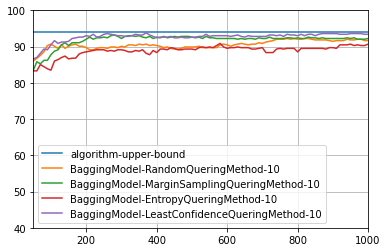

In [65]:
models = ['BaggingModel']
quering_methods = ['RandomQueringMethod','MarginSamplingQueringMethod','EntropyQueringMethod','LeastConfidenceQueringMethod']
Ks = ['10'] 
repeats = 1
upper_bound = 94.
total_experiments = len(models) * len(quering_methods) * len(Ks) * repeats


plot_results(upper_bound, d, ['BaggingModel'] , quering_methods , Ks, 1)

Prikaz obucavanja modela, pri selektovanju 25 novih elemenata za obuku

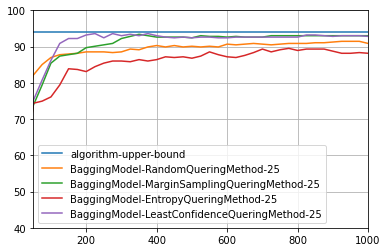

In [66]:
models = ['BaggingModel']
quering_methods = ['RandomQueringMethod','MarginSamplingQueringMethod','EntropyQueringMethod','LeastConfidenceQueringMethod']
Ks = ['25'] 
repeats = 1
upper_bound = 94.
total_experiments = len(models) * len(quering_methods) * len(Ks) * repeats


plot_results(upper_bound, d, ['BaggingModel'] , quering_methods , Ks, 1)

Prikaz obucavanja modela, pri selektovanju 50 novih elemenata za obuku

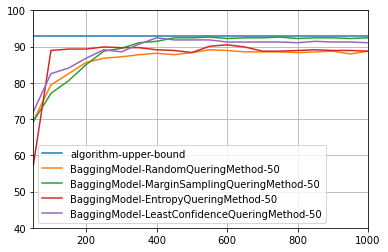

In [70]:
models = ['BaggingModel']
quering_methods = ['RandomQueringMethod','MarginSamplingQueringMethod','EntropyQueringMethod','LeastConfidenceQueringMethod']
Ks = ['50'] 
repeats = 1
upper_bound = 93.
total_experiments = len(models) * len(quering_methods) * len(Ks) * repeats


plot_results(upper_bound, d, ['BaggingModel'] , quering_methods , Ks, 1)